In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow import keras
from keras import layers

%run C:\Projects\Stock_price_prediction\Experiments_YHdata\data_processing_functions.ipynb
%run C:\Projects\Stock_price_prediction\Experiments_YHdata\feature_engineering.ipynb
%run C:\Projects\Stock_price_prediction\Experiments_YHdata\training_functions.ipynb
%run C:\Projects\Stock_price_prediction\Experiments_YHdata\simulation_functions.ipynb
%run C:\Projects\Stock_price_prediction\Experiments_YHdata\CNN_Class.ipynb

import random
import math
import gc

In [3]:
# Check if GPU is connected
print(tf.config.list_physical_devices('GPU'))
print(tf.config.list_physical_devices('CPU'))

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]
[PhysicalDevice(name='/physical_device:CPU:0', device_type='CPU')]


In [4]:
# For importing processed data
processed_data_path = 'C:/Projects/Stock_price_prediction/Experiments_YHdata/YH_processed_20180103-20241206.csv'

# Prepare data

In [5]:
basic_factors = ['cshtrd', 'prccd', 'prchd', 'prcld', 'prcod', 'dol_vol', 'Mom_2day', 'Mom_3day', 'Mom_5day',
                 'MA_10day', 'MA_50day', 'open/MA10', 'open/MA50', 'STD_10day', 'H-L', 'RSI', 'MACD', 'MACD_Signal_Line']

TA_factors = [# Momentum indicators
              'momentum_stoch_rsi', 'momentum_stoch', 'momentum_ao', 'momentum_pvo', 'momentum_kama', 'momentum_wr',
              # Volume indicators
              'volume_adi', 'volume_em', 'volume_fi', 'volume_cmf', 'volume_vpt',
              # Volatility indicators
              'volatility_atr', 'volatility_bbh', 'volatility_dcw', 'volatility_ui',
              # Trend indicators
              'trend_adx', 'trend_aroon_up', 'trend_aroon_down', 'trend_ichimoku_a',
              # Other indicators
              'others_dr'
]

# Remove factors that have low variance
basic_factors.remove('dol_vol')

# Remove factors that have high correlation with the prcod (and prcod since it shouldn't affect the return)
basic_factors.remove('prccd')
basic_factors.remove('prcld')
basic_factors.remove('prchd')
basic_factors.remove('prcod')
basic_factors.remove('MA_10day')
TA_factors.remove('trend_ichimoku_a')
TA_factors.remove('volatility_bbh')
TA_factors.remove('momentum_kama')

# Remove factors that have high correlation with momentum_stoch
TA_factors.remove('momentum_wr')

factors = basic_factors + TA_factors
print(f'There are {len(basic_factors)} basic factors')
print(f'There are {len(TA_factors)} TA factors')
print(f'There are {len(factors)} factors')

data = pd.read_csv(processed_data_path)
all_days = list(data['datadate'].unique())
num_of_tokens = data.sector.nunique()
num_to_tic_dict, tic_to_num_dict = num_tic_dicts(data)

data = remove_dead_stocks(data)

# 1. Use fixed_size objective labeling
# data = assign_class_labels(data, 'fixed_size')
# data = data[['datadate', 'tic'] + factors + ['ret_d', 'TBill1y', 'rel_ret_d', 'DistinctRank', 'rank', 'sector']]
# 2. Use fixed_threshold objective labeling
data = assign_class_labels(data, 'fixed_thres')
data = data[['datadate', 'tic'] + factors + ['ret_d', 'TBill1y', 'rel_ret_d', 'rank', 'sector']]

data

There are 12 basic factors
There are 16 TA factors
There are 28 factors
EXPRQ is dead after 2024-08-14
IDEX is dead after 2024-08-13
SAVE is dead after 2024-11-21
SRNE is dead after 2023-09-28
VTNR is dead after 2024-10-07
ZOM is dead after 2020-09-24


,datadate,tic,cshtrd,Mom_2day,Mom_3day,Mom_5day,MA_50day,open/MA10,open/MA50,STD_10day,...,volatility_ui,trend_adx,trend_aroon_up,trend_aroon_down,others_dr,ret_d,TBill1y,rel_ret_d,rank,sector
0,2018-01-03,A,1698900.0,0.000000,0.000000,0.000000,67.620003,1.000000,1.000000,0.000000,...,0.000000,0.000000,0.0,0.0,0.000000,-0.011648,0.000071,-0.012974,-1,0
1,2018-01-04,A,2230700.0,0.000000,0.000000,0.000000,68.580002,1.013998,1.013998,1.357644,...,0.000000,0.000000,4.0,0.0,2.839394,0.014550,0.000072,0.012388,1,0
2,2018-01-05,A,1632500.0,0.016415,0.000000,0.000000,68.630002,1.001457,1.001457,0.963898,...,0.000000,0.000000,8.0,0.0,-1.164794,0.013624,0.000071,0.010738,1,0
3,2018-01-08,A,1613400.0,0.002732,0.031204,0.000000,68.905003,1.011973,1.011973,0.960156,...,0.000000,0.000000,12.0,0.0,1.454969,0.010894,0.000070,0.013818,1,0
4,2018-01-09,A,2666100.0,0.028372,0.016393,0.000000,69.260002,1.020502,1.020502,1.149586,...,0.000000,0.000000,16.0,0.0,1.362393,-0.007418,0.000070,-0.010233,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3750931,2024-11-29,ZWS,429100.0,0.001502,-0.003984,0.023018,37.296400,1.014662,1.072490,0.558605,...,2.369220,42.423606,36.0,12.0,0.225508,0.005238,0.000167,0.004944,0,2
3750932,2024-12-02,ZWS,1118400.0,0.004510,0.003756,0.011863,37.401800,1.013705,1.071874,0.552304,...,2.304960,42.155556,32.0,8.0,0.225000,0.003722,0.000167,0.005939,0,2
3750933,2024-12-03,ZWS,663000.0,0.007500,0.009772,0.003486,37.514600,1.015037,1.074248,0.520022,...,2.295787,42.199615,100.0,4.0,0.523819,0.007911,0.000166,-0.004699,0,2
3750934,2024-12-04,ZWS,851300.0,0.008980,0.011250,0.012769,37.637200,1.014624,1.074735,0.462531,...,2.261093,42.325318,100.0,0.0,0.372212,0.000000,0.000164,0.000000,0,2


In [6]:
data['rank'].value_counts()

rank
 0    1794195
 1     709667
-1     660635
 2     294310
-2     292129
Name: count, dtype: int64

In [7]:
for val in [-2, -1, 0, 1, 2]:
    print(f"mean value for class {val} is {data[data['rank']==val]['ret_d'].mean()}")

mean value for class -2 is -0.05340498873780546
mean value for class -1 is -0.017811801892562706
mean value for class 0 is 0.0002021951934262466
mean value for class 1 is 0.017659782257363137
mean value for class 2 is 0.05579341463178052


In [8]:
data.columns

Index(['datadate', 'tic', 'cshtrd', 'Mom_2day', 'Mom_3day', 'Mom_5day',
       'MA_50day', 'open/MA10', 'open/MA50', 'STD_10day', 'H-L', 'RSI', 'MACD',
       'MACD_Signal_Line', 'momentum_stoch_rsi', 'momentum_stoch',
       'momentum_ao', 'momentum_pvo', 'volume_adi', 'volume_em', 'volume_fi',
       'volume_cmf', 'volume_vpt', 'volatility_atr', 'volatility_dcw',
       'volatility_ui', 'trend_adx', 'trend_aroon_up', 'trend_aroon_down',
       'others_dr', 'ret_d', 'TBill1y', 'rel_ret_d', 'rank', 'sector'],
      dtype='object')

# First Training

## Set parameters

In [9]:
# Whether to save the model after every training
save = True

# Set Seed
seed = 135

all_days = list(data['datadate'].unique())
num_of_ts = len(all_days)
batch_size = 4096 # Only for model.predict()
print(f'There are {num_of_ts} days in the dataset')

tickers = list(data.tic.unique())
nt = len(tickers)
print(f'There are {nt} tickers')
assert len(tickers) * num_of_ts == data.shape[0]

seq_length = 20 # Length of time-series
train_length = 200 # Length of training data
ftd = train_length # First train day
ltd = ftd+train_length-1 # Last train day
num_stocks = 10 # Choose the top {num_stocks} each day
num_of_models = 3

num_iters = math.floor((num_of_ts - 2*train_length) / seq_length)
print(f'There are {num_iters} iterations')

There are 1743 days in the dataset
There are 2152 tickers
There are 67 iterations


In [10]:
# %run C:\Projects\Stock_price_prediction\Experiments_YHdata\training_functions.ipynb
data_train, x_train, y_train, data_test, x_test, y_test, ret_d_train, ret_d_test, sector_train, sector_test = prep_train_test_data(data, seq_length, ftd, ltd, all_days)

Standardization data are from 2018-01-03 to 2018-10-17
Training data are from 2018-10-18 to 2019-08-06
Testing data are from 2019-07-11 to 2019-09-04
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)


In [11]:
# data_train

In [12]:
model_params = {
    # For training and validation
    'num_models': 3,
    'train_patience': 20,
    'plateau_patience': 5,
    'retrain_patience': 20,
    'validation_split': 0.2,
    'learning_rate': 0.01,
    'retrain_learning_rate': 0.01,
    'min_learning_rate': 0.001,
    'epochs': 500,
    'batch_size': 1024,
    'verbose': 0,
    # Model inputs
    'target': keras.layers.Input(shape=1),
    'ret_d': keras.layers.Input(shape=1),
    'sector_input': keras.layers.Input(shape=1),
    # Categorical input dimension
    'embedding_dim': len(factors),
    # Convolution parameters
    'num_of_tokens': num_of_tokens,
    'filter_dims': [64, 128],
    'kernel_sizes': [4, 5],
    'strides': [2, 2],
    'paddings': ["valid", "valid"],
    # Dense layer parameters
    'layer_dims': [32, 8],
    'output_dim': 5,
    'activation': "leaky_relu",
    # Regularization parameter
    'dropout_conv': 0.35,
    'dropout_dense': 0.35
}

In [13]:
# %run C:\Projects\Stock_price_prediction\Experiments_YHdata\CNN_Class.ipynb
CNN_model = CNN(x_train.shape[1:], seed, **model_params)

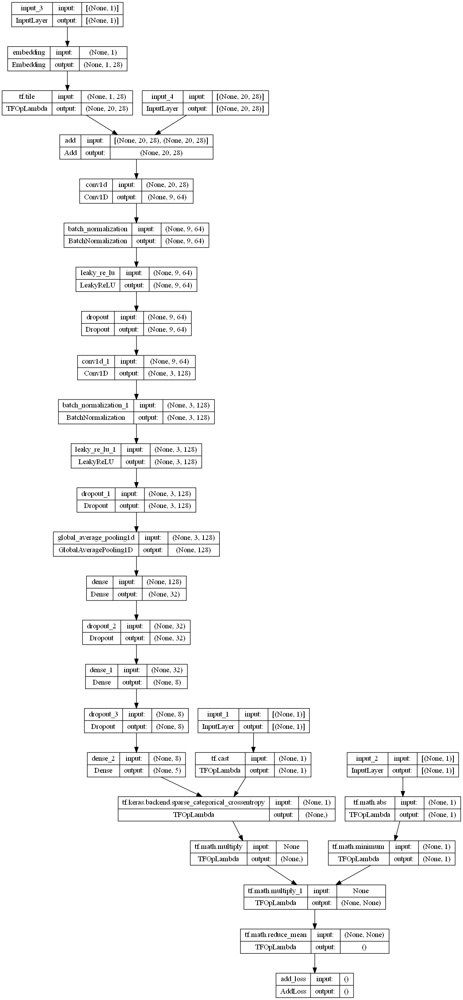

In [14]:
keras.utils.plot_model(CNN_model.model_dict[0], "pic.png", show_shapes=True)

In [15]:
# Save previous weights to compare with next trained weights
old_weights = {}
for i in range(num_of_models):
    old_weights[i] = CNN_model.model_dict[i].get_weights()

In [16]:
# %run C:\Projects\Stock_price_prediction\Experiments\CNN_Class.ipynb
gc.collect()
CNN_model.compile_model()
CNN_model.train_model(x_train, y_train, ret_d_train, sector_train) 
CNN_model.evaluate_model(x_train, y_train, ret_d_train, sector_train, x_test, y_test, ret_d_test, sector_test, batch_size)

if save:
    for i in range(model_params['num_models']):
        CNN_model.model_dict[i].save(f"models/model_{i}_{all_days[ftd]}_{all_days[ltd]}.keras")

gc.collect()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 1)]          0           []                               
                                                                                                  
 embedding (Embedding)          (None, 1, 28)        336         ['input_3[0][0]']                
                                                                                                  
 input_4 (InputLayer)           [(None, 20, 28)]     0           []                               
                                                                                                  
 tf.tile (TFOpLambda)           (None, 20, 28)       0           ['embedding[0][0]']              
                                                                                              

3208

In [17]:
# Save trained weights to compare with old weights
new_weights = {}
for i in range(num_of_models):
    y = CNN_model.model_dict[i].predict([y_test, x_test, ret_d_test, sector_test], batch_size=4096, verbose=0)
    print(np.mean(y, axis=0))
    print(np.std(y, axis=0))
    new_weights[i] = CNN_model.model_dict[i].get_weights()
    print(np.corrcoef(old_weights[i][0][0], new_weights[i][0][0])[0, 1])
    x = old_weights[i][-1]
    y = new_weights[i][-1]
    print(np.corrcoef(x.reshape(40, ), y.reshape(40, ))[0, 1])
    
# Now set the new weights to old weights
old_weights = new_weights.copy()

[0.06349944 0.17206435 0.5007525  0.20438226 0.05930093]
[0.06102892 0.05268813 0.17195486 0.04930775 0.04453699]
0.39173940935127805
0.5137097950854207
[0.06396195 0.17807738 0.48440123 0.20944378 0.06411427]
[0.0458537  0.04685244 0.16505331 0.04333128 0.04746389]
-0.04409577755537885
0.3017045005395664
[0.06684354 0.1785812  0.49237424 0.201371   0.0608297 ]
[0.05865492 0.05462725 0.17171536 0.04909588 0.04754778]
0.30687950417458293
0.5692015193117511


In [18]:
for i in range(num_of_models):
    y = CNN_model.model_dict[i].predict([y_test, x_test, ret_d_test, sector_test], batch_size=4096, verbose=0)
    print(np.mean(y, axis=0))
    print(np.std(y, axis=0))

[0.06349944 0.17206435 0.5007525  0.20438226 0.05930093]
[0.06102892 0.05268813 0.17195486 0.04930775 0.04453699]
[0.06396195 0.17807738 0.48440123 0.20944378 0.06411427]
[0.0458537  0.04685244 0.16505331 0.04333128 0.04746389]
[0.06684354 0.1785812  0.49237424 0.201371   0.0608297 ]
[0.05865492 0.05462725 0.17171536 0.04909588 0.04754778]


## Simulating

Testing data from 2019-07-11 to 2019-08-07 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2019-08-08 are ['FMS', 'SLM', 'SNA', 'GATX', 'CARS', 'CUBI', 'EXC', 'SFBS', 'SPR', 'PDI']
position on 2019-08-09 market open will be {'FMS': 0.09958457155347487, 'SFBS': 0.1009038111387438, 'SPR': 0.10138795147824275, 'PDI': 0.0998447228699507, 'GATX': 0.10111671938880458, 'CUBI': 0.10119730067957614, 'SLM': 0.10118623278974277, 'EXC': 0.10140061624451358, 'CARS': 0.09114427535888758, 'SNA': 0.1007502569843703}
Total asset on 2019-08-09 will be 0.9985164584863073
It should be the same as 0.9985164584863072
top_stocks by model 1 to buy on 2019-08-08 are ['EQT', 'CLB', 'ERIE', 'AR', 'MRIN', 'RRC', 'DVAX', 'IDCC', 'TOON', 'CARS']
position on 2019-08-09 market open will be {'EQT': 0.1000794930758544, 'IDCC': 0.10143458304803366, 'TOON': 0.15000000000000002, 'AR': 0.09568527731408526, 'ERIE': 0.10197563620350854, 'CARS': 0.09114427535888758, 'RRC': 0.09911307235786765, 'DVAX': 0.111

Testing data from 2019-07-16 to 2019-08-12 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2019-08-13 are ['SAP', 'SMCI', 'WIT', 'CALM', 'RELX', 'SPR', 'CXW', 'PDI', 'GEO', 'ROL']
position on 2019-08-14 market open will be {'PDI': 0.09669611265493906, 'CXW': 0.09572402682599403, 'ROL': 0.09547139627717509, 'SAP': 0.09491029260653365, 'SPR': 0.09504125087890486, 'GEO': 0.09546036284058766, 'CALM': 0.09591022308761402, 'SMCI': 0.09475891295556595, 'WIT': 0.09318940945929474, 'RELX': 0.09490438529961716}
Total asset on 2019-08-14 will be 0.9520663728862263
It should be the same as 0.9520663728862262
top_stocks by model 1 to buy on 2019-08-13 are ['RRC', 'GDOT', 'DXC', 'MRIN', 'AM', 'WKHS', 'ANGI', 'AR', 'TOON', 'PR']
position on 2019-08-14 market open will be {'TOON': 0.11166666348775231, 'AR': 0.0875634517152159, 'DXC': 0.09200774434417007, 'RRC': 0.09705521970663397, 'PR': 0.09649888679522318, 'WKHS': 0.10449626192909732, 'ANGI': 0.09586561488313364, 'GDOT': 0.1003472

top_stocks by model 0 to buy on 2019-08-16 are ['EPI', 'FBP', 'MDRX', 'LYG', 'ZION', 'FCG', 'MGY', 'SLM', 'OII', 'MEOH']
position on 2019-08-19 market open will be {'SLM': 0.09757495935191166, 'ZION': 0.09566031408715407, 'MEOH': 0.09598710481794742, 'OII': 0.09862749520819772, 'EPI': 0.09296637410963211, 'MDRX': 0.09587424713980783, 'LYG': 0.09391115034794491, 'FBP': 0.09627865596823824, 'MGY': 0.09695079971811241, 'FCG': 0.09736805413851277}
Total asset on 2019-08-19 will be 0.9611991548874594
It should be the same as 0.9611991548874591
top_stocks by model 1 to buy on 2019-08-16 are ['X', 'WKHS', 'MT', 'SENS', 'TSE', 'COMM', 'TEVA', 'INO', 'TMV', 'PR']
position on 2019-08-19 market open will be {'MT': 0.10889342488152236, 'TSE': 0.10129585003264929, 'TMV': 0.10031563644366359, 'COMM': 0.09859540650368023, 'INO': 0.10022838181683207, 'WKHS': 0.10144113477604554, 'TEVA': 0.09785623179213003, 'SENS': 0.09613630007062995, 'PR': 0.10340598266332486, 'X': 0.09890515875180401}
Total asset o

Testing data from 2019-07-24 to 2019-08-20 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2019-08-21 are ['SFBS', 'LAZ', 'EWBC', 'TRN', 'APH', 'TPR', 'WWW', 'EQT', 'SLM', 'TSE']
position on 2019-08-22 market open will be {'SLM': 0.09827681867382423, 'TRN': 0.09539754477145747, 'EQT': 0.0953926049079364, 'TPR': 0.0997578533435897, 'SFBS': 0.09766519670035834, 'WWW': 0.09947797819497829, 'APH': 0.09869976422358599, 'TSE': 0.09597193253479724, 'LAZ': 0.0971072315294867, 'EWBC': 0.09958396096167961}
Total asset on 2019-08-22 will be 0.9773308858416937
It should be the same as 0.9773308858416941
top_stocks by model 1 to buy on 2019-08-21 are ['DXC', 'ODP', 'GLNG', 'TSE', 'AR', 'GBX', 'RRC', 'XELA', 'GPRE', 'TPR']
position on 2019-08-22 market open will be {'TPR': 0.10841169839510185, 'DXC': 0.1068035492999966, 'AR': 0.09613302770113397, 'GBX': 0.10224907612515965, 'XELA': 0.10048734569201484, 'ODP': 0.10431966726412197, 'RRC': 0.09793665657565208, 'TSE': 0.10062900560376

top_stocks by model 0 to buy on 2019-08-26 are ['LYG', 'KLIC', 'UGI', 'TXT', 'RAMP', 'AEG', 'DBA', 'TBT', 'TMV', 'MOS']
position on 2019-08-27 market open will be {'TXT': 0.09594375174276687, 'DBA': 0.09653255195562895, 'MOS': 0.09533445013049346, 'LYG': 0.09714695907671352, 'KLIC': 0.09405600206537314, 'AEG': 0.09710134528356716, 'RAMP': 0.09724070925946136, 'TMV': 0.09489564962810827, 'UGI': 0.09610258313451471, 'TBT': 0.0954073856792998}
Total asset on 2019-08-27 will be 0.9597613879559266
It should be the same as 0.9597613879559272
top_stocks by model 1 to buy on 2019-08-26 are ['ICUI', 'TBT', 'INO', 'NKTR', 'MYGN', 'MRIN', 'WKHS', 'HIMX', 'AR', 'DXC']
position on 2019-08-27 market open will be {'AR': 0.08749498924470446, 'WKHS': 0.10670732418480376, 'MRIN': 0.1076293241884963, 'ICUI': 0.0979318395494398, 'MYGN': 0.09824307283067248, 'NKTR': 0.10098926175433295, 'DXC': 0.09709406211815773, 'INO': 0.09795105184090089, 'TBT': 0.0974450034411256, 'HIMX': 0.09541654281481055}
Total ass

Testing data from 2019-08-01 to 2019-08-28 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2019-08-29 are ['RUN', 'KAR', 'TRN', 'TDOC', 'MODG', 'ALRM', 'FTNT', 'TBT', 'TMV', 'TBF']
position on 2019-08-30 market open will be {'TBF': 0.0959761387955927, 'RUN': 0.09773140883833273, 'MODG': 0.09876442447101759, 'KAR': 0.09806964743505352, 'TDOC': 0.09806770639314065, 'ALRM': 0.09646187325406676, 'FTNT': 0.09539862337754117, 'TRN': 0.09939359962782959, 'TMV': 0.09719276217955625, 'TBT': 0.09675752205365637}
Total asset on 2019-08-30 will be 0.9738137064257865
It should be the same as 0.9738137064257874
top_stocks by model 1 to buy on 2019-08-29 are ['MVIS', 'WKHS', 'HIMX', 'TBT', 'TBF', 'EQT', 'MYGN', 'AR', 'AVNS', 'TMV']
position on 2019-08-30 market open will be {'AR': 0.09334655918252986, 'EQT': 0.10261248607988015, 'WKHS': 0.0936302916473077, 'AVNS': 0.10115264643069333, 'HIMX': 0.09912697951733478, 'MYGN': 0.10039547110445475, 'MVIS': 0.11517667041085149, 'TMV': 0.10

top_stocks by model 0 to buy on 2019-09-04 are ['EWBC', 'JNPR', 'IBM', 'ENOV', 'CI', 'AGNC', 'CACI', 'BVN', 'MAT', 'AEG']
position on 2019-09-05 market open will be {'ENOV': 0.0973460793774584, 'AGNC': 0.09785227346504956, 'MAT': 0.10047647167166394, 'JNPR': 0.0981534314075324, 'AEG': 0.09878394845024129, 'CI': 0.0952648074822555, 'BVN': 0.09415363615983602, 'EWBC': 0.09853004159281079, 'IBM': 0.09805444313819134, 'CACI': 0.09759342170945459}
Total asset on 2019-09-05 will be 0.9762085544544926
It should be the same as 0.976208554454494
top_stocks by model 1 to buy on 2019-09-04 are ['COMT', 'KBE', 'WAL', 'ICUI', 'WKHS', 'ENPH', 'CARS', 'MRIN', 'RRC', 'PCG']
position on 2019-09-05 market open will be {'RRC': 0.11091951163585835, 'MRIN': 0.10363531032983439, 'ENPH': 0.10358061386074259, 'ICUI': 0.10078589418465109, 'PCG': 0.10013999634742266, 'WAL': 0.10233336019978934, 'WKHS': 0.0982953101936345, 'COMT': 0.10231061444913919, 'CARS': 0.10204635765059872, 'KBE': 0.10162538185727894}
Tota

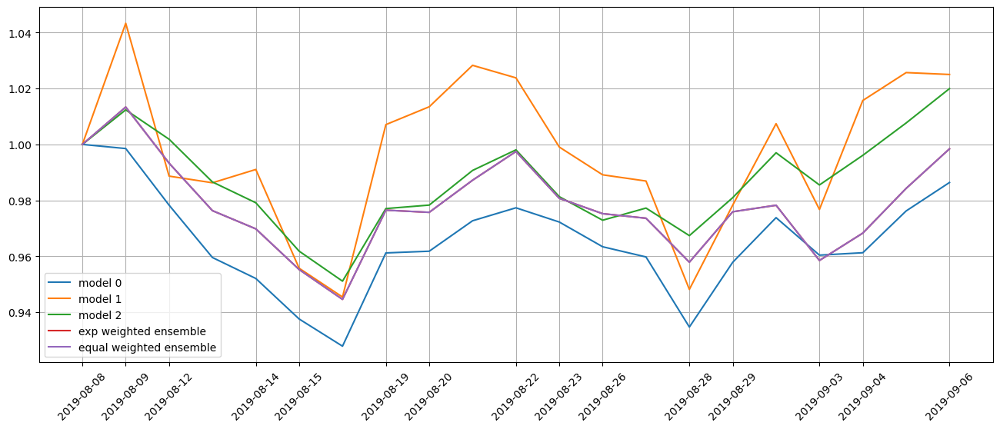

In [19]:
# %run C:\Projects\Stock_price_prediction\Experiments_YHdata\simulation_functions.ipynb
# ftd = 100
# ltd = 199
first_run = True
total_dict = {}
total_asset_dict = {}
position_dict_all = {}
num_iter = 0
for i in range(num_of_models):
    total_dict[i] = 1
    total_asset_dict[i] = [1]
    position_dict_all[i] = {}
total_dict['ensemble_weighted'] = 1
total_asset_dict['ensemble_weighted'] = [1]
position_dict_all['ensemble_weighted'] = {}
total_dict['ensemble_equal'] = 1
total_asset_dict['ensemble_equal'] = [1]
position_dict_all['ensemble_equal'] = {}

return_dict = {}
total_asset_dict, total_dict, position_dict_all, return_dict = simulate(ftd, ltd, total_dict, first_run, num_stocks, total_asset_dict, position_dict_all, return_dict)

In [20]:
pd.DataFrame(CNN_model.model_dict[0].predict([y_test, x_test, ret_d_test, sector_test], batch_size=4096, verbose=0)).to_csv('test0.csv')
pd.DataFrame(CNN_model.model_dict[1].predict([y_test, x_test, ret_d_test, sector_test], batch_size=4096, verbose=0)).to_csv('test1.csv')
pd.DataFrame(CNN_model.model_dict[2].predict([y_test, x_test, ret_d_test, sector_test], batch_size=4096, verbose=0)).to_csv('test2.csv')

# Retraining

Running 67 iterations; first iteration already completed.
Standardization data are from 2018-02-01 to 2018-11-14
Training data are from 2018-11-15 to 2019-09-04
Testing data are from 2019-08-08 to 2019-10-02
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 2 out of 67 iterations
Restoring model weights from the end of the best epoch: 8.
Epoch 28: early stopping
Restoring model weights from the end of the best epoch: 7.
Epoch 27: early stopping
Restoring model weights from the end of the best epoch: 8.
Epoch 28: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 0.024358412250876427
11/11 [==============================] - 0s 3ms/step
Model 0 test loss 0.026927122846245766
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 0.0247921422123909
11/11 [==============================] - 0s 3ms/step
Model 1 test loss 0.026829862967133522
96/96 [===============

top_stocks by model 2 to buy on 2019-09-10 are ['MAT', 'GOGL', 'MOH', 'AGNC', 'TPR', 'CI', 'HL', 'PCG', 'TDC', 'IAG']
position on 2019-09-11 market open will be {'MAT': 0.11241438856059484, 'TDC': 0.10992430560107709, 'PCG': 0.10343785375546012, 'HL': 0.11881882371671966, 'TPR': 0.11164419237447382, 'AGNC': 0.10934290254958623, 'MOH': 0.1082256015509289, 'CI': 0.10790165734732068, 'GOGL': 0.10542178398838978, 'IAG': 0.10846122154423006}
Total asset on 2019-09-11 will be 1.0955927309887803
It should be the same as 1.0955927309887812
top_stocks by return weighted ensemble to buy on 2019-09-10 are ['JBLU', 'CI', 'TPR', 'BBY', 'BBD', 'HL', 'GOGL', 'AGNC', 'TDC', 'IAG']
position on 2019-09-11 market open will be {'AGNC': 0.10373513898814857, 'TDC': 0.10663377804692213, 'JBLU': 0.10154571282427403, 'HL': 0.11326649872759853, 'TPR': 0.1064271331592696, 'CI': 0.10285948431684648, 'BBD': 0.10158953765629639, 'BBY': 0.10145672698163868, 'GOGL': 0.10049549379861322, 'IAG': 0.1033929004491956}
Tot

position on 2019-09-16 market open will be {'FOXF': 0.10785146784648213, 'R': 0.10953528862001584, 'SMTC': 0.10987246269052206, 'WAB': 0.11177782791974648, 'FTNT': 0.10888519350073804, 'PVH': 0.10860500028196762, 'ATGE': 0.10818292932043182, 'CRI': 0.10828803170647425, 'BJRI': 0.11151272004622206, 'COMM': 0.10673731090467987}
Total asset on 2019-09-16 will be 1.0912482328372792
It should be the same as 1.0912482328372803
top_stocks by return weighted ensemble to buy on 2019-09-13 are ['WAB', 'FTNT', 'GOGL', 'COMM', 'CNH', 'MMM', 'PANW', 'CRI', 'SABR', 'ATGE']
position on 2019-09-16 market open will be {'FTNT': 0.10156128488317412, 'GOGL': 0.10800580013707407, 'SABR': 0.10454194615022812, 'WAB': 0.10603898140379915, 'CNH': 0.10339550534713408, 'ATGE': 0.1026286504569949, 'PANW': 0.10444682165641936, 'MMM': 0.10537067308966055, 'CRI': 0.10272835672402891, 'COMM': 0.10125725232591859}
Total asset on 2019-09-16 will be 1.0399752721744309
It should be the same as 1.0399752721744318
top_stoc

position on 2019-09-19 market open will be {'PCG': 0.1116783673432478, 'MO': 0.10169081592660299, 'GLOB': 0.10675113336719855, 'FOXF': 0.10023623481058859, 'HUM': 0.10435101946746637, 'FTNT': 0.10371706403242698, 'RL': 0.10420596687637904, 'SPSC': 0.10462116168036936, 'KOLD': 0.10852240262969969, 'MGPI': 0.10523018290877789}
Total asset on 2019-09-19 will be 1.0510043490427563
It should be the same as 1.0510043490427572
top_stocks by equal weighted ensemble to buy on 2019-09-18 are ['PCG', 'MGPI', 'HUM', 'SPSC', 'FTNT', 'GLOB', 'FOXF', 'RL', 'MO', 'KOLD']
position on 2019-09-19 market open will be {'PCG': 0.1116783673432478, 'MO': 0.10169081592660299, 'GLOB': 0.10675113336719855, 'FOXF': 0.10023623481058859, 'HUM': 0.10435101946746637, 'FTNT': 0.10371706403242698, 'RL': 0.10420596687637904, 'SPSC': 0.10462116168036936, 'KOLD': 0.10852240262969969, 'MGPI': 0.10523018290877789}
Total asset on 2019-09-19 will be 1.0510043490427563
It should be the same as 1.0510043490427572
Testing data f

position on 2019-09-24 market open will be {'INSG': 0.10556207217523458, 'NXE': 0.1005012959613085, 'HUM': 0.10597888953944119, 'KWR': 0.10602169875279153, 'NSP': 0.10551243038200042, 'DBI': 0.10979035703659303, 'SHV': 0.10515884030780666, 'PLNT': 0.10808457127825641, 'DNN': 0.10952065065191925, 'HIMX': 0.11247515139273488}
Total asset on 2019-09-24 will be 1.0686059574780855
It should be the same as 1.0686059574780864
Testing data from 2019-08-26 to 2019-09-23 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2019-09-24 are ['XRT', 'URTY', 'DBA', 'FOXF', 'CHKP', 'SCO', 'RL', 'KOLD', 'HUM', 'MO']
position on 2019-09-25 market open will be {'FOXF': 0.10230990210626373, 'HUM': 0.10492502444692006, 'URTY': 0.10070489705381126, 'DBA': 0.10669773904226183, 'RL': 0.10405036314862072, 'MO': 0.10781764129324153, 'CHKP': 0.10427650400194473, 'SCO': 0.11486191565323134, 'XRT': 0.10514021386264813, 'KOLD': 0.11414544942091344}
Total asset on 2019-09-25 will be 1.0649296500298553


Testing data from 2019-08-29 to 2019-09-26 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2019-09-27 are ['CDNA', 'PI', 'TWLO', 'AMED', 'WIX', 'WEX', 'DNN', 'TTD', 'BL', 'DELL']
position on 2019-09-30 market open will be {'DELL': 0.10372625876079727, 'WIX': 0.10619636120412639, 'TWLO': 0.10440265784496583, 'AMED': 0.10735622242103364, 'WEX': 0.10710329961324845, 'PI': 0.103013342099103, 'TTD': 0.10287471564393794, 'CDNA': 0.10693970588554191, 'BL': 0.10705225304203242, 'DNN': 0.10590762461754255}
Total asset on 2019-09-30 will be 1.0545724411323283
It should be the same as 1.0545724411323294
top_stocks by model 1 to buy on 2019-09-27 are ['MDLZ', 'BNDX', 'ICE', 'CINF', 'DG', 'CCI', 'WPC', 'VRRM', 'DHR', 'ERIE']
position on 2019-09-30 market open will be {'VRRM': 0.10407772062850768, 'CINF': 0.10441923738161789, 'CCI': 0.09996166849281635, 'WPC': 0.10219342425908629, 'ICE': 0.10241395394646977, 'DG': 0.10169958092666453, 'BNDX': 0.10208297913330545, 'ERIE': 0.0998274

top_stocks by model 0 to buy on 2019-10-02 are ['KWR', 'FN', 'DCI', 'HUM', 'NFG', 'CI', 'OI', 'AEO', 'MOS', 'DELL']
position on 2019-10-03 market open will be {'DELL': 0.10305677371871737, 'MOS': 0.1045609982985959, 'OI': 0.10118180425165393, 'HUM': 0.10512765036915, 'KWR': 0.1041213568294355, 'NFG': 0.10324114071049698, 'CI': 0.10432327427947326, 'DCI': 0.10341214259902012, 'AEO': 0.10257176258727888, 'FN': 0.10382135461986694}
Total asset on 2019-10-03 will be 1.035418258263688
It should be the same as 1.0354182582636888
top_stocks by model 1 to buy on 2019-10-02 are ['HSY', 'UNIT', 'LPG', 'RNR', 'ICE', 'CCI', 'AWK', 'APD', 'SPTI', 'VRRM']
position on 2019-10-03 market open will be {'VRRM': 0.09927192602742974, 'CCI': 0.09884240695899875, 'ICE': 0.10028284564558373, 'RNR': 0.0989477171982031, 'HSY': 0.10166849106251893, 'SPTI': 0.10325640209187271, 'UNIT': 0.09441342470325238, 'LPG': 0.10067301917027871, 'AWK': 0.102162525379353, 'APD': 0.10080201631257936}
Total asset on 2019-10-03 

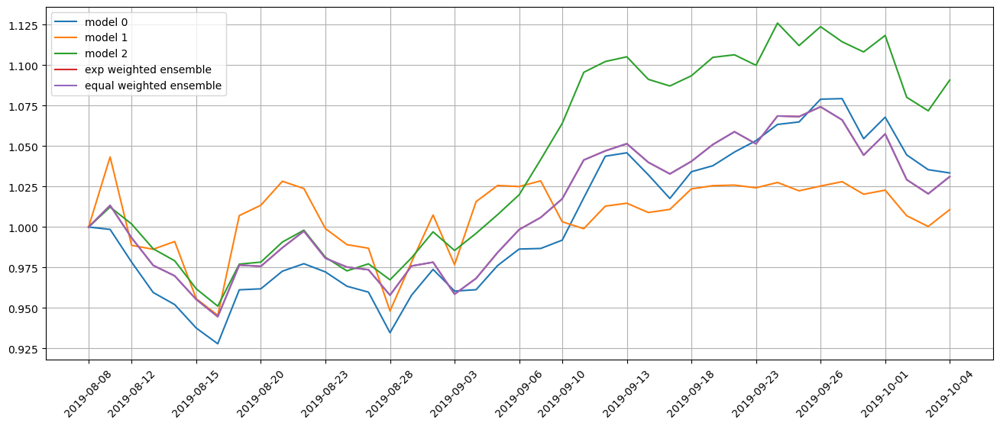

Standardization data are from 2018-03-02 to 2018-12-14
Training data are from 2018-12-17 to 2019-10-02
Testing data are from 2019-09-06 to 2019-10-30
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 3 out of 67 iterations
Restoring model weights from the end of the best epoch: 5.
Epoch 25: early stopping
Restoring model weights from the end of the best epoch: 25.
Epoch 45: early stopping
Restoring model weights from the end of the best epoch: 5.
Epoch 25: early stopping
96/96 [==============================] - 0s 4ms/step
Model 0 training loss 0.023737527430057526
11/11 [==============================] - 0s 3ms/step
Model 0 test loss 0.02174440585076809
96/96 [==============================] - 0s 4ms/step
Model 1 training loss 0.024001479148864746
11/11 [==============================] - 0s 3ms/step
Model 1 test loss 0.022052006796002388
96/96 [==============================] - 0s 3ms/step
Model 2 training loss 0.0

top_stocks by model 2 to buy on 2019-10-08 are ['SAIC', 'ARMK', 'VRNT', 'FLRN', 'KSA', 'VNLA', 'VNQI', 'PPLT', 'ALTR', 'GSG']
position on 2019-10-09 market open will be {'PPLT': 0.1091671728813257, 'ALTR': 0.1088822264566543, 'VNLA': 0.10781591879754446, 'SAIC': 0.1076778758139979, 'GSG': 0.1100614122849177, 'FLRN': 0.10775923912866543, 'VNQI': 0.10847485832176806, 'KSA': 0.1063624854536063, 'ARMK': 0.10591882024173808, 'VRNT': 0.107005746568994}
Total asset on 2019-10-09 will be 1.07912575594921
It should be the same as 1.079125755949212
top_stocks by return weighted ensemble to buy on 2019-10-08 are ['IT', 'UGI', 'SPIP', 'FLRN', 'PPLT', 'ALTR', 'KSA', 'VRNT', 'ULTA', 'GSG']
position on 2019-10-09 market open will be {'VRNT': 0.10212732843034367, 'PPLT': 0.10355133618043956, 'SPIP': 0.10145149915331171, 'ALTR': 0.10294180301220937, 'GSG': 0.10405665452836757, 'IT': 0.10201409600132083, 'FLRN': 0.10188008390464633, 'KSA': 0.10055953466209609, 'ULTA': 0.10109819020164292, 'UGI': 0.10074

position on 2019-10-14 market open will be {'DOG': 0.10675117489263379, 'ULTA': 0.11283371188271928, 'SPIP': 0.10957861125734278, 'MNRO': 0.1099577409015845, 'SPAB': 0.10962188755839235, 'IGLB': 0.1103012130392795, 'TIP': 0.10998942721824892, 'SCHP': 0.10988862794827746, 'TLT': 0.11012251272315261, 'KOLD': 0.102174914412981}
Total asset on 2019-10-14 will be 1.09121982183461
It should be the same as 1.0912198218346123
top_stocks by return weighted ensemble to buy on 2019-10-11 are ['SPLB', 'TLT', 'TIP', 'SCHP', 'VRNT', 'SPAB', 'REM', 'SPIP', 'KOLD', 'ULTA']
position on 2019-10-14 market open will be {'VRNT': 0.10306816029924229, 'ULTA': 0.10655958634776258, 'SPIP': 0.10268881002165105, 'SPAB': 0.10272936530708428, 'TIP': 0.10307379575636053, 'SCHP': 0.10297933428285169, 'TLT': 0.10319851345421122, 'REM': 0.10293132408362048, 'SPLB': 0.10324915601734513, 'KOLD': 0.09575062372794933}
Total asset on 2019-10-14 will be 1.0262286692980758
It should be the same as 1.0262286692980787
top_stoc

position on 2019-10-17 market open will be {'VRNT': 0.10273886826447942, 'SCHP': 0.10267008342764015, 'TOTL': 0.10172725233823517, 'TLT': 0.10178473973043492, 'SRLN': 0.1017833069179998, 'VGSH': 0.10185556636867103, 'BAND': 0.0979606010260208, 'SPTS': 0.10190623858380579, 'CNP': 0.10349963585615113, 'SPLB': 0.10180360858215523}
Total asset on 2019-10-17 will be 1.0177299010955911
It should be the same as 1.0177299010955934
top_stocks by equal weighted ensemble to buy on 2019-10-16 are ['TOTL', 'BAND', 'VGSH', 'SPLB', 'CNP', 'SPTS', 'SRLN', 'TLT', 'SCHP', 'VRNT']
position on 2019-10-17 market open will be {'VRNT': 0.10273886826447942, 'SCHP': 0.10267008342764015, 'TOTL': 0.10172725233823517, 'TLT': 0.10178473973043492, 'SRLN': 0.1017833069179998, 'VGSH': 0.10185556636867103, 'BAND': 0.0979606010260208, 'SPTS': 0.10190623858380579, 'CNP': 0.10349963585615113, 'SPLB': 0.10180360858215523}
Total asset on 2019-10-17 will be 1.0177299010955911
It should be the same as 1.0177299010955934
Test

position on 2019-10-22 market open will be {'VRNT': 0.10045735494531784, 'USO': 0.10354631578207578, 'DEO': 0.10108450175825286, 'HEI': 0.10078205839685087, 'SAIC': 0.10096822378399083, 'WIX': 0.10176243337287431, 'UNH': 0.10059615057218577, 'CLX': 0.1009090832765285, 'VVV': 0.10075207733947775, 'XRT': 0.10189409240620247}
Total asset on 2019-10-22 will be 1.0127522916337548
It should be the same as 1.0127522916337568
Testing data from 2019-09-24 to 2019-10-21 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2019-10-22 are ['TLT', 'ERY', 'STRA', 'VCLT', 'CP', 'VRNT', 'LOPE', 'BAND', 'BKLN', 'VTIP']
position on 2019-10-23 market open will be {'VRNT': 0.10324432766873692, 'VCLT': 0.10213263541516092, 'LOPE': 0.09949022156528038, 'VTIP': 0.10203298849292347, 'STRA': 0.10095294278197962, 'TLT': 0.10242540563127238, 'CP': 0.10232776229402861, 'BAND': 0.09419530361945407, 'ERY': 0.09892396173546168, 'BKLN': 0.10199529772739883}
Total asset on 2019-10-23 will be 1.0077208469

Testing data from 2019-09-27 to 2019-10-24 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2019-10-25 are ['IWO', 'PJT', 'VRNT', 'XLV', 'FHLC', 'FBT', 'VHT', 'IYH', 'IHF', 'UNH']
position on 2019-10-28 market open will be {'VRNT': 0.10597515217946568, 'FBT': 0.10307304634539224, 'IWO': 0.10337302359374502, 'VHT': 0.10282341557875357, 'IHF': 0.10288106088456526, 'UNH': 0.10265826805025378, 'FHLC': 0.10287924756850757, 'IYH': 0.1028374748151899, 'PJT': 0.10292682932683347, 'XLV': 0.1027388014788681}
Total asset on 2019-10-28 will be 1.0321663198215738
It should be the same as 1.0321663198215747
top_stocks by model 1 to buy on 2019-10-25 are ['IRT', 'BKH', 'FE', 'PNW', 'NEE', 'AEP', 'SHV', 'PLD', 'SBAC', 'FCEL']
position on 2019-10-28 market open will be {'SBAC': 0.10520861342994033, 'NEE': 0.10151283514387549, 'FCEL': 0.09199599752130805, 'AEP': 0.10070275116377836, 'PNW': 0.10030253438623175, 'SHV': 0.1017132859978421, 'PLD': 0.09725807035466995, 'IRT': 0.101568664535

top_stocks by model 0 to buy on 2019-10-30 are ['IHF', 'FTV', 'JEF', 'CP', 'SNV', 'KRE', 'FBT', 'IBB', 'WBS', 'HUM']
position on 2019-10-31 market open will be {'FTV': 0.1050356786236311, 'IHF': 0.10467961229512528, 'WBS': 0.101640129675589, 'JEF': 0.1034548409944035, 'HUM': 0.10256913436349527, 'IBB': 0.103342376510821, 'SNV': 0.10175993581204165, 'KRE': 0.10225767068938552, 'CP': 0.1042461059614752, 'FBT': 0.10316483474001027}
Total asset on 2019-10-31 will be 1.0321503196659767
It should be the same as 1.0321503196659778
top_stocks by model 1 to buy on 2019-10-30 are ['REXR', 'SCHR', 'MAA', 'WEN', 'PFGC', 'LNT', 'CWT', 'AWR', 'PNW', 'FCEL']
position on 2019-10-31 market open will be {'CWT': 0.0999538688425063, 'FCEL': 0.08428004167132465, 'PFGC': 0.09913493789855256, 'MAA': 0.0996221129421211, 'SCHR': 0.09977970738897046, 'AWR': 0.09998809296745267, 'REXR': 0.09884892124625538, 'PNW': 0.10050465757969253, 'WEN': 0.1000910927867051, 'LNT': 0.10050506077161085}
Total asset on 2019-10-

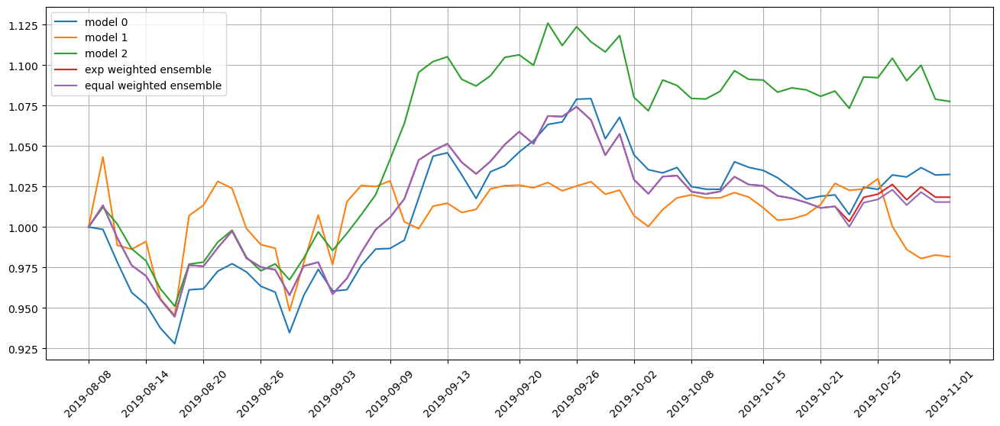

Standardization data are from 2018-04-02 to 2019-01-15
Training data are from 2019-01-16 to 2019-10-30
Testing data are from 2019-10-04 to 2019-11-27
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 4 out of 67 iterations
Restoring model weights from the end of the best epoch: 5.
Epoch 25: early stopping
Restoring model weights from the end of the best epoch: 18.
Epoch 38: early stopping
Restoring model weights from the end of the best epoch: 18.
Epoch 38: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 0.02363019436597824
11/11 [==============================] - 0s 3ms/step
Model 0 test loss 0.021112291142344475
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 0.02409462071955204
11/11 [==============================] - 0s 3ms/step
Model 1 test loss 0.021025866270065308
96/96 [==============================] - 0s 3ms/step
Model 2 training loss 0.0

position on 2019-11-06 market open will be {'CXW': 0.10456455532676388, 'ATGE': 0.10544084175063433, 'RAMP': 0.10557356218028713, 'NYCB': 0.10531992230772981, 'TEL': 0.10443055849659537, 'MU': 0.10118709259148663, 'EQC': 0.1045391967678155, 'JEF': 0.10438317653103571, 'WDC': 0.1022294217506025, 'AMBA': 0.10882525393222219}
Total asset on 2019-11-06 will be 1.0464935816351704
It should be the same as 1.0464935816351728
top_stocks by equal weighted ensemble to buy on 2019-11-05 are ['ATGE', 'MU', 'NYCB', 'EQC', 'WDC', 'CXW', 'JEF', 'TEL', 'RAMP', 'AMBA']
position on 2019-11-06 market open will be {'CXW': 0.10425484842650179, 'ATGE': 0.10512853940154894, 'RAMP': 0.10526086673018639, 'NYCB': 0.10500797810663948, 'TEL': 0.10412124847788445, 'MU': 0.10088738930584541, 'EQC': 0.10422956497637649, 'JEF': 0.10407400685167434, 'WDC': 0.10192663121869591, 'AMBA': 0.10850292738514072}
Total asset on 2019-11-06 will be 1.043394000880491
It should be the same as 1.0433940008804938
Testing data from 

position on 2019-11-11 market open will be {'SPIP': 0.1059092197360327, 'CBOE': 0.10491004609663625, 'JNUG': 0.10574156730586046, 'TRI': 0.10743401613197598, 'TIP': 0.1059878203708279, 'YEXT': 0.1069197735460558, 'NEM': 0.10650982526392189, 'UPBD': 0.1062441313749997, 'AEM': 0.10614469035481354, 'MKTX': 0.10520928811292707}
Total asset on 2019-11-11 will be 1.0610103782940483
It should be the same as 1.0610103782940512
Testing data from 2019-10-14 to 2019-11-08 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2019-11-11 are ['GLD', 'OUNZ', 'PHYS', 'IAU', 'GDX', 'AGI', 'JNUG', 'TIP', 'NUGT', 'SPIP']
position on 2019-11-12 market open will be {'NUGT': 0.09598760189811381, 'JNUG': 0.09188442476295927, 'SPIP': 0.10308560042166967, 'AGI': 0.10368906933075188, 'TIP': 0.10309077991689568, 'GDX': 0.10309969817792933, 'IAU': 0.10246157218936669, 'GLD': 0.10286931329426684, 'PHYS': 0.10286475374873376, 'OUNZ': 0.1027259870385068}
Total asset on 2019-11-12 will be 1.011758800779

position on 2019-11-14 market open will be {'AMLP': 0.10252068759445518, 'CXW': 0.10407273860358376, 'GEO': 0.10407515751688524, 'GTLS': 0.10383022256250217, 'PCG': 0.10237864952380868, 'TXT': 0.10618271180363935, 'FXN': 0.10537991910211388, 'DBO': 0.10807056006821128, 'PK': 0.1068731194648578, 'IAG': 0.10705934002105291}
Total asset on 2019-11-14 will be 1.0504431062611066
It should be the same as 1.0504431062611101
Testing data from 2019-10-17 to 2019-11-13 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2019-11-14 are ['JNUG', 'MDB', 'PK', 'NUGT', 'EXPO', 'AZPN', 'TXT', 'APPF', 'SPIP', 'IBM']
position on 2019-11-15 market open will be {'TXT': 0.1031752200733914, 'IBM': 0.10103215801907013, 'AZPN': 0.10064233601372558, 'SPIP': 0.10033880357908963, 'APPF': 0.09934362961747817, 'NUGT': 0.09871304079871167, 'JNUG': 0.10056584313758028, 'EXPO': 0.10175104870692214, 'MDB': 0.10173062726786358, 'PK': 0.10007791277929745}
Total asset on 2019-11-15 will be 1.00737061999312

Testing data from 2019-10-22 to 2019-11-18 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2019-11-19 are ['FXN', 'WRB', 'ENPH', 'VCYT', 'EXPO', 'RUN', 'MANH', 'HAS', 'TEAM', 'FCFS']
position on 2019-11-20 market open will be {'EXPO': 0.100995077631685, 'ENPH': 0.09634523224622955, 'HAS': 0.10011008817136711, 'VCYT': 0.10207471045181388, 'RUN': 0.09787496491278307, 'FXN': 0.09920487938144, 'MANH': 0.10266303680458626, 'WRB': 0.1018771077589141, 'TEAM': 0.10223357989734345, 'FCFS': 0.1012245705865188}
Total asset on 2019-11-20 will be 1.0046032478426792
It should be the same as 1.0046032478426814
top_stocks by model 1 to buy on 2019-11-19 are ['LNT', 'VST', 'NEP', 'CUZ', 'LXP', 'GLPI', 'DEI', 'PLD', 'ED', 'FCEL']
position on 2019-11-20 market open will be {'FCEL': 0.2352817936972711, 'DEI': 0.0985102690235456, 'LNT': 0.09656184570294236, 'NEP': 0.09704253898320712, 'VST': 0.09605234680805376, 'LXP': 0.09754197245360492, 'ED': 0.09735297486620241, 'PLD': 0.098132313563

top_stocks by model 1 to buy on 2019-11-22 are ['DEI', 'NDSN', 'MAA', 'AMP', 'IVR', 'GLPI', 'PEG', 'ED', 'PLD', 'FCEL']
position on 2019-11-25 market open will be {'FCEL': 0.2774218201145802, 'PEG': 0.09636686669735296, 'NDSN': 0.0972290917017434, 'IVR': 0.09701525279290998, 'DEI': 0.09812657241293661, 'AMP': 0.09768147910247721, 'MAA': 0.09625903188945568, 'ED': 0.09625741997151381, 'PLD': 0.09690531282260453, 'GLPI': 0.09668835836274549}
Total asset on 2019-11-25 will be 1.149951205868316
It should be the same as 1.1499512058683201
top_stocks by model 2 to buy on 2019-11-22 are ['MOS', 'BGC', 'TXT', 'MVIS', 'BFH', 'SLM', 'CIVI', 'PRLB', 'TXN', 'PCG']
position on 2019-11-25 market open will be {'BFH': 0.11855761055064867, 'PRLB': 0.11627411509869803, 'TXN': 0.11550936953491583, 'PCG': 0.11862662727754053, 'TXT': 0.11451909922898688, 'BGC': 0.1162900913009139, 'MOS': 0.11535627355497537, 'CIVI': 0.11288736392911997, 'SLM': 0.11740844956196674, 'MVIS': 0.10914571152877689}
Total asset o

position on 2019-11-29 market open will be {'FCEL': 0.24581679471995171, 'BXP': 0.09718255818126047, 'ED': 0.09841711848819304, 'PDM': 0.09927650428716019, 'AGO': 0.09788417997897651, 'JPM': 0.09759298844426063, 'SSNC': 0.09714512037128592, 'NRG': 0.09762852291324399, 'NEP': 0.09735276438354029, 'SHOO': 0.09619370974673865}
Total asset on 2019-11-29 will be 1.1244902615146077
It should be the same as 1.1244902615146113
top_stocks by model 2 to buy on 2019-11-27 are ['PRLB', 'SAN', 'JACK', 'OI', 'SLM', 'ARMK', 'BDC', 'AMCX', 'MXL', 'XELA']
position on 2019-11-29 market open will be {'AMCX': 0.11739802952044673, 'MXL': 0.11492103821107555, 'SAN': 0.11389267080644101, 'OI': 0.11961827672532369, 'XELA': 0.11232922662861222, 'JACK': 0.11807702678406395, 'SLM': 0.11581584876911806, 'ARMK': 0.11624243302986888, 'PRLB': 0.11426719219774321, 'BDC': 0.11686676874125418}
Total asset on 2019-11-29 will be 1.1594285114139427
It should be the same as 1.1594285114139475
top_stocks by return weighted 

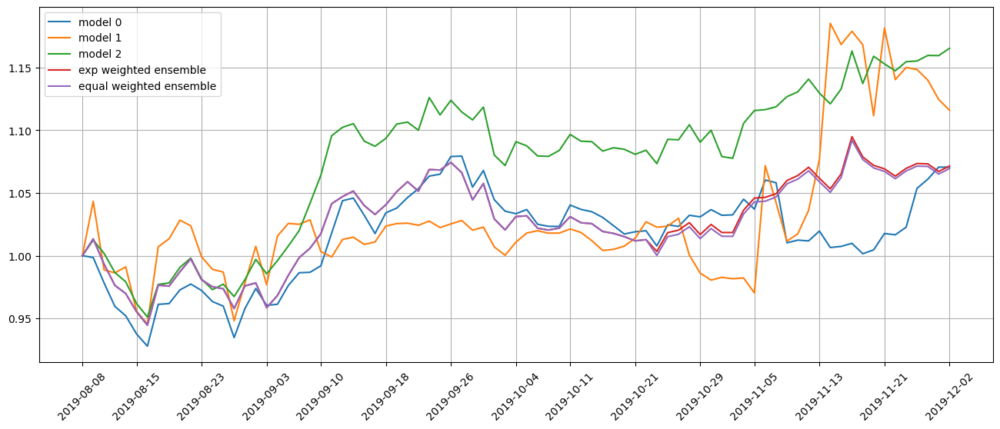

Standardization data are from 2018-04-30 to 2019-02-13
Training data are from 2019-02-14 to 2019-11-27
Testing data are from 2019-11-01 to 2019-12-27
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 5 out of 67 iterations
Restoring model weights from the end of the best epoch: 3.
Epoch 23: early stopping
Restoring model weights from the end of the best epoch: 3.
Epoch 23: early stopping
Restoring model weights from the end of the best epoch: 19.
Epoch 39: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 0.024195915088057518
11/11 [==============================] - 0s 3ms/step
Model 0 test loss 0.01942639984190464
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 0.02431669272482395
11/11 [==============================] - 0s 3ms/step
Model 1 test loss 0.01952102780342102
96/96 [==============================] - 0s 4ms/step
Model 2 training loss 0.023

position on 2019-12-05 market open will be {'NYCB': 0.10634511083458908, 'CYH': 0.1088060373468779, 'GBX': 0.1048165617625888, 'IDCC': 0.10584765546709562, 'EPR': 0.10770872758206045, 'MXL': 0.10694301299891219, 'WES': 0.10807671604025304, 'ANET': 0.10621205114355532, 'MPC': 0.10496419152702528, 'PBI': 0.10594595299493531}
Total asset on 2019-12-05 will be 1.0656660176978887
It should be the same as 1.065666017697893
top_stocks by equal weighted ensemble to buy on 2019-12-04 are ['EPR', 'WES', 'MPC', 'GBX', 'IDCC', 'NYCB', 'MXL', 'PBI', 'CYH', 'ANET']
position on 2019-12-05 market open will be {'NYCB': 0.10614153948100093, 'CYH': 0.10859775515950283, 'GBX': 0.10434355715033303, 'IDCC': 0.10536999784896274, 'EPR': 0.10722267152307703, 'MXL': 0.10646041237219454, 'WES': 0.1075889993635671, 'ANET': 0.1057327491208288, 'MPC': 0.10449052070746113, 'PBI': 0.10546785179056702}
Total asset on 2019-12-05 will be 1.0614160545174904
It should be the same as 1.061416054517495
Testing data from 201

position on 2019-12-10 market open will be {'MWA': 0.1097218075711411, 'PUK': 0.10713692744913439, 'ETSY': 0.10655905237468219, 'W': 0.11811094927981097, 'ROG': 0.10579925580393006, 'NYCB': 0.10818268257547628, 'CHRW': 0.10772812887482648, 'O': 0.10716233097830642, 'SEE': 0.10845245121684459, 'UHAL': 0.10730501044733175}
Total asset on 2019-12-10 will be 1.0861585965714788
It should be the same as 1.0861585965714842
Testing data from 2019-11-11 to 2019-12-09 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2019-12-10 are ['BKNG', 'NYCB', 'GPC', 'FFIV', 'XYL', 'AAP', 'GLW', 'ALRM', 'ROL', 'UHAL']
position on 2019-12-11 market open will be {'AAP': 0.10942540954029778, 'ALRM': 0.10437052593579013, 'BKNG': 0.10670192026021666, 'UHAL': 0.1073174426009756, 'ROL': 0.1055597162496261, 'NYCB': 0.10696084575415205, 'XYL': 0.10714861529183675, 'GLW': 0.10675361753129742, 'FFIV': 0.10846930698742588, 'GPC': 0.1080053909943461}
Total asset on 2019-12-11 will be 1.0707127911459622


Testing data from 2019-11-14 to 2019-12-12 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2019-12-13 are ['SPIP', 'CASY', 'WIX', 'PI', 'IEP', 'GDDY', 'GFF', 'LEG', 'BBD', 'ROL']
position on 2019-12-16 market open will be {'BBD': 0.11087681949355906, 'SPIP': 0.10977946260546616, 'LEG': 0.1081213732719151, 'ROL': 0.10955962961197473, 'WIX': 0.10933064936226213, 'IEP': 0.1090886782686158, 'PI': 0.10862456657714126, 'CASY': 0.10986852530894951, 'GFF': 0.1093012098073483, 'GDDY': 0.10978828824788685}
Total asset on 2019-12-16 will be 1.0943392025551162
It should be the same as 1.0943392025551189
top_stocks by model 1 to buy on 2019-12-13 are ['TSEM', 'NVRO', 'LABU', 'BCC', 'LITE', 'GUNR', 'TIP', 'KOLD', 'SCHP', 'SPIP']
position on 2019-12-16 market open will be {'LITE': 0.11932915737544443, 'SPIP': 0.11217374573735006, 'TSEM': 0.11266979896109455, 'TIP': 0.11220903377161807, 'SCHP': 0.11221413108207534, 'NVRO': 0.11453328873416325, 'LABU': 0.11513197460274328, 'BCC': 0.1

top_stocks by model 0 to buy on 2019-12-18 are ['ALRM', 'VVV', 'GLW', 'ORLY', 'WERN', 'MSTR', 'SSD', 'FL', 'LEG', 'IT']
position on 2019-12-19 market open will be {'ALRM': 0.10718854792661452, 'LEG': 0.11189294404377252, 'GLW': 0.10918130510057898, 'IT': 0.11085314870097951, 'VVV': 0.11238595777365991, 'WERN': 0.11133712298000642, 'MSTR': 0.11099573914383942, 'FL': 0.11789521936043719, 'SSD': 0.11249690051753847, 'ORLY': 0.1102009950425528}
Total asset on 2019-12-19 will be 1.114427880589977
It should be the same as 1.1144278805899799
top_stocks by model 1 to buy on 2019-12-18 are ['SNX', 'NVRO', 'SILJ', 'INTC', 'LITE', 'LABU', 'KOLD', 'SOXL', 'SPIP', 'STIP']
position on 2019-12-19 market open will be {'LITE': 0.12130167048443195, 'SPIP': 0.11209519838611337, 'KOLD': 0.11597017026855105, 'SOXL': 0.11474812789568362, 'INTC': 0.10976264838214574, 'NVRO': 0.10974559771481114, 'SNX': 0.1099669316031014, 'SILJ': 0.11133860435294352, 'LABU': 0.10808495531274043, 'STIP': 0.11046326645910202}


top_stocks by model 0 to buy on 2019-12-23 are ['SNDR', 'VVV', 'IT', 'XRX', 'PSTG', 'HPE', 'AEM', 'LZB', 'SAP', 'SMCI']
position on 2019-12-24 market open will be {'IT': 0.11225931015446305, 'SAP': 0.11184535968910687, 'SNDR': 0.1116869128342414, 'HPE': 0.11395719758755748, 'PSTG': 0.11251059756610744, 'XRX': 0.11277599831087315, 'VVV': 0.11135127564670098, 'LZB': 0.11373571505938576, 'SMCI': 0.10917997245115221, 'AEM': 0.11593188406605114}
Total asset on 2019-12-24 will be 1.1252342233656363
It should be the same as 1.1252342233656394
top_stocks by model 1 to buy on 2019-12-23 are ['NVRO', 'STT', 'SCHP', 'SNX', 'FTNT', 'LITE', 'QRVO', 'SIL', 'LABU', 'SPIP']
position on 2019-12-24 market open will be {'LITE': 0.1252624681390084, 'SNX': 0.11040245640849417, 'SIL': 0.11494040574226339, 'QRVO': 0.1138630514282185, 'SCHP': 0.11057694691087047, 'SPIP': 0.11240092153711458, 'STT': 0.11317262883213801, 'NVRO': 0.11585550533091726, 'FTNT': 0.11332654268508512, 'LABU': 0.11532274937222323}
Tota

Testing data from 2019-11-27 to 2019-12-26 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2019-12-27 are ['SAP', 'APPN', 'GFF', 'RILY', 'PANW', 'SQ', 'PI', 'MVIS', 'ITCI', 'AXSM']
position on 2019-12-30 market open will be {'GFF': 0.10758980993498252, 'SAP': 0.1123847185695226, 'PI': 0.11164602091624498, 'RILY': 0.112154269667825, 'SQ': 0.11193975595913534, 'ITCI': 0.11215191851471223, 'APPN': 0.11076359240571022, 'MVIS': 0.11033796823569994, 'PANW': 0.11232118035538721, 'AXSM': 0.11545216406749205}
Total asset on 2019-12-30 will be 1.1167413986267087
It should be the same as 1.116741398626712
top_stocks by model 1 to buy on 2019-12-27 are ['LABU', 'FTNT', 'SNX', 'SLV', 'TSEM', 'SIVR', 'NVRO', 'SAGE', 'QRVO', 'SOXL']
position on 2019-12-30 market open will be {'SNX': 0.11012064164123124, 'NVRO': 0.11479624397365136, 'LABU': 0.1095205858588488, 'SAGE': 0.1155128123489121, 'FTNT': 0.1153211115646914, 'SLV': 0.11565158771478738, 'TSEM': 0.1128445174038644, 'SIVR': 0.11

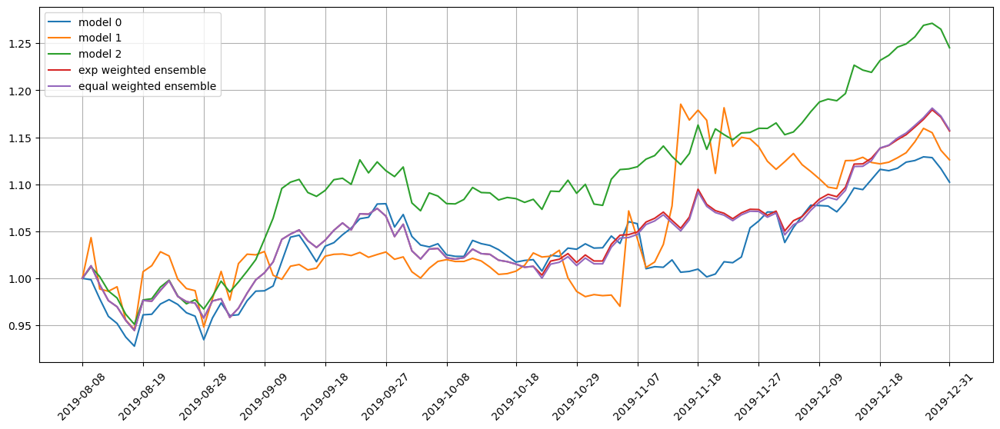

Standardization data are from 2018-05-29 to 2019-03-14
Training data are from 2019-03-15 to 2019-12-27
Testing data are from 2019-12-02 to 2020-01-28
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 6 out of 67 iterations
Restoring model weights from the end of the best epoch: 3.
Epoch 23: early stopping
Restoring model weights from the end of the best epoch: 38.
Epoch 58: early stopping
Restoring model weights from the end of the best epoch: 23.
Epoch 43: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 0.023795003071427345
11/11 [==============================] - 0s 3ms/step
Model 0 test loss 0.02614716626703739
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 0.023742351680994034
11/11 [==============================] - 0s 3ms/step
Model 1 test loss 0.026164887472987175
96/96 [==============================] - 0s 3ms/step
Model 2 training loss 0.

position on 2020-01-06 market open will be {'ROL': 0.11651725837447187, 'GD': 0.11934831976416807, 'UNG': 0.11800804854334498, 'VNLA': 0.11713256508848384, 'AXON': 0.11996019473165528, 'TFLO': 0.11696804410854511, 'AZO': 0.11614575516603907, 'WU': 0.11724075503180513, 'J': 0.11904952624843149, 'GFF': 0.11428672425107245}
Total asset on 2020-01-06 will be 1.1746571913080117
It should be the same as 1.1746571913080173
Testing data from 2019-12-05 to 2020-01-03 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2020-01-06 are ['KTOS', 'FIX', 'AOS', 'J', 'UTHR', 'TTEK', 'MRVL', 'JBLU', 'UAL', 'GMS']
position on 2020-01-07 market open will be {'UTHR': 0.10851644613671411, 'KTOS': 0.12451788244114995, 'J': 0.11237391695570624, 'MRVL': 0.10991905079385465, 'AOS': 0.11234352170375798, 'JBLU': 0.11243406935622288, 'UAL': 0.11259237779560702, 'FIX': 0.11369911283671619, 'TTEK': 0.1119885513873573, 'GMS': 0.11312012173327475}
Total asset on 2020-01-07 will be 1.1315050511403577
It

Testing data from 2019-12-10 to 2020-01-08 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2020-01-09 are ['AXON', 'WU', 'CIEN', 'GWRE', 'TREE', 'CM', 'ATSG', 'ABR', 'CASY', 'TD']
position on 2020-01-10 market open will be {'CIEN': 0.11532596971002664, 'TD': 0.11162936416454323, 'AXON': 0.11262034793959785, 'WU': 0.11537787737245053, 'ATSG': 0.1095568471137288, 'TREE': 0.1125920411494488, 'CM': 0.11139994309214062, 'CASY': 0.11238349760340328, 'ABR': 0.11235823874172104, 'GWRE': 0.1116253785184404}
Total asset on 2020-01-10 will be 1.1248695054054978
It should be the same as 1.1248695054055013
top_stocks by model 1 to buy on 2020-01-09 are ['ASHR', 'EWG', 'FBT', 'FDN', 'AES', 'DXJ', 'JNUG', 'AXSM', 'AUPH', 'ITCI']
position on 2020-01-10 market open will be {'AUPH': 0.10971390587268734, 'FDN': 0.11412104825243866, 'DXJ': 0.11310834255288238, 'AES': 0.1123543345229417, 'ASHR': 0.11196252487942283, 'JNUG': 0.11252856568787048, 'ITCI': 0.10725969391672838, 'EWG': 0.11229

top_stocks by model 0 to buy on 2020-01-14 are ['AAT', 'AVGO', 'UTHR', 'BHC', 'EQC', 'SPR', 'DEI', 'ATI', 'REG', 'IFF']
position on 2020-01-15 market open will be {'ATI': 0.1162618075986596, 'IFF': 0.114760802701423, 'REG': 0.11472548873299045, 'UTHR': 0.11932861153986604, 'EQC': 0.11307058740998475, 'SPR': 0.11310527905022612, 'DEI': 0.11251423703363522, 'BHC': 0.11475615647636327, 'AVGO': 0.11509398491747956, 'AAT': 0.11261384495854629}
Total asset on 2020-01-15 will be 1.1462308004191708
It should be the same as 1.1462308004191744
top_stocks by model 1 to buy on 2020-01-14 are ['EEM', 'VNLA', 'D', 'XBI', 'STAG', 'EFV', 'EWS', 'DXJ', 'AUPH', 'AXSM']
position on 2020-01-15 market open will be {'AUPH': 0.10666481312926834, 'VNLA': 0.11232464048526543, 'EEM': 0.11224934520811106, 'XBI': 0.11418488316544537, 'STAG': 0.11127116482628305, 'DXJ': 0.11138634837950621, 'D': 0.111939226253936, 'EFV': 0.11151458795133577, 'AXSM': 0.1142985822182738, 'EWS': 0.11128250333544196}
Total asset on 20

position on 2020-01-21 market open will be {'TGI': 0.11259387695171084, 'WFC': 0.1171853661641855, 'LYV': 0.1172247043984881, 'ATI': 0.11390663247970816, 'UI': 0.11538401477448075, 'TSCO': 0.11951560356119698, 'CRS': 0.11202811365988731, 'ITCI': 0.11471983819031947, 'USB': 0.11551928321409509, 'IFF': 0.11700038933693364}
Total asset on 2020-01-21 will be 1.1550778227310021
It should be the same as 1.1550778227310057
top_stocks by model 1 to buy on 2020-01-17 are ['HR', 'KRC', 'BXMT', 'BKLN', 'BKH', 'FLRN', 'VNLA', 'USFR', 'AXSM', 'ITCI']
position on 2020-01-21 market open will be {'AXSM': 0.11238592349726197, 'HR': 0.11280907925060436, 'VNLA': 0.11287428830622319, 'KRC': 0.11324562593318203, 'FLRN': 0.11287428830622319, 'ITCI': 0.11122185194905367, 'BXMT': 0.11221857002440357, 'USFR': 0.11278431072861685, 'BKH': 0.1126101051297074, 'BKLN': 0.11238096413611214}
Total asset on 2020-01-21 will be 1.1254050072613835
It should be the same as 1.1254050072613884
top_stocks by model 2 to buy o

position on 2020-01-24 market open will be {'LII': 0.1162036226359284, 'GNW': 0.11586825613007573, 'SPDN': 0.11586794101303245, 'BIL': 0.11579550843082234, 'SPIP': 0.11545147784316746, 'RILY': 0.11564114102778468, 'ITCI': 0.11331770606272659, 'AIR': 0.11572572176082073, 'EXPD': 0.11648077283649706, 'BA': 0.120336403594284}
Total asset on 2020-01-24 will be 1.1606885513351357
It should be the same as 1.1606885513351395
top_stocks by model 1 to buy on 2020-01-23 are ['NHI', 'FTSL', 'KRC', 'EQC', 'DRIP', 'FTSM', 'NI', 'HE', 'AXSM', 'ITCI']
position on 2020-01-24 market open will be {'ITCI': 0.10461209843889573, 'HE': 0.11460718159110703, 'FTSL': 0.1133016803512131, 'FTSM': 0.11348591083203911, 'NI': 0.11293433869389312, 'EQC': 0.11346685416570061, 'KRC': 0.11466597998022879, 'DRIP': 0.11480798556582751, 'NHI': 0.11360511044449816, 'AXSM': 0.11412026210241058}
Total asset on 2020-01-24 will be 1.1296074021658093
It should be the same as 1.1296074021658136
top_stocks by model 2 to buy on 20

top_stocks by model 1 to buy on 2020-01-28 are ['EFA', 'HE', 'DEA', 'VPL', 'DXJ', 'ERY', 'EWJ', 'VSS', 'AXSM', 'ITCI']
position on 2020-01-29 market open will be {'ITCI': 0.10113774092819064, 'VSS': 0.11227868243709545, 'DXJ': 0.1128373066760605, 'HE': 0.11286466697711624, 'VPL': 0.11267320026014291, 'DEA': 0.11303070627182578, 'AXSM': 0.11387457035792818, 'EFA': 0.1128066957994274, 'EWJ': 0.11266374267590851, 'ERY': 0.11128535747918517}
Total asset on 2020-01-29 will be 1.1154526698628753
It should be the same as 1.1154526698628808
top_stocks by model 2 to buy on 2020-01-28 are ['GME', 'PRTA', 'AMLP', 'ATSG', 'UUP', 'FDX', 'HEI', 'IMAX', 'AIR', 'ITCI']
position on 2020-01-29 market open will be {'ITCI': 0.1183363478574449, 'UUP': 0.12399255852095262, 'IMAX': 0.12319725497697068, 'ATSG': 0.12251421170987024, 'GME': 0.12142250552934493, 'HEI': 0.12516195970638383, 'AMLP': 0.12387469668779175, 'AIR': 0.12311570034810049, 'PRTA': 0.12445700363411219, 'FDX': 0.1232369070329409}
Total asset

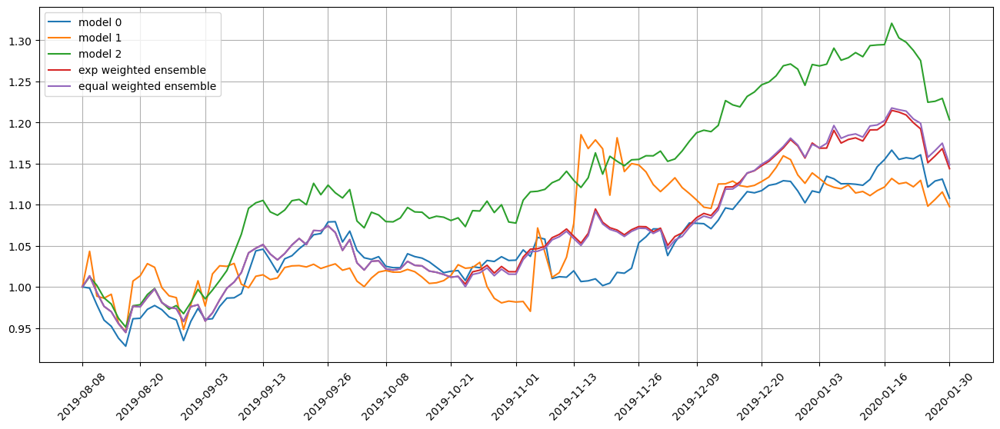

Standardization data are from 2018-06-26 to 2019-04-11
Training data are from 2019-04-12 to 2020-01-28
Testing data are from 2019-12-31 to 2020-02-26
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 7 out of 67 iterations
Restoring model weights from the end of the best epoch: 8.
Epoch 28: early stopping
Restoring model weights from the end of the best epoch: 1.
Epoch 21: early stopping
Restoring model weights from the end of the best epoch: 6.
Epoch 26: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 0.023688076063990593
11/11 [==============================] - 0s 3ms/step
Model 0 test loss 0.04369920492172241
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 0.024409938603639603
11/11 [==============================] - 0s 3ms/step
Model 1 test loss 0.04495031759142876
96/96 [==============================] - 0s 3ms/step
Model 2 training loss 0.023

top_stocks by model 2 to buy on 2020-02-03 are ['CROX', 'BVN', 'IONS', 'HL', 'AVT', 'GDXJ', 'PRTA', 'UPS', 'FCEL', 'ITCI']
position on 2020-02-04 market open will be {'ITCI': 0.11318050764860738, 'GDXJ': 0.11925356516513683, 'HL': 0.11896840183775861, 'FCEL': 0.13083809267591226, 'CROX': 0.12250143082781308, 'PRTA': 0.12769561825981487, 'IONS': 0.12233110773957889, 'BVN': 0.12147372541865918, 'AVT': 0.12377295759271185, 'UPS': 0.12042434876876586}
Total asset on 2020-02-04 will be 1.2204397559347488
It should be the same as 1.2204397559347588
top_stocks by return weighted ensemble to buy on 2020-02-03 are ['SSRM', 'GDX', 'EWT', 'CROX', 'PRTA', 'GDXJ', 'HDB', 'AXSM', 'OLED', 'ITCI']
position on 2020-02-04 market open will be {'ITCI': 0.10417206684380176, 'GDXJ': 0.11146779256473135, 'EWT': 0.11694171232407144, 'CROX': 0.11450361304912512, 'HDB': 0.11605323752308513, 'SSRM': 0.11182467668380949, 'GDX': 0.11105311637218995, 'AXSM': 0.12277315944465905, 'PRTA': 0.11935868473114117, 'OLED':

position on 2020-02-07 market open will be {'ITCI': 0.10564505324603544, 'SIL': 0.12596493043033988, 'SBH': 0.12370114015692266, 'STLD': 0.11974679210578744, 'DDS': 0.12595804892236437, 'CDNA': 0.12503962089231968, 'UPBD': 0.12526959618422048, 'GFF': 0.12344305789356301, 'XRAY': 0.1271881473603941, 'IDEX': 0.11734536407556624}
Total asset on 2020-02-07 will be 1.2193017512675028
It should be the same as 1.2193017512675133
top_stocks by return weighted ensemble to buy on 2020-02-06 are ['GFI', 'GEN', 'XRX', 'IBN', 'SBH', 'GDX', 'GFF', 'XRAY', 'UPBD', 'ITCI']
position on 2020-02-07 market open will be {'ITCI': 0.09723638616846594, 'IBN': 0.11353809734826188, 'SBH': 0.11378349561521406, 'GFI': 0.12500124228764214, 'XRX': 0.11345527302683532, 'UPBD': 0.11522620187708284, 'GEN': 0.12342217122165981, 'GDX': 0.11628106342292008, 'XRAY': 0.11699093467635038, 'GFF': 0.11354610490043088}
Total asset on 2020-02-07 will be 1.1484809705448593
It should be the same as 1.1484809705448635
top_stocks b

position on 2020-02-12 market open will be {'AGO': 0.11815396046460407, 'KN': 0.12284709189164365, 'GPI': 0.1151202117167734, 'LYG': 0.11536262841650625, 'TTD': 0.11322553769821969, 'RGLD': 0.11455350792279138, 'BRC': 0.11304120504238375, 'CYBR': 0.10045234442360954, 'SHOO': 0.11468720385665353, 'YUM': 0.11498653464605763}
Total asset on 2020-02-12 will be 1.1424302260792385
It should be the same as 1.142430226079243
top_stocks by equal weighted ensemble to buy on 2020-02-11 are ['TTD', 'GPI', 'RGLD', 'BRC', 'KN', 'CYBR', 'SHOO', 'YUM', 'AGO', 'LYG']
position on 2020-02-12 market open will be {'AGO': 0.11912296516916861, 'KN': 0.12385458592330362, 'GPI': 0.11599044409384898, 'LYG': 0.11623469330290148, 'TTD': 0.11408144759750999, 'RGLD': 0.11541945639539544, 'BRC': 0.1138957215091667, 'CYBR': 0.10121169746133363, 'SHOO': 0.11555416298176244, 'YUM': 0.11585575651322122}
Total asset on 2020-02-12 will be 1.151220930947605
It should be the same as 1.151220930947612
Testing data from 2020-

position on 2020-02-18 market open will be {'DXC': 0.11533515988733938, 'ACIW': 0.11564113810084245, 'LYG': 0.11328260965495583, 'CLH': 0.11523566495546644, 'BRC': 0.11363445546218966, 'EXPD': 0.11461733390984033, 'ATR': 0.1150939171217581, 'EXPRQ': 0.11522237846763368, 'INFY': 0.11595031451322861, 'LNTH': 0.11446568999255317}
Total asset on 2020-02-18 will be 1.1484786620658
It should be the same as 1.1484786620658076
Testing data from 2020-01-17 to 2020-02-14 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2020-02-18 are ['OKTA', 'HTH', 'NSIT', 'GOLF', 'SNN', 'RPD', 'WPM', 'AEM', 'HWM', 'BAH']
position on 2020-02-19 market open will be {'GOLF': 0.10827297402358137, 'HTH': 0.10926699073658452, 'RPD': 0.11177563962508921, 'NSIT': 0.10868758359767848, 'WPM': 0.11453885696583187, 'SNN': 0.10823503696459018, 'OKTA': 0.11088319776758748, 'AEM': 0.10811204002064657, 'HWM': 0.10949787455854965, 'BAH': 0.11106450576976884}
Total asset on 2020-02-19 will be 1.100334700029904

Testing data from 2020-01-23 to 2020-02-20 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2020-02-21 are ['TRV', 'GGAL', 'MSM', 'ALLE', 'RS', 'APPN', 'PLXS', 'PRGS', 'ACIW', 'AGO']
position on 2020-02-24 market open will be {'GGAL': 0.10892704984543153, 'ALLE': 0.10535167654652539, 'ACIW': 0.10249107656177976, 'PRGS': 0.10196816853017089, 'TRV': 0.10808300928179579, 'MSM': 0.10520358984964934, 'RS': 0.10731936447598611, 'APPN': 0.08919982615154756, 'PLXS': 0.10238735646535292, 'AGO': 0.10731554237168052}
Total asset on 2020-02-24 will be 1.0382466600799158
It should be the same as 1.0382466600799198
top_stocks by model 1 to buy on 2020-02-21 are ['BNDX', 'GUSH', 'VXRT', 'ACMR', 'CEIX', 'NNDM', 'ENPH', 'AXSM', 'ZOM', 'FCEL']
position on 2020-02-24 market open will be {'FCEL': 0.1506074040970558, 'NNDM': 0.060370595930416826, 'GUSH': 0.08767919380091616, 'ACMR': 0.10366310860869231, 'CEIX': 0.08231376608285493, 'ENPH': 0.13319184378031612, 'VXRT': 0.10392296599938997,

top_stocks by model 0 to buy on 2020-02-26 are ['BPOP', 'SWK', 'SVXY', 'CSL', 'SBUX', 'SKX', 'PLXS', 'XRAY', 'GRMN', 'AXSM']
position on 2020-02-27 market open will be {'SWK': 0.09568647318525687, 'BPOP': 0.09612615214142801, 'SBUX': 0.09652958163062958, 'CSL': 0.097912321985599, 'SKX': 0.09958004142283984, 'SVXY': 0.09625304202602528, 'PLXS': 0.09940539709600303, 'AXSM': 0.09683125393548483, 'GRMN': 0.09908884131916422, 'XRAY': 0.09816944447752482}
Total asset on 2020-02-27 will be 0.9755825492199517
It should be the same as 0.9755825492199556
top_stocks by model 1 to buy on 2020-02-26 are ['ACMR', 'VXRT', 'CENN', 'GUSH', 'NNDM', 'CEIX', 'ZOM', 'AXSM', 'ENPH', 'FCEL']
position on 2020-02-27 market open will be {'FCEL': 0.13521197716256178, 'NNDM': 0.059434618563877856, 'ACMR': 0.0996760697304527, 'CEIX': 0.07764348582578126, 'ENPH': 0.11908946802815135, 'VXRT': 0.2245792967141221, 'ZOM': 0.12422202034045776, 'AXSM': 0.10835373911542215, 'GUSH': 0.0631086634445017, 'CENN': 0.1156506898

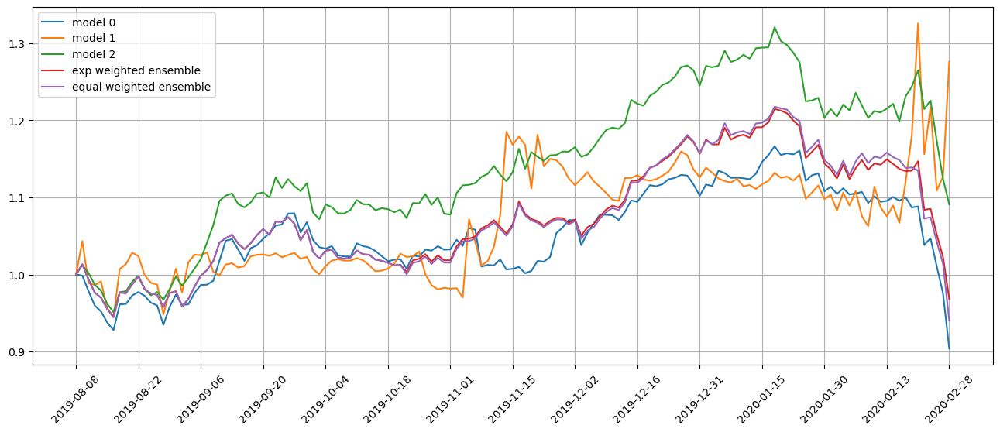

Standardization data are from 2018-07-25 to 2019-05-10
Training data are from 2019-05-13 to 2020-02-26
Testing data are from 2020-01-30 to 2020-03-25
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 8 out of 67 iterations
Restoring model weights from the end of the best epoch: 5.
Epoch 25: early stopping
Restoring model weights from the end of the best epoch: 5.
Epoch 25: early stopping
Restoring model weights from the end of the best epoch: 5.
Epoch 25: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 0.025828974321484566
11/11 [==============================] - 0s 3ms/step
Model 0 test loss 0.1230965331196785
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 0.026402777060866356
11/11 [==============================] - 0s 3ms/step
Model 1 test loss 0.13183434307575226
96/96 [==============================] - 0s 3ms/step
Model 2 training loss 0.0260

position on 2020-03-04 market open will be {'USO': 0.10060021558544423, 'ATSG': 0.09314877926047872, 'CBRL': 0.0972318571872999, 'UCO': 0.101461541922648, 'EXTR': 0.0977531080375599, 'SLM': 0.09677698929439539, 'WW': 0.09425361955796309, 'HYS': 0.09983227264031357, 'IAT': 0.09658645541460906, 'DY': 0.08884056291518486}
Total asset on 2020-03-04 will be 0.9664854018158884
It should be the same as 0.9664854018158967
Testing data from 2020-02-04 to 2020-03-03 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2020-03-04 are ['BANC', 'EPP', 'ASHR', 'FXI', 'FTSL', 'PINC', 'EWH', 'YINN', 'MIDD', 'SRLN']
position on 2020-03-05 market open will be {'EPP': 0.09470768117466115, 'BANC': 0.09042279370788646, 'SRLN': 0.09564712740686036, 'EWH': 0.09477942478023023, 'ASHR': 0.09494864647656531, 'FXI': 0.09448256712767346, 'FTSL': 0.09391215800260812, 'YINN': 0.09528313353684464, 'MIDD': 0.09387749069659644, 'PINC': 0.0920351438203737}
Total asset on 2020-03-05 will be 0.9400961667302

Testing data from 2020-02-07 to 2020-03-06 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2020-03-09 are ['EXTR', 'PACB', 'PTCT', 'SKX', 'OMI', 'BR', 'NSP', 'QD', 'RILY', 'SIGA']
position on 2020-03-10 market open will be {'PACB': 0.10468343379488378, 'PTCT': 0.11392710096433548, 'OMI': 0.10709518498129471, 'SIGA': 0.11173572722538186, 'EXTR': 0.11573531914073051, 'QD': 0.12495777283532451, 'NSP': 0.1171842270484195, 'RILY': 0.11069462874237122, 'SKX': 0.11013089087170636, 'BR': 0.1130283274011685}
Total asset on 2020-03-10 will be 1.1291726130056128
It should be the same as 1.1291726130056163
top_stocks by model 1 to buy on 2020-03-09 are ['MTUM', 'FTCS', 'DGRW', 'XLG', 'XLU', 'VIGI', 'DIA', 'NEAR', 'SPGP', 'ARKG']
position on 2020-03-10 market open will be {'VIGI': 0.12863329315031433, 'FTCS': 0.12741686242752057, 'SPGP': 0.1272829576881568, 'DGRW': 0.12935288657803837, 'MTUM': 0.12836975270389553, 'XLU': 0.12610864034455735, 'XLG': 0.12881319718922749, 'DIA': 0.1

top_stocks by model 0 to buy on 2020-03-12 are ['VGSH', 'TX', 'FXN', 'HYS', 'EMLP', 'WLK', 'FIXD', 'TAP', 'CMP', 'MINT']
position on 2020-03-13 market open will be {'WLK': 0.103678594199182, 'TX': 0.10427717457052849, 'FXN': 0.1104307024122301, 'MINT': 0.10418493978727573, 'VGSH': 0.10450390375541593, 'CMP': 0.11193106397914958, 'EMLP': 0.10204602608048255, 'HYS': 0.10673032410318906, 'TAP': 0.10968996186531597, 'FIXD': 0.10061577059533541}
Total asset on 2020-03-13 will be 1.0580884613481012
It should be the same as 1.0580884613481047
top_stocks by model 1 to buy on 2020-03-12 are ['XLP', 'VHT', 'SPHY', 'BSCO', 'VCIT', 'FLOT', 'VGSH', 'FLRN', 'DRIP', 'NEAR']
position on 2020-03-13 market open will be {'VCIT': 0.11459257807207328, 'VHT': 0.12064537420816474, 'FLRN': 0.11213318343609452, 'VGSH': 0.11676769632143301, 'DRIP': 0.08891567370738987, 'BSCO': 0.11578674716408441, 'SPHY': 0.12098624638318954, 'FLOT': 0.11313736599318887, 'XLP': 0.11871278383173917, 'NEAR': 0.11711290129792563}


position on 2020-03-18 market open will be {'SUB': 0.10245397577304892, 'PZA': 0.10376968873642126, 'MUB': 0.10399842815261433, 'RIOT': 0.11006795307075891, 'EPC': 0.11308023422615071, 'DRIP': 0.15488245683263574, 'TFI': 0.10257456391858595, 'TAK': 0.10131047593234321, 'AVAV': 0.1039776581978029, 'BIL': 0.10412969496667471}
Total asset on 2020-03-18 will be 1.100245129807033
It should be the same as 1.1002451298070366
top_stocks by model 1 to buy on 2020-03-17 are ['IHI', 'VHT', 'FHLC', 'JPST', 'LMBS', 'IXJ', 'PPLT', 'VGSH', 'SHY', 'BIL']
position on 2020-03-18 market open will be {'VHT': 0.1101985929679351, 'IXJ': 0.10402189279359449, 'FHLC': 0.10431237329189341, 'IHI': 0.10056110884523944, 'PPLT': 0.11359613180800479, 'LMBS': 0.11379505262412647, 'SHY': 0.11442815383950587, 'VGSH': 0.11452795689979668, 'JPST': 0.11414265222859081, 'BIL': 0.11479901237184192}
Total asset on 2020-03-18 will be 1.1043829276705228
It should be the same as 1.104382927670529
top_stocks by model 2 to buy on

top_stocks by model 1 to buy on 2020-03-20 are ['SPIP', 'VGSH', 'TBF', 'SCHO', 'SCHP', 'FIXD', 'TIP', 'SHY', 'SCHR', 'STIP']
position on 2020-03-23 market open will be {'SPIP': 0.11439517375712462, 'SCHO': 0.1128076558974219, 'FIXD': 0.10951833074358348, 'TIP': 0.11587034511553616, 'SCHR': 0.11397901447138353, 'SCHP': 0.11751829714987976, 'STIP': 0.11377642848596761, 'SHY': 0.11299755452772002, 'VGSH': 0.11321996853338899, 'TBF': 0.11893149487102717}
Total asset on 2020-03-23 will be 1.1430142635530267
It should be the same as 1.1430142635530331
top_stocks by model 2 to buy on 2020-03-20 are ['TNET', 'BKD', 'FPE', 'MHK', 'CAL', 'ECH', 'DBI', 'KAR', 'BKLN', 'FLOT']
position on 2020-03-23 market open will be {'ECH': 0.11082911401538241, 'CAL': 0.15656379356016356, 'MHK': 0.1015286455844237, 'KAR': 0.10599485043653616, 'BKD': 0.10904431377588597, 'TNET': 0.11662964717147223, 'DBI': 0.09927820868304842, 'FPE': 0.11162148222006502, 'FLOT': 0.11801392173637795, 'BKLN': 0.11699895289419276}
T

position on 2020-03-26 market open will be {'VTIP': 0.11573021033295425, 'BND': 0.11971473653643486, 'SPAB': 0.11776105226756478, 'MINT': 0.11487298953234933, 'SHM': 0.1194835776090911, 'FPE': 0.12772848403810427, 'VTEB': 0.1185656101474904, 'PCY': 0.11961721269241042, 'ITM': 0.11990502340862473, 'SCO': 0.11290682238446909}
Total asset on 2020-03-26 will be 1.1862857189494862
It should be the same as 1.1862857189494933
top_stocks by model 2 to buy on 2020-03-25 are ['ICF', 'BKLN', 'CMP', 'NYCB', 'PBI', 'FLO', 'PRGO', 'GNW', 'AVA', 'SRLN']
position on 2020-03-26 market open will be {'NYCB': 0.12020433443287785, 'ICF': 0.1219007658871039, 'PRGO': 0.12165996235052493, 'SRLN': 0.1241882888836883, 'PBI': 0.11738826715399121, 'FLO': 0.11100121026221665, 'GNW': 0.12216101528098557, 'AVA': 0.11682303266135792, 'CMP': 0.11751825493994826, 'BKLN': 0.12612225488391737}
Total asset on 2020-03-26 will be 1.1989673867366049
It should be the same as 1.198967386736612
top_stocks by return weighted ens

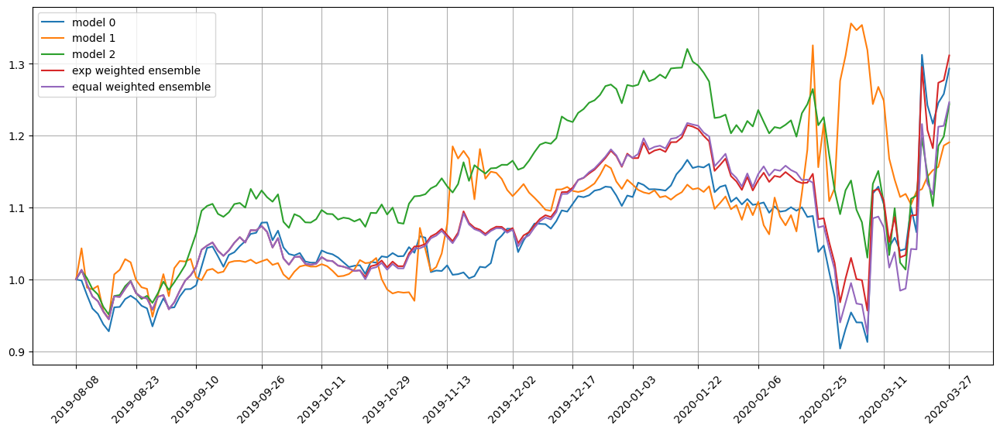

Standardization data are from 2018-08-22 to 2019-06-10
Training data are from 2019-06-11 to 2020-03-25
Testing data are from 2020-02-28 to 2020-04-23
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 9 out of 67 iterations
Restoring model weights from the end of the best epoch: 1.
Epoch 21: early stopping
Restoring model weights from the end of the best epoch: 4.
Epoch 24: early stopping
Restoring model weights from the end of the best epoch: 5.
Epoch 25: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 0.036037981510162354
11/11 [==============================] - 0s 3ms/step
Model 0 test loss 0.08109530061483383
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 0.03767423704266548
11/11 [==============================] - 0s 3ms/step
Model 1 test loss 0.07373231649398804
96/96 [==============================] - 0s 3ms/step
Model 2 training loss 0.0366

position on 2020-04-01 market open will be {'GOGO': 0.12798788781997122, 'ANF': 0.11435258160178167, 'VTRS': 0.12168983522662861, 'IMAX': 0.12935572844802493, 'VC': 0.11238320149144523, 'DORM': 0.12353491286892772, 'WW': 0.12200974022217156, 'FNB': 0.12169479171090548, 'TDS': 0.11915994670278847, 'ADNT': 0.11515131736209744}
Total asset on 2020-04-01 will be 1.207319943454734
It should be the same as 1.2073199434547424
Testing data from 2020-03-04 to 2020-03-31 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2020-04-01 are ['LEA', 'CARG', 'SUM', 'HIMX', 'EVRI', 'DBI', 'YEXT', 'BGC', 'ANF', 'LNW']
position on 2020-04-02 market open will be {'ANF': 0.11306416299423289, 'BGC': 0.11918964732963763, 'LEA': 0.11261460242511377, 'DBI': 0.10956436893279152, 'YEXT': 0.1215270113135164, 'LNW': 0.1168966886001347, 'CARG': 0.11880431641293068, 'SUM': 0.12661502923649717, 'HIMX': 0.1287956383159391, 'EVRI': 0.11672782947199763}
Total asset on 2020-04-02 will be 1.1837992950327871

Testing data from 2020-03-09 to 2020-04-03 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2020-04-06 are ['SFIX', 'PFG', 'UPBD', 'INO', 'RAMP', 'SBH', 'DDS', 'ROG', 'SID', 'KFY']
position on 2020-04-07 market open will be {'DDS': 0.16749359017249335, 'SBH': 0.13829717344675543, 'SID': 0.12524908004051513, 'SFIX': 0.1296138190946119, 'PFG': 0.1269928842849707, 'INO': 0.1214044138045855, 'UPBD': 0.13434044971700515, 'RAMP': 0.12398943317007373, 'KFY': 0.12443981496672572, 'ROG': 0.12639683416134637}
Total asset on 2020-04-07 will be 1.3182174928590784
It should be the same as 1.3182174928590829
top_stocks by model 1 to buy on 2020-04-06 are ['SCHZ', 'VCIT', 'IGIB', 'TFI', 'CMF', 'HYD', 'MUB', 'FCEL', 'VCLT', 'IGLB']
position on 2020-04-07 market open will be {'FCEL': 0.11521134144892259, 'IGIB': 0.11228747764331974, 'IGLB': 0.11372934775788392, 'TFI': 0.11369711556509762, 'CMF': 0.11293441392167311, 'VCIT': 0.10995945942583597, 'VCLT': 0.11129710842297272, 'SCHZ': 0.1

top_stocks by model 0 to buy on 2020-04-09 are ['CABO', 'SFIX', 'EHTH', 'DBRG', 'SQ', 'AEHR', 'ROG', 'KODK', 'UNIT', 'AXSM']
position on 2020-04-13 market open will be {'SFIX': 0.14933949734279095, 'CABO': 0.13358825298126847, 'SQ': 0.1379540954559254, 'AEHR': 0.14181621369705708, 'AXSM': 0.12822914811380617, 'DBRG': 0.17427714771347697, 'EHTH': 0.14165087176119817, 'UNIT': 0.1364028168644219, 'KODK': 0.14647199762325425, 'ROG': 0.13863819598616386}
Total asset on 2020-04-13 will be 1.4283682375393583
It should be the same as 1.428368237539363
top_stocks by model 1 to buy on 2020-04-09 are ['BLV', 'IGSB', 'FCEL', 'LQD', 'GDXJ', 'GDX', 'GVI', 'SPLB', 'IGLB', 'VCLT']
position on 2020-04-13 market open will be {'FCEL': 0.1152113414489226, 'IGLB': 0.12101101716780571, 'VCLT': 0.11950445220627122, 'GDXJ': 0.12015488155760516, 'GDX': 0.1195856462975924, 'SPLB': 0.11897155216564756, 'LQD': 0.11620390167027292, 'IGSB': 0.11168172277231908, 'BLV': 0.1135603982601478, 'GVI': 0.11192243054512976}

position on 2020-04-16 market open will be {'YELP': 0.13588226917928153, 'HIMX': 0.14459555091585571, 'MLKN': 0.1352254479599614, 'EXLS': 0.13799987496618865, 'SUB': 0.13960066006619756, 'GSG': 0.14019265118835558, 'YY': 0.14269450013190935, 'MUFG': 0.1379011446810366, 'SAVA': 0.13999882827199778, 'EME': 0.13840915323849892}
Total asset on 2020-04-16 will be 1.3925000805992787
It should be the same as 1.392500080599283
top_stocks by model 1 to buy on 2020-04-15 are ['FCEL', 'CMF', 'SPLB', 'VCLT', 'LQD', 'IGSB', 'MUB', 'IGLB', 'NEAR', 'SPSB']
position on 2020-04-16 market open will be {'FCEL': 0.11907749378055, 'SPLB': 0.11713946071749619, 'LQD': 0.11569900744188509, 'MUB': 0.11330013048067315, 'SPSB': 0.12213183129983406, 'VCLT': 0.12545442374694724, 'IGSB': 0.12426054835048814, 'IGLB': 0.12548511430378842, 'NEAR': 0.1240253146330157, 'CMF': 0.1234887250169302}
Total asset on 2020-04-16 will be 1.2100620497716015
It should be the same as 1.2100620497716084
top_stocks by model 2 to buy 

Testing data from 2020-03-20 to 2020-04-17 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2020-04-20 are ['ACHC', 'ESGU', 'LII', 'TWO', 'KAR', 'NYMT', 'RWT', 'ERY', 'DRIP', 'IVR']
position on 2020-04-21 market open will be {'RWT': 0.13910073594038974, 'IVR': 0.14804848481831373, 'ERY': 0.13815208458077047, 'LII': 0.13979058285380386, 'ESGU': 0.13543222469159924, 'KAR': 0.1328625269869208, 'ACHC': 0.13223921560344326, 'DRIP': 0.12177745614760901, 'NYMT': 0.1340999412188176, 'TWO': 0.13133499638169244}
Total asset on 2020-04-21 will be 1.352838249223355
It should be the same as 1.35283824922336
top_stocks by model 1 to buy on 2020-04-20 are ['FCEL', 'SHM', 'LQD', 'DRIP', 'VTEB', 'TFI', 'CMF', 'IGLB', 'ITM', 'MUB']
position on 2020-04-21 market open will be {'LQD': 0.11488410253471658, 'MUB': 0.11278132378134635, 'VTEB': 0.12240295960842537, 'ITM': 0.1224349847293434, 'TFI': 0.12169545234502055, 'SHM': 0.1223834619121485, 'CMF': 0.12116724832957987, 'FCEL': 0.117959918

top_stocks by model 0 to buy on 2020-04-23 are ['ALK', 'CMPR', 'AMCX', 'DORM', 'FRT', 'BBD', 'FCFS', 'FOXF', 'WBA', 'ESGU']
position on 2020-04-24 market open will be {'DORM': 0.14162018746952984, 'AMCX': 0.14140625928925526, 'ALK': 0.14485133102630865, 'ESGU': 0.14226503477918953, 'FOXF': 0.14414095287121365, 'FRT': 0.14691686463063616, 'BBD': 0.12960708870253007, 'CMPR': 0.14594494038700723, 'FCFS': 0.13950539589880745, 'WBA': 0.14390635390878642}
Total asset on 2020-04-24 will be 1.4201644089632592
It should be the same as 1.4201644089632641
top_stocks by model 1 to buy on 2020-04-23 are ['USIG', 'VCLT', 'IGLB', 'HYD', 'TFI', 'DRIP', 'MUB', 'FCEL', 'CMF', 'MFA']
position on 2020-04-24 market open will be {'MUB': 0.11155413512488012, 'TFI': 0.1203734613410415, 'CMF': 0.11961074691152687, 'FCEL': 0.1393401556421282, 'IGLB': 0.11971443701545464, 'MFA': 0.11248343986287873, 'VCLT': 0.1165474637039016, 'HYD': 0.11493399842386348, 'USIG': 0.116179396405108, 'DRIP': 0.10747989792874792}
To

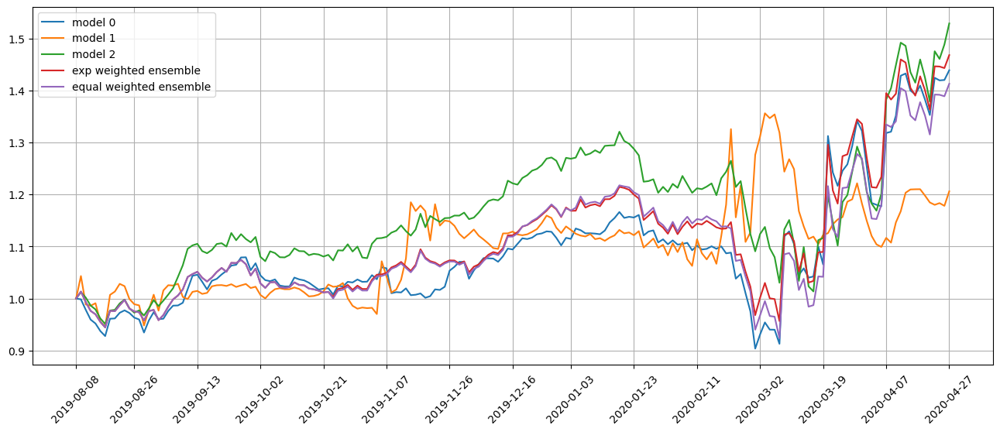

Standardization data are from 2018-09-20 to 2019-07-09
Training data are from 2019-07-10 to 2020-04-23
Testing data are from 2020-03-27 to 2020-05-21
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 10 out of 67 iterations
Restoring model weights from the end of the best epoch: 1.
Epoch 21: early stopping
Restoring model weights from the end of the best epoch: 12.
Epoch 32: early stopping
Restoring model weights from the end of the best epoch: 16.
Epoch 36: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 0.04111265763640404
11/11 [==============================] - 0s 3ms/step
Model 0 test loss 0.0663750097155571
96/96 [==============================] - 0s 4ms/step
Model 1 training loss 0.04389050230383873
11/11 [==============================] - 0s 3ms/step
Model 1 test loss 0.07529006153345108
96/96 [==============================] - 0s 3ms/step
Model 2 training loss 0.041

position on 2020-04-30 market open will be {'WBA': 0.1475436188301789, 'TXT': 0.15236488940432868, 'ALGN': 0.16549085702862687, 'IHG': 0.15257872147491425, 'INO': 0.1500144326913638, 'ARCB': 0.16001322921980335, 'CODX': 0.14475366795444947, 'RYAAY': 0.15859594428008417, 'NAT': 0.13922141604822957, 'CEIX': 0.1713129202003685}
Total asset on 2020-04-30 will be 1.5418896971323388
It should be the same as 1.5418896971323475
Testing data from 2020-04-01 to 2020-04-29 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2020-04-30 are ['IVR', 'VICR', 'SGH', 'MDRX', 'MATX', 'IEI', 'FXE', 'INGN', 'WBA', 'ESGU']
position on 2020-05-01 market open will be {'ESGU': 0.15115153404338755, 'WBA': 0.1467702173628001, 'IVR': 0.1358796375324616, 'MATX': 0.14436032195371185, 'VICR': 0.15269262418341303, 'MDRX': 0.1485843391011392, 'SGH': 0.1383276446271669, 'IEI': 0.15240323777022305, 'INGN': 0.14464040873732387, 'FXE': 0.15439077119641617}
Total asset on 2020-05-01 will be 1.46920073650803

Testing data from 2020-04-06 to 2020-05-04 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2020-05-05 are ['ORA', 'A', 'EME', 'RGR', 'SMPL', 'WBA', 'EFG', 'INO', 'NEOG', 'ESGU']
position on 2020-05-06 market open will be {'NEOG': 0.1519603139357023, 'A': 0.15071495400348112, 'ORA': 0.1492416452984047, 'SMPL': 0.14737778208733127, 'ESGU': 0.14792556994600212, 'INO': 0.13476499789986016, 'EFG': 0.1479431849764803, 'RGR': 0.1467043576452372, 'EME': 0.14600195246053893, 'WBA': 0.1431556570567156}
Total asset on 2020-05-06 will be 1.4657904153097483
It should be the same as 1.4657904153097536
top_stocks by model 1 to buy on 2020-05-05 are ['UAL', 'INO', 'ARCT', 'CODX', 'DRIP', 'CENN', 'MVIS', 'JETS', 'GUSH', 'UCO']
position on 2020-05-06 market open will be {'UCO': 0.15958381339137415, 'INO': 0.07936721774515033, 'JETS': 0.11716046250597899, 'GUSH': 0.15225330444596175, 'CODX': 0.11272596540226917, 'ARCT': 0.17215299608975534, 'MVIS': 0.10847323476438564, 'CENN': 0.136398

top_stocks by model 0 to buy on 2020-05-08 are ['OC', 'SEE', 'DE', 'VMC', 'HRI', 'GATX', 'EVR', 'WLY', 'CAT', 'TOON']
position on 2020-05-11 market open will be {'VMC': 0.1321551876709561, 'TOON': 0.12356651403648289, 'HRI': 0.14850308790695593, 'EVR': 0.13693963937520207, 'GATX': 0.13751995934642675, 'DE': 0.13480161619030923, 'OC': 0.13837647830780717, 'SEE': 0.13891462183800232, 'WLY': 0.1403675618250593, 'CAT': 0.13913710941637297}
Total asset on 2020-05-11 will be 1.3702817759135693
It should be the same as 1.3702817759135748
top_stocks by model 1 to buy on 2020-05-08 are ['INO', 'XELA', 'NAT', 'JETS', 'JDST', 'TOON', 'ARCT', 'MVIS', 'GUSH', 'UCO']
position on 2020-05-11 market open will be {'UCO': 0.16358531869284615, 'INO': 0.0857074279965456, 'JETS': 0.11857843949123226, 'GUSH': 0.15558346335746098, 'ARCT': 0.17367409914680537, 'MVIS': 0.06477178702925579, 'JDST': 0.11927979791681934, 'NAT': 0.1378516427856346, 'XELA': 0.1355349280706834, 'TOON': 0.11733613175007891}
Total asse

position on 2020-05-14 market open will be {'TOON': 0.23762791160862093, 'CMCSA': 0.13305293600184798, 'VIRT': 0.12933708206203437, 'VZ': 0.13293504642588863, 'FTNT': 0.1304789092025637, 'NTRS': 0.12946030307053674, 'MVIS': 0.13126332179536995, 'ATR': 0.13144773077189278, 'CHKP': 0.12973515535831895, 'CSCO': 0.13460689105669}
Total asset on 2020-05-14 will be 1.4199452873537588
It should be the same as 1.4199452873537644
top_stocks by model 1 to buy on 2020-05-13 are ['UAL', 'NCLH', 'CODX', 'JDST', 'JETS', 'ARCT', 'GUSH', 'MVIS', 'UCO', 'TOON']
position on 2020-05-14 market open will be {'UCO': 0.15243826950817835, 'JETS': 0.10484177265592468, 'GUSH': 0.12264736475242914, 'ARCT': 0.1821743839479042, 'MVIS': 0.0624306402861063, 'JDST': 0.126029665386639, 'TOON': 0.2256464072116902, 'CODX': 0.17826606559522812, 'UAL': 0.10263326175977136, 'NCLH': 0.10586451596195239}
Total asset on 2020-05-14 will be 1.3629723470658177
It should be the same as 1.362972347065824
top_stocks by model 2 to b

top_stocks by model 1 to buy on 2020-05-18 are ['UAL', 'ARCT', 'SRNE', 'JETS', 'MVIS', 'CODX', 'JDST', 'GUSH', 'UCO', 'TOON']
position on 2020-05-19 market open will be {'UCO': 0.2051247529488833, 'JETS': 0.12238925897795751, 'GUSH': 0.15473060569114036, 'ARCT': 0.23178916501899807, 'MVIS': 0.07101485431387798, 'JDST': 0.09941590369127572, 'TOON': 0.25452915422096845, 'CODX': 0.11942225255060741, 'UAL': 0.13333997687504565, 'SRNE': 0.08048270606441302}
Total asset on 2020-05-19 will be 1.4722386303531618
It should be the same as 1.4722386303531676
top_stocks by model 2 to buy on 2020-05-18 are ['CTSH', 'ORCL', 'GMED', 'NTAP', 'GE', 'ENPH', 'SATS', 'FDX', 'SAP', 'MVIS']
position on 2020-05-19 market open will be {'GMED': 0.20716224019897644, 'CTSH': 0.20303648724602896, 'ORCL': 0.20038859757301766, 'ENPH': 0.21579391404876144, 'SAP': 0.20504140291779477, 'NTAP': 0.20703514651289442, 'MVIS': 0.21006453449146315, 'FDX': 0.21300184953933687, 'SATS': 0.2133253895091998, 'GE': 0.222603890100

position on 2020-05-22 market open will be {'UCO': 0.2119844685348105, 'JETS': 0.12442759878130667, 'GUSH': 0.14876069497972172, 'ARCT': 0.24386849375087355, 'JDST': 0.0972945197148982, 'TOON': 0.24008778071632939, 'CODX': 0.11782106183053104, 'SRNE': 0.060750689377139296, 'UAL': 0.11175040460222357, 'NNDM': 0.11556158415221388}
Total asset on 2020-05-22 will be 1.4723072964400419
It should be the same as 1.4723072964400479
top_stocks by model 2 to buy on 2020-05-21 are ['IBKR', 'CI', 'BCE', 'RWT', 'JNJ', 'TWO', 'HUBB', 'WSO', 'ORCL', 'IVR']
position on 2020-05-22 market open will be {'IVR': 0.2032411794341567, 'TWO': 0.22301422320638878, 'RWT': 0.21976232814635618, 'ORCL': 0.2128445076523225, 'BCE': 0.21001395469018683, 'JNJ': 0.20887441701864654, 'CI': 0.21626468046435895, 'WSO': 0.21596492380155713, 'HUBB': 0.21533219122885597, 'IBKR': 0.2149932573272946}
Total asset on 2020-05-22 will be 2.1403056629701145
It should be the same as 2.1403056629701243
top_stocks by return weighted en

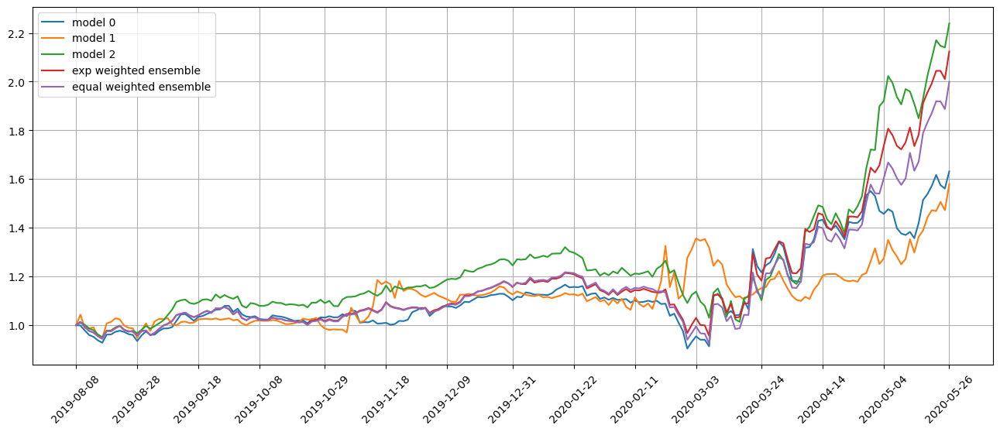

Standardization data are from 2018-10-18 to 2019-08-06
Training data are from 2019-08-07 to 2020-05-21
Testing data are from 2020-04-27 to 2020-06-19
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 11 out of 67 iterations
Restoring model weights from the end of the best epoch: 3.
Epoch 23: early stopping
Restoring model weights from the end of the best epoch: 3.
Epoch 23: early stopping
Restoring model weights from the end of the best epoch: 7.
Epoch 27: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 0.03866972401738167
11/11 [==============================] - 0s 3ms/step
Model 0 test loss 0.06371426582336426
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 0.03789980337023735
11/11 [==============================] - 0s 3ms/step
Model 1 test loss 0.06230418384075165
96/96 [==============================] - 0s 4ms/step
Model 2 training loss 0.0373

position on 2020-05-29 market open will be {'TOON': 0.26584888394808737, 'IHF': 0.19970287906511464, 'BNDX': 0.20076919687311762, 'ELV': 0.20172603741275333, 'MTUM': 0.20098599806925588, 'NNDM': 0.20271474264237638, 'JNJ': 0.20308259428910494, 'IVE': 0.19712452681047735, 'HYLS': 0.20072416662069392, 'SHYG': 0.20027920301563099}
Total asset on 2020-05-29 will be 2.072958228746603
It should be the same as 2.072958228746612
Testing data from 2020-04-30 to 2020-05-28 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2020-05-29 are ['DUK', 'SPEM', 'FXI', 'DGRW', 'IYH', 'FHLC', 'HDV', 'XLG', 'FTCS', 'TOON']
position on 2020-06-01 market open will be {'DGRW': 0.16518300332883126, 'DUK': 0.16693498395902487, 'FTCS': 0.16785635675063557, 'TOON': 0.1979154624793275, 'FHLC': 0.16713299924380387, 'IYH': 0.16749596557114627, 'SPEM': 0.1697400584489847, 'FXI': 0.1693285789728505, 'XLG': 0.16701384634405833, 'HDV': 0.16722332230846096}
Total asset on 2020-06-01 will be 1.705824577407

Testing data from 2020-05-05 to 2020-06-02 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2020-06-03 are ['PAVE', 'MTUM', 'VONE', 'GOOGL', 'DGRW', 'XYLD', 'FCFS', 'TREE', 'TOON', 'NNDM']
position on 2020-06-04 market open will be {'TREE': 0.17428073546297507, 'DGRW': 0.17460735750953335, 'MTUM': 0.17075998925908886, 'GOOGL': 0.17190635674493998, 'PAVE': 0.17677288449636835, 'TOON': 0.3353243512881867, 'VONE': 0.17431816618846752, 'NNDM': 0.15615385036959276, 'XYLD': 0.1748244004115771, 'FCFS': 0.1785935978835166}
Total asset on 2020-06-04 will be 1.8875416896142394
It should be the same as 1.8875416896142465
top_stocks by model 1 to buy on 2020-06-03 are ['JETS', 'XELA', 'SAVA', 'CENN', 'UCO', 'MVIS', 'GUSH', 'MFA', 'TOON', 'NNDM']
position on 2020-06-04 market open will be {'UCO': 0.2524758838729204, 'GUSH': 0.1678482013819177, 'TOON': 1.7203282636713813, 'NNDM': 0.10048833003900107, 'XELA': 0.12747396039314665, 'MVIS': 0.14384337141674994, 'CENN': 0.16055426332360

top_stocks by model 0 to buy on 2020-06-08 are ['VOX', 'XLY', 'EWT', 'DBA', 'DUK', 'GBTC', 'CWEN', 'EEMV', 'TREE', 'TOON']
position on 2020-06-09 market open will be {'TREE': 0.18727904287125333, 'EWT': 0.17891727316595912, 'TOON': 0.12577370496015922, 'CWEN': 0.18076860262767663, 'XLY': 0.17969102700414386, 'DBA': 0.17881998693167464, 'EEMV': 0.17886015555143667, 'VOX': 0.18102676007510884, 'GBTC': 0.18548677884228992, 'DUK': 0.1826874191469677}
Total asset on 2020-06-09 will be 1.7593107511766635
It should be the same as 1.7593107511766697
top_stocks by model 1 to buy on 2020-06-08 are ['XELA', 'MVIS', 'JETS', 'UCO', 'CENN', 'SAVA', 'GUSH', 'MFA', 'NNDM', 'TOON']
position on 2020-06-09 market open will be {'UCO': 0.26457567587642594, 'GUSH': 0.2471628644079652, 'TOON': 0.8014960659606513, 'NNDM': 0.10126131648432224, 'XELA': 0.1681016261324829, 'MVIS': 0.14384337141675, 'CENN': 0.20122801003224938, 'MFA': 0.26330527067781817, 'JETS': 0.23143449991105602, 'SAVA': 0.18286929158541582}


position on 2020-06-12 market open will be {'VOX': 0.17519137073211927, 'FTCS': 0.16960943442275805, 'MTUM': 0.17245862214022367, 'DUK': 0.17295225094977504, 'VWO': 0.16689234888495882, 'AAXJ': 0.16666153682232093, 'GXC': 0.1671736568295218, 'FXI': 0.16621069963608356, 'KSA': 0.16502915950613745, 'XYLD': 0.17013595535232479}
Total asset on 2020-06-12 will be 1.6923150352762169
It should be the same as 1.6923150352762233
top_stocks by model 1 to buy on 2020-06-11 are ['ZOM', 'MVIS', 'UCO', 'SAVA', 'JETS', 'CENN', 'GUSH', 'MFA', 'NNDM', 'TOON']
position on 2020-06-12 market open will be {'UCO': 0.2472358256273999, 'GUSH': 0.18165617319999958, 'TOON': 0.783444353383716, 'NNDM': 0.09353145203111084, 'MVIS': 0.15512521073205568, 'CENN': 0.2590275448287465, 'MFA': 0.20637439777549554, 'JETS': 0.20330371741812886, 'SAVA': 0.1850039505963629, 'ZOM': 0.19382825151093452}
Total asset on 2020-06-12 will be 2.508530877103944
It should be the same as 2.5085308771039503
top_stocks by model 2 to buy 

top_stocks by model 1 to buy on 2020-06-16 are ['ZOM', 'MVIS', 'UCO', 'SAVA', 'CENN', 'GUSH', 'MFA', 'JETS', 'NNDM', 'TOON']
position on 2020-06-17 market open will be {'UCO': 0.26286074243692975, 'GUSH': 0.183971039382575, 'TOON': 0.6155633713287637, 'NNDM': 0.08812053769913757, 'MVIS': 0.16076612198408774, 'CENN': 0.199087286521268, 'MFA': 0.2174442975836887, 'JETS': 0.20498485682582782, 'SAVA': 0.19567726261586, 'ZOM': 0.25341066487459185}
Total asset on 2020-06-17 will be 2.3818861812527246
It should be the same as 2.3818861812527303
top_stocks by model 2 to buy on 2020-06-16 are ['AGNC', 'DBA', 'MLCO', 'EXEL', 'CYBR', 'NYMT', 'NEU', 'LPSN', 'KRYS', 'NNDM']
position on 2020-06-17 market open will be {'NNDM': 0.3303425753536051, 'LPSN': 0.3788744229401139, 'AGNC': 0.346138626365607, 'DBA': 0.3512268536655737, 'CYBR': 0.3573495272230463, 'MLCO': 0.3324866599852774, 'EXEL': 0.36046213851680914, 'KRYS': 0.3877810015412422, 'NEU': 0.3564463799575676, 'NYMT': 0.3212174715164028}
Total as

position on 2020-06-22 market open will be {'UAL': 0.32675577977739945, 'MBB': 0.348877792823505, 'VMBS': 0.34911930808371894, 'ZOM': 0.3543269627794064, 'NFLX': 0.3607776999019241, 'NGG': 0.35877254039466266, 'PPLT': 0.3574443518049317, 'SIMO': 0.35500573961119203, 'TOTL': 0.35625147624601167, 'IPGP': 0.3447848640721446}
Total asset on 2020-06-22 will be 3.5121165154948852
It should be the same as 3.512116515494897
top_stocks by return weighted ensemble to buy on 2020-06-19 are ['SCHR', 'VGIT', 'NGG', 'PPLT', 'VNLA', 'CENN', 'TOTL', 'MBB', 'VMBS', 'JETS']
position on 2020-06-22 market open will be {'MBB': 0.2560863747310274, 'VMBS': 0.2562636539064368, 'VNLA': 0.2607713390232369, 'SCHR': 0.261461733868218, 'NGG': 0.26287996086861337, 'JETS': 0.24541110077676878, 'PPLT': 0.26190676998808915, 'VGIT': 0.2612982083245253, 'TOTL': 0.26103272572621483, 'CENN': 0.25802804274492797}
Total asset on 2020-06-22 will be 2.5851399099580568
It should be the same as 2.5851399099580585
top_stocks by 

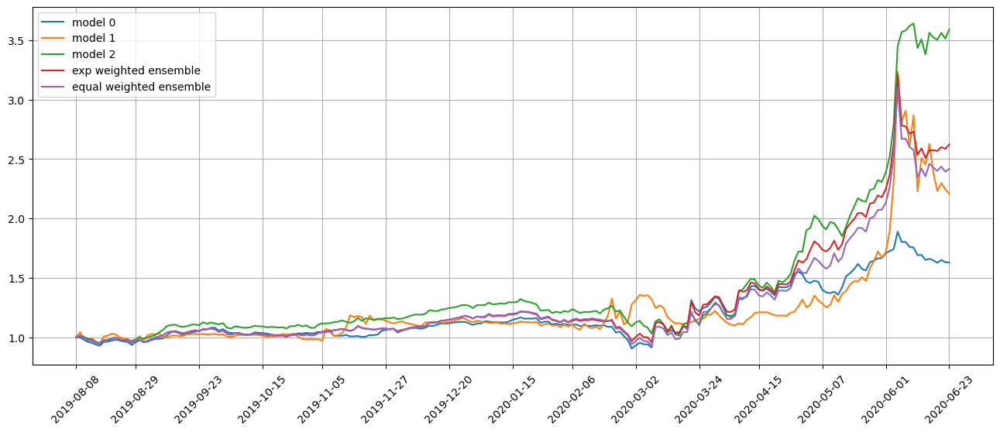

Standardization data are from 2018-11-15 to 2019-09-04
Training data are from 2019-09-05 to 2020-06-19
Testing data are from 2020-05-26 to 2020-07-20
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 12 out of 67 iterations
Restoring model weights from the end of the best epoch: 5.
Epoch 25: early stopping
Restoring model weights from the end of the best epoch: 3.
Epoch 23: early stopping
Restoring model weights from the end of the best epoch: 6.
Epoch 26: early stopping
96/96 [==============================] - 0s 4ms/step
Model 0 training loss 0.038476184010505676
11/11 [==============================] - 0s 4ms/step
Model 0 test loss 0.034972913563251495
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 0.03843164071440697
11/11 [==============================] - 0s 3ms/step
Model 1 test loss 0.03520242124795914
96/96 [==============================] - 0s 4ms/step
Model 2 training loss 0.03

position on 2020-06-26 market open will be {'JETS': 0.22235279218389917, 'GUSH': 0.1852053249248499, 'CENN': 0.2152412762853069, 'UCO': 0.21784435942500016, 'NNDM': 0.2153823850388699, 'SAVA': 0.28754396332517507, 'MFA': 0.24383108001718815, 'IVR': 0.24365427814619534, 'UAL': 0.25267671765089, 'NCLH': 0.23295002584370644}
Total asset on 2020-06-26 will be 2.316682202841072
It should be the same as 2.316682202841081
Testing data from 2020-05-29 to 2020-06-25 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2020-06-26 are ['ZOM', 'UCO', 'IVR', 'NYMT', 'MFA', 'CENN', 'GUSH', 'JETS', 'NNDM', 'TOON']
position on 2020-06-29 market open will be {'UCO': 0.14512261103564733, 'NNDM': 0.13691425132321736, 'JETS': 0.15249570600933451, 'GUSH': 0.12887586612649596, 'NYMT': 0.1641224087846705, 'MFA': 0.1555570471998857, 'IVR': 0.1489824163222308, 'CENN': 0.15241875469884492, 'TOON': 0.1329691060538436, 'ZOM': 0.1512309624809838}
Total asset on 2020-06-29 will be 1.468689130035147
It

Testing data from 2020-06-03 to 2020-06-30 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2020-07-01 are ['NEAR', 'NYMT', 'IDEX', 'UCO', 'CENN', 'MFA', 'INO', 'GUSH', 'JETS', 'NNDM']
position on 2020-07-02 market open will be {'UCO': 0.15605969124773683, 'NNDM': 0.13821203103604962, 'JETS': 0.16032325231459454, 'GUSH': 0.1372728758749444, 'NYMT': 0.16286956710960054, 'MFA': 0.16951729807348584, 'IDEX': 0.1418852288445185, 'INO': 0.10416973873975627, 'CENN': 0.15811651285271383, 'NEAR': 0.14521681018506827}
Total asset on 2020-07-02 will be 1.473643006278461
It should be the same as 1.4736430062784684
top_stocks by model 1 to buy on 2020-07-01 are ['FXN', 'NYMT', 'IDEX', 'IVR', 'INO', 'MVIS', 'MFA', 'CENN', 'GUSH', 'JETS']
position on 2020-07-02 market open will be {'GUSH': 0.13743002440681854, 'CENN': 0.14815947767927168, 'MFA': 0.20163016307994694, 'JETS': 0.1905271947297002, 'MVIS': 0.17295898955667344, 'IVR': 0.29472511132417945, 'INO': 0.22765741070732973, 'NYMT

top_stocks by model 0 to buy on 2020-07-07 are ['ZOM', 'NYMT', 'UCO', 'IDEX', 'MFA', 'INO', 'GUSH', 'JETS', 'NNDM', 'TOON']
position on 2020-07-08 market open will be {'UCO': 0.15802010618008844, 'NNDM': 0.13302095859643093, 'JETS': 0.15183555431902587, 'GUSH': 0.1289975569860779, 'MFA': 0.15755136648905133, 'INO': 0.11929031212718076, 'TOON': 0.13306075481026497, 'ZOM': 0.15336886104704392, 'IDEX': 0.12827572772198126, 'NYMT': 0.13604232455268384}
Total asset on 2020-07-08 will be 1.3994635228298211
It should be the same as 1.399463522829829
top_stocks by model 1 to buy on 2020-07-07 are ['IVR', 'UCO', 'INO', 'ZOM', 'MVIS', 'MFA', 'CENN', 'JETS', 'GUSH', 'TOON']
position on 2020-07-08 market open will be {'GUSH': 0.1291452320206869, 'CENN': 0.13737022595754977, 'MFA': 0.1873974401413881, 'JETS': 0.18044046516638415, 'MVIS': 0.1706528718952051, 'INO': 0.26070261776492853, 'TOON': 0.1779432439687231, 'UCO': 0.2623639568970532, 'ZOM': 0.25986750543625964, 'IVR': 0.22089222393076433}
Tota

top_stocks by model 0 to buy on 2020-07-10 are ['CENN', 'NYMT', 'JETS', 'MFA', 'ZOM', 'IDEX', 'INO', 'GUSH', 'NNDM', 'TOON']
position on 2020-07-13 market open will be {'NNDM': 0.12458548328644195, 'JETS': 0.15353309751569652, 'GUSH': 0.12587403704049877, 'MFA': 0.16154002091682337, 'INO': 0.1227957767011328, 'TOON': 0.1297480368691402, 'IDEX': 0.13736613362353903, 'NYMT': 0.139471959551115, 'ZOM': 0.14058216092626108, 'CENN': 0.15000318864001352}
Total asset on 2020-07-13 will be 1.3854998950706536
It should be the same as 1.385499895070662
top_stocks by model 1 to buy on 2020-07-10 are ['IVR', 'IDEX', 'MVIS', 'MFA', 'INO', 'ZOM', 'CENN', 'JETS', 'GUSH', 'TOON']
position on 2020-07-13 market open will be {'GUSH': 0.12601813630261374, 'CENN': 0.12309160188142926, 'MFA': 0.19214169368884962, 'JETS': 0.1824578153543625, 'MVIS': 0.176418166048876, 'INO': 0.26836362371432354, 'TOON': 0.17351311896576727, 'ZOM': 0.23821187998323806, 'IVR': 0.28022988323388, 'IDEX': 0.2301219750342071}
Total

top_stocks by model 0 to buy on 2020-07-15 are ['JETS', 'IVR', 'NYMT', 'IDEX', 'MFA', 'ZOM', 'GUSH', 'INO', 'NNDM', 'TOON']
position on 2020-07-16 market open will be {'NNDM': 0.11809666207513124, 'GUSH': 0.13260786358161866, 'MFA': 0.17151161736265153, 'INO': 0.12373753059312645, 'TOON': 0.12422684381087892, 'IDEX': 0.1282757277219813, 'ZOM': 0.13461807009700044, 'NYMT': 0.15754167770718375, 'JETS': 0.15650544849597578, 'IVR': 0.16144778287957556}
Total asset on 2020-07-16 will be 1.4085692243251153
It should be the same as 1.4085692243251235
top_stocks by model 1 to buy on 2020-07-15 are ['NYMT', 'IVR', 'INO', 'MVIS', 'MFA', 'CENN', 'JETS', 'ZOM', 'GUSH', 'TOON']
position on 2020-07-16 market open will be {'GUSH': 0.13275967165691385, 'CENN': 0.12287752953033115, 'MFA': 0.2040022804277213, 'JETS': 0.18895815408419517, 'MVIS': 0.22599975075262788, 'INO': 0.2704217766401982, 'TOON': 0.1661295819885006, 'ZOM': 0.22810592287268994, 'IVR': 0.2696982479288314, 'NYMT': 0.26255367695432447}


position on 2020-07-21 market open will be {'NNDM': 0.14534973436849147, 'GUSH': 0.13183712901356226, 'MFA': 0.16951729807348584, 'INO': 0.13373071588099214, 'TOON': 0.11097598257721986, 'IDEX': 0.15352685522630832, 'ZOM': 0.13973014613694051, 'NYMT': 0.15380551495828404, 'UCO': 0.1634803772822012, 'NEAR': 0.1519301413371014}
Total asset on 2020-07-21 will be 1.4538838948545783
It should be the same as 1.453883894854587
top_stocks by model 1 to buy on 2020-07-20 are ['XELA', 'NYMT', 'MVIS', 'INO', 'MFA', 'CENN', 'ZOM', 'JETS', 'GUSH', 'TOON']
position on 2020-07-21 market open will be {'GUSH': 0.13198805476010125, 'CENN': 0.11345834608201313, 'MFA': 0.2016301630799469, 'JETS': 0.18279402613464193, 'MVIS': 0.2813466296100506, 'INO': 0.2922613503482373, 'TOON': 0.14840909605965638, 'ZOM': 0.2367681687513127, 'XELA': 0.2452424455067866, 'NYMT': 0.2855311186242534}
Total asset on 2020-07-21 will be 2.1194293989569943
It should be the same as 2.1194293989570006
top_stocks by model 2 to buy 

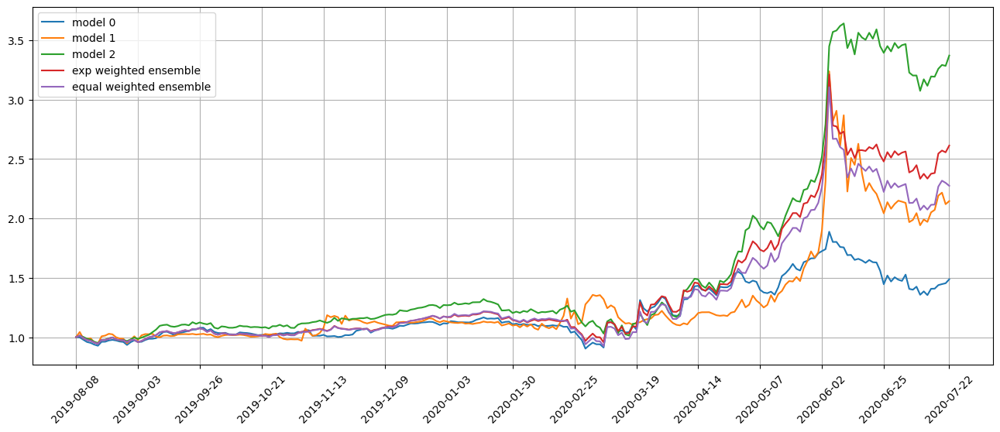

Standardization data are from 2018-12-17 to 2019-10-02
Training data are from 2019-10-03 to 2020-07-20
Testing data are from 2020-06-23 to 2020-08-17
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 13 out of 67 iterations
Restoring model weights from the end of the best epoch: 1.
Epoch 21: early stopping
Restoring model weights from the end of the best epoch: 14.
Epoch 34: early stopping
Restoring model weights from the end of the best epoch: 4.
Epoch 24: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 0.03901628404855728
11/11 [==============================] - 0s 3ms/step
Model 0 test loss 0.029398011043667793
96/96 [==============================] - 0s 4ms/step
Model 1 training loss 0.03815644234418869
11/11 [==============================] - 0s 3ms/step
Model 1 test loss 0.029815375804901123
96/96 [==============================] - 0s 3ms/step
Model 2 training loss 0.0

position on 2020-07-27 market open will be {'JETS': 0.21467615778152258, 'GUSH': 0.1891598726323541, 'NNDM': 0.23996941465203733, 'MFA': 0.25995212727633765, 'TOON': 0.1279088758562722, 'INO': 0.25933449796038777, 'ZOM': 0.22694507859934895, 'MVIS': 0.3101660818381205, 'PACB': 0.17997050015377536, 'RWM': 0.19473706508722466}
Total asset on 2020-07-27 will be 2.2028196718373723
It should be the same as 2.202819671837381
Testing data from 2020-06-26 to 2020-07-24 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2020-07-27 are ['ZOM', 'NYMT', 'CENN', 'INO', 'GUSH', 'JETS', 'MVIS', 'MFA', 'TOON', 'NNDM']
position on 2020-07-28 market open will be {'NNDM': 0.1485941449741469, 'GUSH': 0.13313521643051124, 'MFA': 0.16951729807348584, 'INO': 0.10704735851521716, 'TOON': 0.09386028199044186, 'ZOM': 0.13973014613694051, 'CENN': 0.1697581854201608, 'MVIS': 0.16934170080627137, 'JETS': 0.1537576300882034, 'NYMT': 0.1347581670991645}
Total asset on 2020-07-28 will be 1.41950012953

Testing data from 2020-07-01 to 2020-07-29 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2020-07-30 are ['DPST', 'NYMT', 'INO', 'CENN', 'JETS', 'GUSH', 'MVIS', 'MFA', 'NNDM', 'TOON']
position on 2020-07-31 market open will be {'NNDM': 0.15248743770093337, 'GUSH': 0.12964660069455244, 'MFA': 0.17749459107958906, 'INO': 0.10819840509482713, 'TOON': 0.08613061381504407, 'CENN': 0.13668130871188472, 'MVIS': 0.16934170080627134, 'JETS': 0.15199704358255106, 'NYMT': 0.14168250596985488, 'DPST': 0.13242290729885953}
Total asset on 2020-07-31 will be 1.3860831147543577
It should be the same as 1.3860831147543675
top_stocks by model 1 to buy on 2020-07-30 are ['SSB', 'HXL', 'UBSI', 'H', 'ECL', 'HWC', 'OKE', 'GBCI', 'AGO', 'KODK']
position on 2020-07-31 market open will be {'KODK': 0.2853953749687434, 'AGO': 0.20965864989303137, 'ECL': 0.205113286768066, 'OKE': 0.20703133976705665, 'UBSI': 0.20483211321496023, 'H': 0.20448004191615146, 'HXL': 0.2109365748864379, 'GBCI': 0.21

top_stocks by model 0 to buy on 2020-08-04 are ['NYMT', 'INO', 'CENN', 'JETS', 'GUSH', 'MVIS', 'MFA', 'TOON', 'NNDM', 'KODK']
position on 2020-08-05 market open will be {'NNDM': 0.17195393227600586, 'GUSH': 0.14684628218076004, 'MFA': 0.17948891036875472, 'INO': 0.10589631193560718, 'TOON': 0.09220392828529948, 'CENN': 0.11508566193540697, 'MVIS': 0.24903191760717047, 'JETS': 0.1572787937716008, 'NYMT': 0.13688872899809984, 'KODK': 0.0968290897281373}
Total asset on 2020-08-05 will be 1.4515035570868327
It should be the same as 1.4515035570868422
top_stocks by model 1 to buy on 2020-08-04 are ['ERJ', 'MAR', 'DRI', 'PARR', 'TNL', 'CUK', 'L', 'H', 'EPR', 'KODK']
position on 2020-08-05 market open will be {'KODK': 0.17691775579938077, 'H': 0.21566156849194693, 'PARR': 0.2213158801638068, 'EPR': 0.22161197922516432, 'ERJ': 0.2037897015907836, 'MAR': 0.21777565487641135, 'L': 0.21019228414804214, 'DRI': 0.2147512532805748, 'TNL': 0.22033640718808756, 'CUK': 0.22851111098365667}
Total asset 

position on 2020-08-10 market open will be {'NNDM': 0.14210532376283622, 'GUSH': 0.14806323719984685, 'MFA': 0.18879573371819428, 'INO': 0.1026524515786504, 'TOON': 0.09054756404931706, 'CENN': 0.11385553015699999, 'MVIS': 0.14443851300381005, 'JETS': 0.1644189335726891, 'KODK': 0.05556278845427097, 'NYMT': 0.1322637389958897}
Total asset on 2020-08-10 will be 1.2827038144924943
It should be the same as 1.2827038144925045
top_stocks by model 1 to buy on 2020-08-07 are ['MANH', 'ZBH', 'EW', 'MDT', 'IOVA', 'BDX', 'WAT', 'HAE', 'BAX', 'INCY']
position on 2020-08-10 market open will be {'WAT': 0.21375250356230466, 'HAE': 0.22069459338671324, 'IOVA': 0.20109835676404622, 'BAX': 0.21236845157681677, 'MDT': 0.22499208294824483, 'EW': 0.21597864802359437, 'MANH': 0.21603966211462683, 'ZBH': 0.22809126873007482, 'INCY': 0.21614921857999142, 'BDX': 0.2166593760639816}
Total asset on 2020-08-10 will be 2.1658241617503915
It should be the same as 2.1658241617503946
top_stocks by model 2 to buy on 

position on 2020-08-13 market open will be {'NNDM': 0.12328771904417991, 'GUSH': 0.1557300708419587, 'MFA': 0.18879573371819425, 'INO': 0.07047545887894895, 'TOON': 0.08502637099105577, 'CENN': 0.09704372918543819, 'MVIS': 0.10957404810123635, 'JETS': 0.16960288065535262, 'KODK': 0.059308596959551534, 'NYMT': 0.10920620245127198}
Total asset on 2020-08-13 will be 1.1680508108271772
It should be the same as 1.1680508108271883
top_stocks by model 1 to buy on 2020-08-12 are ['UI', 'AXSM', 'MANH', 'KBH', 'TYL', 'NG', 'MASI', 'IOVA', 'UL', 'RGLD']
position on 2020-08-13 market open will be {'NG': 0.2152694812852912, 'RGLD': 0.21616866153830896, 'UI': 0.21848485451236288, 'MANH': 0.2185319731102796, 'MASI': 0.21997707268214245, 'IOVA': 0.22162049129788522, 'UL': 0.22053253141887344, 'AXSM': 0.21992651090615334, 'TYL': 0.21994612023699245, 'KBH': 0.21569831461760758}
Total asset on 2020-08-13 will be 2.186156011605894
It should be the same as 2.1861560116058976
top_stocks by model 2 to buy on

top_stocks by model 1 to buy on 2020-08-17 are ['TWO', 'CACC', 'FCN', 'UHS', 'BP', 'SKYW', 'OKE', 'UE', 'PK', 'BCO']
position on 2020-08-18 market open will be {'FCN': 0.21716917552709777, 'UE': 0.22538807697254196, 'UHS': 0.22193935928035485, 'SKYW': 0.21595460497233307, 'OKE': 0.21796590514079175, 'CACC': 0.21884606725925548, 'BCO': 0.21612881302195713, 'BP': 0.21710322004747923, 'PK': 0.2058221112276642, 'TWO': 0.22133340917330335}
Total asset on 2020-08-18 will be 2.177650742622776
It should be the same as 2.177650742622779
top_stocks by model 2 to buy on 2020-08-17 are ['MVIS', 'CSCO', 'BOIL', 'XELA', 'MARA', 'JETS', 'GUSH', 'MFA', 'TOON', 'NNDM']
position on 2020-08-18 market open will be {'NNDM': 0.27182029723045564, 'GUSH': 0.3373557675151945, 'MFA': 0.40599032165261273, 'TOON': 0.20714241112388612, 'JETS': 0.3384001646727456, 'MVIS': 0.23977619737010814, 'XELA': 0.3588000210091383, 'BOIL': 0.34511009380964186, 'CSCO': 0.3132601848516796, 'MARA': 0.287407434894236}
Total asset 

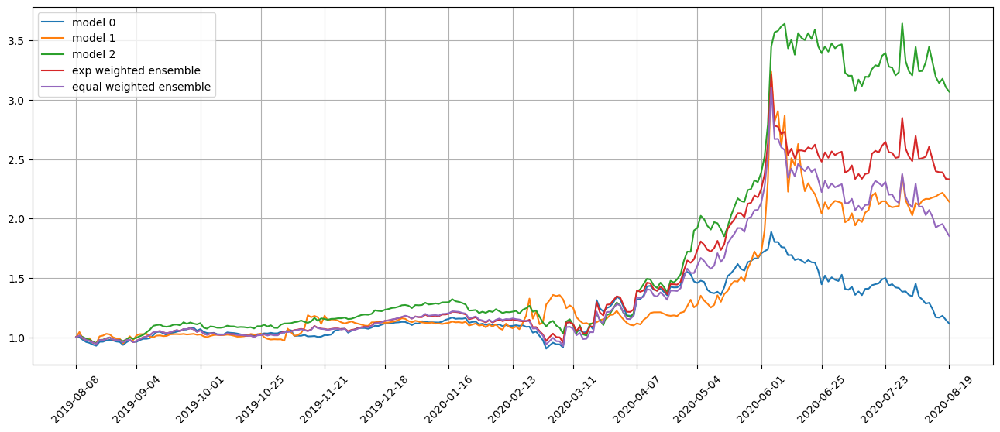

Standardization data are from 2019-01-16 to 2019-10-30
Training data are from 2019-10-31 to 2020-08-17
Testing data are from 2020-07-22 to 2020-09-15
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 14 out of 67 iterations
Restoring model weights from the end of the best epoch: 24.
Epoch 44: early stopping
Restoring model weights from the end of the best epoch: 19.
Epoch 39: early stopping
Restoring model weights from the end of the best epoch: 3.
Epoch 23: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 0.03733620420098305
11/11 [==============================] - 0s 3ms/step
Model 0 test loss 0.02902444265782833
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 0.036571238189935684
11/11 [==============================] - 0s 3ms/step
Model 1 test loss 0.029308965429663658
96/96 [==============================] - 0s 4ms/step
Model 2 training loss 0.

position on 2020-08-24 market open will be {'OKE': 0.21857173952622944, 'UNG': 0.24353478652779384, 'MPLX': 0.227795338325321, 'CVX': 0.22871081454513179, 'SABR': 0.23022998409662038, 'XLE': 0.227040208096921, 'TNL': 0.2247617398577992, 'BP': 0.22873033255683223, 'XOM': 0.22611643320088956, 'AER': 0.22447052688368513}
Total asset on 2020-08-24 will be 2.279961903617221
It should be the same as 2.2799619036172234
top_stocks by equal weighted ensemble to buy on 2020-08-21 are ['XLE', 'SAN', 'TNL', 'MAR', 'BP', 'MPLX', 'SABR', 'CVX', 'AER', 'OKE']
position on 2020-08-24 market open will be {'OKE': 0.16820246242049097, 'MPLX': 0.1830897428528464, 'MAR': 0.1860925689295126, 'SAN': 0.18697448509471226, 'CVX': 0.18382555380887955, 'SABR': 0.1850465812652654, 'TNL': 0.18065149820999887, 'BP': 0.18384124134563734, 'XLE': 0.18248280945221323, 'AER': 0.18041743675405364}
Total asset on 2020-08-24 will be 1.8206243801335995
It should be the same as 1.8206243801336104
Testing data from 2020-07-27 t

position on 2020-08-27 market open will be {'MFA': 0.17663975899218698, 'MARA': 0.17672298974541079, 'TOON': 0.191115055933302, 'SYY': 0.18416760142688401, 'OKE': 0.17898359297199085, 'INO': 0.1785769595661101, 'GLPG': 0.1797013758848297, 'HXL': 0.18022996803359484, 'POR': 0.17407087557368475, 'PLCE': 0.1893813192965058}
Total asset on 2020-08-27 will be 1.809589497424489
It should be the same as 1.8095894974245001
Testing data from 2020-07-30 to 2020-08-26 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2020-08-27 are ['IXC', 'AFG', 'UBSI', 'CHDN', 'MGM', 'SYY', 'OKE', 'AGO', 'LNC', 'CHH']
position on 2020-08-28 market open will be {'SYY': 0.11838851494326993, 'IXC': 0.11108493789546518, 'CHH': 0.11370642470102821, 'OKE': 0.11493971526033572, 'CHDN': 0.11440460540111862, 'UBSI': 0.11342272874375293, 'AFG': 0.1137207289305282, 'LNC': 0.11579695034626089, 'MGM': 0.11678479021902384, 'AGO': 0.11671699085479742}
Total asset on 2020-08-28 will be 1.1489663872955704
It sh

Testing data from 2020-08-04 to 2020-08-31 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2020-09-01 are ['RBA', 'SYY', 'SUN', 'AMCX', 'TDY', 'UBSI', 'ATKR', 'FHN', 'LDOS', 'INO']
position on 2020-09-02 market open will be {'AMCX': 0.10321837558239315, 'LDOS': 0.1112623758666748, 'SYY': 0.11300192726819643, 'FHN': 0.1117945353123988, 'INO': 0.10742426298647718, 'UBSI': 0.11186001912044329, 'RBA': 0.11251529253911044, 'TDY': 0.1130672309949935, 'SUN': 0.10853186693477793, 'ATKR': 0.11635521614564691}
Total asset on 2020-09-02 will be 1.1090311027511017
It should be the same as 1.1090311027511124
top_stocks by model 1 to buy on 2020-09-01 are ['TDC', 'DOG', 'YANG', 'INO', 'LDOS', 'TDY', 'TOON', 'GRPN', 'MFA', 'KODK']
position on 2020-09-02 market open will be {'MFA': 0.2086133922696901, 'KODK': 0.2295822025772636, 'TOON': 0.2655256518553667, 'YANG': 0.21766077584510934, 'LDOS': 0.22370283325134907, 'TDC': 0.22069474886370694, 'DOG': 0.22081699986465578, 'INO': 0.21598

position on 2020-09-08 market open will be {'HRB': 0.11275112234430397, 'IXC': 0.10646092098640234, 'IYE': 0.10667464052594958, 'WIX': 0.09984499408319913, 'INO': 0.11386031827648024, 'FTAI': 0.11038062052034402, 'AMLP': 0.10810047410262634, 'H': 0.10993471248673033, 'BXMT': 0.10776588339154468, 'EPD': 0.10788348536368571}
Total asset on 2020-09-08 will be 1.083657172081256
It should be the same as 1.0836571720812664
top_stocks by model 1 to buy on 2020-09-04 are ['TOON', 'H', 'ASR', 'AMCX', 'PARR', 'HRB', 'AMLP', 'BXMT', 'MFA', 'KODK']
position on 2020-09-08 market open will be {'MFA': 0.2062781700145705, 'KODK': 0.1850457630239495, 'AMLP': 0.2194409790120328, 'HRB': 0.22772103817038727, 'PARR': 0.2166095835208248, 'ASR': 0.22571183158887853, 'TOON': 0.21234525686503436, 'AMCX': 0.2313271942445614, 'H': 0.22646322186030765, 'BXMT': 0.22199547902048894}
Total asset on 2020-09-08 will be 2.1729385173210307
It should be the same as 2.1729385173210356
top_stocks by model 2 to buy on 2020-

top_stocks by model 1 to buy on 2020-09-10 are ['BKD', 'MTG', 'HXL', 'VLY', 'JETS', 'CBSH', 'ALL', 'MLKN', 'MFA', 'KODK']
position on 2020-09-11 market open will be {'MFA': 0.21250542936155628, 'KODK': 0.19633669494227315, 'JETS': 0.2233133775697559, 'MLKN': 0.22988295687808777, 'BKD': 0.22957187674589527, 'MTG': 0.22832148053205387, 'HXL': 0.2268611048217134, 'CBSH': 0.2242076795922671, 'ALL': 0.2288321896750107, 'VLY': 0.22187844928034664}
Total asset on 2020-09-11 will be 2.2217112393989553
It should be the same as 2.22171123939896
top_stocks by model 2 to buy on 2020-09-10 are ['ALL', 'FULT', 'HIG', 'MLKN', 'CIM', 'CODX', 'OKE', 'INO', 'CNK', 'NYMT']
position on 2020-09-11 market open will be {'NYMT': 0.28285540251691044, 'INO': 0.2533770435009643, 'OKE': 0.29376806690755397, 'CIM': 0.2939755180007477, 'HIG': 0.2923814604903499, 'MLKN': 0.2980529293470472, 'FULT': 0.2903453229450606, 'CODX': 0.34904018466610526, 'CNK': 0.2784463987927302, 'ALL': 0.2966905654415533}
Total asset on 2

position on 2020-09-16 market open will be {'MFA': 0.21795428129016897, 'KODK': 0.29607320289187294, 'JETS': 0.23204806130757807, 'URBN': 0.22325419007001687, 'EGHT': 0.22404235976392795, 'GEVO': 0.2174859685915141, 'HXL': 0.2235542154107529, 'PRO': 0.2275179162177087, 'GRFS': 0.22555046853777816, 'CENN': 0.22461532093693862}
Total asset on 2020-09-16 will be 2.312095985018253
It should be the same as 2.3120959850182574
top_stocks by model 2 to buy on 2020-09-15 are ['HIG', 'ALK', 'REM', 'FUN', 'CIM', 'AER', 'INO', 'EPR', 'BXMT', 'NYMT']
position on 2020-09-16 market open will be {'NYMT': 0.3044387529014463, 'INO': 0.37217178037601417, 'CIM': 0.3041476768523313, 'EPR': 0.29976888181823813, 'BXMT': 0.3059718522349628, 'HIG': 0.2980491964625877, 'ALK': 0.3087805937842453, 'AER': 0.2936536699491683, 'REM': 0.30264031684516773, 'FUN': 0.3044026865265488}
Total asset on 2020-09-16 will be 3.0940254077506983
It should be the same as 3.09402540775071
top_stocks by return weighted ensemble to 

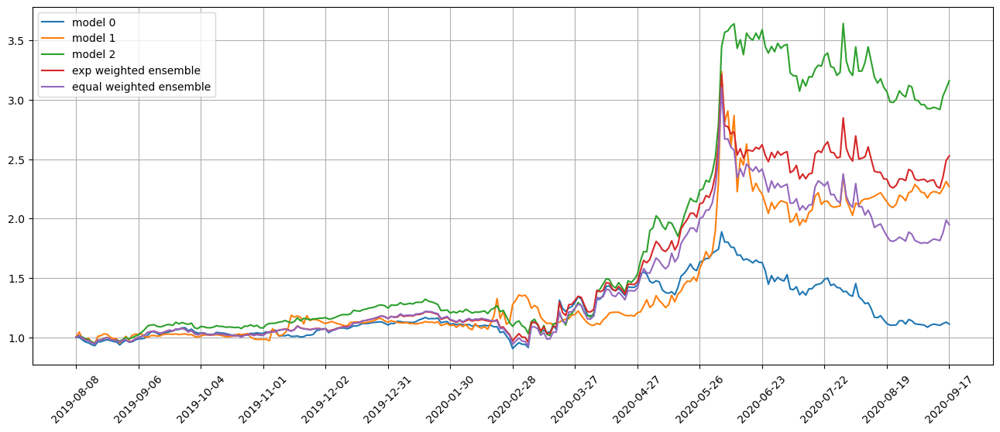

Standardization data are from 2019-02-14 to 2019-11-27
Training data are from 2019-11-29 to 2020-09-15
Testing data are from 2020-08-19 to 2020-10-13
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 15 out of 67 iterations
Restoring model weights from the end of the best epoch: 16.
Epoch 36: early stopping
Restoring model weights from the end of the best epoch: 12.
Epoch 32: early stopping
Restoring model weights from the end of the best epoch: 25.
Epoch 45: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 0.037243641912937164
11/11 [==============================] - 0s 3ms/step
Model 0 test loss 0.03329332172870636
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 0.03747163340449333
11/11 [==============================] - 0s 3ms/step
Model 1 test loss 0.033808834850788116
96/96 [==============================] - 0s 3ms/step
Model 2 training loss 0

position on 2020-09-22 market open will be {'KODK': 0.3025426125450417, 'ASR': 0.18024587904202782, 'URBN': 0.18494408018665764, 'ROST': 0.1810275039520369, 'MAR': 0.1768723399257448, 'H': 0.17527250325450666, 'DRI': 0.18578639264103786, 'VNO': 0.17575356579665782, 'DRH': 0.17197207555999178, 'PLNT': 0.18274074819167274}
Total asset on 2020-09-22 will be 1.9171577010953629
It should be the same as 1.917157701095376
Testing data from 2020-08-24 to 2020-09-21 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2020-09-22 are ['VRNT', 'KRG', 'INO', 'HOLX', 'GIB', 'TOON', 'TSLA', 'MFA', 'SAVA', 'KODK']
position on 2020-09-23 market open will be {'KODK': 0.11647159555682977, 'TOON': 0.12763910395989914, 'MFA': 0.11170150110942434, 'TSLA': 0.10132462051439564, 'INO': 0.10154750808366728, 'HOLX': 0.1135032884211019, 'GIB': 0.1135407603146172, 'SAVA': 0.10939706886217578, 'KRG': 0.10991901788055727, 'VRNT': 0.11445301679464065}
Total asset on 2020-09-23 will be 1.119497481497298

top_stocks by model 0 to buy on 2020-09-25 are ['HOLX', 'INO', 'DGX', 'TSLA', 'CIEN', 'ICF', 'TOON', 'MFA', 'SAVA', 'KODK']
position on 2020-09-28 market open will be {'KODK': 0.11169816279291982, 'TOON': 0.13207872073324745, 'MFA': 0.10731323196180581, 'INO': 0.07461382849573876, 'TSLA': 0.12223416020754817, 'ICF': 0.1106778447449425, 'SAVA': 0.11718470626646156, 'HOLX': 0.11150402141180732, 'DGX': 0.11069058941345326, 'CIEN': 0.10914550764814367}
Total asset on 2020-09-28 will be 1.1071407736760586
It should be the same as 1.1071407736760683
top_stocks by model 1 to buy on 2020-09-25 are ['FIBK', 'IOVA', 'DOG', 'IAT', 'CEF', 'PODD', 'VNO', 'RELX', 'WAFD', 'XYLD']
position on 2020-09-28 market open will be {'DOG': 0.2009118709135828, 'IOVA': 0.21102771856138197, 'VNO': 0.21935490885953984, 'PODD': 0.21660005659676146, 'XYLD': 0.207892474346757, 'WAFD': 0.21305954002789254, 'IAT': 0.21405505226420246, 'RELX': 0.2128977024851547, 'FIBK': 0.21461567227594902, 'CEF': 0.20877369656031072}


Testing data from 2020-09-01 to 2020-09-29 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2020-09-30 are ['SDS', 'SPXS', 'AVNT', 'INO', 'PSQ', 'W', 'TOON', 'TSLA', 'MFA', 'KODK']
position on 2020-10-01 market open will be {'KODK': 0.105970057133109, 'TOON': 0.134298539704803, 'MFA': 0.10651536484405696, 'TSLA': 0.12688034086288896, 'SPXS': 0.10346803228407112, 'INO': 0.11328126350473426, 'SDS': 0.10505571104816087, 'W': 0.10791083390772131, 'AVNT': 0.10518407394756792, 'PSQ': 0.10573684818327538}
Total asset on 2020-10-01 will be 1.1143010654203798
It should be the same as 1.1143010654203889
top_stocks by model 1 to buy on 2020-09-30 are ['SH', 'RWM', 'PSQ', 'TWM', 'QID', 'SDOW', 'TZA', 'SDS', 'SPXU', 'SPXS']
position on 2020-10-01 market open will be {'SPXU': 0.20569474829978285, 'QID': 0.20540011490549787, 'RWM': 0.21066737436842461, 'SPXS': 0.20295201810749897, 'SDOW': 0.20188044393221874, 'SDS': 0.2060662419132999, 'PSQ': 0.20740228893311677, 'TZA': 0.2078579505

top_stocks by model 0 to buy on 2020-10-05 are ['TSLA', 'PSQ', 'JKHY', 'SDS', 'SH', 'INO', 'MFA', 'TOON', 'SAVA', 'KODK']
position on 2020-10-06 market open will be {'KODK': 0.10704407978950713, 'MFA': 0.11210043466829872, 'TSLA': 0.12199523869817175, 'INO': 0.11472862923736758, 'TOON': 0.10898042193967677, 'SDS': 0.10585612707124775, 'PSQ': 0.10715857822347337, 'SAVA': 0.11587072664012195, 'JKHY': 0.10836865443985595, 'SH': 0.10718902608676179}
Total asset on 2020-10-06 will be 1.1092919167944737
It should be the same as 1.1092919167944828
top_stocks by model 1 to buy on 2020-10-05 are ['SPXS', 'TWM', 'TWO', 'SPXU', 'FAZ', 'VIRT', 'SDOW', 'MMYT', 'JKHY', 'BMRN']
position on 2020-10-06 market open will be {'BMRN': 0.20574678109005348, 'SPXS': 0.21120157416999996, 'MMYT': 0.21299918339349747, 'SDOW': 0.20995018947926317, 'VIRT': 0.21860338568668428, 'SPXU': 0.21150931165532844, 'FAZ': 0.21010788531502606, 'JKHY': 0.21855981817973513, 'TWO': 0.22097020465625183, 'TWM': 0.2080151751413886

Testing data from 2020-09-10 to 2020-10-07 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2020-10-08 are ['AXS', 'TSLA', 'PAYX', 'DGX', 'RVNC', 'DIN', 'INTU', 'TOON', 'MFA', 'KODK']
position on 2020-10-09 market open will be {'KODK': 0.10585071875334608, 'MFA': 0.11449403602154519, 'TSLA': 0.12382031123289837, 'TOON': 0.12118984143600076, 'DGX': 0.10873881773874422, 'INTU': 0.1135540659907128, 'DIN': 0.11585865689557624, 'AXS': 0.11457752914833298, 'RVNC': 0.1156635430409503, 'PAYX': 0.114213574047106}
Total asset on 2020-10-09 will be 1.1479610943052034
It should be the same as 1.147961094305213
top_stocks by model 1 to buy on 2020-10-08 are ['MDB', 'SMFG', 'GM', 'JACK', 'AZPN', 'VRSN', 'CSX', 'INTC', 'JKHY', 'EWM']
position on 2020-10-09 market open will be {'AZPN': 0.21528443750310788, 'SMFG': 0.2100322442537298, 'INTC': 0.21444404098737732, 'CSX': 0.2093305992414361, 'JACK': 0.21353605409733714, 'VRSN': 0.2145549037300343, 'GM': 0.2145379408864869, 'MDB': 0.2098

top_stocks by model 0 to buy on 2020-10-13 are ['GM', 'CHDN', 'MGM', 'DGX', 'INO', 'CENN', 'TSLA', 'TOON', 'MFA', 'KODK']
position on 2020-10-14 market open will be {'KODK': 0.11515889614090583, 'MFA': 0.11688764688611794, 'TSLA': 0.12947690414208382, 'TOON': 0.1329470669186093, 'DGX': 0.11287301301803358, 'INO': 0.11616412079322394, 'CHDN': 0.11414800612530285, 'GM': 0.11176087513408885, 'MGM': 0.11177591033743359, 'CENN': 0.10583603919372078}
Total asset on 2020-10-14 will be 1.1670284786895115
It should be the same as 1.1670284786895204
top_stocks by model 1 to buy on 2020-10-13 are ['FUN', 'CHDN', 'INTC', 'LUV', 'JKHY', 'RRR', 'FI', 'DGX', 'WGO', 'MGM']
position on 2020-10-14 market open will be {'DGX': 0.21316377791662028, 'RRR': 0.2184083654102376, 'FI': 0.20568860168304667, 'INTC': 0.2085916643684524, 'CHDN': 0.21373950107979287, 'WGO': 0.22000752504590257, 'LUV': 0.2125745646626851, 'MGM': 0.20929780658662672, 'FUN': 0.19815915894782776, 'JKHY': 0.2078766818687901}
Total asset 

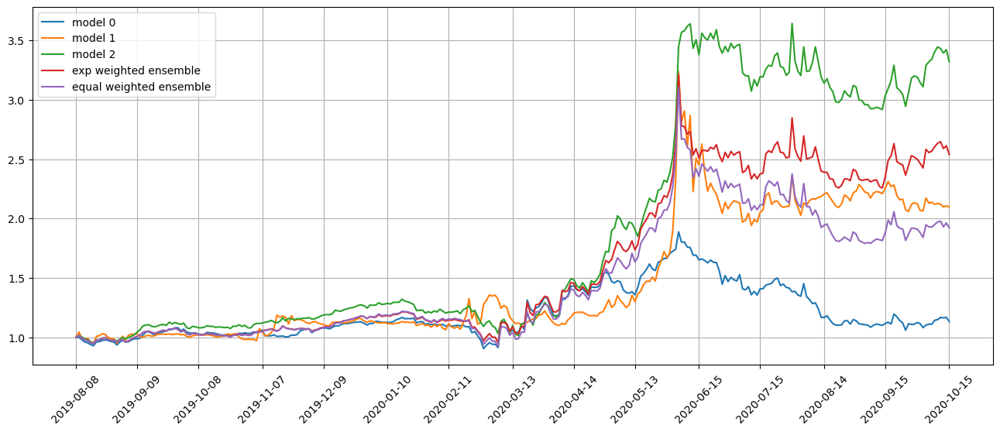

Standardization data are from 2019-03-15 to 2019-12-27
Training data are from 2019-12-30 to 2020-10-13
Testing data are from 2020-09-17 to 2020-11-10
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 16 out of 67 iterations
Restoring model weights from the end of the best epoch: 16.
Epoch 36: early stopping
Restoring model weights from the end of the best epoch: 16.
Epoch 36: early stopping
Restoring model weights from the end of the best epoch: 6.
Epoch 26: early stopping
96/96 [==============================] - 0s 4ms/step
Model 0 training loss 0.03870917111635208
11/11 [==============================] - 0s 3ms/step
Model 0 test loss 0.04008612409234047
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 0.03807593509554863
11/11 [==============================] - 0s 3ms/step
Model 1 test loss 0.03992708399891853
96/96 [==============================] - 0s 3ms/step
Model 2 training loss 0.04

position on 2020-10-20 market open will be {'KODK': 0.25665573160713656, 'MFA': 0.24628984414249414, 'GEVO': 0.23558785399659066, 'LUV': 0.2617678608665808, 'WING': 0.2501414153915344, 'WGO': 0.255805689825462, 'CHDN': 0.24804265798452496, 'W': 0.25594151523005115, 'HXL': 0.24406094972433834, 'ASML': 0.2518499086988382}
Total asset on 2020-10-20 will be 2.5061434274675474
It should be the same as 2.5061434274675514
top_stocks by equal weighted ensemble to buy on 2020-10-19 are ['WING', 'W', 'ACN', 'ASML', 'WGO', 'MFA', 'CHDN', 'GEVO', 'HXL', 'KODK']
position on 2020-10-20 market open will be {'KODK': 0.27352753632692994, 'MFA': 0.17778801247059967, 'GEVO': 0.1733378260690788, 'WING': 0.18059072660570055, 'WGO': 0.18468007516126045, 'CHDN': 0.17907551919989104, 'W': 0.1847781349266451, 'ACN': 0.18152182065418287, 'HXL': 0.17620090690622703, 'ASML': 0.18182418107897938}
Total asset on 2020-10-20 will be 1.8933247393994797
It should be the same as 1.8933247393994945
Testing data from 2020

position on 2020-10-23 market open will be {'KODK': 0.25811327078083257, 'VFC': 0.18469520440499199, 'HXL': 0.18580969040454873, 'VNO': 0.18736491157658156, 'SLG': 0.18021316207524765, 'RLJ': 0.18619128343253138, 'OKE': 0.19558547595127287, 'H': 0.19033773251589417, 'RHP': 0.19340965154044523, 'SYF': 0.18693271375935158}
Total asset on 2020-10-23 will be 1.948653096441682
It should be the same as 1.9486530964416977
Testing data from 2020-09-25 to 2020-10-22 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2020-10-23 are ['PAYX', 'PKG', 'H', 'ALLY', 'CACC', 'FI', 'PBA', 'BXMT', 'ARI', 'KODK']
position on 2020-10-26 market open will be {'KODK': 0.09976459795424639, 'FI': 0.1128860858460915, 'ARI': 0.11498543415889219, 'PAYX': 0.11323500694245428, 'CACC': 0.11363466311706132, 'H': 0.1112382640968166, 'PBA': 0.11068047267553512, 'ALLY': 0.11341460391687919, 'BXMT': 0.11450092418886777, 'PKG': 0.11433307885468555}
Total asset on 2020-10-26 will be 1.11867313175152
It shoul

Testing data from 2020-09-30 to 2020-10-27 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2020-10-28 are ['CW', 'TSLA', 'KOS', 'MSFT', 'MFA', 'QRTEA', 'WEX', 'CODX', 'RTX', 'KODK']
position on 2020-10-29 market open will be {'KODK': 0.08639900670062015, 'CW': 0.11225644346007606, 'WEX': 0.10984845727233633, 'KOS': 0.10798209462505412, 'TSLA': 0.1133777551858258, 'MSFT': 0.11318422820743558, 'QRTEA': 0.11194093283566489, 'RTX': 0.109547056445342, 'CODX': 0.1127761220821069, 'MFA': 0.11147866669399427}
Total asset on 2020-10-29 will be 1.0887907635084457
It should be the same as 1.088790763508456
top_stocks by model 1 to buy on 2020-10-28 are ['QRTEA', 'LYB', 'ATI', 'CW', 'KOS', 'COTY', 'PAA', 'SHOO', 'RTX', 'PAGP']
position on 2020-10-29 market open will be {'PAGP': 0.20849195821433025, 'CW': 0.21976522009203828, 'KOS': 0.21139729765012674, 'ATI': 0.22081438477449175, 'QRTEA': 0.21914754274828957, 'RTX': 0.21446103428982813, 'SHOO': 0.22187828336170326, 'COTY': 0.222

Testing data from 2020-10-05 to 2020-10-30 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2020-11-02 are ['AMLP', 'CINF', 'NTR', 'H', 'DBO', 'BNO', 'ARCB', 'IART', 'CODX', 'KODK']
position on 2020-11-03 market open will be {'KODK': 0.08401229600903229, 'CODX': 0.11219565138655796, 'CINF': 0.11417302990321616, 'DBO': 0.11950678013160614, 'H': 0.11387023425641483, 'AMLP': 0.11286925684174963, 'BNO': 0.11914349981872975, 'ARCB': 0.11998463116692949, 'NTR': 0.10952004295325304, 'IART': 0.1131830486631804}
Total asset on 2020-11-03 will be 1.1184584711306593
It should be the same as 1.1184584711306698
top_stocks by model 1 to buy on 2020-11-02 are ['PDBC', 'ARCB', 'FTGC', 'DBO', 'GSG', 'RITM', 'LYB', 'BNO', 'WMB', 'TNL']
position on 2020-11-03 market open will be {'LYB': 0.22827771634178956, 'GSG': 0.22761003269209626, 'DBO': 0.23487799106984755, 'RITM': 0.23150865469044732, 'ARCB': 0.2358171569572039, 'BNO': 0.23416400187199898, 'WMB': 0.2144503041597449, 'TNL': 0.22811

Testing data from 2020-10-08 to 2020-11-04 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2020-11-05 are ['DPST', 'CENN', 'TSLA', 'MFA', 'CACC', 'RWT', 'ALT', 'CODX', 'MRIN', 'KODK']
position on 2020-11-06 market open will be {'KODK': 0.0852056513548262, 'CODX': 0.11891246783118949, 'MFA': 0.12080849640933607, 'CENN': 0.12121071988199991, 'ALT': 0.12182932531326633, 'RWT': 0.11564086794200605, 'CACC': 0.11721962325668804, 'TSLA': 0.11677374692381097, 'DPST': 0.13133388547276853, 'MRIN': 0.1198981141947662}
Total asset on 2020-11-06 will be 1.168832898580647
It should be the same as 1.1688328985806575
top_stocks by model 1 to buy on 2020-11-05 are ['LUV', 'OKE', 'WING', 'TSLA', 'CACC', 'DAL', 'UA', 'UAA', 'ALT', 'RWT']
position on 2020-11-06 market open will be {'ALT': 0.2479805900651932, 'RWT': 0.23179753341900905, 'OKE': 0.22851492461181824, 'WING': 0.2301088083567042, 'TSLA': 0.23406834440752836, 'CACC': 0.2349620858331172, 'LUV': 0.2374590926558612, 'DAL': 0.2359

top_stocks by model 1 to buy on 2020-11-10 are ['NOW', 'PINC', 'NTNX', 'RH', 'CVNA', 'TSLA', 'ALT', 'ANGI', 'THO', 'AIV']
position on 2020-11-11 market open will be {'ALT': 0.19373483841948408, 'NTNX': 0.23790336873478962, 'AIV': 0.2566442670816337, 'CVNA': 0.24937863775850852, 'PINC': 0.24230189270283703, 'TSLA': 0.24356523821653217, 'NOW': 0.2447917331479351, 'THO': 0.2574142573642327, 'ANGI': 0.25164433627665206, 'RH': 0.2515861896971824}
Total asset on 2020-11-11 will be 2.4289647593997796
It should be the same as 2.428964759399787
top_stocks by model 2 to buy on 2020-11-10 are ['EBAY', 'THO', 'JETS', 'BLNK', 'TOON', 'KNDI', 'ALT', 'GEVO', 'MFA', 'KODK']
position on 2020-11-11 market open will be {'KODK': 0.2362524569902278, 'GEVO': 0.29833282810399514, 'MFA': 0.375988267528358, 'KNDI': 0.3281934882496539, 'ALT': 0.292401246581912, 'TOON': 0.33459757999626555, 'BLNK': 0.3699313730387907, 'EBAY': 0.3650308530960199, 'JETS': 0.36887830491646784, 'THO': 0.38552455419878484}
Total asse

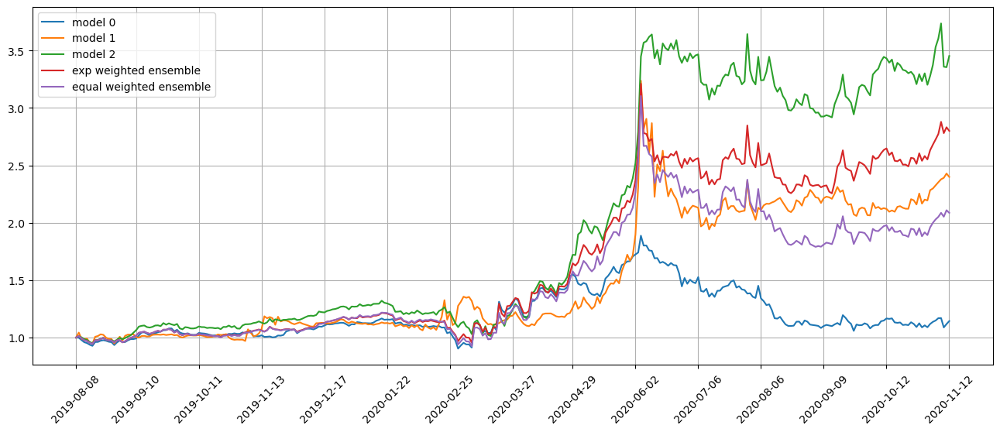

Standardization data are from 2019-04-12 to 2020-01-28
Training data are from 2020-01-29 to 2020-11-10
Testing data are from 2020-10-15 to 2020-12-09
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 17 out of 67 iterations
Restoring model weights from the end of the best epoch: 1.
Epoch 21: early stopping
Restoring model weights from the end of the best epoch: 27.
Epoch 47: early stopping
Restoring model weights from the end of the best epoch: 1.
Epoch 21: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 0.03936221823096275
11/11 [==============================] - 0s 3ms/step
Model 0 test loss 0.028982479125261307
96/96 [==============================] - 0s 4ms/step
Model 1 training loss 0.03812386468052864
11/11 [==============================] - 0s 3ms/step
Model 1 test loss 0.02948388271033764
96/96 [==============================] - 0s 3ms/step
Model 2 training loss 0.04

Testing data from 2020-10-20 to 2020-11-16 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2020-11-17 are ['PZZA', 'MHO', 'MXL', 'KNDI', 'ACGL', 'MNRO', 'LULU', 'JETS', 'DPST', 'KODK']
position on 2020-11-18 market open will be {'KODK': 0.08783103880594002, 'MNRO': 0.1280727036409848, 'LULU': 0.1312724468118963, 'MXL': 0.13096719305392376, 'PZZA': 0.12482339927213038, 'JETS': 0.1312731049856108, 'DPST': 0.13707317091623644, 'MHO': 0.12830427430133168, 'ACGL': 0.13055521325828318, 'KNDI': 0.15791905413331972}
Total asset on 2020-11-18 will be 1.2880915991796453
It should be the same as 1.288091599179657
top_stocks by model 1 to buy on 2020-11-17 are ['MHO', 'LGND', 'POR', 'MEDP', 'MXL', 'GIL', 'CHTR', 'SMG', 'ANSS', 'LULU']
position on 2020-11-18 market open will be {'MXL': 0.25893282673244467, 'LULU': 0.25437197496023684, 'SMG': 0.25032594538232233, 'MEDP': 0.254592401935512, 'LGND': 0.25437755043253785, 'CHTR': 0.25081732448240646, 'POR': 0.2484588573549348, 'MHO': 

Testing data from 2020-10-23 to 2020-11-19 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2020-11-20 are ['BFH', 'MTB', 'AXP', 'FRT', 'HXL', 'MODG', 'ROIC', 'RLJ', 'PARR', 'KODK']
position on 2020-11-23 market open will be {'KODK': 0.08699568721870071, 'HXL': 0.1318399037737589, 'PARR': 0.13365602109057229, 'AXP': 0.1342435717482163, 'RLJ': 0.12832718301520826, 'MODG': 0.13720881282064576, 'BFH': 0.13448336392707677, 'MTB': 0.1346391114622081, 'FRT': 0.13528362450335316, 'ROIC': 0.13717593519905236}
Total asset on 2020-11-23 will be 1.2938532147587813
It should be the same as 1.2938532147587924
top_stocks by model 1 to buy on 2020-11-20 are ['INDB', 'EPR', 'BFH', 'MTB', 'PARR', 'GRFS', 'SON', 'SYF', 'NEU', 'SAP']
position on 2020-11-23 market open will be {'GRFS': 0.24955701817891016, 'SYF': 0.25190185503247614, 'PARR': 0.25106861936735597, 'EPR': 0.26179266063442164, 'SON': 0.2529861657405721, 'SAP': 0.25218154032438417, 'BFH': 0.25262275678675356, 'MTB': 0.2529153

top_stocks by model 0 to buy on 2020-11-25 are ['KMT', 'FNB', 'VMC', 'CBSH', 'VLY', 'MLM', 'MJ', 'ERJ', 'BGC', 'KODK']
position on 2020-11-27 market open will be {'KODK': 0.09725854888289562, 'BGC': 0.15433765337081132, 'VMC': 0.12868503408608598, 'ERJ': 0.1306259554634048, 'KMT': 0.12613636817176438, 'MLM': 0.12851697471305862, 'FNB': 0.12760424900905457, 'MJ': 0.13018494747658307, 'CBSH': 0.12922186590717918, 'VLY': 0.12924127669730923}
Total asset on 2020-11-27 will be 1.2818128737781356
It should be the same as 1.2818128737781467
top_stocks by model 1 to buy on 2020-11-25 are ['PBF', 'MTZ', 'BDN', 'FULT', 'AER', 'VLY', 'FIBK', 'FNB', 'CBU', 'UBSI']
position on 2020-11-27 market open will be {'BDN': 0.2590405338000655, 'FULT': 0.2572469383125484, 'UBSI': 0.2568916569220371, 'MTZ': 0.2566956657557237, 'PBF': 0.26393985058946307, 'FIBK': 0.2581650728217778, 'FNB': 0.2586352458660514, 'CBU': 0.2563241494336122, 'AER': 0.2512031022777885, 'VLY': 0.26195326279675124}
Total asset on 2020-

top_stocks by model 0 to buy on 2020-12-01 are ['OXM', 'ALT', 'AHT', 'KOS', 'FNKO', 'PBA', 'AIV', 'QRTEA', 'KODK', 'CENN']
position on 2020-12-02 market open will be {'OXM': 0.13086237067006193, 'CENN': 0.10351360766141439, 'KODK': 0.12109643205545363, 'AIV': 0.1411121560907011, 'KOS': 0.11035816205275852, 'QRTEA': 0.12091606709592835, 'PBA': 0.1216156358933036, 'FNKO': 0.12568430688123866, 'ALT': 0.11774828067147923, 'AHT': 0.11162939025078798}
Total asset on 2020-12-02 will be 1.2045364093231161
It should be the same as 1.2045364093231272
top_stocks by model 1 to buy on 2020-12-01 are ['NWN', 'DGX', 'LRN', 'POOL', 'FNKO', 'BLNK', 'NFG', 'QRTEA', 'PARR', 'AIV']
position on 2020-12-02 market open will be {'POOL': 0.2551041353023591, 'PARR': 0.2550096746843029, 'AIV': 0.28457532683056164, 'QRTEA': 0.24384666967155383, 'NFG': 0.24733877874679613, 'LRN': 0.24950100414155274, 'DGX': 0.25254928621906547, 'FNKO': 0.2534625910273227, 'BLNK': 0.19462499224804478, 'NWN': 0.2499484300672375}
Tot

Testing data from 2020-11-05 to 2020-12-03 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2020-12-04 are ['QID', 'PGRE', 'PZZA', 'ZOM', 'KNDI', 'BKD', 'PSQ', 'OXM', 'KODK', 'CENN']
position on 2020-12-07 market open will be {'CENN': 0.10412644158091036, 'KODK': 0.21289260051445227, 'OXM': 0.12630516971054945, 'ZOM': 0.12334313530945215, 'PZZA': 0.12297898118654021, 'BKD': 0.12390378537766525, 'PGRE': 0.12270272199501613, 'PSQ': 0.12292923217082982, 'QID': 0.1222085778845581, 'KNDI': 0.12273702714002709}
Total asset on 2020-12-07 will be 1.304127672869989
It should be the same as 1.3041276728700006
top_stocks by model 1 to buy on 2020-12-04 are ['BKU', 'SDS', 'SH', 'AWI', 'PZZA', 'PSQ', 'KMT', 'BKD', 'OXM', 'QID']
position on 2020-12-07 market open will be {'BKU': 0.2564374359015375, 'AWI': 0.25573370798369466, 'OXM': 0.25738576966432447, 'PZZA': 0.2506076338583024, 'BKD': 0.25249220785528925, 'SDS': 0.24864079514548632, 'KMT': 0.25904831293785013, 'PSQ': 0.250506254

top_stocks by model 1 to buy on 2020-12-09 are ['WTS', 'STAG', 'MHO', 'NSA', 'AGIO', 'REXR', 'CUBE', 'BTU', 'EXR', 'CXW']
position on 2020-12-10 market open will be {'STAG': 0.24009430015517405, 'BTU': 0.21935201713339034, 'CXW': 0.23676961087425233, 'AGIO': 0.22254903658183445, 'NSA': 0.24289161070368054, 'REXR': 0.24111650759664713, 'CUBE': 0.24500311575383737, 'WTS': 0.24152696253642875, 'EXR': 0.24131793234993998, 'MHO': 0.24041604376129125}
Total asset on 2020-12-10 will be 2.3710371374464643
It should be the same as 2.371037137446476
top_stocks by model 2 to buy on 2020-12-09 are ['PHM', 'WGO', 'KBH', 'KNDI', 'AKAM', 'MHO', 'NWN', 'CXW', 'EXR', 'PBA']
position on 2020-12-10 market open will be {'KNDI': 0.37025488163281767, 'CXW': 0.3722135853165384, 'WGO': 0.36506280298730714, 'AKAM': 0.38296305003262016, 'NWN': 0.38291418855088954, 'PBA': 0.38143904566201653, 'EXR': 0.3793637725275865, 'MHO': 0.3779459588820875, 'KBH': 0.3751590759643136, 'PHM': 0.3772065294673598}
Total asset o

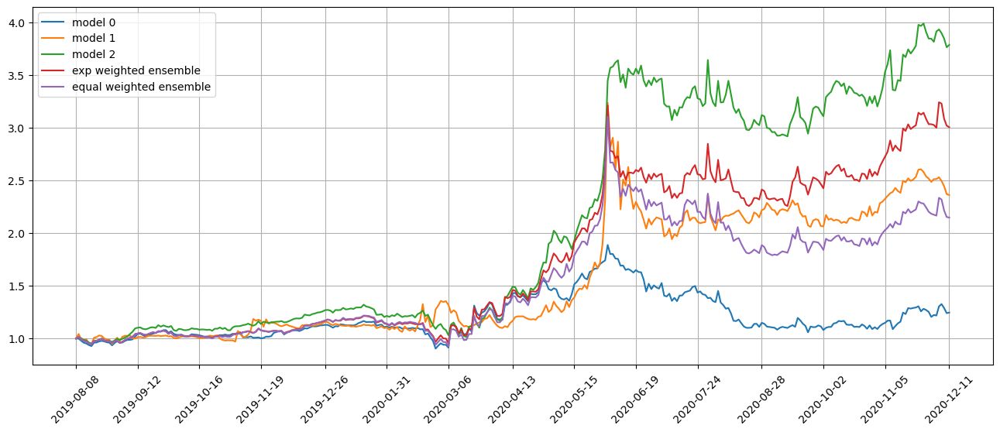

Standardization data are from 2019-05-13 to 2020-02-26
Training data are from 2020-02-27 to 2020-12-09
Testing data are from 2020-11-12 to 2021-01-08
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 18 out of 67 iterations
Restoring model weights from the end of the best epoch: 4.
Epoch 24: early stopping
Restoring model weights from the end of the best epoch: 10.
Epoch 30: early stopping
Restoring model weights from the end of the best epoch: 1.
Epoch 21: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 0.03608279302716255
11/11 [==============================] - 0s 3ms/step
Model 0 test loss 0.031206637620925903
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 0.03532622009515762
11/11 [==============================] - 0s 3ms/step
Model 1 test loss 0.03123505599796772
96/96 [==============================] - 0s 4ms/step
Model 2 training loss 0.03

position on 2020-12-16 market open will be {'EPR': 0.37477244709360796, 'OXM': 0.3773607434657064, 'CXW': 0.3594893410771106, 'EAT': 0.3617294134845248, 'DBI': 0.3834375828110699, 'WU': 0.3749396822635339, 'BXMT': 0.3718388292725147, 'COLM': 0.3735030610022322, 'CRI': 0.3829172760815236, 'KOLD': 0.3642675704839274}
Total asset on 2020-12-16 will be 3.724255947035736
It should be the same as 3.7242559470357515
top_stocks by return weighted ensemble to buy on 2020-12-15 are ['MANU', 'CXW', 'SSYS', 'PMT', 'TRP', 'EPR', 'DBI', 'CRI', 'COLM', 'OXM']
position on 2020-12-16 market open will be {'EPR': 0.2973615366105995, 'OXM': 0.30057981972414793, 'CXW': 0.2863446800038712, 'PMT': 0.29269109180484004, 'TRP': 0.29317532301690685, 'SSYS': 0.2875819317278308, 'DBI': 0.3054202153046383, 'COLM': 0.29750705309565667, 'MANU': 0.29171310104919573, 'CRI': 0.3050057744660604}
Total asset on 2020-12-16 will be 2.9573805268037408
It should be the same as 2.957380526803748
top_stocks by equal weighted en

position on 2020-12-21 market open will be {'FIS': 0.29353582020058805, 'SAH': 0.28458590554925545, 'SLV': 0.3022645321379434, 'AGQ': 0.3028375088873511, 'SSRM': 0.2975755028211338, 'SIVR': 0.3024585378619837, 'NEM': 0.2959814853100755, 'PLNT': 0.2943186181918218, 'JKHY': 0.2923721752977728, 'SUM': 0.2931347218167143}
Total asset on 2020-12-21 will be 2.959064808074633
It should be the same as 2.95906480807464
top_stocks by equal weighted ensemble to buy on 2020-12-18 are ['FIS', 'SSRM', 'SIVR', 'SUM', 'SAH', 'NEM', 'PLNT', 'JKHY', 'SLV', 'AGQ']
position on 2020-12-21 market open will be {'FIS': 0.20887484491781902, 'SAH': 0.20232750962512744, 'SLV': 0.21489620126281897, 'AGQ': 0.21530356141847043, 'SSRM': 0.211562516755857, 'SIVR': 0.21503413042316277, 'NEM': 0.21042924350857928, 'PLNT': 0.20924702135241013, 'JKHY': 0.20786318984248212, 'SUM': 0.20840532539853848}
Total asset on 2020-12-21 will be 2.10394354450525
It should be the same as 2.103943544505266
Testing data from 2020-11-20

position on 2020-12-24 market open will be {'MKL': 0.21042374206758474, 'MTH': 0.20812552166972398, 'SHAK': 0.20922633771624077, 'DXCM': 0.21028734187753, 'HCC': 0.21283171740076295, 'VRTX': 0.21224289163205579, 'FNV': 0.21272534391454206, 'NDSN': 0.20784366809102284, 'FIS': 0.2094454656566928, 'SATS': 0.21663434185666525}
Total asset on 2020-12-24 will be 2.109786371882805
It should be the same as 2.109786371882821
Testing data from 2020-11-25 to 2020-12-23 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2020-12-24 are ['ODFL', 'VRSK', 'PLUG', 'SPGI', 'JKHY', 'KNDI', 'DXCM', 'BLNK', 'CLDX', 'MRIN']
position on 2020-12-28 market open will be {'MRIN': 0.1321777978035327, 'KNDI': 0.10585307605463717, 'CLDX': 0.12508744828299714, 'DXCM': 0.12223941624949472, 'VRSK': 0.12463559836568748, 'ODFL': 0.12423764600028855, 'PLUG': 0.12848571356148347, 'SPGI': 0.1250125435486722, 'BLNK': 0.14504223693863938, 'JKHY': 0.12492830103128251}
Total asset on 2020-12-28 will be 1.257699

Testing data from 2020-12-01 to 2020-12-29 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2020-12-30 are ['QSR', 'RUSHA', 'PAG', 'HIG', 'SEIC', 'HRB', 'AGO', 'BJRI', 'KNDI', 'MRIN']
position on 2020-12-31 market open will be {'MRIN': 0.1373109216106841, 'KNDI': 0.10702596923042457, 'HIG': 0.1241426422153715, 'AGO': 0.12296637765981709, 'SEIC': 0.12431746045078061, 'RUSHA': 0.12397297862554671, 'HRB': 0.12151391799568459, 'PAG': 0.1252748004507126, 'BJRI': 0.12320065590765386, 'QSR': 0.12413631084871533}
Total asset on 2020-12-31 will be 1.233862034995378
It should be the same as 1.2338620349953908
top_stocks by model 1 to buy on 2020-12-30 are ['RUSHA', 'RGA', 'LEN', 'MTH', 'FAF', 'AXS', 'HIG', 'BP', 'EXPRQ', 'AGO']
position on 2020-12-31 market open will be {'HIG': 0.23614792642968488, 'MTH': 0.2318715538763325, 'FAF': 0.23221515091441347, 'AXS': 0.23412686648224693, 'LEN': 0.23234280441937927, 'RUSHA': 0.23582518716610265, 'EXPRQ': 0.2410059949190373, 'RGA': 0.233

Testing data from 2020-12-04 to 2021-01-04 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2021-01-05 are ['RHI', 'MMS', 'ASH', 'CRI', 'BLNK', 'PBH', 'LIN', 'ZBH', 'MRIN', 'AIV']
position on 2021-01-06 market open will be {'MRIN': 0.12832796259711185, 'PBH': 0.11940787415175896, 'LIN': 0.11937295018735948, 'MMS': 0.1206492030028077, 'AIV': 0.11692200594201459, 'CRI': 0.11987460749768654, 'RHI': 0.12117890286214669, 'ZBH': 0.11962527157507132, 'ASH': 0.12462613608187344, 'BLNK': 0.1406326651126664}
Total asset on 2021-01-06 will be 1.230617579010484
It should be the same as 1.230617579010497
top_stocks by model 1 to buy on 2021-01-05 are ['JJSF', 'EXPRQ', 'PBH', 'CRI', 'APLE', 'RHI', 'AWI', 'CIM', 'CBRL', 'BFAM']
position on 2021-01-06 market open will be {'CBRL': 0.22983090754622676, 'PBH': 0.23300171177053566, 'AWI': 0.24106641130624268, 'APLE': 0.2359380789474404, 'JJSF': 0.2306387501302302, 'RHI': 0.2364575368075902, 'EXPRQ': 0.23912607564953828, 'BFAM': 0.2350939

top_stocks by model 0 to buy on 2021-01-08 are ['CELH', 'CHTR', 'KODK', 'KNDI', 'FIS', 'GLPG', 'ERY', 'ARCT', 'BLNK', 'MRIN']
position on 2021-01-11 market open will be {'MRIN': 0.13474436480640353, 'BLNK': 0.13579688041645385, 'KODK': 0.11727542665893205, 'CELH': 0.1278900735264836, 'ARCT': 0.1176714571510393, 'GLPG': 0.12280098495917614, 'KNDI': 0.12663814702423457, 'CHTR': 0.12575972894721976, 'FIS': 0.12471996640179384, 'ERY': 0.13170068894010525}
Total asset on 2021-01-11 will be 1.2649977188318293
It should be the same as 1.2649977188318422
top_stocks by model 1 to buy on 2021-01-08 are ['DEO', 'TWM', 'LEN', 'CBRL', 'RACE', 'HMY', 'FAZ', 'FIS', 'CHTR', 'SAP']
position on 2021-01-11 market open will be {'DEO': 0.2328776283769974, 'CBRL': 0.23777408014629126, 'HMY': 0.22558762407416816, 'SAP': 0.2354385051522136, 'LEN': 0.2291488712815132, 'FAZ': 0.24908173863318894, 'RACE': 0.23490076797368487, 'CHTR': 0.24413200478721755, 'FIS': 0.24211355804880239, 'TWM': 0.2497665780034377}
Tot

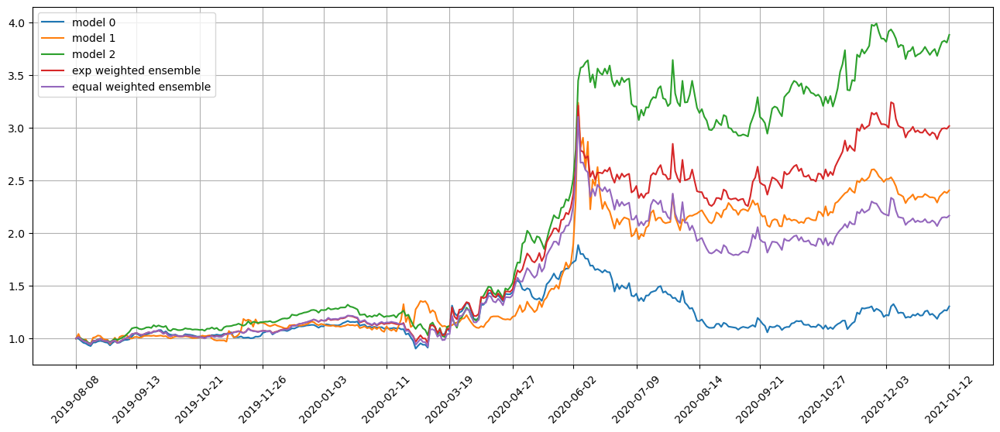

Standardization data are from 2019-06-11 to 2020-03-25
Training data are from 2020-03-26 to 2021-01-08
Testing data are from 2020-12-11 to 2021-02-08
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 19 out of 67 iterations
Restoring model weights from the end of the best epoch: 7.
Epoch 27: early stopping
Restoring model weights from the end of the best epoch: 9.
Epoch 29: early stopping
Restoring model weights from the end of the best epoch: 3.
Epoch 23: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 0.035211581736803055
11/11 [==============================] - 0s 3ms/step
Model 0 test loss 0.03243712708353996
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 0.035206735134124756
11/11 [==============================] - 0s 3ms/step
Model 1 test loss 0.03309262543916702
96/96 [==============================] - 0s 3ms/step
Model 2 training loss 0.03

position on 2021-01-15 market open will be {'KODK': 0.3102702774574052, 'MRIN': 0.301703408017028, 'KNDI': 0.28562771741872073, 'ANF': 0.29688334505002884, 'OXM': 0.2959605027067025, 'ARCT': 0.28991323794946716, 'WDFC': 0.2909191805599209, 'MLCO': 0.2950339697416186, 'FCFS': 0.30418353566933776, 'KOLD': 0.29226323924729036}
Total asset on 2021-01-15 will be 2.9627584138175127
It should be the same as 2.96275841381752
top_stocks by equal weighted ensemble to buy on 2021-01-14 are ['KOLD', 'OXM', 'MLCO', 'MRIN', 'KODK', 'KNDI', 'ANF', 'ARCT', 'FCFS', 'WDFC']
position on 2021-01-15 market open will be {'MRIN': 0.2166155906100327, 'KNDI': 0.20507364205763204, 'KODK': 0.2254620074691612, 'ANF': 0.21681819633088154, 'OXM': 0.21614423123410567, 'ARCT': 0.211727826409584, 'WDFC': 0.21246248083209535, 'MLCO': 0.21546757082293733, 'FCFS': 0.22214963101504495, 'KOLD': 0.21344406631075935}
Total asset on 2021-01-15 will be 2.155365243092215
It should be the same as 2.1553652430922345
Testing data 

top_stocks by model 0 to buy on 2021-01-21 are ['CELH', 'ERJ', 'PACB', 'CLDX', 'PLUG', 'WDFC', 'ARCT', 'LABU', 'BLNK', 'APPS']
position on 2021-01-22 market open will be {'ARCT': 0.12906865736902132, 'BLNK': 0.11026480659697332, 'APPS': 0.13754407588093878, 'PACB': 0.12063766191077108, 'ERJ': 0.13025651255078255, 'CLDX': 0.128471536169148, 'CELH': 0.13050016608746182, 'WDFC': 0.13706977613319438, 'PLUG': 0.14249290070370707, 'LABU': 0.12443562043447377}
Total asset on 2021-01-22 will be 1.2907417138364596
It should be the same as 1.290741713836472
top_stocks by model 1 to buy on 2021-01-21 are ['MDGL', 'Z', 'UNG', 'WDFC', 'TSLA', 'AIV', 'ENPH', 'FATE', 'APPS', 'LABU']
position on 2021-01-22 market open will be {'UNG': 0.2589208465341605, 'ENPH': 0.27626206107062173, 'MDGL': 0.26475917628202905, 'AIV': 0.26522928940538215, 'TSLA': 0.2615353872892763, 'WDFC': 0.2674808150743903, 'APPS': 0.25177620530641365, 'LABU': 0.24282626058831092, 'FATE': 0.2374942060949745, 'Z': 0.256243328805452}


position on 2021-01-27 market open will be {'ARCT': 0.12915019854720503, 'BLNK': 0.13825886784700137, 'PACB': 0.14628387359629666, 'TMHC': 0.15692008119066966, 'BABA': 0.1679021485973816, 'INTC': 0.1650350927647304, 'APPS': 0.15136401094540533, 'NTLA': 0.15228413916727637, 'GNW': 0.1618064097613603, 'SATS': 0.15997378682649582}
Total asset on 2021-01-27 will be 1.5289786092438098
It should be the same as 1.5289786092438227
top_stocks by model 1 to buy on 2021-01-26 are ['BVN', 'BABA', 'STT', 'FIS', 'INTC', 'ARCT', 'MA', 'TMHC', 'PACB', 'APPS']
position on 2021-01-27 market open will be {'ARCT': 0.24382620569450966, 'PACB': 0.22862984982108522, 'STT': 0.2542487365148297, 'TMHC': 0.2452533810770209, 'BABA': 0.2624174632153623, 'INTC': 0.25793648709453104, 'APPS': 0.23656969315885837, 'BVN': 0.2575452179998288, 'MA': 0.2534737262993365, 'FIS': 0.25730373137720525}
Total asset on 2021-01-27 will be 2.4972044922525516
It should be the same as 2.4972044922525676
top_stocks by model 2 to buy 

position on 2021-02-01 market open will be {'BLNK': 0.12424961479374509, 'APPS': 0.15603857456485948, 'FCEL': 0.14833854545660588, 'RBA': 0.1531616891309011, 'TSLA': 0.15417089318009863, 'CHRW': 0.15110530816402767, 'MRCY': 0.1516949254642594, 'PLUG': 0.1534224938733463, 'EXPRQ': 0.12080018636422607, 'BB': 0.12795368143295474}
Total asset on 2021-02-01 will be 1.4409359124250118
It should be the same as 1.4409359124250245
top_stocks by model 1 to buy on 2021-01-29 are ['CHRW', 'BTG', 'SKX', 'SSB', 'FIBK', 'ECPG', 'HUBG', 'KGC', 'SHOO', 'PLUG']
position on 2021-02-01 market open will be {'BTG': 0.25192609922646714, 'KGC': 0.25885877388746703, 'ECPG': 0.24983918214837914, 'CHRW': 0.24676807161057085, 'PLUG': 0.2505522368129701, 'SKX': 0.2536221916224033, 'SHOO': 0.24986472081940647, 'SSB': 0.2551491096674391, 'HUBG': 0.2490342221786954, 'FIBK': 0.24692356232217846}
Total asset on 2021-02-01 will be 2.5125381702959597
It should be the same as 2.512538170295977
top_stocks by model 2 to buy

top_stocks by model 0 to buy on 2021-02-03 are ['FLEX', 'RIOT', 'RYAAY', 'TTEK', 'SEDG', 'CELH', 'BLNK', 'PACB', 'APPS', 'PLUG']
position on 2021-02-04 market open will be {'BLNK': 0.13093640689011435, 'APPS': 0.18307701679286334, 'RIOT': 0.13132569690233664, 'PACB': 0.11959649364178601, 'SEDG': 0.12311244796152752, 'CELH': 0.12298343315788246, 'PLUG': 0.12828195259615532, 'TTEK': 0.11806610290789135, 'RYAAY': 0.12497928451781357, 'FLEX': 0.12395054203928417}
Total asset on 2021-02-04 will be 1.3063093774076426
It should be the same as 1.3063093774076546
top_stocks by model 1 to buy on 2021-02-03 are ['BBWI', 'FOLD', 'APPS', 'PLUG', 'RIOT', 'CHRW', 'TTEK', 'RYAAY', 'SEDG', 'PACB']
position on 2021-02-04 market open will be {'APPS': 0.30230942992540066, 'RIOT': 0.25262617591584063, 'PACB': 0.2300631601760034, 'FOLD': 0.24020168429278815, 'SEDG': 0.23682666583744014, 'CHRW': 0.2404840483543306, 'PLUG': 0.2467710424372189, 'TTEK': 0.22711920657149018, 'RYAAY': 0.24041782728869185, 'BBWI':

Testing data from 2021-01-08 to 2021-02-05 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2021-02-08 are ['KODK', 'SFIX', 'HRB', 'DQ', 'VRNT', 'IRBT', 'BLNK', 'FIZZ', 'SAVA', 'GME']
position on 2021-02-09 market open will be {'BLNK': 0.13143760572362173, 'DQ': 0.1262751548282614, 'GME': 0.09813040853051559, 'SFIX': 0.1207154612520471, 'HRB': 0.1261109399718465, 'SAVA': 0.13920045019424399, 'IRBT': 0.12950770454888275, 'VRNT': 0.1237327339729488, 'KODK': 0.13014628798958994, 'FIZZ': 0.13092955612569024}
Total asset on 2021-02-09 will be 1.2561863031376357
It should be the same as 1.2561863031376481
top_stocks by model 1 to buy on 2021-02-08 are ['IRBT', 'MED', 'TSLA', 'HRB', 'AMC', 'SFIX', 'VRNT', 'FIZZ', 'SAVA', 'GME']
position on 2021-02-09 market open will be {'TSLA': 0.2462929238849894, 'AMC': 0.20148874679441703, 'GME': 0.1865338793332689, 'SFIX': 0.2294652964360887, 'MED': 0.24287921145076616, 'HRB': 0.23972144018944228, 'SAVA': 0.2646029948157741, 'IRBT': 0.24

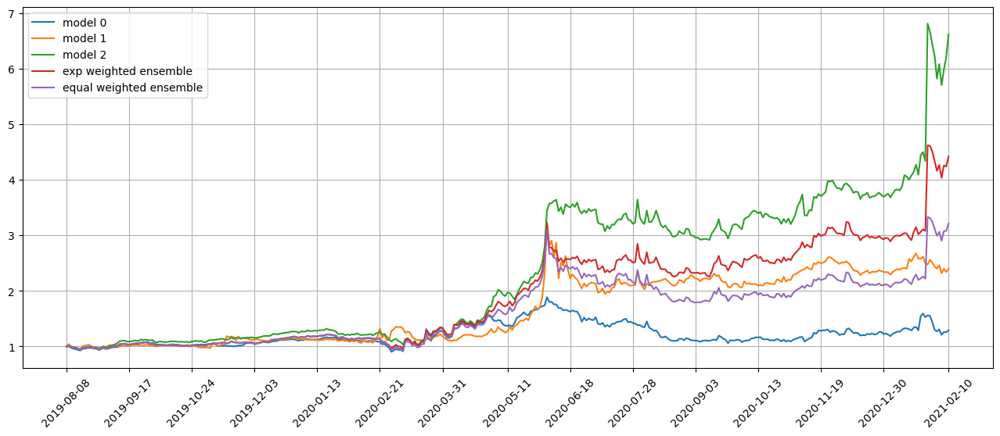

Standardization data are from 2019-07-10 to 2020-04-23
Training data are from 2020-04-24 to 2021-02-08
Testing data are from 2021-01-12 to 2021-03-09
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 20 out of 67 iterations
Restoring model weights from the end of the best epoch: 1.
Epoch 21: early stopping
Restoring model weights from the end of the best epoch: 7.
Epoch 27: early stopping
Restoring model weights from the end of the best epoch: 1.
Epoch 21: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 0.03432616591453552
11/11 [==============================] - 0s 3ms/step
Model 0 test loss 0.03288330137729645
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 0.03289946913719177
11/11 [==============================] - 0s 3ms/step
Model 1 test loss 0.032831821590662
96/96 [==============================] - 0s 3ms/step
Model 2 training loss 0.033847

top_stocks by model 2 to buy on 2021-02-12 are ['PACB', 'TSLA', 'SAVA', 'RIOT', 'BLNK', 'KODK', 'LABU', 'DQ', 'APPS', 'GME']
position on 2021-02-16 market open will be {'KODK': 0.5191155847650963, 'RIOT': 0.9604295335880866, 'BLNK': 0.6035223571574637, 'PACB': 0.6747421072254409, 'GME': 0.6716431910359602, 'TSLA': 0.6608054693230518, 'DQ': 0.6970519376448978, 'APPS': 0.6548089560529354, 'LABU': 0.6478185915060812, 'SAVA': 0.7029820720623392}
Total asset on 2021-02-16 will be 6.792919800361337
It should be the same as 6.792919800361354
top_stocks by return weighted ensemble to buy on 2021-02-12 are ['KODK', 'LABU', 'FCEL', 'BLNK', 'TSLA', 'RIOT', 'DQ', 'SAVA', 'APPS', 'GME']
position on 2021-02-16 market open will be {'KODK': 0.4276122078779337, 'RIOT': 0.6464200313481088, 'BLNK': 0.3788124222293204, 'GME': 0.4332611290989158, 'FCEL': 0.4307683266719712, 'TSLA': 0.4262699712805034, 'DQ': 0.4496517102760979, 'APPS': 0.42240176246852995, 'LABU': 0.417892443715947, 'SAVA': 0.45347709966096

position on 2021-02-19 market open will be {'KODK': 0.4591991964430624, 'APPS': 0.6207137402875049, 'KNDI': 0.6050932505500916, 'CELH': 0.7233785143831953, 'ZG': 0.6845074981090604, 'DVA': 0.6599673539844175, 'RIOT': 0.6415531849037592, 'PLUG': 0.6956117570265006, 'MVIS': 0.6908737378178527, 'RH': 0.6972619297321044}
Total asset on 2021-02-19 will be 6.478160163237533
It should be the same as 6.47816016323755
top_stocks by return weighted ensemble to buy on 2021-02-18 are ['MVIS', 'MSTR', 'DVA', 'ZG', 'RH', 'KNDI', 'KODK', 'PLUG', 'RIOT', 'APPS']
position on 2021-02-19 market open will be {'KODK': 0.3782571512193087, 'KNDI': 0.38757160521222583, 'APPS': 0.516661322073842, 'ZG': 0.4467070712818843, 'DVA': 0.43069226364129953, 'RIOT': 0.41867524474401385, 'PLUG': 0.453953669739123, 'MVIS': 0.4508616558602112, 'MSTR': 0.4514196330728323, 'RH': 0.4550305663669407}
Total asset on 2021-02-19 will be 4.389830183211673
It should be the same as 4.389830183211682
top_stocks by equal weighted ens

position on 2021-02-24 market open will be {'KODK': 0.34785445589815406, 'RIOT': 0.3864898755642583, 'APPS': 0.43600338353806317, 'PLUG': 0.39174308801005664, 'CENN': 0.3965237803080823, 'PACB': 0.40333731497342257, 'PARR': 0.38223412081309144, 'ERJ': 0.4040536038050074, 'CELH': 0.39186442303453056, 'KNDI': 0.3861164124001076}
Total asset on 2021-02-24 will be 3.9262204583447664
It should be the same as 3.9262204583447744
top_stocks by equal weighted ensemble to buy on 2021-02-23 are ['FCEL', 'PARR', 'CENN', 'MARA', 'PACB', 'KODK', 'CELH', 'PLUG', 'RIOT', 'APPS']
position on 2021-02-24 market open will be {'KODK': 0.2799521912840469, 'RIOT': 0.30402151703258773, 'APPS': 0.34296994171208117, 'PLUG': 0.308153810575166, 'CENN': 0.3119144092785339, 'PACB': 0.3172780386940042, 'PARR': 0.3006775908683181, 'MARA': 0.3220759350666536, 'FCEL': 0.33637020607422197, 'CELH': 0.3082530947639843}
Total asset on 2021-02-24 will be 3.131666735349579
It should be the same as 3.1316667353495977
Testing 

position on 2021-03-01 market open will be {'KODK': 0.28471867481403845, 'MARA': 0.33860028108975426, 'GME': 0.3588094780123525, 'SNBR': 0.4058324722748765, 'TSLA': 0.39745840963556106, 'DQ': 0.4583666553336109, 'VUZI': 0.44683851825527354, 'KNDI': 0.4134476899455797, 'BLNK': 0.41614344391244146, 'FIZZ': 0.3952221706521792}
Total asset on 2021-03-01 will be 3.9154377939256477
It should be the same as 3.9154377939256677
Testing data from 2021-01-29 to 2021-02-26 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2021-03-01 are ['CELH', 'GEVO', 'DQ', 'BLNK', 'APPS', 'KODK', 'RIOT', 'PLUG', 'CENN', 'MARA']
position on 2021-03-02 market open will be {'MARA': 0.14613814264756506, 'GEVO': 0.09166201543818837, 'CENN': 0.11565745544166224, 'KODK': 0.09399030972404461, 'RIOT': 0.1293455479730032, 'BLNK': 0.12550218363737206, 'PLUG': 0.20268662763423972, 'DQ': 0.2146313588878176, 'APPS': 0.22781505099111693, 'CELH': 0.21843097158060426}
Total asset on 2021-03-02 will be 1.5658596

Testing data from 2021-02-03 to 2021-03-03 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2021-03-04 are ['KODK', 'TSLA', 'SAVA', 'FCEL', 'RIOT', 'CENN', 'MVIS', 'MARA', 'PLUG', 'APPS']
position on 2021-03-05 market open will be {'MARA': 0.11837190111925547, 'CENN': 0.09728197186681872, 'RIOT': 0.10209221790188813, 'KODK': 0.14749634288523283, 'FCEL': 0.1404527304410757, 'TSLA': 0.14474581376169826, 'APPS': 0.13863651473913705, 'PLUG': 0.1473029560820821, 'MVIS': 0.1419037394960805, 'SAVA': 0.14281789920117272}
Total asset on 2021-03-05 will be 1.3211020874944288
It should be the same as 1.3211020874944417
top_stocks by model 1 to buy on 2021-03-04 are ['DQ', 'ROKU', 'RH', 'LABU', 'SAVA', 'FCEL', 'TSLA', 'MARA', 'APPS', 'PLUG']
position on 2021-03-05 market open will be {'MARA': 0.24669208473034174, 'FCEL': 0.2823763001336463, 'ROKU': 0.298584750762433, 'TSLA': 0.2910074245015093, 'DQ': 0.286697039019504, 'APPS': 0.2787248490828372, 'PLUG': 0.2961484878690748, 'LABU

top_stocks by model 0 to buy on 2021-03-09 are ['BLNK', 'MSTR', 'KODK', 'APPS', 'PLUG', 'MVIS', 'CENN', 'RIOT', 'MARA', 'GME']
position on 2021-03-10 market open will be {'MARA': 0.14394607608257934, 'CENN': 0.10917199065054103, 'RIOT': 0.13048015804294189, 'KODK': 0.1577366437429228, 'BLNK': 0.16560088601248463, 'PLUG': 0.16465377958932023, 'MVIS': 0.17195698213116736, 'GME': 0.18738715821104368, 'APPS': 0.16956411608423108, 'MSTR': 0.1654050375344389}
Total asset on 2021-03-10 will be 1.5659028280816578
It should be the same as 1.565902828081671
top_stocks by model 1 to buy on 2021-03-09 are ['BLNK', 'YINN', 'MSTR', 'DQ', 'FCEL', 'RIOT', 'MARA', 'APPS', 'PLUG', 'GME']
position on 2021-03-10 market open will be {'MARA': 0.36977402443135415, 'DQ': 0.370766109437796, 'BLNK': 0.3532182604523684, 'RIOT': 0.4003310358695986, 'GME': 0.378684780227105, 'FCEL': 0.37010901522471645, 'APPS': 0.34266675820678555, 'PLUG': 0.33208162850417394, 'YINN': 0.31890507421738956, 'MSTR': 0.334261807933717

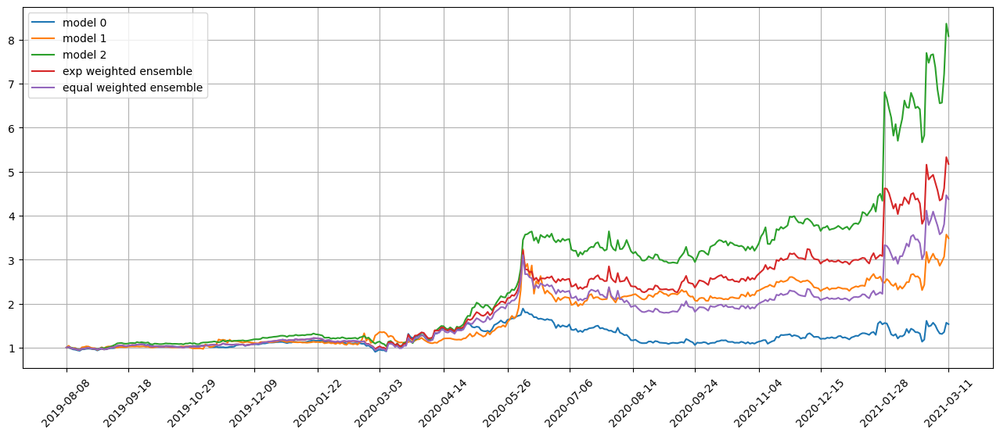

Standardization data are from 2019-08-07 to 2020-05-21
Training data are from 2020-05-22 to 2021-03-09
Testing data are from 2021-02-10 to 2021-04-07
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 21 out of 67 iterations
Restoring model weights from the end of the best epoch: 7.
Epoch 27: early stopping
Restoring model weights from the end of the best epoch: 4.
Epoch 24: early stopping
Restoring model weights from the end of the best epoch: 3.
Epoch 23: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 0.032419268041849136
11/11 [==============================] - 0s 3ms/step
Model 0 test loss 0.027753464877605438
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 0.03330615907907486
11/11 [==============================] - 0s 3ms/step
Model 1 test loss 0.02896607108414173
96/96 [==============================] - 0s 4ms/step
Model 2 training loss 0.03

position on 2021-03-16 market open will be {'BLNK': 0.4813781959045025, 'GME': 0.35754306082906695, 'RIOT': 0.4633039142096109, 'MARA': 0.46306499634768, 'MVIS': 0.5190335438060769, 'DQ': 0.4379254573963136, 'PACB': 0.46912085522213237, 'TSLA': 0.44772586524522257, 'FCEL': 0.3630818053666886, 'MSTR': 0.4252751485965119}
Total asset on 2021-03-16 will be 4.427452842923785
It should be the same as 4.427452842923807
Testing data from 2021-02-16 to 2021-03-15 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2021-03-16 are ['TSLA', 'WKHS', 'GWRE', 'MVIS', 'CELH', 'PACB', 'BLNK', 'FCEL', 'APPS', 'PLUG']
position on 2021-03-17 market open will be {'BLNK': 0.16566484193791087, 'MVIS': 0.14822748499808244, 'TSLA': 0.1464260827099305, 'PACB': 0.13439892012878712, 'FCEL': 0.1556494485276432, 'CELH': 0.14310035454919803, 'APPS': 0.13539709892074667, 'WKHS': 0.13711250887321402, 'PLUG': 0.12617998344571232, 'GWRE': 0.147729508523696}
Total asset on 2021-03-17 will be 1.43988623261

Testing data from 2021-02-19 to 2021-03-18 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2021-03-19 are ['CLDX', 'WKHS', 'FCEL', 'PACB', 'BLNK', 'RIOT', 'TSLA', 'DQ', 'MVIS', 'PLUG']
position on 2021-03-22 market open will be {'BLNK': 0.1786342497068879, 'CLDX': 0.14629322282967966, 'RIOT': 0.137194121975579, 'PACB': 0.14898261481821226, 'FCEL': 0.15158592800818296, 'TSLA': 0.14787151303278817, 'DQ': 0.14167537492697, 'WKHS': 0.14680252702843508, 'PLUG': 0.15379185991452907, 'MVIS': 0.15796364759073503}
Total asset on 2021-03-22 will be 1.5107950598319853
It should be the same as 1.510795059831999
top_stocks by model 1 to buy on 2021-03-19 are ['CELH', 'GEVO', 'PLUG', 'BLNK', 'TSLA', 'DQ', 'MARA', 'MVIS', 'LGF-A', 'RIOT']
position on 2021-03-22 market open will be {'MARA': 0.4032789255290557, 'BLNK': 0.3810177617885696, 'RIOT': 0.3561855899372513, 'GEVO': 0.39327732824750467, 'MVIS': 0.3548689745946499, 'CELH': 0.34109815979485286, 'TSLA': 0.3502671765469697, 'DQ':

top_stocks by model 0 to buy on 2021-03-24 are ['BRK-B', 'MARA', 'PBR', 'DQ', 'MSTR', 'MOG-A', 'WKHS', 'MVIS', 'LGF-A', 'GME']
position on 2021-03-25 market open will be {'GME': 0.0900524115885533, 'MARA': 0.10394445643072926, 'BRK-B': 0.149145337895775, 'MOG-A': 0.14714903905575308, 'MVIS': 0.10852149881037572, 'LGF-A': 0.13027698580090447, 'MSTR': 0.12069626559423563, 'PBR': 0.1398127546671648, 'DQ': 0.11907515274812987, 'WKHS': 0.12748955006356774}
Total asset on 2021-03-25 will be 1.2361634526551746
It should be the same as 1.236163452655189
top_stocks by model 1 to buy on 2021-03-24 are ['BLNK', 'VUZI', 'PLUG', 'DQ', 'GEVO', 'RIOT', 'MVIS', 'MARA', 'APPS', 'GME']
position on 2021-03-25 market open will be {'MARA': 0.2800521958915968, 'BLNK': 0.31511940957038426, 'GEVO': 0.31109996270829415, 'RIOT': 0.2425143881577516, 'APPS': 0.26514826969383254, 'PLUG': 0.2742020074329242, 'GME': 0.2618859142586827, 'MVIS': 0.2670342145842171, 'DQ': 0.2721293650175754, 'VUZI': 0.2708586714422497}

top_stocks by model 0 to buy on 2021-03-29 are ['WW', 'VIXY', 'EEFT', 'IEP', 'DPST', 'GATX', 'BRK-B', 'MOG-A', 'LGF-A', 'GME']
position on 2021-03-30 market open will be {'GME': 0.13154787995460776, 'IEP': 0.1342544913471204, 'GATX': 0.13328504492245707, 'BRK-B': 0.13971358355367985, 'MOG-A': 0.1346080329913557, 'WW': 0.13666589020186007, 'DPST': 0.13317983459407587, 'LGF-A': 0.13376415577010295, 'EEFT': 0.13709158792028828, 'VIXY': 0.13634459924466408}
Total asset on 2021-03-30 will be 1.350455100500198
It should be the same as 1.3504551005002121
top_stocks by model 1 to buy on 2021-03-29 are ['HCC', 'WBD', 'MOG-A', 'VUZI', 'MSTR', 'MARA', 'KODK', 'LGF-A', 'GEVO', 'RIOT']
position on 2021-03-30 market open will be {'MARA': 0.3691170683942558, 'GEVO': 0.3114912923821122, 'RIOT': 0.30071045445928646, 'MSTR': 0.30849484804132643, 'KODK': 0.29631298101944126, 'VUZI': 0.2639901323242628, 'WBD': 0.2840084392338471, 'HCC': 0.28011009609434717, 'LGF-A': 0.2761665226550361, 'MOG-A': 0.27790877

position on 2021-04-05 market open will be {'GME': 0.11997166651860229, 'RIOT': 0.14053294901117558, 'PACB': 0.1585280057291045, 'CLDX': 0.15972617254685323, 'APPS': 0.15066429263636566, 'PLUG': 0.13553837627582513, 'MVIS': 0.16954597532495794, 'FNDA': 0.14473557641902773, 'CARS': 0.1455469727105994, 'DQ': 0.14201290533910557}
Total asset on 2021-04-05 will be 1.4668028925116026
It should be the same as 1.466802892511617
top_stocks by model 1 to buy on 2021-04-01 are ['MVIS', 'KODK', 'PACB', 'VUZI', 'FNDA', 'GEVO', 'DQ', 'MARA', 'APPS', 'RIOT']
position on 2021-04-05 market open will be {'MARA': 0.4588388611325943, 'GEVO': 0.391320717197666, 'RIOT': 0.32089122660077746, 'KODK': 0.31081260787987713, 'VUZI': 0.328622217507294, 'PACB': 0.33280825205605197, 'FNDA': 0.29460594460052825, 'MVIS': 0.2708855970988996, 'DQ': 0.2890640100935983, 'APPS': 0.28755683936622917}
Total asset on 2021-04-05 will be 3.2854062735334946
It should be the same as 3.285406273533516
top_stocks by model 2 to buy

top_stocks by model 1 to buy on 2021-04-07 are ['DOX', 'MSTR', 'VUZI', 'KODK', 'APPS', 'GEVO', 'RIOT', 'MVIS', 'MARA', 'LGF-A']
position on 2021-04-08 market open will be {'MARA': 0.4570556998606724, 'GEVO': 0.32479620273791315, 'KODK': 0.3004026257286297, 'VUZI': 0.37725882201847527, 'APPS': 0.2857427128340643, 'LGF-A': 0.3269875141793387, 'RIOT': 0.3104885763789039, 'DOX': 0.31282897515453983, 'MVIS': 0.30779542250887026, 'MSTR': 0.30715769524601094}
Total asset on 2021-04-08 will be 3.3105142466473976
It should be the same as 3.310514246647419
top_stocks by model 2 to buy on 2021-04-07 are ['RIOT', 'DOX', 'XELA', 'MOG-A', 'BRK-B', 'MVIS', 'APPS', 'MARA', 'LGF-A', 'GME']
position on 2021-04-08 market open will be {'RIOT': 0.6804061657589047, 'MARA': 0.6916998549676687, 'LGF-A': 0.7232577548537806, 'GME': 0.7175705708258381, 'XELA': 0.6556783564673322, 'APPS': 0.7010039503691413, 'BRK-B': 0.706575775757906, 'MOG-A': 0.6959405982266496, 'MVIS': 0.7011390777068119, 'DOX': 0.712605201636

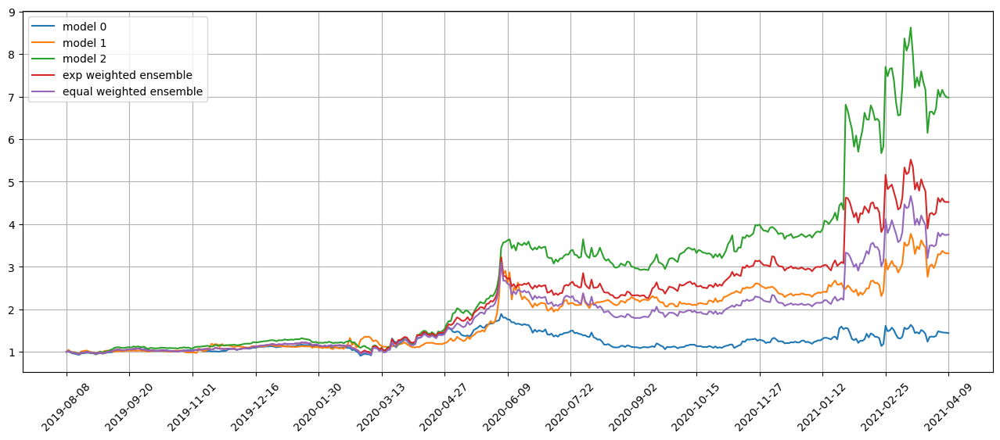

Standardization data are from 2019-09-05 to 2020-06-19
Training data are from 2020-06-22 to 2021-04-07
Testing data are from 2021-03-11 to 2021-05-05
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 22 out of 67 iterations
Restoring model weights from the end of the best epoch: 58.
Epoch 78: early stopping
Restoring model weights from the end of the best epoch: 23.
Epoch 43: early stopping
Restoring model weights from the end of the best epoch: 72.
Epoch 92: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 0.03356489539146423
11/11 [==============================] - 0s 3ms/step
Model 0 test loss 0.02430240996181965
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 0.03490746021270752
11/11 [==============================] - 0s 3ms/step
Model 1 test loss 0.025041630491614342
96/96 [==============================] - 0s 4ms/step
Model 2 training loss 0.

position on 2021-04-14 market open will be {'RIOT': 0.4491082205417762, 'DPST': 0.3664059117876522, 'GME': 0.3441714115103908, 'MUFG': 0.37551122677782545, 'TCOM': 0.3635713691975196, 'PRG': 0.38098090854365607, 'HBI': 0.37709296409085885, 'LGF-A': 0.36818070354971966, 'MOG-A': 0.3791700526278314, 'COLB': 0.37366849749046555}
Total asset on 2021-04-14 will be 3.777861266117672
It should be the same as 3.7778612661176956
Testing data from 2021-03-16 to 2021-04-13 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2021-04-14 are ['GLNG', 'AGQ', 'QD', 'IBB', 'HDB', 'GEO', 'YINN', 'TCOM', 'CXW', 'GME']
position on 2021-04-15 market open will be {'GME': 0.14828202906640783, 'TCOM': 0.14800121542070863, 'CXW': 0.1504016675010913, 'AGQ': 0.1468267445335881, 'HDB': 0.1454104891492548, 'GEO': 0.14553583473642498, 'IBB': 0.14476606016418622, 'QD': 0.1432442160149191, 'YINN': 0.14019844832522402, 'GLNG': 0.14898139475643477}
Total asset on 2021-04-15 will be 1.4616480996682246
It 

Testing data from 2021-03-19 to 2021-04-16 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2021-04-19 are ['MJ', 'SMFG', 'MUFG', 'CLDX', 'UMBF', 'FCG', 'DPST', 'WAL', 'MARA', 'GME']
position on 2021-04-20 market open will be {'CLDX': 0.15365879949792205, 'GME': 0.1538994886692401, 'MARA': 0.12853796295333617, 'SMFG': 0.13464652991848608, 'UMBF': 0.1369312795769826, 'WAL': 0.13689123529750044, 'DPST': 0.1336268555551486, 'MUFG': 0.13771539377889372, 'MJ': 0.13758511429332462, 'FCG': 0.13782592230651208}
Total asset on 2021-04-20 will be 1.3913185818473308
It should be the same as 1.3913185818473466
top_stocks by model 1 to buy on 2021-04-19 are ['WAL', 'MS', 'PRG', 'SMFG', 'MUFG', 'FCG', 'CADE', 'DPST', 'UMBF', 'MARA']
position on 2021-04-20 market open will be {'MARA': 0.2942211024880384, 'WAL': 0.3667272656600466, 'PRG': 0.3225054252591598, 'MS': 0.32983037381897806, 'SMFG': 0.3183736867396649, 'CADE': 0.3212025867802609, 'UMBF': 0.3237760106799335, 'MUFG': 0.325630

top_stocks by model 0 to buy on 2021-04-22 are ['WBS', 'SFBS', 'OLN', 'SFNC', 'BBD', 'BLNK', 'CLM', 'PLUG', 'APPS', 'RIOT']
position on 2021-04-23 market open will be {'BLNK': 0.1460384393823406, 'OLN': 0.13627170292389845, 'RIOT': 0.11730317338295883, 'WBS': 0.13738692790439588, 'SFBS': 0.13779933938748337, 'APPS': 0.13670000979770783, 'PLUG': 0.13333770154117286, 'CLM': 0.1354406055452296, 'BBD': 0.14029852004681775, 'SFNC': 0.13923946389804465}
Total asset on 2021-04-23 will be 1.3598158838100345
It should be the same as 1.3598158838100498
top_stocks by model 1 to buy on 2021-04-22 are ['KSS', 'MLCO', 'BLNK', 'FNKO', 'PACB', 'CLM', 'BBD', 'MARA', 'APPS', 'RIOT']
position on 2021-04-23 market open will be {'MARA': 0.2459451753997958, 'RIOT': 0.3005033559251816, 'APPS': 0.34588728140521163, 'PACB': 0.346247940479475, 'BBD': 0.3485747360792622, 'MLCO': 0.3515547869681763, 'KSS': 0.3458139207593354, 'FNKO': 0.35540936277436147, 'BLNK': 0.3393164751394145, 'CLM': 0.33650514144118876}
Tot

position on 2021-04-28 market open will be {'GME': 0.15965635279166274, 'MVIS': 0.1568995592852822, 'RIOT': 0.13805093084366538, 'CNI': 0.140701984673507, 'TECL': 0.13911124422512156, 'DQ': 0.13292490318384229, 'APPS': 0.13842505662740648, 'DBI': 0.14902643879032446, 'PLUG': 0.13575929493319364, 'WERN': 0.14173325057217367}
Total asset on 2021-04-28 will be 1.432289015926164
It should be the same as 1.4322890159261794
top_stocks by model 1 to buy on 2021-04-27 are ['DIOD', 'CNI', 'DQ', 'EWBC', 'DBI', 'RIOT', 'PACB', 'MVIS', 'APPS', 'GME']
position on 2021-04-28 market open will be {'GME': 0.38675573498872207, 'RIOT': 0.32982678238690294, 'DIOD': 0.3325573903008577, 'PACB': 0.34178962136171465, 'CNI': 0.33616059375121266, 'DQ': 0.31757984425230723, 'APPS': 0.3307206315098693, 'DBI': 0.35604910808210527, 'EWBC': 0.34541738670520283, 'MVIS': 0.2750740273713666}
Total asset on 2021-04-28 will be 3.351931120710241
It should be the same as 3.351931120710261
top_stocks by model 2 to buy on 20

top_stocks by model 1 to buy on 2021-04-30 are ['SEIC', 'ACLS', 'SNDR', 'TTEK', 'CDNS', 'FORM', 'WBS', 'NYCB', 'MLKN', 'GME']
position on 2021-05-03 market open will be {'SEIC': 0.3401310044848853, 'NYCB': 0.32643261197865936, 'MLKN': 0.3269469725177971, 'WBS': 0.3276024481401847, 'GME': 0.3338112014023451, 'ACLS': 0.33054006380617523, 'CDNS': 0.331786098946571, 'TTEK': 0.33431068252509416, 'FORM': 0.3313859101779428, 'SNDR': 0.3239460757964939}
Total asset on 2021-05-03 will be 3.306893069776128
It should be the same as 3.3068930697761485
top_stocks by model 2 to buy on 2021-04-30 are ['GUSH', 'FCEL', 'MLKN', 'NYCB', 'PLUG', 'MARA', 'RIOT', 'BLNK', 'MVIS', 'GME']
position on 2021-05-03 market open will be {'PLUG': 0.6201534155808593, 'BLNK': 0.688771961140346, 'MVIS': 0.7577326879216978, 'RIOT': 0.7098162562545444, 'GME': 0.7228995796502031, 'MARA': 0.7609437801979291, 'NYCB': 0.7120910109170746, 'MLKN': 0.7132130541898662, 'GUSH': 0.7226638556509091, 'FCEL': 0.7135843518267132}
Total

position on 2021-05-06 market open will be {'MARA': 0.29047649336180503, 'PCRX': 0.3323204529206351, 'AAPL': 0.3250533088604097, 'SONY': 0.33002999899567775, 'STRA': 0.3230398660011084, 'TECL': 0.3192511719642054, 'BAP': 0.3207182941334917, 'LVS': 0.32340157854050855, 'CNH': 0.34468558718104697, 'BCS': 0.3324121155628022}
Total asset on 2021-05-06 will be 3.2413888675216698
It should be the same as 3.2413888675216906
top_stocks by model 2 to buy on 2021-05-05 are ['FI', 'LVS', 'BCS', 'TECL', 'BAP', 'PLUG', 'BLNK', 'RIOT', 'MARA', 'GME']
position on 2021-05-06 market open will be {'PLUG': 0.5034672118214598, 'BLNK': 0.6339833066482252, 'RIOT': 0.6023836867642308, 'MARA': 0.6691125963996558, 'GME': 0.7134020961711276, 'FI': 0.7075383700633067, 'TECL': 0.6977459831076656, 'BAP': 0.7009524822226084, 'LVS': 0.7068169897982968, 'BCS': 0.7265101548202664}
Total asset on 2021-05-06 will be 6.6619128778168175
It should be the same as 6.661912877816842
top_stocks by return weighted ensemble to b

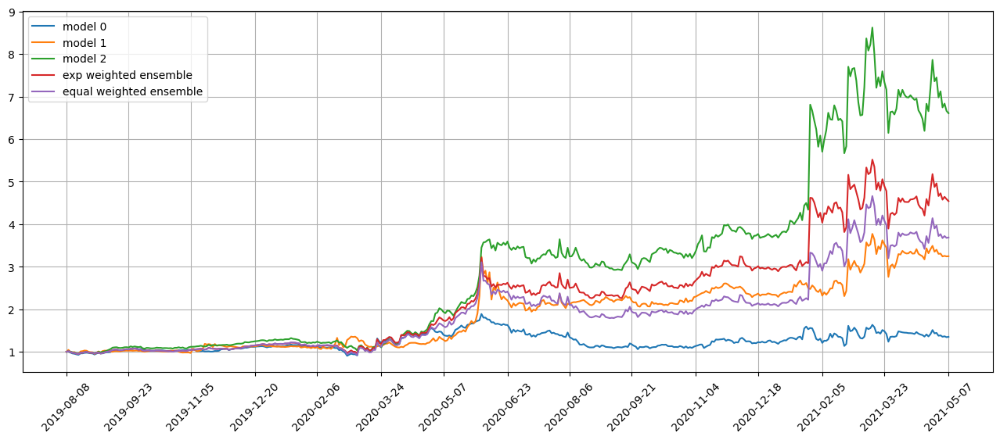

Standardization data are from 2019-10-03 to 2020-07-20
Training data are from 2020-07-21 to 2021-05-05
Testing data are from 2021-04-09 to 2021-06-03
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 23 out of 67 iterations
Restoring model weights from the end of the best epoch: 9.
Epoch 29: early stopping
Restoring model weights from the end of the best epoch: 14.
Epoch 34: early stopping
Restoring model weights from the end of the best epoch: 4.
Epoch 24: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 0.03279883414506912
11/11 [==============================] - 0s 3ms/step
Model 0 test loss 0.02777569554746151
96/96 [==============================] - 0s 4ms/step
Model 1 training loss 0.034067489206790924
11/11 [==============================] - 0s 3ms/step
Model 1 test loss 0.029033545404672623
96/96 [==============================] - 0s 3ms/step
Model 2 training loss 0.0

position on 2021-05-12 market open will be {'MKTX': 0.4518400611574432, 'MARA': 0.4510928897009214, 'TECL': 0.4308112031126844, 'VIRT': 0.43911982071205286, 'CYBR': 0.439102973638039, 'ANGI': 0.4522607051197409, 'SCO': 0.40796725347137375, 'GWRE': 0.4311980006094604, 'RGR': 0.4426373314593973, 'NVDA': 0.43411928546295586}
Total asset on 2021-05-12 will be 4.3801495244440645
It should be the same as 4.38014952444407
top_stocks by equal weighted ensemble to buy on 2021-05-11 are ['PAYC', 'NVDA', 'ANGI', 'CYBR', 'MKTX', 'VIRT', 'GWRE', 'TECL', 'RGR', 'SCO']
position on 2021-05-12 market open will be {'MKTX': 0.36561522679955866, 'TECL': 0.3521849186926767, 'VIRT': 0.35897715109643047, 'CYBR': 0.35896337874012013, 'ANGI': 0.3697197252756377, 'SCO': 0.3335101616554503, 'GWRE': 0.3525011227374377, 'RGR': 0.3618526896794652, 'NVDA': 0.35488925113607955, 'PAYC': 0.35829485473079753}
Total asset on 2021-05-12 will be 3.5665084805436282
It should be the same as 3.566508480543654
Testing data fro

position on 2021-05-17 market open will be {'TREE': 0.3914938646197723, 'BTG': 0.3678337967296334, 'BGC': 0.3667273612505804, 'KMPR': 0.3588831484768149, 'BABA': 0.3625827526614246, 'VRRM': 0.36790023497265967, 'HCC': 0.36862100628449407, 'MRCY': 0.3539520490254178, 'PAAS': 0.3715999689798413, 'COLM': 0.36750551545607146}
Total asset on 2021-05-17 will be 3.677099698456684
It should be the same as 3.6770996984567104
Testing data from 2021-04-19 to 2021-05-14 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2021-05-17 are ['GWRE', 'LITE', 'WWW', 'SHAK', 'OLLI', 'UA', 'RNG', 'LVS', 'MARA', 'LOPE']
position on 2021-05-18 market open will be {'MARA': 0.12289809525461194, 'LITE': 0.14395223871446097, 'LOPE': 0.13826133854893372, 'WWW': 0.1430362949027267, 'SHAK': 0.14275020642428907, 'RNG': 0.13772669304255714, 'LVS': 0.14044084458049655, 'OLLI': 0.139959755388642, 'GWRE': 0.13750201670545079, 'UA': 0.14307090898815095}
Total asset on 2021-05-18 will be 1.3895983925503044


position on 2021-05-21 market open will be {'OXM': 0.14356126213028997, 'LULU': 0.14528787926302045, 'MNRO': 0.1356058008762842, 'UWM': 0.1436722687327492, 'WWW': 0.14333260895186498, 'UBSI': 0.14179061668945026, 'MIDD': 0.1365644284444728, 'ZTO': 0.13815534253402695, 'GPK': 0.1406854259310919, 'AIN': 0.14206077389754923}
Total asset on 2021-05-21 will be 1.4107164074507834
It should be the same as 1.4107164074508
top_stocks by model 1 to buy on 2021-05-20 are ['HXL', 'BCS', 'WWW', 'SSB', 'MIDD', 'NMIH', 'AIN', 'UBSI', 'EQC', 'MNRO']
position on 2021-05-21 market open will be {'MNRO': 0.31861142232542033, 'WWW': 0.3367658765971983, 'EQC': 0.32704575601107033, 'UBSI': 0.33314290217598636, 'HXL': 0.33645391290219806, 'SSB': 0.33560898544758, 'MIDD': 0.32086375733621814, 'BCS': 0.3290365734050885, 'AIN': 0.33377764767925877, 'NMIH': 0.3369363174683966}
Total asset on 2021-05-21 will be 3.3082431513483943
It should be the same as 3.3082431513484156
top_stocks by model 2 to buy on 2021-05-2

top_stocks by model 0 to buy on 2021-05-25 are ['SHOO', 'CCOI', 'RL', 'AIV', 'MNRO', 'GDS', 'ECH', 'VIXY', 'SIRI', 'VFC']
position on 2021-05-26 market open will be {'MNRO': 0.13883846909012276, 'GDS': 0.14446523782724854, 'AIV': 0.14005817462696007, 'SIRI': 0.13771712844633724, 'VFC': 0.14295648993287777, 'ECH': 0.1382376839930989, 'CCOI': 0.1410762677011439, 'RL': 0.14308489967428564, 'SHOO': 0.13642531879561193, 'VIXY': 0.13931173685733358}
Total asset on 2021-05-26 will be 1.4021714069450044
It should be the same as 1.4021714069450204
top_stocks by model 1 to buy on 2021-05-25 are ['CAH', 'SCO', 'ENTA', 'LOPE', 'RL', 'MNRO', 'GDS', 'VFC', 'IONS', 'BOIL']
position on 2021-05-26 market open will be {'MNRO': 0.3213029085154129, 'LOPE': 0.33009375428342463, 'GDS': 0.3385110860566626, 'BOIL': 0.3321029313622826, 'VFC': 0.334975786520314, 'ENTA': 0.3253015898034794, 'IONS': 0.32647836632296245, 'RL': 0.33527667635151487, 'CAH': 0.32427820862470175, 'SCO': 0.3332793301914303}
Total asset 

position on 2021-06-01 market open will be {'MNRO': 0.14781352200826364, 'MARA': 0.14535551107021447, 'TNK': 0.14961781444631847, 'DINO': 0.15283385960331128, 'ECH': 0.15432218609909396, 'MRCY': 0.1471548374563735, 'AYI': 0.1490047468605967, 'LPG': 0.1502518870882738, 'UA': 0.1459196313849191, 'AIN': 0.1499417908652374}
Total asset on 2021-06-01 will be 1.492215786882586
It should be the same as 1.4922157868826025
top_stocks by model 1 to buy on 2021-05-28 are ['UA', 'MJ', 'OUNZ', 'DINO', 'DBA', 'QYLD', 'SSRM', 'AIN', 'FCFS', 'MRCY']
position on 2021-06-01 market open will be {'DBA': 0.3485424134822379, 'DINO': 0.35706788510969373, 'SSRM': 0.3489700505585675, 'MRCY': 0.34379990618956796, 'MJ': 0.3506903856164429, 'OUNZ': 0.3457959910222955, 'QYLD': 0.34425801597942324, 'UA': 0.3409140769580505, 'FCFS': 0.3410215207508645, 'AIN': 0.3503111044422667}
Total asset on 2021-06-01 will be 3.47137135010939
It should be the same as 3.471371350109411
top_stocks by model 2 to buy on 2021-05-28 ar

Testing data from 2021-05-05 to 2021-06-02 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2021-06-03 are ['ONB', 'GES', 'NAIL', 'UHAL', 'PKX', 'WWW', 'HOG', 'R', 'SHOO', 'OXM']
position on 2021-06-04 market open will be {'NAIL': 0.13958129773452466, 'UHAL': 0.14819672855555074, 'OXM': 0.14941792670583973, 'PKX': 0.14938659260767265, 'HOG': 0.1515715518969883, 'WWW': 0.1467365027336156, 'R': 0.15098613442108363, 'SHOO': 0.14879336288097164, 'ONB': 0.1526283843129259, 'GES': 0.1481754545894171}
Total asset on 2021-06-04 will be 1.4854739364385738
It should be the same as 1.48547393643859
top_stocks by model 1 to buy on 2021-06-03 are ['AUB', 'NMIH', 'COLB', 'WAFD', 'R', 'SHOO', 'CADE', 'ZION', 'ONB', 'VTNR']
position on 2021-06-04 market open will be {'VTNR': 0.41780473353570313, 'ZION': 0.3434471129065557, 'CADE': 0.3462534104964805, 'R': 0.35032290528392634, 'AUB': 0.34195907708245743, 'COLB': 0.342359432959528, 'SHOO': 0.3452351659395069, 'WAFD': 0.3434620505039916

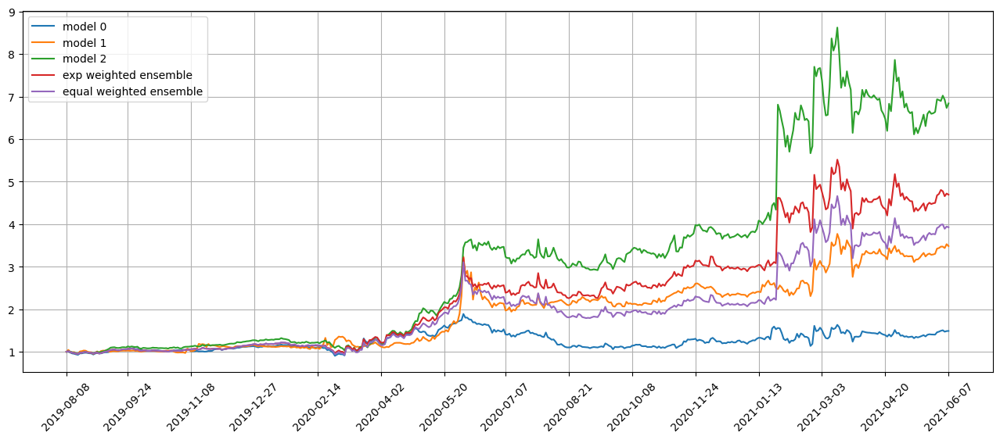

Standardization data are from 2019-10-31 to 2020-08-17
Training data are from 2020-08-18 to 2021-06-03
Testing data are from 2021-05-07 to 2021-07-01
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 24 out of 67 iterations
Restoring model weights from the end of the best epoch: 70.
Epoch 90: early stopping
Restoring model weights from the end of the best epoch: 9.
Epoch 29: early stopping
Restoring model weights from the end of the best epoch: 12.
Epoch 32: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 0.031759317964315414
11/11 [==============================] - 0s 3ms/step
Model 0 test loss 0.022208545356988907
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 0.03224099427461624
11/11 [==============================] - 0s 3ms/step
Model 1 test loss 0.022223712876439095
96/96 [==============================] - 0s 3ms/step
Model 2 training loss 0

Testing data from 2021-05-12 to 2021-06-09 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2021-06-10 are ['WERN', 'NEM', 'M', 'MCY', 'NG', 'HOG', 'AFG', 'CACC', 'BVN', 'VTNR']
position on 2021-06-11 market open will be {'VTNR': 0.14466407929598477, 'MCY': 0.15068117450515958, 'HOG': 0.14753219403748374, 'AFG': 0.14934757223714648, 'NG': 0.15177115493115723, 'CACC': 0.15156409345245367, 'NEM': 0.15148468264352233, 'WERN': 0.14660256196153415, 'M': 0.14540723734308209, 'BVN': 0.15387929199781225}
Total asset on 2021-06-11 will be 1.4929340424053201
It should be the same as 1.4929340424053363
top_stocks by model 1 to buy on 2021-06-10 are ['PRKS', 'PKX', 'GGB', 'KALU', 'BFH', 'JWN', 'BVN', 'CACC', 'GLNG', 'VTNR']
position on 2021-06-11 market open will be {'CACC': 0.3846232078644706, 'VTNR': 0.3425532109304446, 'PRKS': 0.3509132282576108, 'PKX': 0.3679802626501976, 'GGB': 0.35994807929648565, 'JWN': 0.34860462321679875, 'BFH': 0.34388393111917764, 'BVN': 0.364532654748

top_stocks by model 0 to buy on 2021-06-15 are ['PAG', 'CARG', 'GOLD', 'ABG', 'SNDR', 'IRWD', 'NG', 'BVN', 'GME', 'VTNR']
position on 2021-06-16 market open will be {'BVN': 0.14580275864133183, 'VTNR': 0.1445503635627879, 'GME': 0.14216020351405578, 'IRWD': 0.1493716452929412, 'NG': 0.14837934531150884, 'GOLD': 0.14737441234103538, 'PAG': 0.1497917665917775, 'CARG': 0.14652913029161746, 'ABG': 0.14998461369045693, 'SNDR': 0.15010160532054553}
Total asset on 2021-06-16 will be 1.474045844558042
It should be the same as 1.4740458445580582
top_stocks by model 1 to buy on 2021-06-15 are ['IRTC', 'BVN', 'IRWD', 'GOLD', 'CTRA', 'UNG', 'CRS', 'BTG', 'STNG', 'VTNR']
position on 2021-06-16 market open will be {'VTNR': 0.3123513131548554, 'UNG': 0.3549005544444677, 'BTG': 0.3649967954761935, 'IRTC': 0.36548766922675524, 'IRWD': 0.36841613846423804, 'GOLD': 0.3634900840560428, 'BVN': 0.3552788202914557, 'CTRA': 0.3683080746193837, 'CRS': 0.3634897623887778, 'STNG': 0.3646394547391294}
Total asset

top_stocks by model 1 to buy on 2021-06-18 are ['SAGE', 'MTZ', 'CARG', 'WCC', 'BVN', 'BAP', 'BFH', 'NEU', 'VTNR', 'GME']
position on 2021-06-21 market open will be {'VTNR': 0.2992373299793233, 'GME': 0.35543481831234947, 'BVN': 0.35253382923300125, 'BAP': 0.3601875001513893, 'MTZ': 0.3583865993793927, 'BFH': 0.3664874981000155, 'CARG': 0.36188246925563644, 'SAGE': 0.3714421864642923, 'WCC': 0.3658902740803946, 'NEU': 0.36316164436938697}
Total asset on 2021-06-21 will be 3.5546441493251595
It should be the same as 3.5546441493251817
top_stocks by model 2 to buy on 2021-06-18 are ['SNV', 'R', 'COF', 'RF', 'EWBC', 'KEY', 'BFH', 'FITB', 'VTNR', 'GME']
position on 2021-06-21 market open will be {'VTNR': 0.6578040394897878, 'GME': 0.6655097834580161, 'R': 0.6826811379343001, 'FITB': 0.677657006224279, 'KEY': 0.6848984458018462, 'BFH': 0.6828827811053723, 'SNV': 0.6784044833956594, 'COF': 0.6907253995020793, 'EWBC': 0.6823437421919804, 'RF': 0.6878219455778505}
Total asset on 2021-06-21 will

position on 2021-06-24 market open will be {'VTNR': 0.7381731544950401, 'CMP': 0.7015534208580315, 'SAN': 0.6947903165588999, 'JBLU': 0.6863280320981797, 'WFC': 0.705157404476518, 'LUV': 0.6934235949413641, 'LNC': 0.7018004438851964, 'CARS': 0.7328906715063661, 'BCS': 0.691643245035053, 'HSBC': 0.6923458905677483}
Total asset on 2021-06-24 will be 7.03810617442236
It should be the same as 7.0381061744223965
top_stocks by return weighted ensemble to buy on 2021-06-23 are ['BCS', 'KFY', 'JBLU', 'AGI', 'WFC', 'CMP', 'KGC', 'HSBC', 'SAN', 'VTNR']
position on 2021-06-24 market open will be {'VTNR': 0.5071970879063425, 'AGI': 0.4715515027398727, 'KGC': 0.4830902998826284, 'CMP': 0.4849244918285839, 'SAN': 0.47782294871591996, 'JBLU': 0.4720032451053106, 'WFC': 0.4849526285636867, 'KFY': 0.47729265063928855, 'BCS': 0.4756586367508482, 'HSBC': 0.4761418619086157}
Total asset on 2021-06-24 will be 4.810635354041096
It should be the same as 4.810635354041097
top_stocks by equal weighted ensemble

position on 2021-06-29 market open will be {'GME': 0.4599834772399811, 'PFG': 0.47851608350711, 'SPR': 0.4695905288540698, 'ATI': 0.47266588299255125, 'UNM': 0.4776654615603229, 'BWA': 0.4785645035808742, 'VTNR': 0.49438006673062507, 'RGA': 0.47599407623127754, 'KEX': 0.47409336086273884, 'GE': 0.4806310620772723}
Total asset on 2021-06-29 will be 4.76208450363682
It should be the same as 4.762084503636823
top_stocks by equal weighted ensemble to buy on 2021-06-28 are ['ATI', 'PFG', 'SPR', 'KEX', 'GE', 'RGA', 'UNM', 'BWA', 'VTNR', 'GME']
position on 2021-06-29 market open will be {'GME': 0.405153520260483, 'PFG': 0.39821719912217834, 'SPR': 0.3907894250158294, 'ATI': 0.3933487097578577, 'UNM': 0.39750931844515114, 'BWA': 0.3982574939143917, 'VTNR': 0.4114190771445197, 'RGA': 0.39611840514604474, 'KEX': 0.39453664525024235, 'GE': 0.39997726711454484}
Total asset on 2021-06-29 will be 3.985327061171209
It should be the same as 3.9853270611712426
Testing data from 2021-06-01 to 2021-06-28

Testing data from 2021-06-04 to 2021-07-01 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2021-07-02 are ['FNV', 'BMA', 'TPR', 'CINF', 'TNK', 'PRG', 'AXL', 'AIV', 'GGAL', 'GME']
position on 2021-07-06 market open will be {'GME': 0.1442240885252274, 'AIV': 0.1531147974905396, 'BMA': 0.1500693349524162, 'PRG': 0.14939920364868484, 'TNK': 0.15750169440646822, 'TPR': 0.1496742911783422, 'CINF': 0.14728304337738135, 'FNV': 0.15260333889936661, 'AXL': 0.14505181755722787, 'GGAL': 0.15172030653262175}
Total asset on 2021-07-06 will be 1.5006419165682583
It should be the same as 1.500641916568276
top_stocks by model 1 to buy on 2021-07-02 are ['YPF', 'INSW', 'AIV', 'VSAT', 'ATO', 'BVN', 'FNV', 'ENTA', 'GGAL', 'GME']
position on 2021-07-06 market open will be {'GME': 0.3410907364653912, 'VSAT': 0.35000882230046954, 'AIV': 0.3620856869733175, 'ATO': 0.361629307634099, 'ENTA': 0.3593610506636562, 'INSW': 0.3754168789761712, 'YPF': 0.35918651584263506, 'BVN': 0.3631510240537297

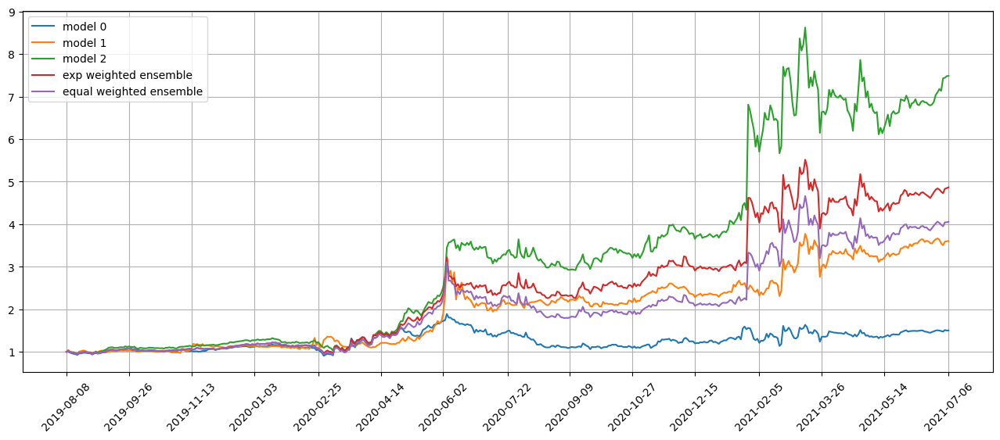

Standardization data are from 2019-11-29 to 2020-09-15
Training data are from 2020-09-16 to 2021-07-01
Testing data are from 2021-06-07 to 2021-07-30
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 25 out of 67 iterations
Restoring model weights from the end of the best epoch: 11.
Epoch 31: early stopping
Restoring model weights from the end of the best epoch: 35.
Epoch 55: early stopping
Restoring model weights from the end of the best epoch: 29.
Epoch 49: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 0.029657818377017975
11/11 [==============================] - 0s 3ms/step
Model 0 test loss 0.02869822084903717
96/96 [==============================] - 0s 4ms/step
Model 1 training loss 0.03037014789879322
11/11 [==============================] - 0s 3ms/step
Model 1 test loss 0.029662208631634712
96/96 [==============================] - 0s 3ms/step
Model 2 training loss 0

position on 2021-07-09 market open will be {'GME': 0.767073467897289, 'SAN': 0.7325402478795843, 'ARWR': 0.7627708717001315, 'TDW': 0.7725068531350981, 'CRS': 0.7473106036157182, 'AIR': 0.7556809677667181, 'BMA': 0.7257626565378887, 'CEIX': 0.7527612863382401, 'NOV': 0.7739538343579018, 'GLNG': 0.7226677473170151}
Total asset on 2021-07-09 will be 7.513028536545547
It should be the same as 7.513028536545584
top_stocks by return weighted ensemble to buy on 2021-07-08 are ['ARWR', 'YPF', 'CRS', 'TDW', 'NOV', 'BZUN', 'CIB', 'GLNG', 'BMA', 'GME']
position on 2021-07-09 market open will be {'BMA': 0.4558760679615286, 'BZUN': 0.43471420682604783, 'CIB': 0.48527027655519656, 'GME': 0.49861273699705844, 'ARWR': 0.49581596542843853, 'TDW': 0.5021445435292409, 'CRS': 0.48576648919585713, 'YPF': 0.4763798835466437, 'NOV': 0.5030851095872264, 'GLNG': 0.4697481512650674}
Total asset on 2021-07-09 will be 4.807413430892306
It should be the same as 4.807413430892305
top_stocks by equal weighted ensem

top_stocks by model 2 to buy on 2021-07-13 are ['CSTM', 'TRIP', 'LABU', 'URBN', 'RRR', 'STNG', 'TNK', 'LPG', 'DHT', 'GME']
position on 2021-07-14 market open will be {'GME': 0.7253200486842011, 'TNK': 0.7148729279603416, 'RRR': 0.7386244918276061, 'TRIP': 0.7260423292526497, 'URBN': 0.7461481964590062, 'LABU': 0.7300763009137914, 'STNG': 0.7094516831801757, 'LPG': 0.7271084531899126, 'DHT': 0.737320445948017, 'CSTM': 0.7542042347374461}
Total asset on 2021-07-14 will be 7.30916911215311
It should be the same as 7.309169112153147
top_stocks by return weighted ensemble to buy on 2021-07-13 are ['RRR', 'LABU', 'CSTM', 'URBN', 'LPG', 'DHT', 'STNG', 'TNK', 'EHTH', 'GME']
position on 2021-07-14 market open will be {'GME': 0.47147219895981923, 'TNK': 0.4570734963106105, 'RRR': 0.47401109109059364, 'URBN': 0.47883941655344014, 'LABU': 0.4685253031878906, 'STNG': 0.4552894876098724, 'EHTH': 0.4809138887455643, 'LPG': 0.466620691638515, 'DHT': 0.4731742217245552, 'CSTM': 0.4840093662863311}
Tota

top_stocks by model 2 to buy on 2021-07-16 are ['ITUB', 'SSB', 'HTH', 'YEXT', 'OXM', 'QD', 'ARCH', 'IGT', 'MRIN', 'GME']
position on 2021-07-19 market open will be {'GME': 0.6562400274740819, 'MRIN': 0.4261740636662447, 'ARCH': 0.6552588319142849, 'OXM': 0.6646923493070347, 'HTH': 0.6849837944745688, 'IGT': 0.6224042231149162, 'QD': 0.6854793290320572, 'YEXT': 0.7064634268326223, 'SSB': 0.6861939806117446, 'ITUB': 0.7009859557495662}
Total asset on 2021-07-19 will be 6.4888759821770865
It should be the same as 6.488875982177121
top_stocks by return weighted ensemble to buy on 2021-07-16 are ['OXM', 'LC', 'YEXT', 'ITUB', 'ARCH', 'AAOI', 'IGT', 'QD', 'MRIN', 'GME']
position on 2021-07-19 market open will be {'MRIN': 0.27435629374943177, 'ARCH': 0.41680881322530766, 'GME': 0.4460053886104896, 'OXM': 0.42385215743074045, 'AAOI': 0.4438142511655044, 'IGT': 0.3968864287911387, 'QD': 0.4371073215861655, 'YEXT': 0.450488181368559, 'LC': 0.43174552466847976, 'ITUB': 0.4469953806191022}
Total as

top_stocks by model 2 to buy on 2021-07-21 are ['CUBI', 'SIG', 'SXT', 'XOP', 'DBO', 'TNA', 'FCG', 'URTY', 'UWM', 'MRIN']
position on 2021-07-22 market open will be {'MRIN': 0.5171665837346924, 'UWM': 0.7247889695741186, 'TNA': 0.7539428591574213, 'SIG': 0.7217017801430652, 'SXT': 0.6989160964178088, 'URTY': 0.7163335430967286, 'XOP': 0.7149318808483025, 'DBO': 0.7161222663682063, 'CUBI': 0.7001278598278814, 'FCG': 0.7157481781700911}
Total asset on 2021-07-22 will be 6.979780017338284
It should be the same as 6.9797800173383155
top_stocks by return weighted ensemble to buy on 2021-07-21 are ['MJ', 'SOXL', 'CUBI', 'PLCE', 'XOP', 'DBO', 'UWM', 'TNA', 'FCG', 'URTY']
position on 2021-07-22 market open will be {'TNA': 0.5040167405044148, 'URTY': 0.4843595105612359, 'UWM': 0.4655078317005658, 'XOP': 0.42676279269035866, 'DBO': 0.42747336702962235, 'CUBI': 0.4179258593782992, 'MJ': 0.42568787765364086, 'SOXL': 0.44061477509749414, 'PLCE': 0.433998998584596, 'FCG': 0.4272500633437512}
Total as

top_stocks by model 2 to buy on 2021-07-26 are ['RNG', 'FAS', 'BAND', 'BAP', 'LGND', 'TTD', 'TSCO', 'DBRG', 'LPSN', 'OKTA']
position on 2021-07-27 market open will be {'LPSN': 0.6826653998909072, 'LGND': 0.6771264630757303, 'RNG': 0.6748079375200136, 'BAP': 0.6863898204478248, 'TTD': 0.6930367514697738, 'TSCO': 0.6772633177446189, 'FAS': 0.6807262927978629, 'DBRG': 0.6892430848216687, 'BAND': 0.6750288958180695, 'OKTA': 0.6701352812412528}
Total asset on 2021-07-27 will be 6.806423244827689
It should be the same as 6.806423244827723
top_stocks by return weighted ensemble to buy on 2021-07-26 are ['TSCO', 'RNG', 'DBRG', 'BAP', 'LGND', 'BAND', 'TTD', 'LPSN', 'YEXT', 'OKTA']
position on 2021-07-27 market open will be {'YEXT': 0.44649490910020073, 'LPSN': 0.4313991518186565, 'LGND': 0.42789891195821195, 'RNG': 0.42643375793346444, 'BAP': 0.4337527380257896, 'TSCO': 0.4279853950113891, 'TTD': 0.43795315656981443, 'DBRG': 0.4355558114362589, 'OKTA': 0.42348094978511, 'BAND': 0.42657338888939

position on 2021-07-30 market open will be {'MNRO': 0.38089013181026576, 'LII': 0.37253488991926326, 'RNR': 0.3696694590134203, 'GKOS': 0.3699241254600807, 'WB': 0.35373646061292224, 'NTLA': 0.36370815146457175, 'LOGI': 0.3706584965627412, 'DNLI': 0.36164132253930426, 'IAGG': 0.3696014910545024, 'LNTH': 0.3700842736438712}
Total asset on 2021-07-30 will be 3.6824488020809154
It should be the same as 3.682448802080943
Testing data from 2021-07-01 to 2021-07-29 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2021-07-30 are ['RGNX', 'YUMC', 'BCO', 'NBIX', 'UPS', 'MNRO', 'MRK', 'WB', 'RDY', 'MRIN']
position on 2021-08-02 market open will be {'MRIN': 0.13476101564358253, 'MNRO': 0.14337494005281645, 'WB': 0.1437916013871167, 'RGNX': 0.14025663781817457, 'BCO': 0.1400399880794341, 'NBIX': 0.14220993441324517, 'YUMC': 0.14105269376619123, 'RDY': 0.13844024550256326, 'MRK': 0.13904823108536865, 'UPS': 0.14111571286211708}
Total asset on 2021-08-02 will be 1.40409100061059
It

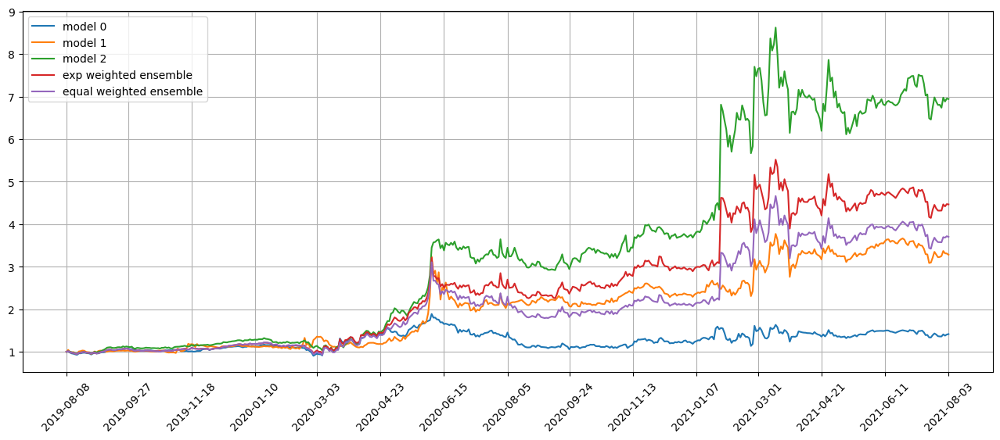

Standardization data are from 2019-12-30 to 2020-10-13
Training data are from 2020-10-14 to 2021-07-30
Testing data are from 2021-07-06 to 2021-08-27
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 26 out of 67 iterations
Restoring model weights from the end of the best epoch: 9.
Epoch 29: early stopping
Restoring model weights from the end of the best epoch: 3.
Epoch 23: early stopping
Restoring model weights from the end of the best epoch: 17.
Epoch 37: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 0.027967171743512154
11/11 [==============================] - 0s 3ms/step
Model 0 test loss 0.024025309830904007
96/96 [==============================] - 0s 4ms/step
Model 1 training loss 0.029232162982225418
11/11 [==============================] - 0s 3ms/step
Model 1 test loss 0.024665329605340958
96/96 [==============================] - 0s 4ms/step
Model 2 training loss 0

top_stocks by model 0 to buy on 2021-08-06 are ['STNG', 'CPA', 'TRGP', 'CCOI', 'EWZ', 'CSGS', 'IPGP', 'DINO', 'GME', 'AEHR']
position on 2021-08-09 market open will be {'AEHR': 0.1476953659847263, 'GME': 0.1394916834152216, 'EWZ': 0.1417155206237769, 'CPA': 0.1374333875627712, 'DINO': 0.134765702651371, 'TRGP': 0.13947864125869308, 'CCOI': 0.14671579913449584, 'STNG': 0.14715745127527693, 'IPGP': 0.14298151963824185, 'CSGS': 0.14104230476881185}
Total asset on 2021-08-09 will be 1.4184773763133667
It should be the same as 1.4184773763133864
top_stocks by model 1 to buy on 2021-08-06 are ['AAL', 'KMPR', 'DINO', 'EWZ', 'EHTH', 'IPGP', 'CCOI', 'CPA', 'CSGS', 'BAP']
position on 2021-08-09 market open will be {'EWZ': 0.33103301153801074, 'KMPR': 0.34168741712637735, 'CPA': 0.3210303851725161, 'DINO': 0.31479894512862894, 'BAP': 0.33484663107441526, 'CCOI': 0.34271315247561795, 'AAL': 0.32617362236527975, 'EHTH': 0.3442242636691846, 'IPGP': 0.33399025619630807, 'CSGS': 0.32946044791969087}
T

top_stocks by model 0 to buy on 2021-08-11 are ['KAR', 'FRO', 'TRUP', 'SSYS', 'HCC', 'TLH', 'IEI', 'COHR', 'RBA', 'AEHR']
position on 2021-08-12 market open will be {'TRUP': 0.13742558519454254, 'FRO': 0.13692584293822707, 'TLH': 0.1359334885756173, 'KAR': 0.13862105353576668, 'HCC': 0.1440078184748052, 'RBA': 0.13784839928881687, 'SSYS': 0.13661488773953895, 'IEI': 0.13617588159364175, 'COHR': 0.13540745359571071, 'AEHR': 0.1322462893439371}
Total asset on 2021-08-12 will be 1.3712067002805837
It should be the same as 1.371206700280604
top_stocks by model 1 to buy on 2021-08-11 are ['COHR', 'HCC', 'ARKK', 'AGQ', 'CMPR', 'IEI', 'SNDR', 'TLH', 'UE', 'AEHR']
position on 2021-08-12 market open will be {'UE': 0.32361467148540024, 'ARKK': 0.31689528239366854, 'AGQ': 0.3165040573096378, 'TLH': 0.3206011045525728, 'HCC': 0.3396445287398473, 'IEI': 0.32117279200155074, 'COHR': 0.31936044342220293, 'AEHR': 0.3119047916809696, 'CMPR': 0.32211876904346204, 'SNDR': 0.32975520081135556}
Total asset

top_stocks by model 0 to buy on 2021-08-16 are ['DK', 'FANG', 'WIX', 'TRUP', 'PRGO', 'BOIL', 'OKTA', 'UNG', 'BAND', 'WW']
position on 2021-08-17 market open will be {'BOIL': 0.13093458582438725, 'UNG': 0.1329161236966982, 'WIX': 0.13193292381713864, 'FANG': 0.13123278976685385, 'WW': 0.13687839756142559, 'OKTA': 0.13272835959007276, 'BAND': 0.13206255623784324, 'DK': 0.12959174225609738, 'TRUP': 0.1284401351352825, 'PRGO': 0.13527056971527313}
Total asset on 2021-08-17 will be 1.3219881836010516
It should be the same as 1.3219881836010725
top_stocks by model 1 to buy on 2021-08-16 are ['OKTA', 'GWRE', 'BL', 'WW', 'AMED', 'GOOS', 'DBO', 'YANG', 'UNG', 'BOIL']
position on 2021-08-17 market open will be {'DBO': 0.31212994147330736, 'BOIL': 0.31006749362263725, 'UNG': 0.3138224131869976, 'YANG': 0.3478919159575169, 'AMED': 0.3246008797236555, 'WW': 0.32317756372369216, 'OKTA': 0.3133790916138712, 'GWRE': 0.3135739098494684, 'BL': 0.3170152286516501, 'GOOS': 0.31015243197491293}
Total asset

top_stocks by model 0 to buy on 2021-08-19 are ['KOS', 'ET', 'APA', 'BCO', 'CRK', 'XOM', 'FRO', 'APPF', 'STNG', 'DHT']
position on 2021-08-20 market open will be {'CRK': 0.1233859422460384, 'FRO': 0.1270625845883802, 'APPF': 0.1318693936554774, 'KOS': 0.12505079256087417, 'APA': 0.12850694564846482, 'BCO': 0.13233007649542655, 'ET': 0.1296643989556838, 'STNG': 0.1257370609125359, 'XOM': 0.12832278980839154, 'DHT': 0.12696489943575298}
Total asset on 2021-08-20 will be 1.2788948843070052
It should be the same as 1.2788948843070258
top_stocks by model 1 to buy on 2021-08-19 are ['LIT', 'CBOE', 'HSBC', 'TREE', 'DBO', 'CARG', 'EHTH', 'BCO', 'PBW', 'PPC']
position on 2021-08-20 market open will be {'DBO': 0.2978988122477825, 'CBOE': 0.32754990563337794, 'TREE': 0.31005434059172304, 'PPC': 0.3121658306386992, 'BCO': 0.3152702385092108, 'CARG': 0.3025237122551971, 'PBW': 0.3055914850004413, 'EHTH': 0.30033499281761583, 'LIT': 0.3137847777094221, 'HSBC': 0.310893965723645}
Total asset on 2021-

top_stocks by model 0 to buy on 2021-08-24 are ['LULU', 'NVDA', 'PRO', 'CTRA', 'ASR', 'NGVT', 'CPRI', 'IRBT', 'SOXL', 'RGLD']
position on 2021-08-25 market open will be {'LULU': 0.1358502041691597, 'ASR': 0.13843480325835356, 'NGVT': 0.13621788572107943, 'SOXL': 0.13601292438397833, 'RGLD': 0.13276358122250487, 'CPRI': 0.14070185539298666, 'PRO': 0.13998579416052076, 'CTRA': 0.1342956648409778, 'IRBT': 0.13873399128776337, 'NVDA': 0.13529760688118103}
Total asset on 2021-08-25 will be 1.3682943113184853
It should be the same as 1.3682943113185058
top_stocks by model 1 to buy on 2021-08-24 are ['PVH', 'RGLD', 'CPRI', 'PRO', 'WKC', 'ARCH', 'WW', 'CXW', 'BVN', 'CNNE']
position on 2021-08-25 market open will be {'CXW': 0.31848209718131876, 'WKC': 0.3160376450953622, 'CNNE': 0.3199467767835459, 'ARCH': 0.3306888536506026, 'RGLD': 0.3087015317374889, 'CPRI': 0.3271595860714772, 'PRO': 0.325494602367026, 'BVN': 0.3254114446748657, 'PVH': 0.32334348754442954, 'WW': 0.32613967827470636}
Total a

top_stocks by model 0 to buy on 2021-08-27 are ['VLO', 'CVX', 'UNG', 'ARCH', 'CRK', 'PSX', 'KOS', 'DK', 'PBF', 'WKC']
position on 2021-08-30 market open will be {'UNG': 0.1452450446040159, 'WKC': 0.1406959343891113, 'PSX': 0.14222847016986884, 'VLO': 0.14254288663216058, 'KOS': 0.1479377554540924, 'CVX': 0.13991601960063774, 'ARCH': 0.145956326342686, 'CRK': 0.15124139914515494, 'PBF': 0.14769494881465892, 'DK': 0.14746757156439072}
Total asset on 2021-08-30 will be 1.4509263567167572
It should be the same as 1.4509263567167772
top_stocks by model 1 to buy on 2021-08-27 are ['KEX', 'WKC', 'HSBC', 'NAIL', 'CRI', 'ARKW', 'UNG', 'BOIL', 'MNRO', 'CARG']
position on 2021-08-30 market open will be {'BOIL': 0.35791710903289803, 'UNG': 0.34252359000210725, 'NAIL': 0.334619863841427, 'MNRO': 0.3250836928738316, 'WKC': 0.3329883446471484, 'CRI': 0.3192968848719955, 'ARKW': 0.32414943722449546, 'CARG': 0.3368507033408698, 'KEX': 0.33112582154870385, 'HSBC': 0.3213040809208537}
Total asset on 2021

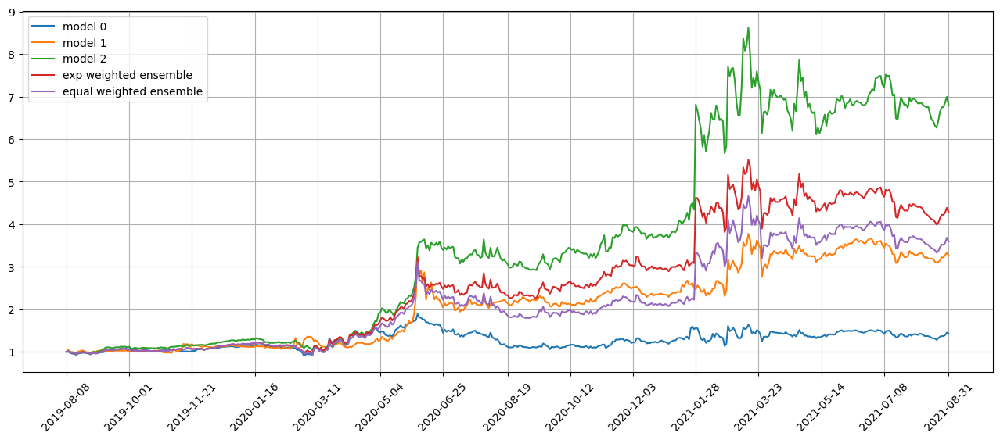

Standardization data are from 2020-01-29 to 2020-11-10
Training data are from 2020-11-11 to 2021-08-27
Testing data are from 2021-08-03 to 2021-09-27
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 27 out of 67 iterations
Restoring model weights from the end of the best epoch: 20.
Epoch 40: early stopping
Restoring model weights from the end of the best epoch: 16.
Epoch 36: early stopping
Restoring model weights from the end of the best epoch: 39.
Epoch 59: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 0.027362190186977386
11/11 [==============================] - 0s 3ms/step
Model 0 test loss 0.02325942926108837
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 0.027695901691913605
11/11 [==============================] - 0s 3ms/step
Model 1 test loss 0.023309776559472084
96/96 [==============================] - 0s 3ms/step
Model 2 training loss 

position on 2021-09-03 market open will be {'BOIL': 0.7651667919073794, 'CVNA': 0.6704714995102552, 'WFC': 0.6728534568566664, 'GME': 0.6975291267685828, 'YANG': 0.7256160190339513, 'UCO': 0.7016047823538412, 'UWM': 0.7030043458277734, 'DBO': 0.7029321340068033, 'RBA': 0.7085527744539473, 'TRUP': 0.6804967904176887}
Total asset on 2021-09-03 will be 7.028227721136857
It should be the same as 7.028227721136889
top_stocks by return weighted ensemble to buy on 2021-09-02 are ['UNG', 'PLUG', 'RDFN', 'WFC', 'UCO', 'GME', 'TRUP', 'RBA', 'YANG', 'BOIL']
position on 2021-09-03 market open will be {'BOIL': 0.48124751175977504, 'UNG': 0.45789946197406756, 'WFC': 0.42318753939131976, 'GME': 0.44006373499440116, 'YANG': 0.45778345771328355, 'UCO': 0.4426350229171127, 'RBA': 0.4470184375114952, 'PLUG': 0.4417026991742597, 'RDFN': 0.44023042255974376, 'TRUP': 0.42931821446685187}
Total asset on 2021-09-03 will be 4.4610865024623125
It should be the same as 4.46108650246231
top_stocks by equal weight

top_stocks by return weighted ensemble to buy on 2021-09-08 are ['ACMR', 'LYG', 'ROL', 'MKTX', 'GPI', 'INFY', 'VEEV', 'CIB', 'GME', 'CACC']
position on 2021-09-09 market open will be {'CIB': 0.44201589260817803, 'GME': 0.395070702343846, 'GPI': 0.44759004350291953, 'LYG': 0.4409031011859058, 'MKTX': 0.44324168673951003, 'CACC': 0.4508443121840395, 'VEEV': 0.4400189367290398, 'INFY': 0.4415003403713208, 'ACMR': 0.4354758240205071, 'ROL': 0.4521451065359448}
Total asset on 2021-09-09 will be 4.388805946221212
It should be the same as 4.388805946221212
top_stocks by equal weighted ensemble to buy on 2021-09-08 are ['ACMR', 'LYG', 'ROL', 'MKTX', 'GPI', 'INFY', 'VEEV', 'CIB', 'GME', 'CACC']
position on 2021-09-09 market open will be {'CIB': 0.3696941969382309, 'GME': 0.3304300783734507, 'GPI': 0.37435631717667833, 'LYG': 0.3687634780702074, 'MKTX': 0.3707194292535678, 'CACC': 0.3770781293712329, 'VEEV': 0.36802397871213305, 'INFY': 0.3692629982565274, 'ACMR': 0.364224200395407, 'ROL': 0.378

top_stocks by model 0 to buy on 2021-09-14 are ['SAN', 'FOXF', 'UA', 'MOH', 'VLO', 'XRT', 'GOOS', 'WB', 'SLB', 'KRNT']
position on 2021-09-15 market open will be {'GOOS': 0.14600798236909412, 'SAN': 0.1416609212449522, 'VLO': 0.14084521767396507, 'FOXF': 0.1402759570740326, 'KRNT': 0.14043645411765696, 'MOH': 0.14192998861801814, 'WB': 0.1433414447070879, 'SLB': 0.14261774745673894, 'UA': 0.14209070516306774, 'XRT': 0.14186149723775532}
Total asset on 2021-09-15 will be 1.4210679156623487
It should be the same as 1.421067915662369
top_stocks by model 1 to buy on 2021-09-14 are ['NUE', 'PARR', 'SLB', 'CVNA', 'SYF', 'SNBR', 'GPI', 'HSBC', 'TROX', 'GME']
position on 2021-09-15 market open will be {'GME': 0.32967344055029674, 'PARR': 0.33153119725982266, 'SNBR': 0.3307730924096353, 'GPI': 0.33531551707737883, 'NUE': 0.33133355461215475, 'TROX': 0.3514163280222882, 'CVNA': 0.34089654876117126, 'SLB': 0.33259716926779365, 'SYF': 0.32937725110931587, 'HSBC': 0.32938331570452745}
Total asset o

top_stocks by model 0 to buy on 2021-09-17 are ['LAD', 'AMRC', 'LSTR', 'TSEM', 'DAR', 'TNA', 'TRUP', 'URTY', 'DE', 'TQQQ']
position on 2021-09-20 market open will be {'AMRC': 0.14027215249161953, 'DAR': 0.13527934749568193, 'URTY': 0.13471380104374178, 'TSEM': 0.14072626214105374, 'DE': 0.13848776774534444, 'TQQQ': 0.13173903406921345, 'LSTR': 0.1392402007846371, 'TNA': 0.1348558785839455, 'TRUP': 0.14022335927258917, 'LAD': 0.1378407847787689}
Total asset on 2021-09-20 will be 1.3733785884065755
It should be the same as 1.3733785884065957
top_stocks by model 1 to buy on 2021-09-17 are ['NBIX', 'TSEM', 'VIPS', 'MUSA', 'TECL', 'SFIX', 'MGM', 'LAD', 'DE', 'ROL']
position on 2021-09-20 market open will be {'MUSA': 0.3457870126771107, 'SFIX': 0.33152633699119094, 'TSEM': 0.32996451748434047, 'TECL': 0.30770391260242264, 'DE': 0.32471586160494764, 'VIPS': 0.31941505729987013, 'NBIX': 0.3326930628231142, 'MGM': 0.3303685816726952, 'ROL': 0.3279427099126812, 'LAD': 0.32319886385954666}
Total 

Testing data from 2021-08-24 to 2021-09-21 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2021-09-22 are ['VLO', 'YY', 'HAL', 'DINO', 'PARR', 'SLB', 'OIH', 'TS', 'TDW', 'PTGX']
position on 2021-09-23 market open will be {'PARR': 0.14610434882309212, 'TS': 0.13969288862585086, 'PTGX': 0.13523308103731094, 'HAL': 0.140328292144762, 'VLO': 0.14260720541058594, 'DINO': 0.14538473570101038, 'YY': 0.13668285903344415, 'SLB': 0.13893913751313164, 'OIH': 0.13978237585794395, 'TDW': 0.14233077014392215}
Total asset on 2021-09-23 will be 1.4070856942910337
It should be the same as 1.4070856942910543
top_stocks by model 1 to buy on 2021-09-22 are ['DK', 'SATS', 'VLO', 'FAS', 'TS', 'CVI', 'PARR', 'TDW', 'YY', 'PTGX']
position on 2021-09-23 market open will be {'FAS': 0.34692600402263424, 'PARR': 0.34483556447844815, 'CVI': 0.3522507736373331, 'PTGX': 0.3191771922691077, 'VLO': 0.336581604672133, 'YY': 0.32259895909324493, 'TS': 0.3297032325933527, 'DK': 0.34355264494198967, 'TD

top_stocks by model 0 to buy on 2021-09-27 are ['URTY', 'BMA', 'UA', 'XRT', 'CNI', 'NAIL', 'BFH', 'FDS', 'EEFT', 'FAS']
position on 2021-09-28 market open will be {'FAS': 0.15237569742691542, 'NAIL': 0.14878537155747942, 'URTY': 0.1499117740761017, 'CNI': 0.1479394745647631, 'FDS': 0.15071607790546596, 'BFH': 0.14870142094332617, 'BMA': 0.1489013320157134, 'EEFT': 0.14818832053104322, 'UA': 0.144257835055399, 'XRT': 0.1478569419561825}
Total asset on 2021-09-28 will be 1.4876342460323695
It should be the same as 1.48763424603239
top_stocks by model 1 to buy on 2021-09-27 are ['DPST', 'ADBE', 'NAIL', 'FRO', 'BDC', 'UAA', 'ATUS', 'FAS', 'UA', 'DHT']
position on 2021-09-28 market open will be {'FRO': 0.34822207090305685, 'NAIL': 0.3533740243380832, 'ATUS': 0.33612682144693606, 'ADBE': 0.33644481414702304, 'DPST': 0.3837120771827241, 'FAS': 0.35314483930166113, 'UA': 0.3426208583693465, 'DHT': 0.3547617733238158, 'UAA': 0.3395558692303145, 'BDC': 0.35156207839628956}
Total asset on 2021-09

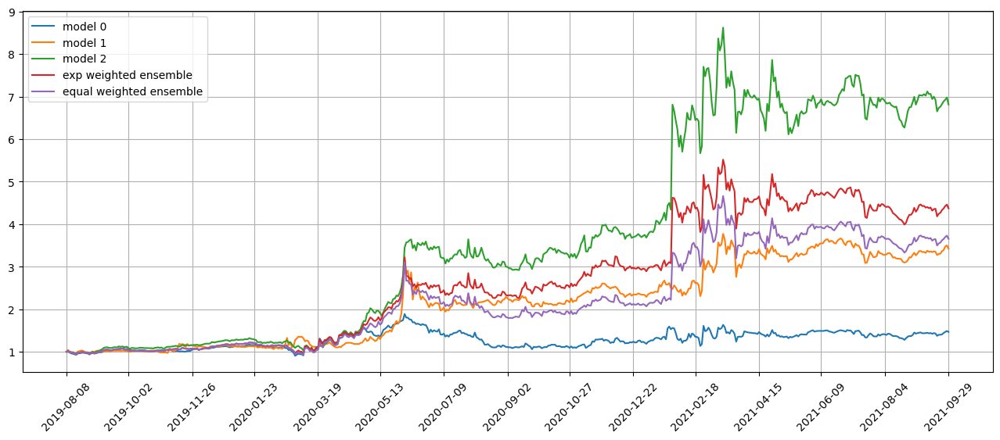

Standardization data are from 2020-02-27 to 2020-12-09
Training data are from 2020-12-10 to 2021-09-27
Testing data are from 2021-08-31 to 2021-10-25
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 28 out of 67 iterations
Restoring model weights from the end of the best epoch: 3.
Epoch 23: early stopping
Restoring model weights from the end of the best epoch: 10.
Epoch 30: early stopping
Restoring model weights from the end of the best epoch: 3.
Epoch 23: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 0.02681005373597145
11/11 [==============================] - 0s 3ms/step
Model 0 test loss 0.02372545748949051
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 0.027298852801322937
11/11 [==============================] - 0s 3ms/step
Model 1 test loss 0.0237298384308815
96/96 [==============================] - 0s 3ms/step
Model 2 training loss 0.027

top_stocks by model 2 to buy on 2021-10-01 are ['FND', 'SVXY', 'EXK', 'CVNA', 'ASML', 'HBI', 'GOLF', 'DDS', 'SOXL', 'GME']
position on 2021-10-04 market open will be {'GOLF': 0.6607108710728226, 'SOXL': 0.6357058978100399, 'EXK': 0.6479613381840822, 'GME': 0.6544707016017223, 'DDS': 0.6728305229509589, 'CVNA': 0.6522577300864734, 'HBI': 0.674649220478979, 'FND': 0.647555883612846, 'ASML': 0.6528825510155933, 'SVXY': 0.6715514983737327}
Total asset on 2021-10-04 will be 6.570576215187221
It should be the same as 6.570576215187249
top_stocks by return weighted ensemble to buy on 2021-10-01 are ['BOTZ', 'DECK', 'SOXL', 'EXK', 'DDS', 'SVXY', 'HBI', 'GOLF', 'ASML', 'GME']
position on 2021-10-04 market open will be {'GOLF': 0.42419770965269166, 'ASML': 0.41198523700759826, 'SOXL': 0.4081437095561349, 'EXK': 0.41767686300552936, 'GME': 0.4218728085538585, 'DDS': 0.43370757728864456, 'HBI': 0.4348799124782536, 'SVXY': 0.4328831161030128, 'BOTZ': 0.4219730293577579, 'DECK': 0.43387712503836345}

position on 2021-10-07 market open will be {'GME': 0.6606530973680185, 'KALU': 0.6649139580527201, 'WSFS': 0.6665134946980973, 'DAR': 0.6635105064302477, 'EQIX': 0.657125512929086, 'KAR': 0.6702064567935989, 'TECS': 0.6023782163325876, 'TNL': 0.6614304435940312, 'SQQQ': 0.6068027945793288, 'PRGO': 0.663711512190989}
Total asset on 2021-10-07 will be 6.517245992968674
It should be the same as 6.5172459929687045
top_stocks by return weighted ensemble to buy on 2021-10-06 are ['PRGO', 'SMFG', 'CYRX', 'WSFS', 'EQIX', 'BJRI', 'KAR', 'DAR', 'UPS', 'GME']
position on 2021-10-07 market open will be {'GME': 0.42367495453665754, 'WSFS': 0.431288210759834, 'DAR': 0.4293450341440923, 'EQIX': 0.4252134262400745, 'SMFG': 0.42375047044489905, 'KAR': 0.43367785632176553, 'UPS': 0.4340110074256051, 'CYRX': 0.4329670127594583, 'BJRI': 0.42254957989570163, 'PRGO': 0.42947510115037524}
Total asset on 2021-10-07 will be 4.285952653678463
It should be the same as 4.285952653678463
top_stocks by equal weight

position on 2021-10-12 market open will be {'DBI': 0.5943163486655607, 'XENE': 0.6454464225496752, 'MODG': 0.6502185628398824, 'WFC': 0.6356109838750265, 'CMG': 0.6410521382780566, 'RYAAY': 0.6311138224885454, 'FAS': 0.6259115243228428, 'INFY': 0.6484301266238078, 'EBAY': 0.6523523421968186, 'MELI': 0.6361552405249696}
Total asset on 2021-10-12 will be 6.360607512365153
It should be the same as 6.360607512365186
top_stocks by return weighted ensemble to buy on 2021-10-11 are ['CMG', 'CVNA', 'MRVL', 'RYAAY', 'TSCO', 'MODG', 'MELI', 'EBAY', 'INFY', 'XENE']
position on 2021-10-12 market open will be {'MRVL': 0.42973362903237416, 'MODG': 0.4301052819683969, 'CVNA': 0.42295883277214663, 'TSCO': 0.42506583271503157, 'CMG': 0.424041893676948, 'RYAAY': 0.41746791631113833, 'XENE': 0.40191147217346473, 'INFY': 0.4289222707365465, 'EBAY': 0.43151673009433944, 'MELI': 0.4208027034888627}
Total asset on 2021-10-12 will be 4.232526562969248
It should be the same as 4.232526562969249
top_stocks by e

top_stocks by model 2 to buy on 2021-10-14 are ['DFS', 'BLMN', 'DPST', 'DBI', 'APAM', 'SNBR', 'BBWI', 'SE', 'XRT', 'FAS']
position on 2021-10-15 market open will be {'SNBR': 0.6748960184688835, 'DFS': 0.6800045681311226, 'APAM': 0.6750480876018439, 'DBI': 0.6782156579989705, 'DPST': 0.6850743871776348, 'FAS': 0.6881970021232837, 'BLMN': 0.6945416799558229, 'SE': 0.6494581821767167, 'XRT': 0.6732209208394583, 'BBWI': 0.6755172254039383}
Total asset on 2021-10-15 will be 6.774173729877642
It should be the same as 6.774173729877676
top_stocks by return weighted ensemble to buy on 2021-10-14 are ['KWR', 'FAS', 'DFS', 'BBWI', 'GOLF', 'APAM', 'SNBR', 'FORM', 'SE', 'XRT']
position on 2021-10-15 market open will be {'GOLF': 0.44277241328652683, 'SNBR': 0.44242793216858783, 'KWR': 0.4414954072798236, 'DFS': 0.4457768407435303, 'APAM': 0.44252762105428456, 'FORM': 0.4496040989400716, 'FAS': 0.4511473889930257, 'SE': 0.42575216434420654, 'XRT': 0.4413298222967168, 'BBWI': 0.44283516423427494}
Tot

position on 2021-10-20 market open will be {'DFEN': 0.6834268650653855, 'MATX': 0.6784161598231292, 'EVRI': 0.6741177143747169, 'PZZA': 0.6740939856036536, 'M': 0.6544734463277536, 'CAKE': 0.6545223401216451, 'ASND': 0.6705931734927274, 'SOXL': 0.7020539067193542, 'TCOM': 0.6886836773185961, 'NMIH': 0.6869493955717519}
Total asset on 2021-10-20 will be 6.767330664418683
It should be the same as 6.767330664418712
top_stocks by return weighted ensemble to buy on 2021-10-19 are ['FUL', 'BFH', 'ASND', 'CSTM', 'PZZA', 'CAKE', 'MATX', 'RVNC', 'EVRI', 'M']
position on 2021-10-20 market open will be {'MATX': 0.4418577067396309, 'PZZA': 0.4390426411473777, 'FUL': 0.4422560428149584, 'BFH': 0.44708496529260155, 'RVNC': 0.44382308797596304, 'M': 0.42626363173860377, 'CAKE': 0.42629547664578926, 'ASND': 0.43676253506696905, 'CSTM': 0.41895437803273494, 'EVRI': 0.4390580958800134}
Total asset on 2021-10-20 will be 4.361398561334639
It should be the same as 4.361398561334642
top_stocks by equal weig

position on 2021-10-25 market open will be {'XENE': 0.3691785682680785, 'UNG': 0.3800049407712076, 'LPSN': 0.3704983796504046, 'HAL': 0.3721618335016378, 'BFH': 0.3674331339537864, 'PBR-A': 0.37930256722512956, 'RUSHA': 0.37272320610986226, 'KALU': 0.35409640685599336, 'ITUB': 0.367626439629069, 'PBR': 0.37634787429395944}
Total asset on 2021-10-25 will be 3.7093733502590953
It should be the same as 3.7093733502591286
Testing data from 2021-09-27 to 2021-10-22 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2021-10-25 are ['MGA', 'ACMR', 'CMG', 'WDFC', 'GME', 'PZZA', 'SOXL', 'GT', 'TCOM', 'XENE']
position on 2021-10-26 market open will be {'XENE': 0.13031019265315885, 'GME': 0.15651357204137373, 'PZZA': 0.15344937072949996, 'MGA': 0.15335580555132328, 'WDFC': 0.1591880985015479, 'GT': 0.1568201291452644, 'CMG': 0.15210298839339997, 'TCOM': 0.14976340884469677, 'SOXL': 0.1578263638447982, 'ACMR': 0.1558323274646711}
Total asset on 2021-10-26 will be 1.5251622571697134

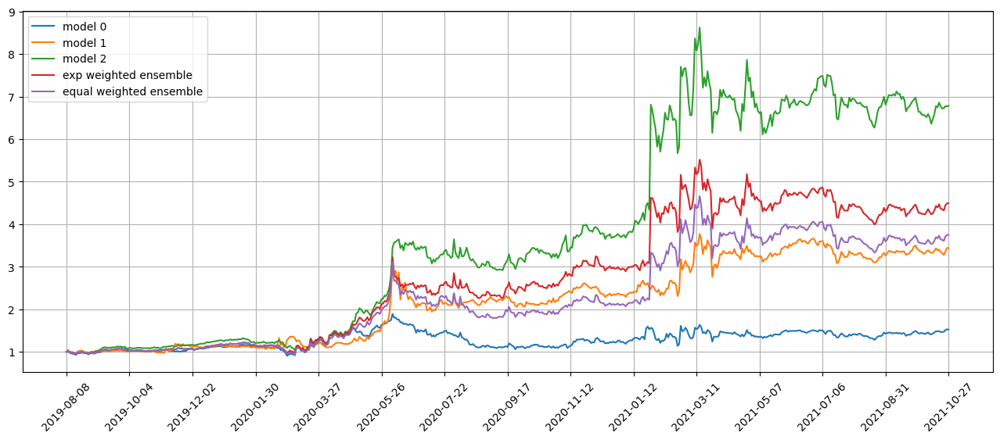

Standardization data are from 2020-03-26 to 2021-01-08
Training data are from 2021-01-11 to 2021-10-25
Testing data are from 2021-09-29 to 2021-11-22
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 29 out of 67 iterations
Restoring model weights from the end of the best epoch: 19.
Epoch 39: early stopping
Restoring model weights from the end of the best epoch: 19.
Epoch 39: early stopping
Restoring model weights from the end of the best epoch: 21.
Epoch 41: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 0.025844041258096695
11/11 [==============================] - 0s 3ms/step
Model 0 test loss 0.027060935273766518
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 0.026375165209174156
11/11 [==============================] - 0s 3ms/step
Model 1 test loss 0.027264554053544998
96/96 [==============================] - 0s 3ms/step
Model 2 training loss

position on 2021-11-01 market open will be {'XENE': 0.45913951590272767, 'FCNCA': 0.4507606110103703, 'VC': 0.4610140336477138, 'EXTR': 0.45217961688108743, 'FIX': 0.4627756294846963, 'THRM': 0.44314082993962683, 'LFUS': 0.45683549927719735, 'ALLY': 0.45853146337916195, 'AGCO': 0.4445006690658309, 'GRMN': 0.4530036668831984}
Total asset on 2021-11-01 will be 4.54188153547161
It should be the same as 4.541881535471611
top_stocks by equal weighted ensemble to buy on 2021-10-29 are ['AGCO', 'FIX', 'LFUS', 'THRM', 'ALLY', 'VC', 'EXTR', 'XENE', 'FCNCA', 'GRMN']
position on 2021-11-01 market open will be {'XENE': 0.38316306293135743, 'FCNCA': 0.37679346902757, 'VC': 0.3853643658418917, 'EXTR': 0.3779796244536165, 'FIX': 0.3868368942532659, 'THRM': 0.3704240488237049, 'LFUS': 0.38187150417106214, 'ALLY': 0.38328917062575324, 'AGCO': 0.371560746416987, 'GRMN': 0.37866845273932587}
Total asset on 2021-11-01 will be 3.795951339284501
It should be the same as 3.7959513392845343
Testing data from 

top_stocks by model 0 to buy on 2021-11-04 are ['LFUS', 'URTY', 'WING', 'UWM', 'SAVA', 'TNA', 'ERJ', 'VC', 'SSTK', 'CAR']
position on 2021-11-05 market open will be {'CAR': 0.13319231287724126, 'SAVA': 0.24217157590470892, 'SSTK': 0.15890831391832216, 'URTY': 0.15968812856595707, 'ERJ': 0.16058492822326, 'UWM': 0.15836191820551146, 'WING': 0.16942767017612864, 'VC': 0.15855217336853605, 'LFUS': 0.15686612814742737, 'TNA': 0.1594122110656389}
Total asset on 2021-11-05 will be 1.6571653604527092
It should be the same as 1.6571653604527314
top_stocks by model 1 to buy on 2021-11-04 are ['SYF', 'SLM', 'ZG', 'NTR', 'TRN', 'VC', 'DFS', 'TX', 'WING', 'CAR']
position on 2021-11-05 market open will be {'CAR': 0.30603821229174205, 'ZG': 0.3668942044945669, 'TX': 0.3564996063184993, 'WING': 0.39864513322419826, 'VC': 0.3730562558629316, 'DFS': 0.36714782682784, 'SLM': 0.3686251742809774, 'NTR': 0.36226218718598197, 'TRN': 0.365188517302336, 'SYF': 0.37125457244007387}
Total asset on 2021-11-05 wi

top_stocks by model 1 to buy on 2021-11-09 are ['SNAP', 'RH', 'VSAT', 'GME', 'VRNS', 'WST', 'HIMX', 'MCHP', 'CGNX', 'CAR']
position on 2021-11-10 market open will be {'VRNS': 0.36565443813633847, 'GME': 0.3326515927611427, 'WST': 0.36291642504831684, 'VSAT': 0.3588353779529188, 'CGNX': 0.36687994625309434, 'CAR': 0.3080612554125169, 'SNAP': 0.35621875807373304, 'MCHP': 0.35373130819842646, 'RH': 0.3605024456961702, 'HIMX': 0.3334834828850833}
Total asset on 2021-11-10 will be 3.49893503041771
It should be the same as 3.4989350304177407
top_stocks by model 2 to buy on 2021-11-09 are ['VRNS', 'CACC', 'PANW', 'UPBD', 'MDB', 'MCHP', 'VSAT', 'GME', 'XENE', 'CAR']
position on 2021-11-10 market open will be {'XENE': 0.7396006132334698, 'VRNS': 0.7852357761627473, 'GME': 0.7143628092274785, 'VSAT': 0.7705919773807084, 'CAR': 0.6615555392474753, 'CACC': 0.7796097903743161, 'UPBD': 0.8151608044282462, 'PANW': 0.7703834893496586, 'MDB': 0.7739895319750264, 'MCHP': 0.7596310871049469}
Total asset 

top_stocks by model 1 to buy on 2021-11-12 are ['TPIC', 'XENE', 'WKC', 'EMN', 'ATGE', 'MCY', 'IMO', 'BCRX', 'SPTS', 'SHY']
position on 2021-11-15 market open will be {'XENE': 0.3250859714024102, 'EMN': 0.34678370138061826, 'WKC': 0.35142171976213354, 'TPIC': 0.33567185737869637, 'IMO': 0.3465572235413547, 'ATGE': 0.341020717136037, 'SHY': 0.3431237311277799, 'SPTS': 0.3430837268118221, 'MCY': 0.3389154100654313, 'BCRX': 0.3405814912055275}
Total asset on 2021-11-15 will be 3.4122455498117805
It should be the same as 3.412245549811811
top_stocks by model 2 to buy on 2021-11-12 are ['DBO', 'VCEL', 'NBR', 'CX', 'SPTS', 'MCY', 'WKC', 'IMO', 'SHY', 'XENE']
position on 2021-11-15 market open will be {'XENE': 0.6626721112481997, 'WKC': 0.7680736194828609, 'DBO': 0.7411841095243327, 'CX': 0.7464466762420936, 'IMO': 0.7574416892146258, 'VCEL': 0.7362772021900659, 'SHY': 0.7499373865569916, 'NBR': 0.7020832072354937, 'SPTS': 0.7498499524058713, 'MCY': 0.7407396044947676}
Total asset on 2021-11-1

top_stocks by model 1 to buy on 2021-11-17 are ['DVN', 'EOG', 'HCC', 'ERJ', 'XENE', 'GNRC', 'FTI', 'FCFS', 'CMP', 'GME']
position on 2021-11-18 market open will be {'GME': 0.3385363858251441, 'ERJ': 0.33458017459140454, 'EOG': 0.32928330353610685, 'HCC': 0.31564124597001064, 'FTI': 0.31877432039146647, 'DVN': 0.3280027901082316, 'XENE': 0.32696939912066664, 'CMP': 0.32205454936482064, 'FCFS': 0.33193934317662344, 'GNRC': 0.3247858037881582}
Total asset on 2021-11-18 will be 3.2705673158726043
It should be the same as 3.270567315872633
top_stocks by model 2 to buy on 2021-11-17 are ['PTEN', 'NOVT', 'ERJ', 'FCFS', 'GNRC', 'GME', 'SAVA', 'VTNR', 'XENE', 'CAR']
position on 2021-11-18 market open will be {'XENE': 0.6432309361422102, 'CAR': 0.7557939481336999, 'VTNR': 0.7527081468072274, 'SAVA': 0.588268235490745, 'GME': 0.7380364012991615, 'ERJ': 0.7294115443443862, 'NOVT': 0.7140872255833386, 'PTEN': 0.708021411951032, 'FCFS': 0.7236543206147943, 'GNRC': 0.7080590325220644}
Total asset on 

top_stocks by model 2 to buy on 2021-11-22 are ['VSAT', 'TPIC', 'MEOH', 'HP', 'MNRO', 'TSE', 'PPBI', 'MMS', 'XENE', 'CAR']
position on 2021-11-23 market open will be {'XENE': 0.5675566919428354, 'HP': 0.7062294094542609, 'MNRO': 0.7119019667905481, 'MEOH': 0.7089355360914245, 'VSAT': 0.6938216342379575, 'MMS': 0.6995606788308206, 'CAR': 0.7258440695377707, 'TPIC': 0.6617085734659843, 'TSE': 0.7072687545313344, 'PPBI': 0.6982655697319712}
Total asset on 2021-11-23 will be 6.881092884614869
It should be the same as 6.881092884614907
top_stocks by return weighted ensemble to buy on 2021-11-22 are ['TPIC', 'VSAT', 'CLM', 'MNRO', 'KRNT', 'MEOH', 'TSE', 'HP', 'MMS', 'CAR']
position on 2021-11-23 market open will be {'CLM': 0.4723798587920092, 'HP': 0.4673282309123818, 'MNRO': 0.47272348848376927, 'MEOH': 0.47075369273400186, 'VSAT': 0.4607176249296348, 'MMS': 0.4645285164667562, 'CAR': 0.4819814478024928, 'TPIC': 0.4393936241230956, 'TSE': 0.46964690158805467, 'KRNT': 0.45190469358816177}
To

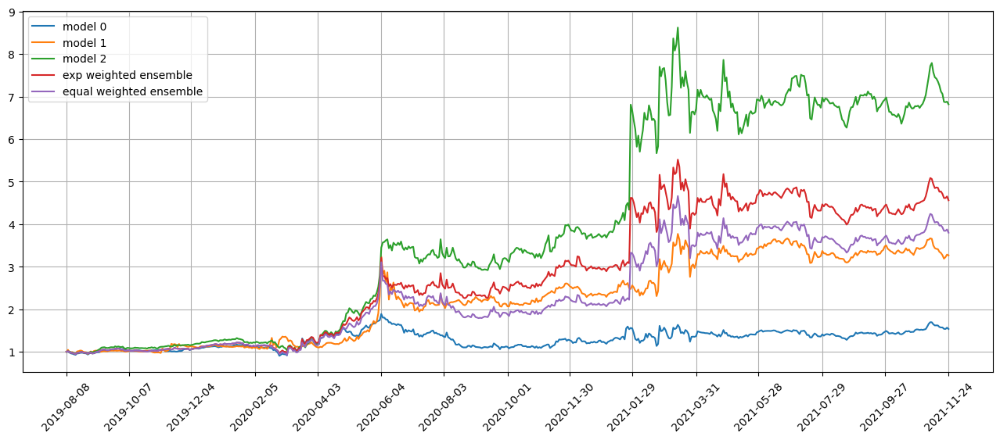

Standardization data are from 2020-04-24 to 2021-02-08
Training data are from 2021-02-09 to 2021-11-22
Testing data are from 2021-10-27 to 2021-12-21
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 30 out of 67 iterations
Restoring model weights from the end of the best epoch: 30.
Epoch 50: early stopping
Restoring model weights from the end of the best epoch: 64.
Epoch 84: early stopping
Restoring model weights from the end of the best epoch: 43.
Epoch 63: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 0.025351891294121742
11/11 [==============================] - 0s 3ms/step
Model 0 test loss 0.0354975089430809
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 0.025310911238193512
11/11 [==============================] - 0s 3ms/step
Model 1 test loss 0.035607267171144485
96/96 [==============================] - 0s 3ms/step
Model 2 training loss 0

position on 2021-11-30 market open will be {'AXP': 0.4328074113542726, 'UCO': 0.3976073072377312, 'MMS': 0.4430382291039896, 'IPG': 0.43862210160047654, 'UFPI': 0.4344454192763213, 'BNO': 0.41896129800243426, 'DPST': 0.4091422789321912, 'SVXY': 0.44248537194139403, 'RHP': 0.4351166671777325, 'KFY': 0.43823582053025734}
Total asset on 2021-11-30 will be 4.2904619051567945
It should be the same as 4.290461905156801
top_stocks by equal weighted ensemble to buy on 2021-11-29 are ['SVXY', 'MMS', 'AXP', 'RHP', 'IPG', 'UFPI', 'BNO', 'KFY', 'DPST', 'UCO']
position on 2021-11-30 market open will be {'AXP': 0.3605295493459756, 'UCO': 0.3312077832644789, 'MMS': 0.3690518435950615, 'IPG': 0.3653731994292556, 'UFPI': 0.3618940136376417, 'BNO': 0.3489957057102772, 'DPST': 0.34081644068952044, 'SVXY': 0.3685913123323005, 'RHP': 0.36245316465272703, 'KFY': 0.36505142642696053}
Total asset on 2021-11-30 will be 3.573964439084163
It should be the same as 3.5739644390841994
Testing data from 2021-11-01 t

position on 2021-12-03 market open will be {'DBO': 0.3695458079648695, 'PRTA': 0.36429122935081826, 'PDBC': 0.2672626669666763, 'DBC': 0.3456945115643739, 'PARR': 0.3613933187600936, 'NOG': 0.35818542001106735, 'RRC': 0.35355346991672665, 'WK': 0.3569979791695946, 'COMT': 0.3479049524491202, 'SKYY': 0.34381096609868156}
Total asset on 2021-12-03 will be 3.468640322251985
It should be the same as 3.4686403222520217
Testing data from 2021-11-04 to 2021-12-02 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2021-12-03 are ['GUSH', 'EVRI', 'FAS', 'OVV', 'DDS', 'DPST', 'MTDR', 'SM', 'UCO', 'CAR']
position on 2021-12-06 market open will be {'UCO': 0.13794748183261, 'MTDR': 0.13887988107694574, 'DDS': 0.13040781710486699, 'CAR': 0.13891670407118792, 'SM': 0.13941270151720217, 'OVV': 0.13480786109880044, 'GUSH': 0.13519665488611357, 'DPST': 0.13385580881709958, 'FAS': 0.13725443283326225, 'EVRI': 0.13861863286068135}
Total asset on 2021-12-06 will be 1.3652979760987456
It sho

top_stocks by model 0 to buy on 2021-12-08 are ['MOS', 'MDB', 'INFY', 'ETSY', 'TTD', 'PRTA', 'EPAM', 'TRUP', 'GNRC', 'HUBS']
position on 2021-12-09 market open will be {'HUBS': 0.14581182721410543, 'EPAM': 0.1555358456437362, 'MOS': 0.1409310488118654, 'ETSY': 0.14693613388036988, 'TTD': 0.14567983677909332, 'INFY': 0.14273028443191887, 'MDB': 0.1507032008723712, 'PRTA': 0.1415298578887071, 'TRUP': 0.14146355017361686, 'GNRC': 0.14601335231719412}
Total asset on 2021-12-09 will be 1.4573349380129537
It should be the same as 1.4573349380129783
top_stocks by model 1 to buy on 2021-12-08 are ['PCTY', 'NOW', 'MDB', 'GNRC', 'EPAM', 'ETSY', 'TRUP', 'TTD', 'PRTA', 'HUBS']
position on 2021-12-09 market open will be {'PRTA': 0.28999347091402977, 'HUBS': 0.29617688766623723, 'EPAM': 0.31775129827751075, 'ETSY': 0.3001825534887298, 'TTD': 0.2976160066370975, 'NOW': 0.29386107412892565, 'PCTY': 0.288423363022591, 'MDB': 0.30787846707348987, 'TRUP': 0.2890023617422161, 'GNRC': 0.2982973607956108}
T

top_stocks by model 0 to buy on 2021-12-13 are ['ON', 'DPST', 'UCTT', 'DIOD', 'SOXL', 'GUSH', 'AMBA', 'MARA', 'UCO', 'CAR']
position on 2021-12-14 market open will be {'DIOD': 0.14103880672194455, 'MARA': 0.1347009964551793, 'UCO': 0.14417423135055032, 'ON': 0.13938622246868215, 'CAR': 0.14213054821060458, 'GUSH': 0.13490407291683368, 'AMBA': 0.1376845918124198, 'DPST': 0.1391426066864957, 'UCTT': 0.13660134509941185, 'SOXL': 0.1309155991972904}
Total asset on 2021-12-14 will be 1.3806790209193873
It should be the same as 1.3806790209194122
top_stocks by model 1 to buy on 2021-12-13 are ['DPST', 'BOTZ', 'UCTT', 'SOXL', 'DIOD', 'GUSH', 'MARA', 'SM', 'UCO', 'CAR']
position on 2021-12-14 market open will be {'DIOD': 0.2874430700285596, 'MARA': 0.2745263438970837, 'UCO': 0.29383319840554184, 'CAR': 0.2896680854868701, 'SM': 0.27975417239556094, 'GUSH': 0.27494022233908977, 'DPST': 0.28357853393210614, 'UCTT': 0.2783993350341948, 'SOXL': 0.2668115437341015, 'BOTZ': 0.29412428027748505}
Tota

top_stocks by model 0 to buy on 2021-12-16 are ['KRNT', 'FSLR', 'ALTR', 'IMO', 'BKR', 'PRTA', 'ORCL', 'AXON', 'SM', 'CAR']
position on 2021-12-17 market open will be {'CAR': 0.12782950010664082, 'SM': 0.13091459752189702, 'ALTR': 0.13792808591775213, 'ORCL': 0.13480307299637867, 'FSLR': 0.13365373660347551, 'AXON': 0.13705061387801787, 'IMO': 0.1430537169477893, 'BKR': 0.13974372887283143, 'PRTA': 0.1353756757589983, 'KRNT': 0.13300357362004728}
Total asset on 2021-12-17 will be 1.3533563022238033
It should be the same as 1.3533563022238282
top_stocks by model 1 to buy on 2021-12-16 are ['IGLB', 'ABM', 'MTN', 'SCHP', 'ENTG', 'ORCL', 'STIP', 'SM', 'AXON', 'PRTA']
position on 2021-12-17 market open will be {'SM': 0.26600874899588245, 'ORCL': 0.2735939961227926, 'IGLB': 0.29137594366360114, 'AXON': 0.2781555664014875, 'SCHP': 0.28871728919370976, 'ABM': 0.2949433087246039, 'STIP': 0.2909050004756412, 'PRTA': 0.27475614083161737, 'ENTG': 0.2716413187626827, 'MTN': 0.29756283805528255}
Tota

top_stocks by model 0 to buy on 2021-12-21 are ['RBA', 'NVO', 'NXPI', 'RL', 'JCI', 'LULU', 'NTAP', 'DELL', 'CLM', 'BOOT']
position on 2021-12-22 market open will be {'DELL': 0.14212034996639372, 'LULU': 0.14296520127239512, 'BOOT': 0.1441204275970839, 'RBA': 0.14030996709556423, 'NTAP': 0.14177239750518125, 'RL': 0.141187996874074, 'JCI': 0.1405715186283465, 'NVO': 0.1447326931356644, 'CLM': 0.13864445783687807, 'NXPI': 0.14049612015106872}
Total asset on 2021-12-22 will be 1.4169211300626248
It should be the same as 1.4169211300626499
top_stocks by model 1 to buy on 2021-12-21 are ['FORM', 'DELL', 'BOTZ', 'LULU', 'CLM', 'NXPI', 'SAIA', 'ODFL', 'ON', 'BOOT']
position on 2021-12-22 market open will be {'DELL': 0.2963080956662916, 'LULU': 0.29806953434598565, 'BOOT': 0.3004780769115862, 'SAIA': 0.3013005968757741, 'ODFL': 0.2932700630523948, 'ON': 0.3005662312271133, 'FORM': 0.29462161849416024, 'BOTZ': 0.2950228210529202, 'CLM': 0.28906117446266544, 'NXPI': 0.2929217231755318}
Total ass

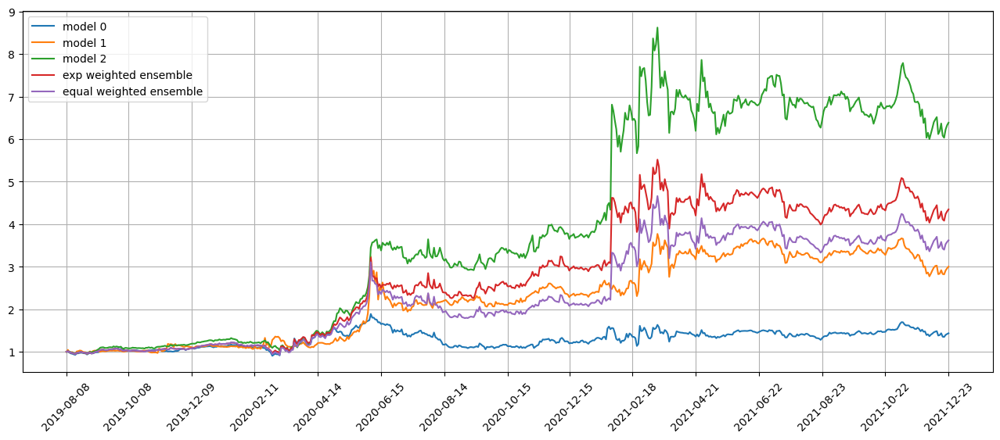

Standardization data are from 2020-05-22 to 2021-03-09
Training data are from 2021-03-10 to 2021-12-21
Testing data are from 2021-11-24 to 2022-01-20
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 31 out of 67 iterations
Restoring model weights from the end of the best epoch: 7.
Epoch 27: early stopping
Restoring model weights from the end of the best epoch: 7.
Epoch 27: early stopping
Restoring model weights from the end of the best epoch: 7.
Epoch 27: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 0.025619765743613243
11/11 [==============================] - 0s 3ms/step
Model 0 test loss 0.030396636575460434
96/96 [==============================] - 0s 4ms/step
Model 1 training loss 0.025757217779755592
11/11 [==============================] - 0s 3ms/step
Model 1 test loss 0.030090749263763428
96/96 [==============================] - 0s 3ms/step
Model 2 training loss 0.

position on 2021-12-29 market open will be {'AEHR': 0.41691457214157274, 'AMC': 0.3760645773030361, 'NAIL': 0.38647458203889967, 'CINF': 0.3845981798169569, 'NTAP': 0.38217829559988586, 'RL': 0.3828408736721486, 'BP': 0.3811888374538364, 'NBR': 0.3726184535625843, 'ADP': 0.38386124470034544, 'RH': 0.3764357668698241}
Total asset on 2021-12-29 will be 3.8431753831590507
It should be the same as 3.84317538315909
Testing data from 2021-11-30 to 2021-12-28 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2021-12-29 are ['FCG', 'IMO', 'UCO', 'OVV', 'HRI', 'NTLA', 'VTLE', 'SM', 'GUSH', 'MTDR']
position on 2021-12-30 market open will be {'UCO': 0.15500412750418885, 'HRI': 0.15611408419631514, 'MTDR': 0.15043808505661255, 'IMO': 0.15043808505661255, 'SM': 0.15262410055623674, 'OVV': 0.15133355330520923, 'NTLA': 0.14994555013385255, 'GUSH': 0.15051961061884409, 'VTLE': 0.15264661496336962, 'FCG': 0.15018135889797088}
Total asset on 2021-12-30 will be 1.5192451702891863
It shou

Testing data from 2021-12-03 to 2021-12-31 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2022-01-03 are ['HP', 'LPG', 'BKR', 'NAIL', 'BP', 'FAS', 'NBR', 'EQNR', 'CEIX', 'UCO']
position on 2022-01-04 market open will be {'NAIL': 0.14424640921837148, 'UCO': 0.16208076299540755, 'EQNR': 0.15716797779872213, 'BKR': 0.16237628625394976, 'BP': 0.16250592015171858, 'FAS': 0.16021148111518074, 'NBR': 0.17332498983050085, 'LPG': 0.1627463569332907, 'HP': 0.16545338432676573, 'CEIX': 0.1598404074874732}
Total asset on 2022-01-04 will be 1.6099539761113546
It should be the same as 1.609953976111381
top_stocks by model 1 to buy on 2022-01-03 are ['PRTA', 'WES', 'LPG', 'RIG', 'CINF', 'CTRA', 'NBR', 'BP', 'XENE', 'AEHR']
position on 2022-01-04 market open will be {'AEHR': 0.36940398416349957, 'XENE': 0.3214317600057421, 'CINF': 0.3219059633064787, 'RIG': 0.34894376135268057, 'WES': 0.3297073097980278, 'PRTA': 0.31817410719035555, 'CTRA': 0.33684809305865016, 'BP': 0.339570598390

Testing data from 2021-12-08 to 2022-01-05 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2022-01-06 are ['CNH', 'KKR', 'TQQQ', 'AR', 'CACC', 'TECL', 'FTNT', 'SOXL', 'ARCB', 'AEHR']
position on 2022-01-07 market open will be {'AEHR': 0.13764799185841414, 'KKR': 0.14940676417359336, 'AR': 0.1539638325174135, 'TECL': 0.1511476504887923, 'CACC': 0.15035185748000232, 'FTNT': 0.15763848782879025, 'ARCB': 0.15141906156383633, 'TQQQ': 0.1519305373731642, 'CNH': 0.14653572044340893, 'SOXL': 0.15233989689351432}
Total asset on 2022-01-07 will be 1.5023818006209029
It should be the same as 1.50238180062093
top_stocks by model 1 to buy on 2022-01-06 are ['KKR', 'CNH', 'DDS', 'LC', 'CACC', 'AMC', 'FDS', 'ANY', 'XENE', 'AEHR']
position on 2022-01-07 market open will be {'AEHR': 0.3160701125594846, 'XENE': 0.3141775876609899, 'AMC': 0.298489093051076, 'ANY': 0.2865019359192155, 'FDS': 0.3221047770699847, 'KKR': 0.3213540906190224, 'DDS': 0.32815615395904374, 'CACC': 0.32338686069

top_stocks by model 1 to buy on 2022-01-11 are ['TVTX', 'DXCM', 'PRTA', 'SIG', 'XBI', 'ANY', 'CPRI', 'AEHR', 'XENE', 'CAR']
position on 2022-01-12 market open will be {'AEHR': 0.23976647120350314, 'XENE': 0.3156079834500553, 'CAR': 0.31382896236303714, 'ANY': 0.3399667723189749, 'PRTA': 0.29614042616804576, 'TVTX': 0.3116847616200845, 'DXCM': 0.3247080026705332, 'CPRI': 0.3154581974069049, 'XBI': 0.314278806971689, 'SIG': 0.3208337232492178}
Total asset on 2022-01-12 will be 3.092274107422008
It should be the same as 3.0922741074220457
top_stocks by model 2 to buy on 2022-01-11 are ['DXCM', 'TVTX', 'ENTA', 'LNW', 'MARA', 'WK', 'SIG', 'CPRI', 'AMN', 'CAR']
position on 2022-01-12 market open will be {'MARA': 0.6970256197138582, 'TVTX': 0.639847902107104, 'DXCM': 0.6665829064796365, 'CAR': 0.6413110593289847, 'ENTA': 0.6437055108729159, 'WK': 0.6675407975546167, 'CPRI': 0.6475942704549922, 'LNW': 0.6593037634592849, 'SIG': 0.658629519387434, 'AMN': 0.6256365658677548}
Total asset on 2022-

position on 2022-01-18 market open will be {'XENE': 0.31882639346313324, 'WM': 0.3021277560296831, 'SXT': 0.29547529088750774, 'UCO': 0.3154552603869844, 'ANY': 0.306280767642938, 'CAR': 0.3041253151879041, 'JEF': 0.30100589930245697, 'NSP': 0.2961620555411208, 'AEHR': 0.2925868395612221, 'SLB': 0.3183984065837446}
Total asset on 2022-01-18 will be 3.0504439845866576
It should be the same as 3.0504439845866953
top_stocks by model 2 to buy on 2022-01-14 are ['BNO', 'PNFP', 'NAIL', 'FAS', 'USO', 'JEF', 'EQNR', 'DPST', 'UCO', 'CAR']
position on 2022-01-18 market open will be {'USO': 0.6371246865369194, 'NAIL': 0.5852952214661545, 'UCO': 0.6501299635728671, 'EQNR': 0.6305002523927775, 'CAR': 0.6267797843730513, 'JEF': 0.6203508989156128, 'BNO': 0.6374872372352832, 'DPST': 0.6623580771573064, 'FAS': 0.6205301714100393, 'PNFP': 0.6398040363048563}
Total asset on 2022-01-18 will be 6.310360329364823
It should be the same as 6.310360329364869
top_stocks by return weighted ensemble to buy on 20

top_stocks by model 1 to buy on 2022-01-20 are ['FIX', 'SF', 'PNFP', 'SONY', 'SLM', 'COF', 'DFS', 'TFIN', 'SYF', 'EVR']
position on 2022-01-21 market open will be {'SONY': 0.2899139739765716, 'TFIN': 0.27842728518273274, 'EVR': 0.2923307476214187, 'DFS': 0.29401128999661186, 'FIX': 0.29676358537290454, 'SF': 0.29135760565993696, 'SLM': 0.28172590488654964, 'COF': 0.29270281956376193, 'SYF': 0.2902230515564715, 'PNFP': 0.29312725822408486}
Total asset on 2022-01-21 will be 2.900583522041007
It should be the same as 2.9005835220410443
top_stocks by model 2 to buy on 2022-01-20 are ['SLM', 'TECL', 'ARCB', 'LPX', 'PIPR', 'EVR', 'DDS', 'NAIL', 'SYNA', 'TFIN']
position on 2022-01-21 market open will be {'SYNA': 0.5624717131230026, 'PIPR': 0.5885118694478225, 'NAIL': 0.5481784306861851, 'TFIN': 0.5696908161698188, 'TECL': 0.5644182378233213, 'DDS': 0.562353205439298, 'LPX': 0.5892321503789191, 'ARCB': 0.579297745170441, 'SLM': 0.5764401308070964, 'EVR': 0.5981387280153948}
Total asset on 2022

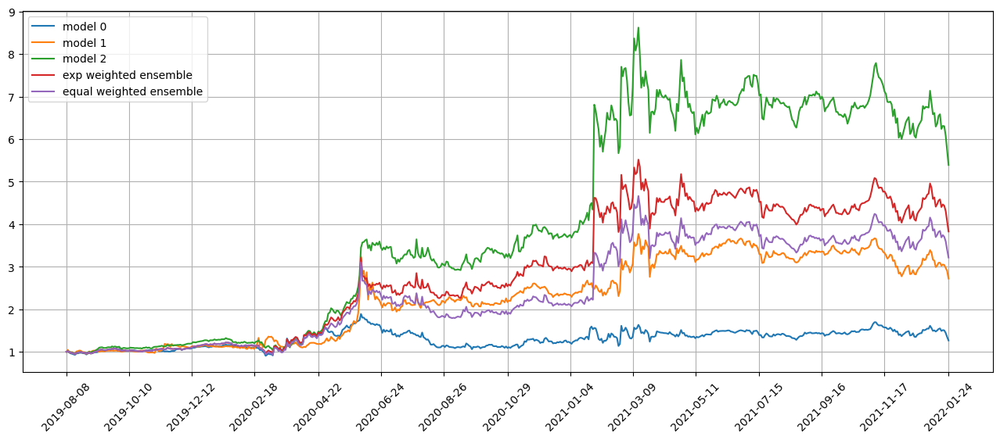

Standardization data are from 2020-06-22 to 2021-04-07
Training data are from 2021-04-08 to 2022-01-20
Testing data are from 2021-12-23 to 2022-02-17
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 32 out of 67 iterations
Restoring model weights from the end of the best epoch: 6.
Epoch 26: early stopping
Restoring model weights from the end of the best epoch: 7.
Epoch 27: early stopping
Restoring model weights from the end of the best epoch: 6.
Epoch 26: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 0.025872325524687767
11/11 [==============================] - 0s 3ms/step
Model 0 test loss 0.0336809977889061
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 0.02585524134337902
11/11 [==============================] - 0s 3ms/step
Model 1 test loss 0.033608172088861465
96/96 [==============================] - 0s 3ms/step
Model 2 training loss 0.025

position on 2022-01-27 market open will be {'VFH': 0.3997462989599361, 'IYG': 0.4019920542548375, 'XLF': 0.40072175451768305, 'IVZ': 0.40188485474608926, 'GUSH': 0.3939127321585792, 'COF': 0.4081863767905252, 'RJF': 0.4097949751397789, 'FAS': 0.4024474794479125, 'IYF': 0.40016053266050455, 'ALLY': 0.4007789470300768}
Total asset on 2022-01-27 will be 4.019626005705912
It should be the same as 4.019626005705923
top_stocks by equal weighted ensemble to buy on 2022-01-26 are ['RJF', 'GUSH', 'VFH', 'XLF', 'IVZ', 'IYF', 'COF', 'IYG', 'FAS', 'ALLY']
position on 2022-01-27 market open will be {'VFH': 0.3366616638305652, 'IYG': 0.33855301270885363, 'XLF': 0.337483181107694, 'IVZ': 0.33846273053470743, 'GUSH': 0.33174870200822604, 'COF': 0.343769798796914, 'RJF': 0.345124541537757, 'FAS': 0.33893656648696213, 'IYF': 0.33701052661481345, 'ALLY': 0.3375313479736068}
Total asset on 2022-01-27 will be 3.385282071600057
It should be the same as 3.3852820716000993
Testing data from 2021-12-29 to 2022

position on 2022-02-01 market open will be {'OXM': 0.3424091327174598, 'QTEC': 0.3473304117728951, 'HTH': 0.34283157506994905, 'STM': 0.3415984881584881, 'XSD': 0.3527661220754523, 'GBCI': 0.33797596993052254, 'MT': 0.34725871981362383, 'EVR': 0.3441120202685877, 'NXPI': 0.36230975692466605, 'GNRC': 0.3501468591576388}
Total asset on 2022-02-01 will be 3.468739055889241
It should be the same as 3.4687390558892837
Testing data from 2022-01-03 to 2022-01-31 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2022-02-01 are ['DFS', 'VPL', 'IYG', 'SUB', 'SCHW', 'LIT', 'HTH', 'EWT', 'ALLY', 'SYF']
position on 2022-02-02 market open will be {'HTH': 0.13757119427033804, 'EWT': 0.13780604522372097, 'SUB': 0.13740887337886967, 'VPL': 0.13928854594156212, 'IYG': 0.13935873961860884, 'DFS': 0.13941539818135115, 'SCHW': 0.13916874770783266, 'ALLY': 0.14015282234133722, 'SYF': 0.13765907216970272, 'LIT': 0.13842077056218158}
Total asset on 2022-02-02 will be 1.3862502093954765
It sho

Testing data from 2022-01-06 to 2022-02-03 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2022-02-04 are ['CLH', 'STM', 'DRI', 'IR', 'GIB', 'SPHY', 'CVLT', 'FNKO', 'PH', 'FIX']
position on 2022-02-07 market open will be {'IR': 0.13763243622090934, 'STM': 0.13797998327497632, 'CVLT': 0.1368092802348389, 'CLH': 0.13880835329084665, 'GIB': 0.13977952039499533, 'DRI': 0.13717794467100192, 'FIX': 0.13697113078817436, 'PH': 0.13435242413652965, 'FNKO': 0.13761723503006212, 'SPHY': 0.1369749103284186}
Total asset on 2022-02-07 will be 1.3741032183707254
It should be the same as 1.374103218370753
top_stocks by model 1 to buy on 2022-02-04 are ['SPHY', 'FORM', 'NXPI', 'ETSY', 'CWEB', 'CROX', 'ANY', 'STM', 'UVXY', 'XENE']
position on 2022-02-07 market open will be {'XENE': 0.27930838785984835, 'ANY': 0.39417781008818015, 'UVXY': 0.2925533675055871, 'CWEB': 0.30070149699468895, 'STM': 0.2953727679484061, 'CROX': 0.2960583509201443, 'ETSY': 0.29975579191095403, 'FORM': 0.293812

Testing data from 2022-01-11 to 2022-02-08 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2022-02-09 are ['WTW', 'MAS', 'TT', 'KNX', 'SIGI', 'AN', 'IT', 'SNDR', 'DDS', 'GPI']
position on 2022-02-10 market open will be {'MAS': 0.13846034421543493, 'TT': 0.13759965515777764, 'GPI': 0.14411862790738655, 'DDS': 0.140842890714184, 'KNX': 0.13897011649748764, 'IT': 0.13370545669976436, 'WTW': 0.1406788651140459, 'AN': 0.1387546836170769, 'SNDR': 0.14142032903800292, 'SIGI': 0.13719800519605618}
Total asset on 2022-02-10 will be 1.3917489741571893
It should be the same as 1.391748974157217
top_stocks by model 1 to buy on 2022-02-09 are ['AVY', 'SNDR', 'MUB', 'ANY', 'LSTR', 'CWEB', 'IT', 'KOLD', 'UVXY', 'XENE']
position on 2022-02-10 market open will be {'XENE': 0.3101745309151053, 'ANY': 0.31409089535547124, 'UVXY': 0.274565987312664, 'CWEB': 0.3210020199985499, 'IT': 0.2862993372751698, 'KOLD': 0.31656930937014144, 'AVY': 0.2983098126970602, 'LSTR': 0.3012260367213591, 'S

top_stocks by model 0 to buy on 2022-02-14 are ['MATX', 'SBH', 'SHYG', 'EC', 'DUK', 'UI', 'DLB', 'VSAT', 'BOIL', 'UNG']
position on 2022-02-15 market open will be {'BOIL': 0.15296293621024384, 'SBH': 0.14362147437070222, 'MATX': 0.13999046109061028, 'UNG': 0.14652786057858688, 'VSAT': 0.14532234318495438, 'UI': 0.14132817042335974, 'SHYG': 0.13946711036903076, 'DLB': 0.14142704859357005, 'EC': 0.13524943812029683, 'DUK': 0.13872686695715628}
Total asset on 2022-02-15 will be 1.4246237098984835
It should be the same as 1.4246237098985113
top_stocks by model 1 to buy on 2022-02-14 are ['UNG', 'SHYG', 'TTMI', 'VTIP', 'BOIL', 'SOXS', 'ANY', 'KOLD', 'UVXY', 'XENE']
position on 2022-02-15 market open will be {'XENE': 0.3140075735635252, 'ANY': 0.2903150914786732, 'UVXY': 0.31384877164203606, 'SOXS': 0.33307637023922654, 'BOIL': 0.33492540300176826, 'UNG': 0.3208352557237558, 'VTIP': 0.30544892234222987, 'SHYG': 0.3053751405610865, 'KOLD': 0.2748924805683781, 'TTMI': 0.30452383602637595}
Tota

position on 2022-02-18 market open will be {'UCO': 0.14013891371359205, 'CNX': 0.13973617348099507, 'VDC': 0.1428818594244541, 'UMBF': 0.1398052029003478, 'WTFC': 0.137371896568572, 'PBF': 0.1368316272803635, 'CL': 0.14383868253164533, 'MLM': 0.14100777913089496, 'SUM': 0.1391211782998122, 'PUMP': 0.14069948072136815}
Total asset on 2022-02-18 will be 1.4014327940520175
It should be the same as 1.4014327940520452
top_stocks by model 1 to buy on 2022-02-17 are ['WBS', 'LZB', 'SOXS', 'CMP', 'UMBF', 'WTFC', 'PRI', 'UVXY', 'XENE', 'ANY']
position on 2022-02-18 market open will be {'XENE': 0.31431018978815617, 'UVXY': 0.34444799311965224, 'ANY': 0.33471050917508643, 'PRI': 0.311947011862636, 'WBS': 0.2856934499076718, 'SOXS': 0.31405139336674504, 'UMBF': 0.2913028108810478, 'WTFC': 0.2862326921767661, 'LZB': 0.28228586529403554, 'CMP': 0.2960718859076724}
Total asset on 2022-02-18 will be 3.061053801479428
It should be the same as 3.0610538014794697
top_stocks by model 2 to buy on 2022-02-1

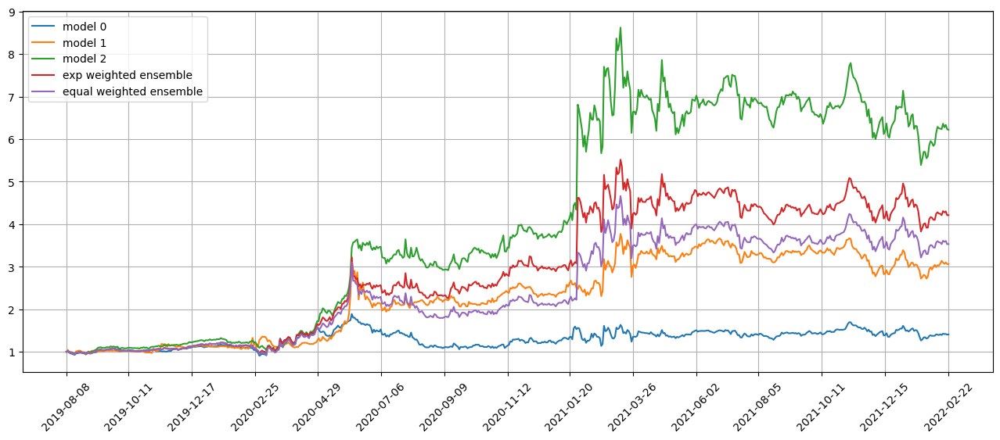

Standardization data are from 2020-07-21 to 2021-05-05
Training data are from 2021-05-06 to 2022-02-17
Testing data are from 2022-01-24 to 2022-03-18
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 33 out of 67 iterations
Restoring model weights from the end of the best epoch: 11.
Epoch 31: early stopping
Restoring model weights from the end of the best epoch: 5.
Epoch 25: early stopping
Restoring model weights from the end of the best epoch: 6.
Epoch 26: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 0.026303771883249283
11/11 [==============================] - 0s 2ms/step
Model 0 test loss 0.048470888286828995
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 0.027012653648853302
11/11 [==============================] - 0s 3ms/step
Model 1 test loss 0.04986381158232689
96/96 [==============================] - 0s 3ms/step
Model 2 training loss 0.

position on 2022-02-25 market open will be {'OKE': 0.4395084006689748, 'FAS': 0.3919051445377208, 'DE': 0.39228044851645544, 'TSCO': 0.39376087864919707, 'DFS': 0.3929186032738048, 'STX': 0.3885716394465693, 'UDOW': 0.4165846739082528, 'DDM': 0.40192972106590896, 'DPST': 0.40894129701903165, 'EXP': 0.39435752929210105}
Total asset on 2022-02-25 will be 4.020758336377999
It should be the same as 4.020758336378017
top_stocks by equal weighted ensemble to buy on 2022-02-24 are ['OKE', 'DE', 'UDOW', 'DFS', 'DDM', 'STX', 'FAS', 'DPST', 'TSCO', 'EXP']
position on 2022-02-25 market open will be {'OKE': 0.36862177578466965, 'FAS': 0.3286962663256328, 'DE': 0.3290110389645394, 'TSCO': 0.33025269619708775, 'DFS': 0.32954626818773863, 'STX': 0.3259004094900931, 'UDOW': 0.34939532902443055, 'DDM': 0.33710401733945977, 'DPST': 0.34298472308923644, 'EXP': 0.33075311534533514}
Total asset on 2022-02-25 will be 3.3722656397481803
It should be the same as 3.3722656397482234
Testing data from 2022-01-27

Testing data from 2022-02-01 to 2022-03-01 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2022-03-02 are ['AUPH', 'AIN', 'OZK', 'AER', 'COF', 'ING', 'DFS', 'FBP', 'UMBF', 'EPAM']
position on 2022-03-03 market open will be {'EPAM': 0.1626982175402285, 'UMBF': 0.15050007922958183, 'DFS': 0.1451916381356177, 'FBP': 0.14906910069625617, 'OZK': 0.14788058689659433, 'COF': 0.14384401783560968, 'ING': 0.14644249149154628, 'AER': 0.14428639563840123, 'AUPH': 0.13966420299689586, 'AIN': 0.14793168107252888}
Total asset on 2022-03-03 will be 1.477508411533233
It should be the same as 1.4775084115332606
top_stocks by model 1 to buy on 2022-03-02 are ['SLM', 'LHX', 'DFS', 'WTFC', 'DPST', 'DEM', 'AIN', 'UMBF', 'CAR', 'EPAM']
position on 2022-03-03 market open will be {'EPAM': 0.3572638450176899, 'CAR': 0.3096716293459439, 'UMBF': 0.31886066338133473, 'DFS': 0.30761380519091436, 'WTFC': 0.3192299100069688, 'SLM': 0.3056617742428025, 'DPST': 0.33334773213201296, 'DEM': 0.307698888

top_stocks by model 0 to buy on 2022-03-07 are ['MDB', 'IPG', 'WES', 'SAVE', 'OII', 'BURL', 'CNQ', 'WTI', 'CAR', 'MUR']
position on 2022-03-08 market open will be {'CNQ': 0.1490185742859218, 'BURL': 0.13014745381599774, 'SAVE': 0.1235576387825201, 'OII': 0.1575133709511592, 'CAR': 0.1328637562713711, 'IPG': 0.13672187740747918, 'WES': 0.14099931866566906, 'MUR': 0.14595040294141448, 'MDB': 0.12952632878739623, 'WTI': 0.15508176450213956}
Total asset on 2022-03-08 will be 1.4013804864110408
It should be the same as 1.4013804864110684
top_stocks by model 1 to buy on 2022-03-07 are ['SYF', 'IDEV', 'ESGD', 'DBEF', 'EWU', 'HEFA', 'FNDF', 'EC', 'IEUR', 'CAR']
position on 2022-03-08 market open will be {'DBEF': 0.29986765561689505, 'ESGD': 0.2984415631944103, 'CAR': 0.2818507890795619, 'EWU': 0.3014508231089709, 'IDEV': 0.29899291295551667, 'IEUR': 0.30056262599389266, 'HEFA': 0.300019032534609, 'EC': 0.31525677650626216, 'SYF': 0.2899031428888064, 'FNDF': 0.3002757598127448}
Total asset on 2

Testing data from 2022-02-09 to 2022-03-09 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2022-03-10 are ['CASY', 'EWBC', 'LEA', 'HES', 'IGT', 'ESI', 'FCFS', 'LIN', 'STX', 'HEDJ']
position on 2022-03-11 market open will be {'LIN': 0.14609168107443268, 'IGT': 0.13954062640325535, 'LEA': 0.14518875231661485, 'STX': 0.14227794389959456, 'CASY': 0.13903236716135817, 'EWBC': 0.14699727121611303, 'HES': 0.14043490767224265, 'FCFS': 0.14414611334721752, 'HEDJ': 0.14558494160139357, 'ESI': 0.14643578243931854}
Total asset on 2022-03-11 will be 1.435730387131513
It should be the same as 1.435730387131541
top_stocks by model 1 to buy on 2022-03-10 are ['VVV', 'DELL', 'FLOT', 'STX', 'DBA', 'WAFD', 'DBC', 'GSG', 'HEDJ', 'CAR']
position on 2022-03-11 market open will be {'HEDJ': 0.31544762826993383, 'DELL': 0.30599407956197866, 'DBC': 0.29538997290470637, 'DBA': 0.2979483241484877, 'CAR': 0.32361108301810854, 'GSG': 0.2891182557626141, 'STX': 0.3022379252769698, 'VVV': 0.3011188

position on 2022-03-16 market open will be {'YUMC': 0.17778532928125326, 'KKR': 0.1471012416421659, 'VDC': 0.14175271703339598, 'SBUX': 0.15244676608346072, 'CACC': 0.1468132611061965, 'HYMB': 0.13948841807755535, 'PSA': 0.13700993748161344, 'PG': 0.14287185831559646, 'PNC': 0.14171750920199294, 'LKQ': 0.14032488232161264}
Total asset on 2022-03-16 will be 1.4673119205448146
It should be the same as 1.4673119205448428
top_stocks by model 1 to buy on 2022-03-15 are ['ARCC', 'JCI', 'ETN', 'HYMB', 'XLP', 'GWW', 'SPHY', 'YUMC', 'CACC', 'VDC']
position on 2022-03-16 market open will be {'ARCC': 0.29962104059913264, 'VDC': 0.303055872938767, 'CACC': 0.31387490790066014, 'HYMB': 0.29821498444634426, 'YUMC': 0.35640874439643305, 'GWW': 0.30513602121315286, 'JCI': 0.30485299689748285, 'ETN': 0.30168083858927935, 'SPHY': 0.30066094062710746, 'XLP': 0.3027972524910796}
Total asset on 2022-03-16 will be 3.086303600099398
It should be the same as 3.086303600099439
top_stocks by model 2 to buy on 20

position on 2022-03-21 market open will be {'YANG': 0.14292224799080477, 'CAR': 0.1545812807143271, 'SPXL': 0.15534221211271518, 'UPRO': 0.15511296064838645, 'OXM': 0.15074608869407405, 'LPX': 0.15152731865764993, 'BX': 0.15027475160193407, 'GEN': 0.15474446637781983, 'EXP': 0.15069223341861365, 'EXR': 0.1486784287997837}
Total asset on 2022-03-21 will be 1.5146219890160806
It should be the same as 1.5146219890161088
top_stocks by model 1 to buy on 2022-03-18 are ['VUG', 'SPHB', 'LPX', 'BX', 'OXM', 'REET', 'EXP', 'CWEB', 'YANG', 'CAR']
position on 2022-03-21 market open will be {'YANG': 0.3029255466854685, 'CAR': 0.32763701681168705, 'CWEB': 0.3250726455275505, 'OXM': 0.32606958490655674, 'VUG': 0.3278302610948461, 'LPX': 0.32775941535022896, 'SPHB': 0.3289506465693343, 'BX': 0.3250500646568669, 'EXP': 0.3259530938754028, 'REET': 0.3244338237456479}
Total asset on 2022-03-21 will be 3.2416820992235484
It should be the same as 3.2416820992235893
top_stocks by model 2 to buy on 2022-03-1

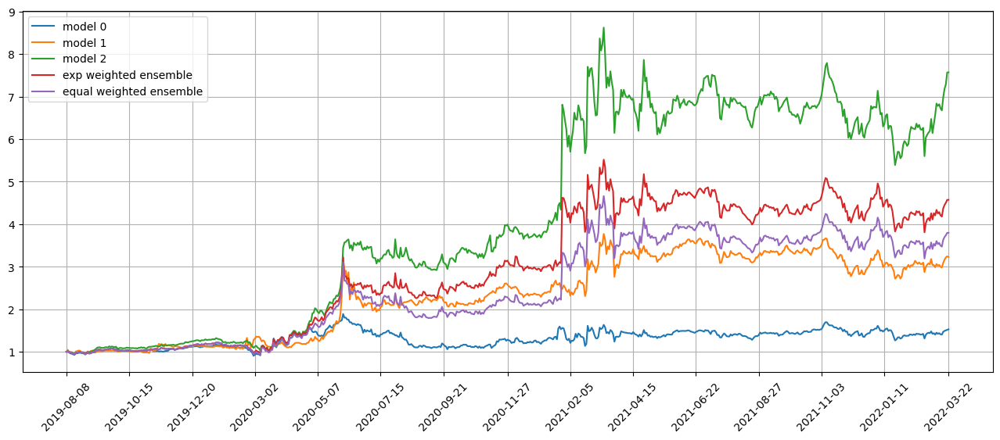

Standardization data are from 2020-08-18 to 2021-06-03
Training data are from 2021-06-04 to 2022-03-18
Testing data are from 2022-02-22 to 2022-04-18
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 34 out of 67 iterations
Restoring model weights from the end of the best epoch: 8.
Epoch 28: early stopping
Restoring model weights from the end of the best epoch: 1.
Epoch 21: early stopping
Restoring model weights from the end of the best epoch: 5.
Epoch 25: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 0.028501104563474655
11/11 [==============================] - 0s 3ms/step
Model 0 test loss 0.02772882953286171
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 0.028934018686413765
11/11 [==============================] - 0s 3ms/step
Model 1 test loss 0.027806006371974945
96/96 [==============================] - 0s 3ms/step
Model 2 training loss 0.0

Testing data from 2022-02-25 to 2022-03-24 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2022-03-25 are ['TSE', 'OMI', 'LNTH', 'YUMC', 'SPSC', 'CZR', 'ATRC', 'CASY', 'WTM', 'WOR']
position on 2022-03-28 market open will be {'OMI': 0.15635969720550993, 'ATRC': 0.15378017259392637, 'TSE': 0.15339471104209126, 'CZR': 0.15137271998615834, 'YUMC': 0.14881612396637225, 'WTM': 0.15515535747729253, 'CASY': 0.15683172531793182, 'SPSC': 0.1484047018384032, 'LNTH': 0.1491410129731405, 'WOR': 0.15176567674248131}
Total asset on 2022-03-28 will be 1.5250218991432791
It should be the same as 1.5250218991433075
top_stocks by model 1 to buy on 2022-03-25 are ['WKC', 'JCI', 'TSE', 'BKLN', 'WTM', 'PPL', 'CASY', 'UNG', 'BOIL', 'WOR']
position on 2022-03-28 market open will be {'BOIL': 0.31215462108551456, 'UNG': 0.31843804831480493, 'PPL': 0.32781561067090564, 'WKC': 0.3240036883863173, 'TSE': 0.3221425576643287, 'WTM': 0.32584007201749754, 'CASY': 0.3293605938145078, 'JCI': 0.325527

position on 2022-03-31 market open will be {'FITB': 0.13933722562180656, 'CFG': 0.14120198233401915, 'DPST': 0.13535650292150572, 'ZION': 0.142767534272741, 'CAR': 0.14302877937372882, 'KEY': 0.1442906400265781, 'KRE': 0.14374092935122879, 'EXP': 0.14331319292488107, 'CMA': 0.14401806308429066, 'RF': 0.144469178138092}
Total asset on 2022-03-31 will be 1.4215240280488433
It should be the same as 1.421524028048872
top_stocks by model 1 to buy on 2022-03-30 are ['CBU', 'WSFS', 'FITB', 'DPST', 'ASB', 'HI', 'TMV', 'CFG', 'UVXY', 'CWEB']
position on 2022-03-31 market open will be {'UVXY': 0.29625077256611376, 'CWEB': 0.32368722335100514, 'WSFS': 0.31070260661903154, 'HI': 0.32023395178686315, 'FITB': 0.312825193404589, 'CFG': 0.3122024152946802, 'ASB': 0.31731968988005693, 'DPST': 0.2931606555345385, 'CBU': 0.3177082146807588, 'TMV': 0.31096014727709953}
Total asset on 2022-03-31 will be 3.1150508703946964
It should be the same as 3.115050870394737
top_stocks by model 2 to buy on 2022-03-30

position on 2022-04-05 market open will be {'MLKN': 0.1388389185482933, 'BTU': 0.1375102060859739, 'UCO': 0.1417916945870861, 'WBA': 0.13708328277522494, 'AR': 0.14040600550532506, 'SRLN': 0.14016289677793253, 'WERN': 0.13936535276865256, 'FALN': 0.14020089755021198, 'BCRX': 0.13885466613953973, 'SJNK': 0.14023001769216537}
Total asset on 2022-04-05 will be 1.3944439384303773
It should be the same as 1.3944439384304055
top_stocks by model 1 to buy on 2022-04-04 are ['FALN', 'BKLN', 'DINO', 'ANGL', 'PFSI', 'ZROZ', 'SOXS', 'UVXY', 'WERN', 'CWEB']
position on 2022-04-05 market open will be {'CWEB': 0.3400867169419795, 'ANGL': 0.3144406994091605, 'UVXY': 0.29809138118702794, 'ZROZ': 0.3092531654418182, 'DINO': 0.3086847172756088, 'SOXS': 0.30820275024640736, 'PFSI': 0.31014567676033133, 'WERN': 0.31225464279160126, 'FALN': 0.31412672026364935, 'BKLN': 0.31485900933846234}
Total asset on 2022-04-05 will be 3.130145479656005
It should be the same as 3.1301454796560466
top_stocks by model 2 t

top_stocks by model 1 to buy on 2022-04-07 are ['CBU', 'GE', 'SPR', 'GMS', 'CWEB', 'ENOV', 'AX', 'CBOE', 'WKC', 'UVXY']
position on 2022-04-08 market open will be {'CWEB': 0.2728602608115511, 'UVXY': 0.29152293394196616, 'CBOE': 0.3094860212498465, 'WKC': 0.29900127437783974, 'SPR': 0.29910107006049913, 'AX': 0.29799783922736917, 'CBU': 0.29687247064257083, 'ENOV': 0.2894779935210097, 'GE': 0.298475413307512, 'GMS': 0.3102497627506968}
Total asset on 2022-04-08 will be 2.965045039890818
It should be the same as 2.965045039890861
top_stocks by model 2 to buy on 2022-04-07 are ['ENOV', 'GE', 'FCNCA', 'TFIN', 'GS', 'SM', 'AX', 'HYD', 'GMS', 'UCO']
position on 2022-04-08 market open will be {'FCNCA': 0.6882219016313104, 'UCO': 0.6858755861613549, 'TFIN': 0.6859271222836933, 'GS': 0.6896217839367405, 'SM': 0.7111048155741007, 'AX': 0.6890951884058906, 'HYD': 0.6881231548146922, 'ENOV': 0.6693937546725627, 'GE': 0.6901995386977821, 'GMS': 0.7174267413142333}
Total asset on 2022-04-08 will be

position on 2022-04-13 market open will be {'CWEB': 0.25923922356600937, 'UVXY': 0.31598028869964423, 'WSFS': 0.2913352069649102, 'BKU': 0.29337130826006064, 'UUP': 0.29954690670433043, 'ABCB': 0.2929788931025683, 'FULT': 0.29230283469314106, 'LXP': 0.29383663111518754, 'USB': 0.29165988903156864, 'ORI': 0.2938437907553111}
Total asset on 2022-04-13 will be 2.9240949728926875
It should be the same as 2.924094972892731
top_stocks by model 2 to buy on 2022-04-12 are ['ABCB', 'MCY', 'VRE', 'CBU', 'FULT', 'USB', 'LXP', 'ORI', 'SLM', 'WSFS']
position on 2022-04-13 market open will be {'WSFS': 0.6824169180306413, 'ABCB': 0.6862670508036618, 'VRE': 0.694771529256472, 'FULT': 0.6846834670652721, 'LXP': 0.6882761966846122, 'SLM': 0.6960601326892651, 'CBU': 0.6990690341012844, 'USB': 0.683177445869268, 'ORI': 0.6882929672617016, 'MCY': 0.6880231038753641}
Total asset on 2022-04-13 will be 6.891037845637484
It should be the same as 6.891037845637543
top_stocks by return weighted ensemble to buy o

position on 2022-04-19 market open will be {'NYCB': 0.6918936363742763, 'BPOP': 0.6897470691163698, 'TFIN': 0.6966837027498423, 'ABCB': 0.6909339910172683, 'GS': 0.7039410208248723, 'MTG': 0.7030516878193394, 'SLM': 0.7035810327338574, 'SHOO': 0.6983172897726212, 'MORN': 0.6815303113688523, 'NMIH': 0.7018774616442414}
Total asset on 2022-04-19 will be 6.961557203421481
It should be the same as 6.96155720342154
top_stocks by return weighted ensemble to buy on 2022-04-18 are ['ACIW', 'SLM', 'SHOO', 'BFH', 'NMIH', 'ABCB', 'BPOP', 'GS', 'MTG', 'MORN']
position on 2022-04-19 market open will be {'BPOP': 0.41866713538879247, 'ACIW': 0.41866672318338843, 'ABCB': 0.41938758091792816, 'GS': 0.42728267196404535, 'MTG': 0.42674285886660057, 'BFH': 0.4317062795806145, 'SLM': 0.4270641640651537, 'SHOO': 0.42386914333121006, 'MORN': 0.41367967464793876, 'NMIH': 0.42603011947119207}
Total asset on 2022-04-19 will be 4.233096351416843
It should be the same as 4.233096351416863
top_stocks by equal weig

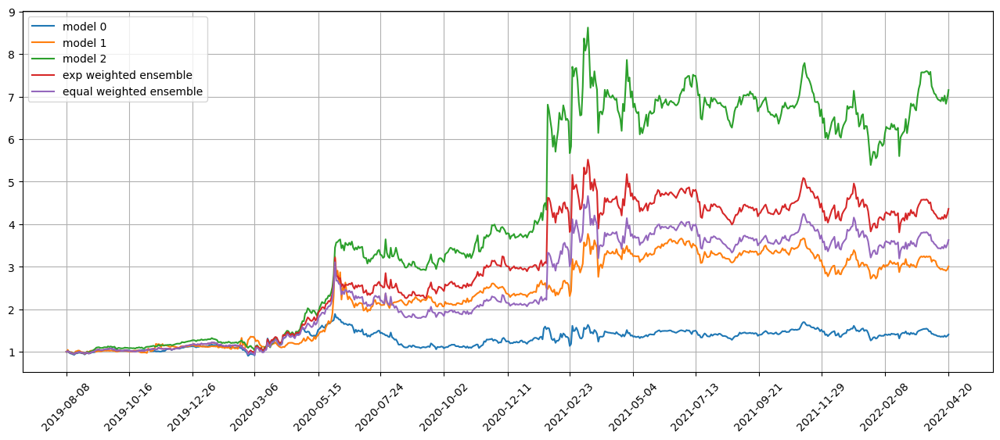

Standardization data are from 2020-09-16 to 2021-07-01
Training data are from 2021-07-02 to 2022-04-18
Testing data are from 2022-03-22 to 2022-05-16
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 35 out of 67 iterations
Restoring model weights from the end of the best epoch: 4.
Epoch 24: early stopping
Restoring model weights from the end of the best epoch: 5.
Epoch 25: early stopping
Restoring model weights from the end of the best epoch: 4.
Epoch 24: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 0.028368527069687843
11/11 [==============================] - 0s 3ms/step
Model 0 test loss 0.041072554886341095
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 0.028479428961873055
11/11 [==============================] - 0s 3ms/step
Model 1 test loss 0.04163763299584389
96/96 [==============================] - 0s 3ms/step
Model 2 training loss 0.0

Testing data from 2022-03-25 to 2022-04-22 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2022-04-25 are ['MOAT', 'AMRC', 'VXF', 'LIT', 'IJR', 'FCX', 'MLKN', 'GNRC', 'XRX', 'DOV']
position on 2022-04-26 market open will be {'AMRC': 0.1372390112113042, 'MLKN': 0.13314094476445285, 'IJR': 0.1315980188073941, 'VXF': 0.1328809649849508, 'MOAT': 0.13217164300511067, 'DOV': 0.13028079695595202, 'XRX': 0.14004506214139617, 'FCX': 0.13609975284025014, 'LIT': 0.12929660501948934, 'GNRC': 0.13674690747478596}
Total asset on 2022-04-26 will be 1.3394997072050583
It should be the same as 1.3394997072050863
top_stocks by model 1 to buy on 2022-04-25 are ['VOT', 'VGT', 'SPHB', 'SPYG', 'VUG', 'MGK', 'CX', 'GNRC', 'IYW', 'XRX']
position on 2022-04-26 market open will be {'VUG': 0.2941979873480228, 'CX': 0.28831692889156835, 'XRX': 0.3104068864207315, 'VOT': 0.2947183980608026, 'VGT': 0.29462981671964755, 'SPHB': 0.2949859071776713, 'SPYG': 0.29395281978580073, 'MGK': 0.293946162478

top_stocks by model 0 to buy on 2022-04-28 are ['SSTK', 'ENOV', 'DORM', 'NEOG', 'CLM', 'CWT', 'HYD', 'FELE', 'ARCC', 'CAR']
position on 2022-04-29 market open will be {'SSTK': 0.1296503079963637, 'CWT': 0.13092626132723909, 'ARCC': 0.13032911150459192, 'CAR': 0.12547640824875925, 'DORM': 0.13244510604178344, 'FELE': 0.12922401232657715, 'NEOG': 0.12912146589936715, 'HYD': 0.1311130770130069, 'ENOV': 0.13146361898742429, 'CLM': 0.13045276624365543}
Total asset on 2022-04-29 will be 1.3002021355887403
It should be the same as 1.3002021355887683
top_stocks by model 1 to buy on 2022-04-28 are ['UHS', 'CPT', 'TWM', 'RWM', 'NEOG', 'CLM', 'ARCC', 'IIPR', 'CWT', 'FELE']
position on 2022-04-29 market open will be {'RWM': 0.29139139175807965, 'CPT': 0.2899441673881619, 'UHS': 0.2929805885293298, 'ARCC': 0.29212475282241657, 'CWT': 0.2934632277212699, 'FELE': 0.28964774043051944, 'IIPR': 0.29220254114811195, 'CLM': 0.2924019173765766, 'NEOG': 0.2894178888696846, 'TWM': 0.2910707742808354}
Total a

position on 2022-05-04 market open will be {'AMZN': 0.13100805542662017, 'DINO': 0.13998389641405617, 'ANET': 0.1331776203900512, 'VRSN': 0.13632122473961653, 'RILY': 0.14162010563666835, 'SSNC': 0.13262592996693473, 'BOKF': 0.13289776982796253, 'BMO': 0.13336679283425673, 'AIT': 0.1388488030968734, 'PNFP': 0.13195725992608137}
Total asset on 2022-05-04 will be 1.3518074582590938
It should be the same as 1.3518074582591213
top_stocks by model 1 to buy on 2022-05-03 are ['ALLY', 'RILY', 'ARI', 'GTLS', 'CIM', 'COF', 'BMO', 'DFS', 'PNFP', 'DINO']
position on 2022-05-04 market open will be {'GTLS': 0.30032453912745793, 'ARI': 0.3017038456112292, 'DINO': 0.30530299903628544, 'DFS': 0.29056869314864603, 'RILY': 0.30887154938751116, 'COF': 0.2894965031570152, 'ALLY': 0.2916977468467105, 'CIM': 0.30140943691407807, 'BMO': 0.29087118495196446, 'PNFP': 0.28779701259978624}
Total asset on 2022-05-04 will be 2.9680435107806433
It should be the same as 2.9680435107806846
top_stocks by model 2 to bu

top_stocks by model 1 to buy on 2022-05-06 are ['IYH', 'EPI', 'ICE', 'FHLC', 'AKAM', 'IDXX', 'INDA', 'IAG', 'JCI', 'UCO']
position on 2022-05-09 market open will be {'FHLC': 0.29502370827605784, 'INDA': 0.29535816696386663, 'ICE': 0.28840822263855037, 'IDXX': 0.2851711191493986, 'UCO': 0.286792604754705, 'EPI': 0.29479333374319705, 'IYH': 0.29602741217643774, 'AKAM': 0.28900289245606653, 'JCI': 0.29197241938624835, 'IAG': 0.29725670163327644}
Total asset on 2022-05-09 will be 2.919806581177763
It should be the same as 2.9198065811778044
top_stocks by model 2 to buy on 2022-05-06 are ['CIBR', 'AKAM', 'SPXL', 'IDXX', 'VCR', 'INDA', 'JHG', 'ICE', 'JCI', 'UCO']
position on 2022-05-09 market open will be {'ICE': 0.6331574025968095, 'SPXL': 0.6487093739150624, 'INDA': 0.67097145198721, 'IDXX': 0.6478293180357456, 'UCO': 0.6515128814941481, 'JHG': 0.680561618491236, 'AKAM': 0.6565340392414923, 'VCR': 0.6577800461992994, 'JCI': 0.6632799769500743, 'CIBR': 0.6438161125205797}
Total asset on 202

position on 2022-05-12 market open will be {'JCI': 0.2852118336600458, 'VHT': 0.2860255393564715, 'ATRC': 0.27542131780655016, 'SLG': 0.28673899929217395, 'FHLC': 0.2862858437774245, 'AIV': 0.28596440056009653, 'ROK': 0.2797945769033108, 'WK': 0.272218605365456, 'SRLN': 0.2849852943277294, 'EXPE': 0.29011266204128355}
Total asset on 2022-05-12 will be 2.832759073090501
It should be the same as 2.8327590730905423
top_stocks by model 2 to buy on 2022-05-11 are ['SRLN', 'BOIL', 'AR', 'AIV', 'DVN', 'TRGP', 'ERX', 'OVV', 'CAR', 'GUSH']
position on 2022-05-12 market open will be {'BOIL': 0.6250817847276553, 'AR': 0.6351077577800732, 'AIV': 0.6413322367467937, 'CAR': 0.6325824201886082, 'TRGP': 0.6372412679018578, 'SRLN': 0.6391363956253575, 'OVV': 0.6209895838770989, 'GUSH': 0.6117537334049966, 'DVN': 0.6377750334409393, 'ERX': 0.6419704179208799}
Total asset on 2022-05-12 will be 6.322970631614199
It should be the same as 6.32297063161426
top_stocks by return weighted ensemble to buy on 202

top_stocks by model 2 to buy on 2022-05-16 are ['MAIN', 'NAVI', 'RRR', 'MFC', 'CMA', 'MOS', 'PRKS', 'COF', 'HHH', 'FCX']
position on 2022-05-17 market open will be {'RRR': 0.6861205211323235, 'MOS': 0.6748426195195874, 'HHH': 0.6819470214204588, 'MFC': 0.6875802505423624, 'COF': 0.6840284735108266, 'FCX': 0.709448813870502, 'MAIN': 0.6981864059809121, 'CMA': 0.6792460783428275, 'PRKS': 0.6867347945382015, 'NAVI': 0.7020989302878059}
Total asset on 2022-05-17 will be 6.890233909145743
It should be the same as 6.890233909145808
top_stocks by return weighted ensemble to buy on 2022-05-16 are ['MFC', 'SRLN', 'TYL', 'X', 'CMA', 'RRR', 'COF', 'FCX', 'PRKS', 'HHH']
position on 2022-05-17 market open will be {'HHH': 0.42795816955078975, 'SRLN': 0.40551967051568977, 'RRR': 0.41853747055455814, 'TYL': 0.409072522406802, 'MFC': 0.41942791390402034, 'COF': 0.4172613094533919, 'FCX': 0.4327678635165411, 'CMA': 0.414344020850067, 'PRKS': 0.41891218087090437, 'X': 0.4132141864161382}
Total asset on 2

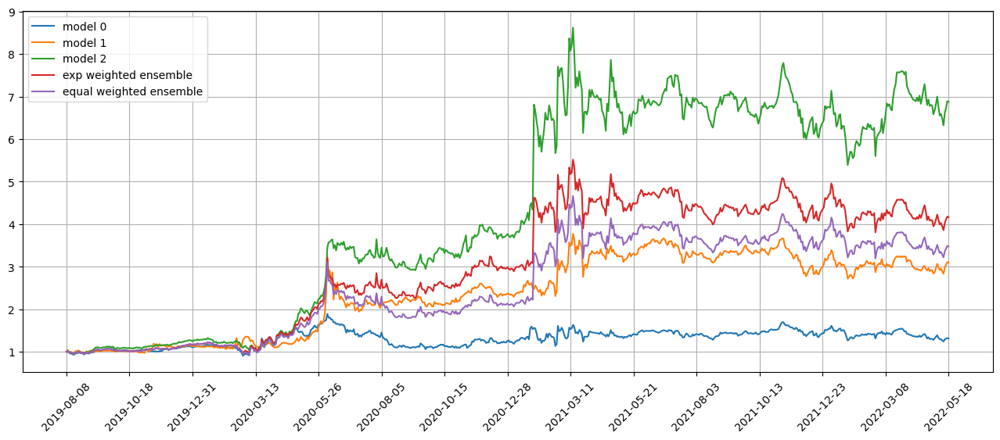

Standardization data are from 2020-10-14 to 2021-07-30
Training data are from 2021-08-02 to 2022-05-16
Testing data are from 2022-04-20 to 2022-06-14
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 36 out of 67 iterations
Restoring model weights from the end of the best epoch: 4.
Epoch 24: early stopping
Restoring model weights from the end of the best epoch: 4.
Epoch 24: early stopping
Restoring model weights from the end of the best epoch: 4.
Epoch 24: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 0.029928376898169518
11/11 [==============================] - 0s 3ms/step
Model 0 test loss 0.03871479257941246
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 0.030488023534417152
11/11 [==============================] - 0s 3ms/step
Model 1 test loss 0.038936275988817215
96/96 [==============================] - 0s 4ms/step
Model 2 training loss 0.0

position on 2022-05-23 market open will be {'IBN': 0.4162964837618043, 'CAR': 0.4025646423003699, 'TGI': 0.4103376529050681, 'EXTR': 0.3993361306206439, 'TGT': 0.4174858533853373, 'LANC': 0.41322756990903464, 'DLTR': 0.3926215108100431, 'DKS': 0.39985727131061166, 'WHR': 0.41526862895332606, 'BBWI': 0.4028382120507735}
Total asset on 2022-05-23 will be 4.069833956006988
It should be the same as 4.069833956007012
top_stocks by equal weighted ensemble to buy on 2022-05-20 are ['PDI', 'WHR', 'LANC', 'IBN', 'DKS', 'CAR', 'BBWI', 'DLTR', 'TGI', 'TGT']
position on 2022-05-23 market open will be {'IBN': 0.3474168640243615, 'PDI': 0.3438787632952526, 'CAR': 0.33595706677913445, 'TGI': 0.3424439699206404, 'TGT': 0.3484094428255077, 'LANC': 0.34485572678617094, 'DLTR': 0.3276591068018223, 'DKS': 0.33369765221355163, 'WHR': 0.3465590761059841, 'BBWI': 0.33618537220203476}
Total asset on 2022-05-23 will be 3.4070630409544047
It should be the same as 3.4070630409544607
Testing data from 2022-04-25 

position on 2022-05-26 market open will be {'PLCE': 0.39444033732631933, 'SIGA': 0.33226957049558886, 'WK': 0.35923985329921676, 'ENTA': 0.3400357800750967, 'KSS': 0.38053882089657964, 'SIG': 0.3993318044835187, 'DECK': 0.36242847653243726, 'DKS': 0.41732330271635193, 'RH': 0.3740249848356108, 'CALX': 0.3690491902294802}
Total asset on 2022-05-26 will be 3.7286821208901433
It should be the same as 3.7286821208901997
Testing data from 2022-04-28 to 2022-05-25 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2022-05-26 are ['TGT', 'CAL', 'BKE', 'BOIL', 'CAR', 'DKS', 'BBWI', 'CIM', 'SNAP', 'ANF']
position on 2022-05-27 market open will be {'DKS': 0.16723649039194843, 'BOIL': 0.11771618225145068, 'CIM': 0.1403706945489152, 'ANF': 0.12966016935803276, 'CAR': 0.14515185212487985, 'BKE': 0.13837563711617445, 'SNAP': 0.14742361225969244, 'CAL': 0.13809289824705137, 'TGT': 0.14104827678450782, 'BBWI': 0.14499217784570329}
Total asset on 2022-05-27 will be 1.41006799092833
It s

Testing data from 2022-05-03 to 2022-05-31 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2022-06-01 are ['SUN', 'UA', 'WDAY', 'BOOT', 'URBN', 'IOVA', 'DKS', 'ANF', 'AEO', 'SIGA']
position on 2022-06-02 market open will be {'ANF': 0.14358929949384444, 'BOOT': 0.14378775708150096, 'URBN': 0.14951824402833108, 'WDAY': 0.142728249259605, 'SIGA': 0.16456659537996046, 'IOVA': 0.13722233454746188, 'SUN': 0.14314418578012758, 'AEO': 0.14616039823199545, 'UA': 0.14029182764904, 'DKS': 0.14316901816131639}
Total asset on 2022-06-02 will be 1.4541779096131568
It should be the same as 1.454177909613183
top_stocks by model 1 to buy on 2022-06-01 are ['CMP', 'MDRX', 'TD', 'PSEC', 'CCK', 'FDL', 'BN', 'PZZA', 'SUN', 'SIGA']
position on 2022-06-02 market open will be {'BN': 0.31412684284828934, 'TD': 0.3154455412464469, 'PZZA': 0.31960313659307327, 'MDRX': 0.3192688538533931, 'CCK': 0.31920516187928877, 'SIGA': 0.36422839457449335, 'PSEC': 0.32099860163649085, 'SUN': 0.316815067231

top_stocks by model 0 to buy on 2022-06-06 are ['KHC', 'ZBRA', 'CLM', 'OUT', 'TDY', 'ESS', 'NMRK', 'LAMR', 'CIEN', 'SIGA']
position on 2022-06-07 market open will be {'SIGA': 0.14647787204114954, 'OUT': 0.14631924940085958, 'ESS': 0.14375935324351927, 'ZBRA': 0.14522935234438203, 'LAMR': 0.14840846007640995, 'TDY': 0.14776002845094513, 'NMRK': 0.15143654764397835, 'KHC': 0.15090710760993445, 'CIEN': 0.14960278480437453, 'CLM': 0.14714262715482038}
Total asset on 2022-06-07 will be 1.4770433827703475
It should be the same as 1.4770433827703733
top_stocks by model 1 to buy on 2022-06-06 are ['MSFT', 'SHOO', 'HUBS', 'LOW', 'SGRY', 'FFIN', 'CIEN', 'NSIT', 'CLM', 'SIGA']
position on 2022-06-07 market open will be {'SIGA': 0.28055971631952586, 'LOW': 0.3174731690526013, 'FFIN': 0.3205359745730861, 'MSFT': 0.32038401394121024, 'NSIT': 0.329291787266377, 'HUBS': 0.31832772211623195, 'SHOO': 0.3296625116051269, 'CIEN': 0.3260313100966915, 'CLM': 0.32066985628032457, 'SGRY': 0.30948920471949476}

top_stocks by model 0 to buy on 2022-06-09 are ['TMF', 'XENE', 'BMA', 'IRT', 'LANC', 'PTCT', 'EEMV', 'TGT', 'BOIL', 'SIGA']
position on 2022-06-10 market open will be {'SIGA': 0.14239770605386726, 'BOIL': 0.17427544328252667, 'PTCT': 0.143809803093254, 'LANC': 0.14671368712340124, 'EEMV': 0.1459054065816896, 'BMA': 0.13587188872978914, 'XENE': 0.14169803764707933, 'TMF': 0.15020539259606902, 'IRT': 0.14360284087611294, 'TGT': 0.14309519165479312}
Total asset on 2022-06-10 will be 1.4675753976385573
It should be the same as 1.4675753976385824
top_stocks by model 1 to buy on 2022-06-09 are ['TFIN', 'BPOP', 'IRWD', 'AKAM', 'MUFG', 'FFIN', 'EEMV', 'UNG', 'SIGA', 'BOIL']
position on 2022-06-10 market open will be {'BOIL': 0.37578631902100307, 'BPOP': 0.3054930861421198, 'UNG': 0.34590411238443336, 'TFIN': 0.2971410530210836, 'IRWD': 0.31737762824299937, 'FFIN': 0.30550527522522, 'SIGA': 0.3071948067320078, 'AKAM': 0.3137545441162457, 'EEMV': 0.31461263062581635, 'MUFG': 0.3100710188569987}


top_stocks by model 0 to buy on 2022-06-14 are ['AMH', 'QTWO', 'OMF', 'LAMR', 'LH', 'DFS', 'MPW', 'HHH', 'DBRG', 'SIGA']
position on 2022-06-15 market open will be {'SIGA': 0.13954159115981868, 'DBRG': 0.12687063232363083, 'LAMR': 0.14093114974211707, 'HHH': 0.13706841679387913, 'AMH': 0.13997196714032453, 'MPW': 0.137134564016037, 'DFS': 0.14246151830951814, 'QTWO': 0.13574076125885612, 'LH': 0.1400659190844143, 'OMF': 0.14123279467255423}
Total asset on 2022-06-15 will be 1.3810193145011247
It should be the same as 1.38101931450115
top_stocks by model 1 to buy on 2022-06-14 are ['DEO', 'CIEN', 'IYH', 'LH', 'CCI', 'VHT', 'XLV', 'FHLC', 'IXJ', 'SIGA']
position on 2022-06-15 market open will be {'IYH': 0.3066927094603985, 'XLV': 0.30659779802732484, 'IXJ': 0.3077867172566464, 'DEO': 0.3139106213862125, 'VHT': 0.3075256376391081, 'FHLC': 0.3071776117538956, 'SIGA': 0.33105438080806815, 'CCI': 0.3006858275198225, 'CIEN': 0.31232457858715446, 'LH': 0.307382200897017}
Total asset on 2022-06

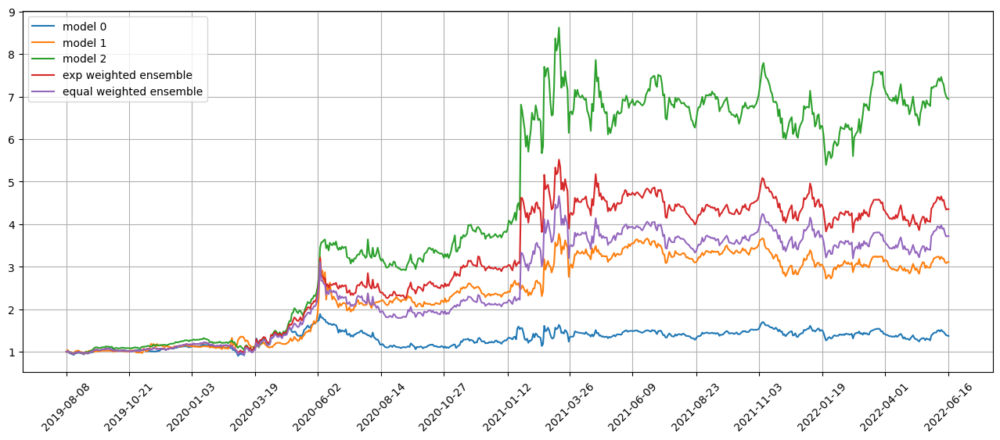

Standardization data are from 2020-11-11 to 2021-08-27
Training data are from 2021-08-30 to 2022-06-14
Testing data are from 2022-05-18 to 2022-07-14
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 37 out of 67 iterations
Restoring model weights from the end of the best epoch: 8.
Epoch 28: early stopping
Restoring model weights from the end of the best epoch: 6.
Epoch 26: early stopping
Restoring model weights from the end of the best epoch: 3.
Epoch 23: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 0.03114348091185093
11/11 [==============================] - 0s 3ms/step
Model 0 test loss 0.03457644209265709
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 0.031485918909311295
11/11 [==============================] - 0s 3ms/step
Model 1 test loss 0.03466574102640152
96/96 [==============================] - 0s 3ms/step
Model 2 training loss 0.031

position on 2022-06-22 market open will be {'SIGA': 0.541241038287509, 'IXJ': 0.4388062548177207, 'PSA': 0.4359515088065592, 'FBP': 0.42441980077418656, 'BRK-B': 0.42699753725620593, 'KR': 0.45640615126991063, 'VYMI': 0.431742910145604, 'SYK': 0.4301968969601996, 'NAVI': 0.4292131882235463, 'KOLD': 0.43550770466612854}
Total asset on 2022-06-22 will be 4.450482991207542
It should be the same as 4.45048299120757
top_stocks by equal weighted ensemble to buy on 2022-06-21 are ['VYMI', 'SYK', 'FBP', 'BRK-B', 'KR', 'IXJ', 'PSA', 'NAVI', 'KOLD', 'SIGA']
position on 2022-06-22 market open will be {'SIGA': 0.46236966860089934, 'IXJ': 0.374860317444853, 'PSA': 0.3724215851245652, 'FBP': 0.36257035878894184, 'BRK-B': 0.36477244935927877, 'KR': 0.38989543305368823, 'VYMI': 0.3688262930959705, 'SYK': 0.36750557583842963, 'NAVI': 0.3666652200658158, 'KOLD': 0.37204245524859225}
Total asset on 2022-06-22 will be 3.801929356620978
It should be the same as 3.8019293566210344
Testing data from 2022-05-

position on 2022-06-27 market open will be {'SIGA': 0.4573186038270443, 'KOLD': 0.44584466170229786, 'USO': 0.38151843288723153, 'UCO': 0.38550895905875504, 'IYE': 0.3802905426007945, 'GSG': 0.37954122810765417, 'DBO': 0.38068645978360555, 'GUSH': 0.38344381086043566, 'TTE': 0.38465559472855215, 'ERX': 0.38390677670997714}
Total asset on 2022-06-27 will be 3.96271507026629
It should be the same as 3.962715070266348
Testing data from 2022-05-26 to 2022-06-24 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2022-06-27 are ['CNO', 'MFA', 'SLF', 'EMN', 'CUZ', 'CIM', 'MDT', 'MTZ', 'PMT', 'SIGA']
position on 2022-06-28 market open will be {'SIGA': 0.13468376711387967, 'CNO': 0.15441140201672168, 'EMN': 0.15434318525864088, 'PMT': 0.154951291674919, 'SLF': 0.1553183779418033, 'MTZ': 0.15773082166895283, 'MFA': 0.15302688483535817, 'CIM': 0.15357853957339115, 'MDT': 0.15493028923799007, 'CUZ': 0.15479079608530527}
Total asset on 2022-06-28 will be 1.5277653554069375
It should

position on 2022-06-30 market open will be {'SIGA': 0.4312860220481157, 'BOIL': 0.3752478777726915, 'INTU': 0.3930114237889088, 'NKE': 0.39069027088815356, 'GOOGL': 0.3892228446143441, 'TSLA': 0.3844569846656689, 'GOOG': 0.38891065465703883, 'CLM': 0.39517935955852135, 'TGT': 0.38368395821455575, 'KOLD': 0.41954091475912125}
Total asset on 2022-06-30 will be 3.9512303109670612
It should be the same as 3.95123031096712
Testing data from 2022-06-01 to 2022-06-29 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2022-06-30 are ['MCO', 'BURL', 'AOS', 'RGR', 'M', 'FCX', 'SWBI', 'SIGA', 'EPI', 'KOLD']
position on 2022-07-01 market open will be {'SIGA': 0.14643889052988898, 'KOLD': 0.18284257608216797, 'BURL': 0.14974519735302586, 'EPI': 0.15508017387043976, 'AOS': 0.15878457375295293, 'SWBI': 0.1505959203532548, 'MCO': 0.15613103427009037, 'M': 0.14902888875769857, 'FCX': 0.150954445543962, 'RGR': 0.15659525749685246}
Total asset on 2022-07-01 will be 1.5561969580103088
It s

Testing data from 2022-06-06 to 2022-07-05 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2022-07-06 are ['PLD', 'NUE', 'HYMB', 'CAR', 'PICK', 'ACLS', 'RHI', 'SIGA', 'ASML', 'KOLD']
position on 2022-07-07 market open will be {'SIGA': 0.1624458709025822, 'ACLS': 0.15468775917977937, 'NUE': 0.16403857889181114, 'CAR': 0.15042643632576308, 'HYMB': 0.1528461476192709, 'RHI': 0.1554858716398159, 'ASML': 0.15541730463185766, 'PLD': 0.1533772453534105, 'PICK': 0.1579065359366081, 'KOLD': 0.14214941218675353}
Total asset on 2022-07-07 will be 1.5487811626676284
It should be the same as 1.5487811626676524
top_stocks by model 1 to buy on 2022-07-06 are ['CAT', 'XME', 'CMC', 'MLM', 'PLD', 'LULU', 'ACN', 'ASML', 'STLD', 'KOLD']
position on 2022-07-07 market open will be {'LULU': 0.31511285237099684, 'CMC': 0.33169877226591055, 'KOLD': 0.2960316486074238, 'XME': 0.327864076090266, 'ACN': 0.31879311026795515, 'MLM': 0.3282686381986695, 'ASML': 0.3236625477694266, 'PLD': 0.3194140

top_stocks by model 0 to buy on 2022-07-11 are ['SUN', 'FIVE', 'ROST', 'MCY', 'ELME', 'XYLD', 'CUZ', 'SIGA', 'AVB', 'UA']
position on 2022-07-12 market open will be {'SIGA': 0.13279737445390546, 'ROST': 0.15163857851080248, 'FIVE': 0.15194542249130846, 'AVB': 0.15289012937357188, 'ELME': 0.1530598605054167, 'SUN': 0.15250351261119235, 'XYLD': 0.1534772664602808, 'UA': 0.1509278647073154, 'MCY': 0.15622755749048933, 'CUZ': 0.1517152173754115}
Total asset on 2022-07-12 will be 1.5071827839796705
It should be the same as 1.507182783979694
top_stocks by model 1 to buy on 2022-07-11 are ['UNG', 'INSW', 'MPLX', 'SIGA', 'MCY', 'GEF', 'AVB', 'NFG', 'AR', 'BOIL']
position on 2022-07-12 market open will be {'SIGA': 0.28149368420166787, 'BOIL': 0.3169611041832768, 'UNG': 0.3213113120453839, 'MPLX': 0.3150868488406743, 'AR': 0.3022343855316446, 'GEF': 0.32387002211905325, 'NFG': 0.31935210485817445, 'AVB': 0.31943936585907473, 'INSW': 0.31523726758941334, 'MCY': 0.32641238580245796}
Total asset on

top_stocks by model 0 to buy on 2022-07-14 are ['BNO', 'FTGC', 'SIGA', 'PDBC', 'EPI', 'USO', 'DBO', 'DBC', 'COMT', 'GSG']
position on 2022-07-15 market open will be {'SIGA': 0.14748065745100605, 'USO': 0.15585586774676213, 'DBC': 0.15253211402349717, 'EPI': 0.15230992513702932, 'DBO': 0.15458302645226546, 'GSG': 0.15313413818700272, 'BNO': 0.1573745193424259, 'COMT': 0.15355173793883806, 'PDBC': 0.15257975918821218, 'FTGC': 0.1507800772803527}
Total asset on 2022-07-15 will be 1.5301818227473671
It should be the same as 1.5301818227473918
top_stocks by model 1 to buy on 2022-07-14 are ['AR', 'DVN', 'GUSH', 'COMT', 'DBO', 'BNO', 'UCO', 'DBC', 'USO', 'GSG']
position on 2022-07-15 market open will be {'GUSH': 0.3300669379423109, 'USO': 0.3232624171041559, 'DBC': 0.31636858193468154, 'UCO': 0.33350618978348645, 'AR': 0.31687706849962993, 'DBO': 0.32062240258691277, 'GSG': 0.31761724705755084, 'BNO': 0.32641226954571434, 'COMT': 0.31848339542342263, 'DVN': 0.32338382342033406}
Total asset o

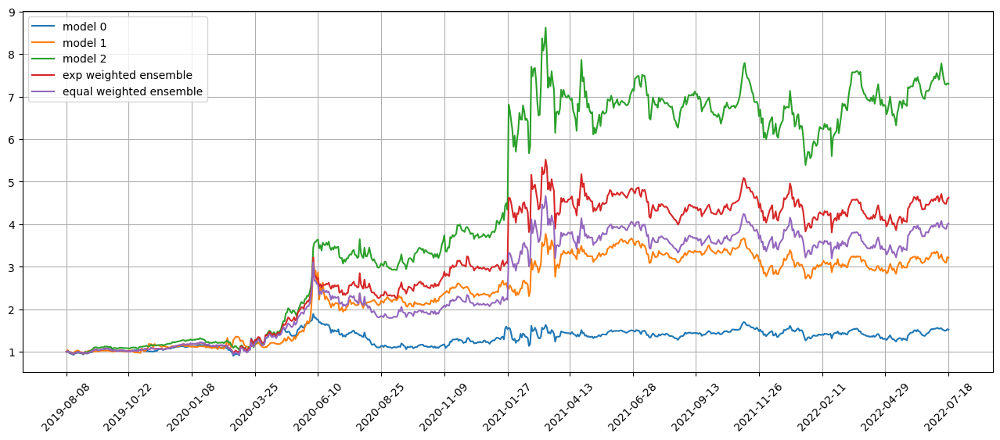

Standardization data are from 2020-12-10 to 2021-09-27
Training data are from 2021-09-28 to 2022-07-14
Testing data are from 2022-06-16 to 2022-08-11
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 38 out of 67 iterations
Restoring model weights from the end of the best epoch: 4.
Epoch 24: early stopping
Restoring model weights from the end of the best epoch: 4.
Epoch 24: early stopping
Restoring model weights from the end of the best epoch: 4.
Epoch 24: early stopping
96/96 [==============================] - 0s 4ms/step
Model 0 training loss 0.03134256228804588
11/11 [==============================] - 0s 3ms/step
Model 0 test loss 0.02826726622879505
96/96 [==============================] - 0s 4ms/step
Model 1 training loss 0.031816814094781876
11/11 [==============================] - 0s 3ms/step
Model 1 test loss 0.028283337131142616
96/96 [==============================] - 0s 4ms/step
Model 2 training loss 0.03

position on 2022-07-21 market open will be {'SIGA': 0.5591176389239858, 'XENE': 0.4152567406248021, 'SXT': 0.38826213865257425, 'BCPC': 0.38454153515255984, 'AIZ': 0.3831019824844568, 'TRV': 0.3801699553101018, 'ACN': 0.38480819613836464, 'THG': 0.3887220394162447, 'WRB': 0.3810901710352676, 'KOLD': 0.3413251922387578}
Total asset on 2022-07-21 will be 4.006395589977054
It should be the same as 4.0063955899771155
Testing data from 2022-06-22 to 2022-07-20 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2022-07-21 are ['ENTG', 'SPB', 'LMT', 'DLR', 'PAYX', 'JKS', 'ALB', 'FCFS', 'KALU', 'SIGA']
position on 2022-07-22 market open will be {'SIGA': 0.15169130955070248, 'DLR': 0.15272103356182276, 'PAYX': 0.15241215040456, 'ALB': 0.15547519695099887, 'JKS': 0.14571758397624898, 'LMT': 0.1518160523632645, 'ENTG': 0.14969333326560302, 'SPB': 0.15153225852526359, 'FCFS': 0.15087640631344135, 'KALU': 0.14855248249781675}
Total asset on 2022-07-22 will be 1.510487807409697
It sh

Testing data from 2022-06-27 to 2022-07-25 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2022-07-26 are ['TX', 'SFBS', 'TFIN', 'NUE', 'CVNA', 'STX', 'SNAP', 'RHI', 'SIGA', 'UCO']
position on 2022-07-27 market open will be {'SIGA': 0.18192160776485308, 'UCO': 0.15230677620471528, 'SFBS': 0.1527528748844922, 'TFIN': 0.15385159120253022, 'TX': 0.15179147586837144, 'NUE': 0.1529309631715701, 'CVNA': 0.16184658064107385, 'STX': 0.15007090401141857, 'RHI': 0.14672922586850085, 'SNAP': 0.14964280979307917}
Total asset on 2022-07-27 will be 1.5538448094105795
It should be the same as 1.5538448094106045
top_stocks by model 1 to buy on 2022-07-26 are ['FWRD', 'CLDX', 'SFBS', 'SCO', 'ORI', 'UFPI', 'RHI', 'SNAP', 'XENE', 'SIGA']
position on 2022-07-27 market open will be {'SIGA': 0.3596974125272466, 'XENE': 0.33363476370040207, 'SFBS': 0.3339484927349323, 'CLDX': 0.3403780409597817, 'RHI': 0.32077958503891885, 'UFPI': 0.3277387737676171, 'FWRD': 0.3382848479943341, 'SCO': 0.33

Testing data from 2022-06-30 to 2022-07-28 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2022-07-29 are ['JNJ', 'BTU', 'RNR', 'BTI', 'LHX', 'REGN', 'SHW', 'JNPR', 'UCO', 'SIGA']
position on 2022-08-01 market open will be {'SIGA': 0.20092351067619083, 'BTU': 0.144590254445725, 'BTI': 0.1555993063134814, 'UCO': 0.1401916376564031, 'SHW': 0.15474268547124745, 'RNR': 0.15655041572522077, 'JNPR': 0.15592576820983314, 'JNJ': 0.1567713305457926, 'REGN': 0.15551470290050665, 'LHX': 0.16416986103857634}
Total asset on 2022-08-01 will be 1.5849794729829516
It should be the same as 1.5849794729829774
top_stocks by model 1 to buy on 2022-07-29 are ['REGN', 'RNR', 'PHM', 'BTI', 'KOLD', 'MUFG', 'SMFG', 'XENE', 'SHW', 'SIGA']
position on 2022-08-01 market open will be {'SIGA': 0.39726818487407406, 'XENE': 0.33647250988748595, 'KOLD': 0.39799008561437577, 'BTI': 0.34218301772834236, 'SMFG': 0.3561562031346787, 'SHW': 0.3402991976022162, 'RNR': 0.34427463045085105, 'REGN': 0.341996

Testing data from 2022-07-06 to 2022-08-02 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2022-08-03 are ['SSTK', 'NEM', 'GRMN', 'L', 'PTLC', 'RHI', 'BANC', 'UCO', 'GSK', 'FCN']
position on 2022-08-04 market open will be {'PTLC': 0.15409890037092014, 'NEM': 0.15208743193733956, 'SSTK': 0.1653602444302964, 'UCO': 0.14622760452550668, 'BANC': 0.15993123602648354, 'L': 0.1585279134351473, 'RHI': 0.16178679689095, 'FCN': 0.15901352910247127, 'GSK': 0.15951761877394832, 'GRMN': 0.16180783081392047}
Total asset on 2022-08-04 will be 1.5783591063069582
It should be the same as 1.5783591063069835
top_stocks by model 1 to buy on 2022-08-03 are ['KOLD', 'SHW', 'ITUB', 'INFY', 'BBVA', 'SSTK', 'NEM', 'MMSI', 'XENE', 'SIGA']
position on 2022-08-04 market open will be {'SIGA': 0.3774154432807176, 'XENE': 0.3446816034200081, 'SSTK': 0.3609022747492817, 'SHW': 0.34462441869953203, 'BBVA': 0.35537030001125086, 'NEM': 0.34477382302204074, 'INFY': 0.35650312252630295, 'ITUB': 0.359436

Testing data from 2022-07-11 to 2022-08-05 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2022-08-08 are ['WES', 'AGO', 'FTNT', 'MATX', 'CINF', 'EQC', 'WMB', 'ECPG', 'GSK', 'SIGA']
position on 2022-08-09 market open will be {'SIGA': 0.1981876287295635, 'MATX': 0.156011984349956, 'CINF': 0.15822960174791026, 'EQC': 0.15720194205113938, 'WES': 0.15895131616226674, 'ECPG': 0.154177663329182, 'FTNT': 0.15471848337869912, 'WMB': 0.15917374805823778, 'GSK': 0.15515173982180036, 'AGO': 0.1578388195859469}
Total asset on 2022-08-09 will be 1.6096429272146773
It should be the same as 1.609642927214702
top_stocks by model 1 to buy on 2022-08-08 are ['KR', 'AGO', 'WMB', 'CINF', 'XENE', 'WES', 'ECPG', 'SIGI', 'GSK', 'SIGA']
position on 2022-08-09 market open will be {'SIGA': 0.47390401494078255, 'XENE': 0.4013346557811474, 'CINF': 0.3462112958029018, 'WES': 0.34779042941528404, 'ECPG': 0.3373455283677006, 'KR': 0.34069462434125125, 'WMB': 0.34827711733006955, 'GSK': 0.339476838

Testing data from 2022-07-14 to 2022-08-10 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2022-08-11 are ['AMH', 'CEIX', 'KN', 'VRNT', 'CSTM', 'SEM', 'MWA', 'GSK', 'SIGA', 'ISTB']
position on 2022-08-12 market open will be {'SIGA': 0.21979186567385786, 'CEIX': 0.17064420638196817, 'GSK': 0.14446449796980754, 'SEM': 0.1531776465250998, 'ISTB': 0.1543068284853172, 'AMH': 0.15467982685817924, 'VRNT': 0.1563858569169185, 'MWA': 0.15616281941874255, 'CSTM': 0.1514584634766602, 'KN': 0.15246809442623258}
Total asset on 2022-08-12 will be 1.613540106132759
It should be the same as 1.6135401061327836
top_stocks by model 1 to buy on 2022-08-11 are ['KN', 'VRNT', 'AIZ', 'SIGI', 'XENE', 'SEM', 'MWA', 'GSK', 'ISTB', 'SIGA']
position on 2022-08-12 market open will be {'SIGA': 0.5255638218281427, 'XENE': 0.38430833330210573, 'GSK': 0.31673427058386916, 'SIGI': 0.35217620484816414, 'SEM': 0.33753783374501806, 'ISTB': 0.34002606646958394, 'AIZ': 0.3423192450363424, 'VRNT': 0.344607

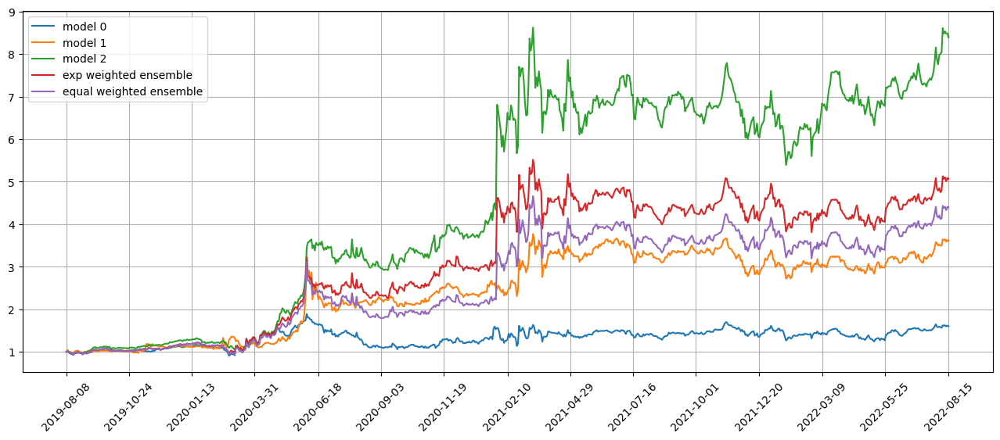

Standardization data are from 2021-01-11 to 2021-10-25
Training data are from 2021-10-26 to 2022-08-11
Testing data are from 2022-07-18 to 2022-09-09
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 39 out of 67 iterations
Restoring model weights from the end of the best epoch: 10.
Epoch 30: early stopping
Restoring model weights from the end of the best epoch: 10.
Epoch 30: early stopping
Restoring model weights from the end of the best epoch: 1.
Epoch 21: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 0.031263697892427444
11/11 [==============================] - 0s 3ms/step
Model 0 test loss 0.030619222670793533
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 0.03188351169228554
11/11 [==============================] - 0s 3ms/step
Model 1 test loss 0.030961427837610245
96/96 [==============================] - 0s 3ms/step
Model 2 training loss 0

Testing data from 2022-07-21 to 2022-08-17 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2022-08-18 are ['MTZ', 'WBD', 'SWK', 'SNY', 'NOMD', 'CG', 'SPB', 'AYI', 'PBR', 'SHW']
position on 2022-08-19 market open will be {'SNY': 0.1557180872753502, 'WBD': 0.15557505860496876, 'SHW': 0.1559590261291028, 'MTZ': 0.1575409614259854, 'SWK': 0.15575470731011257, 'AYI': 0.1568881052941594, 'NOMD': 0.15505196918386668, 'SPB': 0.1602050103981353, 'CG': 0.1590295757716875, 'PBR': 0.15507781584777294}
Total asset on 2022-08-19 will be 1.5668003172411156
It should be the same as 1.5668003172411418
top_stocks by model 1 to buy on 2022-08-18 are ['KRYS', 'SOXS', 'AFG', 'BHC', 'MCY', 'SWK', 'CYH', 'SIGA', 'SCO', 'KOLD']
position on 2022-08-19 market open will be {'SIGA': 0.4877795743257041, 'SCO': 0.3194522641060525, 'KOLD': 0.293762014967982, 'SOXS': 0.3333512274720863, 'CYH': 0.333679022336869, 'AFG': 0.33153711493841087, 'BHC': 0.3185626919526593, 'SWK': 0.32949505795313627, 'KRY

top_stocks by model 0 to buy on 2022-08-23 are ['FORM', 'RGR', 'TROX', 'TRP', 'NOK', 'COMT', 'DBO', 'BNO', 'USO', 'UCO']
position on 2022-08-24 market open will be {'USO': 0.16620274114470707, 'UCO': 0.17479551154720416, 'DBO': 0.16617825828052377, 'BNO': 0.16690805203898434, 'NOK': 0.15804170781688345, 'TROX': 0.1620321308265672, 'TRP': 0.15955226029721828, 'COMT': 0.1598803279286931, 'FORM': 0.15804170781688345, 'RGR': 0.15633560160430846}
Total asset on 2022-08-24 will be 1.6279682993019475
It should be the same as 1.6279682993019733
top_stocks by model 1 to buy on 2022-08-23 are ['TGNA', 'DBO', 'BNO', 'TRP', 'UCO', 'SOXS', 'KOLD', 'COMT', 'SCO', 'SIGA']
position on 2022-08-24 market open will be {'SIGA': 0.45383779819181513, 'SCO': 0.2964085107296595, 'KOLD': 0.2819471001346913, 'UCO': 0.3762338168785802, 'TGNA': 0.3311176180148398, 'DBO': 0.3370720810237435, 'TRP': 0.33552510327570706, 'SOXS': 0.32763947303752383, 'BNO': 0.3387294579479597, 'COMT': 0.33621500215728334}
Total asset

top_stocks by model 0 to buy on 2022-08-26 are ['MUR', 'DBC', 'SM', 'MGY', 'GUSH', 'GSG', 'DBO', 'USO', 'BNO', 'UCO']
position on 2022-08-29 market open will be {'USO': 0.17248611728857127, 'DBC': 0.17001245234706996, 'UCO': 0.17510401449877872, 'GSG': 0.17016861638731645, 'SM': 0.16538909918467828, 'DBO': 0.17188620596358758, 'MUR': 0.16656966861696307, 'GUSH': 0.16397063065966488, 'BNO': 0.17293401841323472, 'MGY': 0.16722223652883536}
Total asset on 2022-08-29 will be 1.6957430598886745
It should be the same as 1.6957430598887002
top_stocks by model 1 to buy on 2022-08-26 are ['TSE', 'GUSH', 'AZPN', 'GSG', 'DBO', 'USO', 'SIGA', 'ISTB', 'BNO', 'UCO']
position on 2022-08-29 market open will be {'SIGA': 0.33023851287062794, 'AZPN': 0.3295891286261391, 'USO': 0.3365905335039381, 'ISTB': 0.32879845192626805, 'UCO': 0.3416991151828218, 'GSG': 0.3320681471402623, 'TSE': 0.30916904217538954, 'DBO': 0.33541986263427326, 'GUSH': 0.31997335739419924, 'BNO': 0.33746457067792845}
Total asset on 

top_stocks by model 0 to buy on 2022-08-31 are ['CAR', 'CM', 'MMM', 'CHKP', 'SNY', 'DG', 'BURL', 'SLF', 'ANF', 'ISTB']
position on 2022-09-01 market open will be {'ISTB': 0.16867933809642235, 'SNY': 0.16377241288365385, 'DG': 0.1683921567289135, 'BURL': 0.1675964049817319, 'ANF': 0.16118260952164848, 'CAR': 0.16289865168065662, 'SLF': 0.16602865880832615, 'CM': 0.16494067744123006, 'CHKP': 0.16363337667649655, 'MMM': 0.16801757506947668}
Total asset on 2022-09-01 will be 1.6551418618885299
It should be the same as 1.655141861888556
top_stocks by model 1 to buy on 2022-08-31 are ['JD', 'SNY', 'BOOT', 'ANF', 'BURL', 'SCO', 'CVNA', 'KOLD', 'SIGA', 'ISTB']
position on 2022-09-01 market open will be {'SIGA': 0.3178572388587593, 'KOLD': 0.31310112999992007, 'SCO': 0.36174142210630617, 'ISTB': 0.3316654605401089, 'SNY': 0.32039072735373764, 'ANF': 0.31532425145437154, 'BURL': 0.32787166744691765, 'BOOT': 0.3171849976195739, 'CVNA': 0.3164548978921728, 'JD': 0.3235994292319323}
Total asset on 

position on 2022-09-07 market open will be {'SXT': 0.1626173495052724, 'WAT': 0.16372411870293013, 'CRL': 0.16286095668603767, 'CVLT': 0.15894562093663678, 'PBR-A': 0.15915627073583102, 'HBI': 0.16093896715282793, 'KT': 0.16194433552758836, 'PICK': 0.16182117658389542, 'IFF': 0.16520911084127773, 'PBR': 0.15918382662115918}
Total asset on 2022-09-07 will be 1.6164017332934302
It should be the same as 1.6164017332934568
top_stocks by model 1 to buy on 2022-09-06 are ['HBI', 'OTEX', 'KRYS', 'CRL', 'CVLT', 'SCO', 'SOXS', 'KT', 'KOLD', 'SIGA']
position on 2022-09-07 market open will be {'SIGA': 0.2862636283622551, 'KOLD': 0.4136326232986594, 'CRL': 0.3211411077172874, 'CVLT': 0.3161583657870495, 'OTEX': 0.32065682713545823, 'SOXS': 0.3371075623134309, 'HBI': 0.32012332612030725, 'KT': 0.32212310202168265, 'KRYS': 0.2983395541216506, 'SCO': 0.3520214779900555}
Total asset on 2022-09-07 will be 3.2875675748677926
It should be the same as 3.2875675748678366
top_stocks by model 2 to buy on 202

top_stocks by model 1 to buy on 2022-09-09 are ['EZA', 'ORI', 'LPG', 'SOXS', 'VALE', 'DBO', 'IJS', 'UCO', 'KOLD', 'SIGA']
position on 2022-09-12 market open will be {'SIGA': 0.29821797242101344, 'KOLD': 0.40909054889166535, 'UCO': 0.3670731338041393, 'SOXS': 0.32301119398191874, 'DBO': 0.34876974167457764, 'EZA': 0.34462914875167855, 'VALE': 0.3616396309274292, 'IJS': 0.3435905446250804, 'LPG': 0.35397594559102136, 'ORI': 0.34131792898220703}
Total asset on 2022-09-12 will be 3.491315789650687
It should be the same as 3.4913157896507307
top_stocks by model 2 to buy on 2022-09-09 are ['ORI', 'KFY', 'SLYV', 'HWC', 'DXJ', 'BTU', 'LYB', 'ENB', 'IJS', 'SIGA']
position on 2022-09-12 market open will be {'SIGA': 0.5200479805374655, 'IJS': 0.8809893299011806, 'DXJ': 0.8811605008470085, 'BTU': 0.897797795001287, 'SLYV': 0.8930742294926414, 'ENB': 0.890337090683646, 'KFY': 0.8892800947029409, 'ORI': 0.8875416883583184, 'HWC': 0.890624435813811, 'LYB': 0.8917859011339296}
Total asset on 2022-09-1

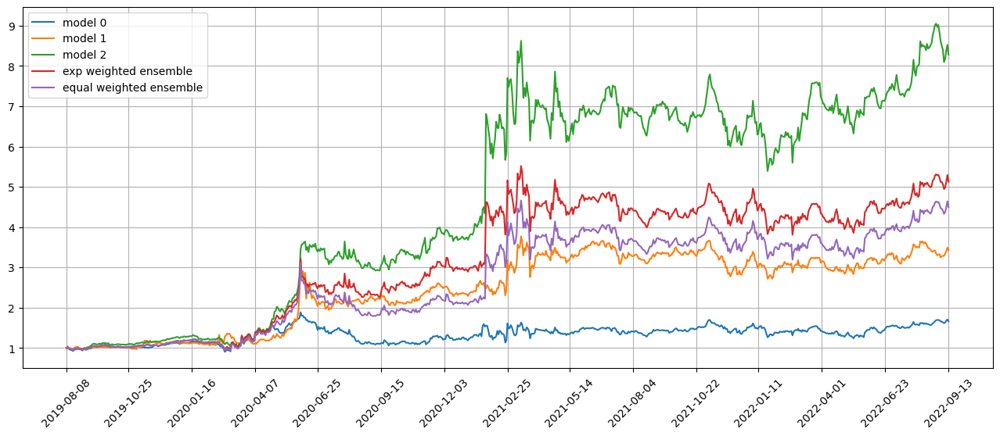

Standardization data are from 2021-02-09 to 2021-11-22
Training data are from 2021-11-23 to 2022-09-09
Testing data are from 2022-08-15 to 2022-10-07
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 40 out of 67 iterations
Restoring model weights from the end of the best epoch: 6.
Epoch 26: early stopping
Restoring model weights from the end of the best epoch: 11.
Epoch 31: early stopping
Restoring model weights from the end of the best epoch: 5.
Epoch 25: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 0.03126576542854309
11/11 [==============================] - 0s 3ms/step
Model 0 test loss 0.03000268153846264
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 0.031144995242357254
11/11 [==============================] - 0s 3ms/step
Model 1 test loss 0.030140476301312447
96/96 [==============================] - 0s 4ms/step
Model 2 training loss 0.0

position on 2022-09-16 market open will be {'VRNT': 0.5113229031550148, 'GDS': 0.48990063095416836, 'BOOT': 0.4920816373802031, 'UCO': 0.4868276933070038, 'EWH': 0.5023708833105696, 'BNO': 0.49888375898413206, 'IJS': 0.4941145064863341, 'NEOG': 0.5037180198886984, 'MWA': 0.48540517691666885, 'TPH': 0.488385420761678}
Total asset on 2022-09-16 will be 4.953010631144424
It should be the same as 4.953010631144471
top_stocks by equal weighted ensemble to buy on 2022-09-15 are ['BOOT', 'IJS', 'BNO', 'NEOG', 'EWH', 'TPH', 'UCO', 'MWA', 'GDS', 'VRNT']
position on 2022-09-16 market open will be {'VRNT': 0.44853489821549114, 'GDS': 0.4295529969073757, 'BOOT': 0.43146533950785926, 'UCO': 0.42685859422192063, 'EWH': 0.44048712095912546, 'BNO': 0.4374295525251098, 'IJS': 0.43324779284979154, 'NEOG': 0.4416683126494725, 'MWA': 0.4256113082622595, 'TPH': 0.4282244354849069}
Total asset on 2022-09-16 will be 4.34308035158324
It should be the same as 4.343080351583312
Testing data from 2022-08-18 to 2

position on 2022-09-21 market open will be {'LBTYA': 0.4308038945757482, 'CE': 0.4317862316232497, 'LBTYK': 0.4266603865560679, 'AN': 0.43324399239898914, 'RS': 0.4457242814903163, 'SKX': 0.441951313173494, 'ARW': 0.4412363293054763, 'AVT': 0.4370632560425125, 'VRNT': 0.4344412537283086, 'CG': 0.4348966466468265}
Total asset on 2022-09-21 will be 4.35780758554092
It should be the same as 4.357807585540989
Testing data from 2022-08-23 to 2022-09-20 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2022-09-21 are ['WBA', 'TX', 'NVDA', 'SONY', 'MHK', 'NSA', 'PBF', 'EMN', 'SIGA', 'HAIN']
position on 2022-09-22 market open will be {'SIGA': 0.13181124543247755, 'TX': 0.1641143963662106, 'MHK': 0.15294972276272745, 'HAIN': 0.15701957616402326, 'SONY': 0.15734404046310385, 'EMN': 0.15447373446502616, 'NSA': 0.15526212992437355, 'PBF': 0.15746439936944567, 'NVDA': 0.15703692926556995, 'WBA': 0.15513434905767104}
Total asset on 2022-09-22 will be 1.542610523270603
It should be t

position on 2022-09-26 market open will be {'SPLG': 0.41074000326788573, 'FXL': 0.4107624034518367, 'PAVE': 0.40871044054237543, 'FXO': 0.40887345723052276, 'SPHB': 0.4132958383969229, 'QUAL': 0.4107030516520197, 'DIA': 0.4111112878313678, 'IYF': 0.4081673152730423, 'PKW': 0.41112826850187023, 'XLRE': 0.4122834796289767}
Total asset on 2022-09-26 will be 4.10577554577675
It should be the same as 4.105775545776821
Testing data from 2022-08-26 to 2022-09-23 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2022-09-26 are ['MSFT', 'APTV', 'VOX', 'GOOGL', 'SSD', 'META', 'SIGA', 'ORCL', 'RPD', 'XLRE']
position on 2022-09-27 market open will be {'XLRE': 0.1464202459073574, 'ORCL': 0.1471600411831498, 'GOOGL': 0.1495503812495044, 'RPD': 0.14480558407009947, 'MSFT': 0.14937370748833428, 'SIGA': 0.14856954652395954, 'APTV': 0.15073106008229906, 'VOX': 0.1474800503814236, 'SSD': 0.14592421047464355, 'META': 0.14523330269516393}
Total asset on 2022-09-27 will be 1.475248130055909

Testing data from 2022-08-31 to 2022-09-28 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2022-09-29 are ['SSO', 'DDM', 'DIA', 'OTEX', 'SIGA', 'ASML', 'CIM', 'SPXL', 'UDOW', 'UPRO']
position on 2022-09-30 market open will be {'SIGA': 0.1492978314065575, 'OTEX': 0.14951049778654496, 'CIM': 0.1288703933042062, 'SPXL': 0.14240356709001573, 'UPRO': 0.14251246202314125, 'SSO': 0.144580704285008, 'UDOW': 0.14304504471989754, 'DIA': 0.1467905348568131, 'DDM': 0.14485956860249433, 'ASML': 0.1445318558274746}
Total asset on 2022-09-30 will be 1.4364024599021274
It should be the same as 1.436402459902153
top_stocks by model 1 to buy on 2022-09-29 are ['SPLG', 'RSPT', 'VTI', 'UDOW', 'SSO', 'OTEX', 'SPXL', 'HPP', 'UPRO', 'CIM']
position on 2022-09-30 market open will be {'OTEX': 0.3148864991881703, 'CIM': 0.2714160383205949, 'VTI': 0.3123368444147209, 'SPLG': 0.31275755052079146, 'SPXL': 0.30376155650696035, 'UPRO': 0.303993840676928, 'SSO': 0.3084056156172354, 'HPP': 0.3102452

top_stocks by model 0 to buy on 2022-10-04 are ['BCE', 'NOMD', 'XLG', 'UPRO', 'BDN', 'USO', 'SPXL', 'GSG', 'UCO', 'CIM']
position on 2022-10-05 market open will be {'BCE': 0.15109065220830056, 'USO': 0.15131924631845323, 'UPRO': 0.1494952826686604, 'SPXL': 0.1495214785611791, 'BDN': 0.14632172639310695, 'UCO': 0.1543211042841208, 'GSG': 0.15017600333480033, 'XLG': 0.14846451609092134, 'CIM': 0.1634179800256162, 'NOMD': 0.14610157227431095}
Total asset on 2022-10-05 will be 1.5102295621594435
It should be the same as 1.5102295621594697
top_stocks by model 1 to buy on 2022-10-04 are ['DSI', 'RSPT', 'SCHB', 'BNO', 'DBC', 'XLG', 'DBO', 'GSG', 'USO', 'UCO']
position on 2022-10-05 market open will be {'USO': 0.32323238408614513, 'DBC': 0.3211225051709699, 'UCO': 0.3296446398337631, 'DBO': 0.3230127166126742, 'GSG': 0.32079030771987643, 'DSI': 0.31865057678325276, 'XLG': 0.3171344072602099, 'BNO': 0.32211422599570966, 'RSPT': 0.3185946389156819, 'SCHB': 0.3189326212523917}
Total asset on 2022

position on 2022-10-10 market open will be {'BNO': 0.1534388357724748, 'IYE': 0.14541569682591388, 'NKE': 0.14517556519790184, 'ZROZ': 0.14586487127073916, 'SIGA': 0.14379999748745984, 'MTZ': 0.1434430375345293, 'GUSH': 0.14326254256445298, 'MFA': 0.14473367765941564, 'TWO': 0.14293657090181047, 'ERX': 0.14387462164647175}
Total asset on 2022-10-10 will be 1.4519454168611434
It should be the same as 1.4519454168611696
top_stocks by model 1 to buy on 2022-10-07 are ['MUFG', 'AGNC', 'CACI', 'BKD', 'NLY', 'USO', 'ERX', 'MFA', 'UCO', 'BNO']
position on 2022-10-10 market open will be {'USO': 0.33259188747260837, 'UCO': 0.34764046841152835, 'BNO': 0.3320765343919376, 'ERX': 0.3021230143673464, 'AGNC': 0.2977162687400176, 'BKD': 0.3686135879006989, 'NLY': 0.3027208422892762, 'MUFG': 0.30619132607704197, 'CACI': 0.306603269398385, 'MFA': 0.3039269502468704}
Total asset on 2022-10-10 will be 3.2002041492956663
It should be the same as 3.2002041492957107
top_stocks by model 2 to buy on 2022-10-0

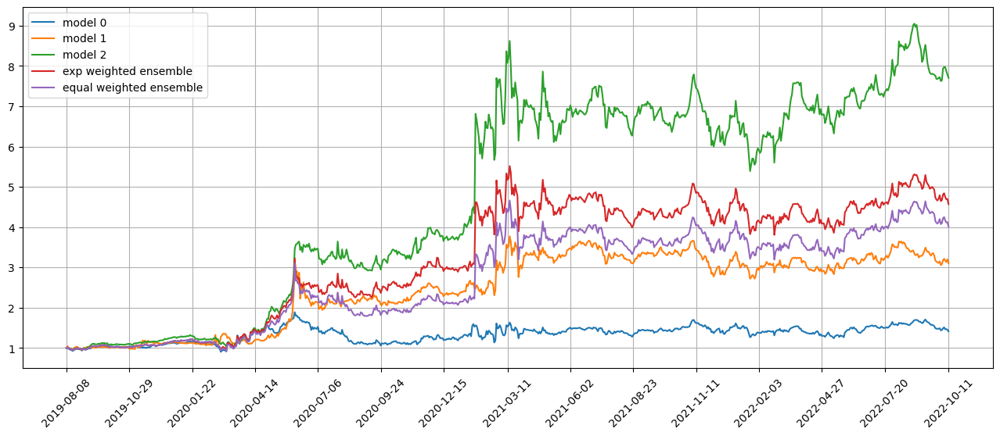

Standardization data are from 2021-03-10 to 2021-12-21
Training data are from 2021-12-22 to 2022-10-07
Testing data are from 2022-09-13 to 2022-11-04
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 41 out of 67 iterations
Restoring model weights from the end of the best epoch: 2.
Epoch 22: early stopping
Restoring model weights from the end of the best epoch: 7.
Epoch 27: early stopping
Restoring model weights from the end of the best epoch: 5.
Epoch 25: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 0.031514402478933334
11/11 [==============================] - 0s 3ms/step
Model 0 test loss 0.041562072932720184
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 0.030990902334451675
11/11 [==============================] - 0s 3ms/step
Model 1 test loss 0.04095403477549553
96/96 [==============================] - 0s 3ms/step
Model 2 training loss 0.0

Testing data from 2022-09-16 to 2022-10-13 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2022-10-14 are ['SPLG', 'ONEQ', 'XLRE', 'XLY', 'XLG', 'NEOG', 'OEF', 'QQQ', 'QLD', 'RSPT']
position on 2022-10-17 market open will be {'NEOG': 0.13579331461559, 'SPLG': 0.1426237183535516, 'OEF': 0.14284067138162085, 'QLD': 0.1395346533946052, 'XLY': 0.14059686636884025, 'QQQ': 0.14210132364180098, 'XLG': 0.14279974385663047, 'RSPT': 0.1424428748295334, 'XLRE': 0.14158166840377537, 'ONEQ': 0.14144503270457268}
Total asset on 2022-10-17 will be 1.4117598675504945
It should be the same as 1.4117598675505207
top_stocks by model 1 to buy on 2022-10-14 are ['NFLX', 'QLD', 'SGH', 'QCLN', 'LXP', 'JBGS', 'ULTA', 'SEDG', 'SVXY', 'TSLA']
position on 2022-10-17 market open will be {'TSLA': 0.30602250834028877, 'QCLN': 0.3000825634738829, 'QLD': 0.30064040355011196, 'SEDG': 0.30462153118719487, 'NFLX': 0.3067372047599884, 'LXP': 0.30371798163153185, 'SGH': 0.2974146224879532, 'SVXY': 0.309

top_stocks by model 1 to buy on 2022-10-19 are ['MAA', 'UDR', 'NVMI', 'AON', 'HAS', 'PLD', 'ROP', 'GNRC', 'EFX', 'PZZA']
position on 2022-10-20 market open will be {'MAA': 0.31169700760246094, 'PLD': 0.2998436002397781, 'ROP': 0.3098769338278004, 'HAS': 0.3071181583040123, 'PZZA': 0.3113588061577533, 'NVMI': 0.31188255410213084, 'UDR': 0.30881331442258836, 'AON': 0.3149353280107382, 'EFX': 0.3063060468361924, 'GNRC': 0.2736573214190791}
Total asset on 2022-10-20 will be 3.055489070922487
It should be the same as 3.0554890709225337
top_stocks by model 2 to buy on 2022-10-19 are ['GNRC', 'SFBS', 'AEO', 'RSG', 'TRI', 'BIP', 'CRK', 'CRUS', 'ACLS', 'NVMI']
position on 2022-10-20 market open will be {'SFBS': 0.7489760184358013, 'BIP': 0.7725458451743974, 'CRUS': 0.8018340487313235, 'TRI': 0.7848689319913504, 'ACLS': 0.80398585206066, 'RSG': 0.796546944658467, 'CRK': 0.8023118602823651, 'NVMI': 0.7900501748653006, 'AEO': 0.7879323725181344, 'GNRC': 0.6932193282267214}
Total asset on 2022-10-2

top_stocks by model 1 to buy on 2022-10-24 are ['SPLG', 'ITOT', 'SSTK', 'FTEC', 'VCR', 'ESGU', 'TEAM', 'XLY', 'NVR', 'RSPT']
position on 2022-10-25 market open will be {'RSPT': 0.31658028679446937, 'SPLG': 0.3147941832139523, 'SSTK': 0.3161990150630874, 'FTEC': 0.3158023801557219, 'ESGU': 0.31472006007242886, 'XLY': 0.31520682395135957, 'ITOT': 0.31445351008795264, 'NVR': 0.3138393048789791, 'VCR': 0.31449669281167697, 'TEAM': 0.3186162789277144}
Total asset on 2022-10-25 will be 3.1547085359572966
It should be the same as 3.1547085359573424
top_stocks by model 2 to buy on 2022-10-24 are ['VOT', 'BOH', 'LNTH', 'MTG', 'CRTO', 'NOK', 'NVR', 'FUN', 'SIMO', 'RSPT']
position on 2022-10-25 market open will be {'SIMO': 0.7255885148771947, 'CRTO': 0.7430685436017839, 'NOK': 0.7594451816002088, 'VOT': 0.7535084836238823, 'MTG': 0.758524785611803, 'NVR': 0.7525880957167839, 'BOH': 0.7121043291105434, 'RSPT': 0.7541737344741974, 'FUN': 0.7442743810052812, 'LNTH': 0.7485365125787674}
Total asset o

top_stocks by model 2 to buy on 2022-10-27 are ['SSNC', 'PVH', 'SIMO', 'SWK', 'SHOO', 'ACMR', 'RH', 'EPAM', 'RHI', 'UNG']
position on 2022-10-28 market open will be {'UNG': 0.741650292764984, 'EPAM': 0.778059367794042, 'RHI': 0.787077802105606, 'SSNC': 0.7981972578825165, 'PVH': 0.7687667174649035, 'SWK': 0.8180318527283423, 'SIMO': 0.7796721058308292, 'SHOO': 0.7915242824071167, 'ACMR': 0.7582259266846174, 'RH': 0.7540995843727722}
Total asset on 2022-10-28 will be 7.775305190035659
It should be the same as 7.77530519003573
top_stocks by return weighted ensemble to buy on 2022-10-27 are ['NOMD', 'PNR', 'KRNT', 'SSNC', 'SWK', 'SGH', 'RHI', 'QLD', 'EPAM', 'UNG']
position on 2022-10-28 market open will be {'UNG': 0.46413018140615, 'QLD': 0.4747433096675212, 'EPAM': 0.48691524704007094, 'SGH': 0.4788468420442438, 'RHI': 0.4925590492388412, 'PNR': 0.4829014749952249, 'SSNC': 0.4995176860481582, 'SWK': 0.5119303206735554, 'KRNT': 0.47551433956769845, 'NOMD': 0.499015234106937}
Total asset o

position on 2022-11-02 market open will be {'EWH': 0.4600985248113897, 'AMRC': 0.4260647780768409, 'AWI': 0.43179397291949045, 'TFIN': 0.4349887622101819, 'DDS': 0.4414583140955185, 'FFIN': 0.426078211097162, 'DORM': 0.43420357444022756, 'FELE': 0.4305623982329346, 'NSP': 0.44030245962428866, 'ZTO': 0.44348841321263816}
Total asset on 2022-11-02 will be 4.369039408720596
It should be the same as 4.369039408720672
Testing data from 2022-10-05 to 2022-11-01 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2022-11-02 are ['SXT', 'SGH', 'SAIA', 'QLD', 'EWH', 'FFIN', 'CDNS', 'KRNT', 'BOOT', 'NEOG']
position on 2022-11-03 market open will be {'NEOG': 0.15072469464784236, 'EWH': 0.15021963375742448, 'FFIN': 0.13856423042711316, 'SXT': 0.13583157998959844, 'BOOT': 0.13311192441881714, 'QLD': 0.13053512131467582, 'SAIA': 0.13645375921625494, 'SGH': 0.13779983113296798, 'CDNS': 0.1360464327179152, 'KRNT': 0.12736824870465316}
Total asset on 2022-11-03 will be 1.376655456327235


position on 2022-11-07 market open will be {'CROX': 0.5147835652914537, 'MHK': 0.4363275277048265, 'AWI': 0.4218204318360151, 'BC': 0.4336585849633906, 'ALGN': 0.4283316739147531, 'HBI': 0.43899477914823126, 'KRNT': 0.42971184426667414, 'NEOG': 0.4431706566173775, 'BBWI': 0.4105218120701665, 'ASGN': 0.43234448454726165}
Total asset on 2022-11-07 will be 4.389665360360073
It should be the same as 4.38966536036015
Testing data from 2022-10-10 to 2022-11-04 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2022-11-07 are ['TECH', 'KRNT', 'WSFS', 'SEE', 'FELE', 'BCS', 'PBR', 'CTLT', 'XRAY', 'NEOG']
position on 2022-11-08 market open will be {'FELE': 0.14189360218893599, 'KRNT': 0.1392192102728735, 'NEOG': 0.14784285062971095, 'WSFS': 0.14158694264507218, 'CTLT': 0.14027727689065286, 'TECH': 0.14751260485704754, 'BCS': 0.14421339720606471, 'SEE': 0.14405676655760255, 'XRAY': 0.1455621004166458, 'PBR': 0.13547435072185562}
Total asset on 2022-11-08 will be 1.427639102386433


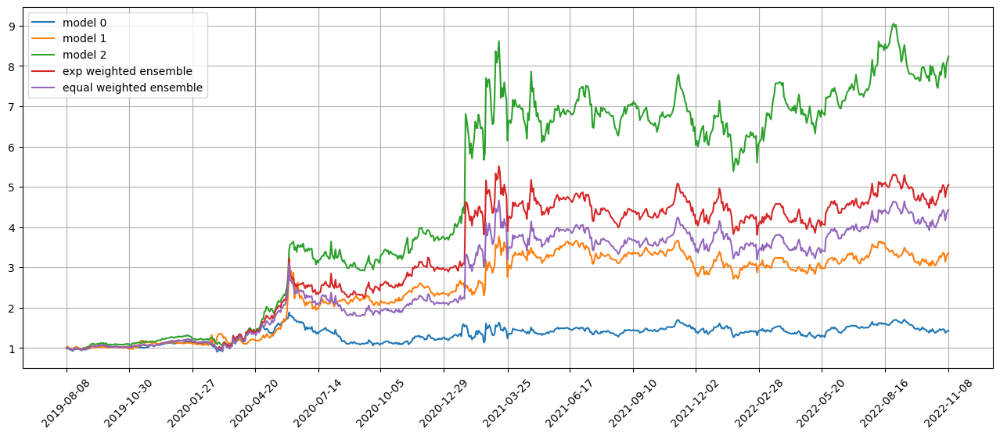

Standardization data are from 2021-04-08 to 2022-01-20
Training data are from 2022-01-21 to 2022-11-04
Testing data are from 2022-10-11 to 2022-12-05
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 42 out of 67 iterations
Restoring model weights from the end of the best epoch: 2.
Epoch 22: early stopping
Restoring model weights from the end of the best epoch: 2.
Epoch 22: early stopping
Restoring model weights from the end of the best epoch: 9.
Epoch 29: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 0.03201097249984741
11/11 [==============================] - 0s 3ms/step
Model 0 test loss 0.03216559439897537
96/96 [==============================] - 0s 4ms/step
Model 1 training loss 0.03187369182705879
11/11 [==============================] - 0s 3ms/step
Model 1 test loss 0.03279378265142441
96/96 [==============================] - 0s 3ms/step
Model 2 training loss 0.0323

position on 2022-11-11 market open will be {'WM': 0.44775013495836663, 'SSTK': 0.4648067009927231, 'FDN': 0.4625963739843639, 'TRU': 0.4810927629279456, 'HAS': 0.455770817103652, 'GTN': 0.45730893487469, 'VOX': 0.4560704745982246, 'GWRE': 0.4746687377861972, 'TYL': 0.45205822019059294, 'BBWI': 0.4799485579382772}
Total asset on 2022-11-11 will be 4.632071715354957
It should be the same as 4.632071715355034
Testing data from 2022-10-14 to 2022-11-10 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2022-11-11 are ['MHK', 'EVH', 'XRAY', 'QRTEA', 'TRU', 'GT', 'CVNA', 'SXT', 'SIGA', 'CTLT']
position on 2022-11-14 market open will be {'MHK': 0.15926057960485776, 'TRU': 0.15750951629807564, 'SXT': 0.14987545312210243, 'EVH': 0.14958626978755749, 'CTLT': 0.15913547121918767, 'CVNA': 0.19247772968099566, 'QRTEA': 0.15249125929490517, 'SIGA': 0.15332426590799111, 'GT': 0.16039223599286948, 'XRAY': 0.1450485522911088}
Total asset on 2022-11-14 will be 1.579101333199622
It should

position on 2022-11-16 market open will be {'QLYS': 0.48751557383989613, 'HAS': 0.494115997130345, 'WMS': 0.48663489198648874, 'CRK': 0.48846226646389074, 'GUSH': 0.49411376328000894, 'JKHY': 0.5018239058727779, 'NTR': 0.48525945563118156, 'LNC': 0.5050898903086107, 'LNTH': 0.4885805339600891, 'COMM': 0.4770801878166151}
Total asset on 2022-11-16 will be 4.908676466289828
It should be the same as 4.908676466289904
Testing data from 2022-10-19 to 2022-11-15 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2022-11-16 are ['RSG', 'EXPE', 'BBWI', 'FL', 'AVB', 'TDS', 'VIAV', 'HAS', 'GTN', 'WM']
position on 2022-11-17 market open will be {'WM': 0.1600101788968992, 'HAS': 0.15311950825339002, 'RSG': 0.16093462258215208, 'VIAV': 0.15628516751334828, 'AVB': 0.1552394098326842, 'EXPE': 0.1535917902680419, 'GTN': 0.15360786822216177, 'TDS': 0.16150210158562006, 'FL': 0.15158994385555707, 'BBWI': 0.18800828508250775}
Total asset on 2022-11-17 will be 1.5938888760923329
It should 

top_stocks by model 0 to buy on 2022-11-21 are ['SVXY', 'ERX', 'GTLS', 'MAT', 'PRG', 'NEOG', 'MAS', 'BAND', 'SIGA', 'GUSH']
position on 2022-11-22 market open will be {'SIGA': 0.15991090609183237, 'PRG': 0.1630639974691865, 'GTLS': 0.16222645091093602, 'MAS': 0.16189378118247708, 'MAT': 0.16102584718125698, 'GUSH': 0.1668269740621146, 'SVXY': 0.1645410775867921, 'BAND': 0.1581022330458616, 'NEOG': 0.16736682036887648, 'ERX': 0.1684801114170903}
Total asset on 2022-11-22 will be 1.6334381993163936
It should be the same as 1.6334381993164242
top_stocks by model 1 to buy on 2022-11-21 are ['BGS', 'ERX', 'MANU', 'TDW', 'TMV', 'PRG', 'MAS', 'ALLY', 'GTLS', 'GUSH']
position on 2022-11-22 market open will be {'TMV': 0.3741096145024797, 'ALLY': 0.3655181127129026, 'PRG': 0.3794546637484972, 'GTLS': 0.377505668552947, 'MAS': 0.37673153642132456, 'GUSH': 0.38821121970152306, 'MANU': 0.3713266403937652, 'TDW': 0.38383541883335065, 'BGS': 0.3881995121017562, 'ERX': 0.3920581183971159}
Total asset 

top_stocks by model 1 to buy on 2022-11-25 are ['DEI', 'HPP', 'DBO', 'EC', 'RHI', 'FFIN', 'NFG', 'ALLY', 'CVNA', 'AQN']
position on 2022-11-28 market open will be {'AQN': 0.3783358609299798, 'CVNA': 0.4029237163274821, 'HPP': 0.3887804450013265, 'DEI': 0.3849442290092932, 'DBO': 0.3635187474661646, 'FFIN': 0.381207619189595, 'NFG': 0.3778915309587826, 'RHI': 0.38239195072808796, 'ALLY': 0.3795443541458022, 'EC': 0.37724337433039945}
Total asset on 2022-11-28 will be 3.8167818280868615
It should be the same as 3.8167818280869135
top_stocks by model 2 to buy on 2022-11-25 are ['BX', 'DBO', 'RGNX', 'ALLY', 'DEI', 'CVNA', 'RHI', 'BRZU', 'AXSM', 'AQN']
position on 2022-11-28 market open will be {'AQN': 0.9136910316513985, 'CVNA': 0.9556938898750842, 'DEI': 0.9087132514864298, 'DBO': 0.8581354858505437, 'RGNX': 0.9040060752160172, 'RHI': 0.9026882511855259, 'BX': 0.9026009873388507, 'BRZU': 0.8665175068967518, 'ALLY': 0.8959661118359629, 'AXSM': 1.1447838642673918}
Total asset on 2022-11-28 

top_stocks by model 1 to buy on 2022-11-30 are ['TREX', 'SFBS', 'FCN', 'LIT', 'ODFL', 'ACMR', 'BHC', 'CARG', 'RILY', 'ALB']
position on 2022-12-01 market open will be {'CARG': 0.42509823178748035, 'SFBS': 0.41379438213581704, 'ODFL': 0.4148334280563376, 'BHC': 0.38570630062298183, 'ALB': 0.4148903826333836, 'FCN': 0.4057547544202205, 'RILY': 0.4121084914079029, 'TREX': 0.41611994572211264, 'LIT': 0.41365224757962377, 'ACMR': 0.4198970924277287}
Total asset on 2022-12-01 will be 4.121855256793538
It should be the same as 4.121855256793588
top_stocks by model 2 to buy on 2022-11-30 are ['UNG', 'FXI', 'HOUS', 'RILY', 'PNFP', 'SFBS', 'BIO', 'ODFL', 'CARG', 'ACMR']
position on 2022-12-01 market open will be {'CARG': 1.0093688221336186, 'UNG': 0.9280713476910759, 'SFBS': 0.9822197768309574, 'HOUS': 1.0347168573995522, 'BIO': 0.9887897300370848, 'ODFL': 0.984686150218878, 'FXI': 0.9519008669034468, 'ACMR': 0.996705722024428, 'RILY': 0.9782179940953241, 'PNFP': 0.9864573552966105}
Total asset 

top_stocks by model 2 to buy on 2022-12-05 are ['PSA', 'SKY', 'NVMI', 'QTWO', 'MYGN', 'NICE', 'PYPL', 'JACK', 'ICUI', 'ROG']
position on 2022-12-06 market open will be {'SKY': 0.9629828983768384, 'ICUI': 0.9527692597744394, 'PYPL': 0.9625511024008496, 'NVMI': 0.9814263592512857, 'JACK': 0.9602551782259824, 'PSA': 0.9601883000977084, 'MYGN': 0.9384545698265849, 'QTWO': 0.944144351745173, 'NICE': 0.955829010595159, 'ROG': 0.982639241910587}
Total asset on 2022-12-06 will be 9.601240272204537
It should be the same as 9.601240272204606
top_stocks by return weighted ensemble to buy on 2022-12-05 are ['FIVN', 'SKY', 'JACK', 'UNG', 'TRU', 'QTWO', 'PYPL', 'NICE', 'ICUI', 'ROG']
position on 2022-12-06 market open will be {'TRU': 0.6291647994044629, 'UNG': 0.5970085237299706, 'SKY': 0.6234710319468949, 'ICUI': 0.6168583415137586, 'PYPL': 0.6231914711331006, 'JACK': 0.6217050042218096, 'QTWO': 0.6112742544873768, 'FIVN': 0.6135610147948826, 'NICE': 0.6188393382738361, 'ROG': 0.6361972816112926}
T

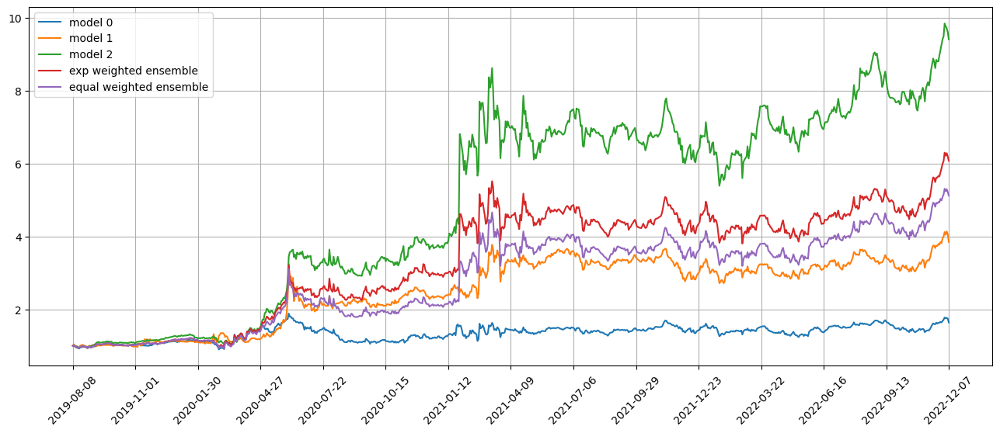

Standardization data are from 2021-05-06 to 2022-02-17
Training data are from 2022-02-18 to 2022-12-05
Testing data are from 2022-11-08 to 2023-01-04
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 43 out of 67 iterations
Restoring model weights from the end of the best epoch: 14.
Epoch 34: early stopping
Restoring model weights from the end of the best epoch: 7.
Epoch 27: early stopping
Restoring model weights from the end of the best epoch: 1.
Epoch 21: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 0.030979447066783905
11/11 [==============================] - 0s 3ms/step
Model 0 test loss 0.028468158096075058
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 0.03120562806725502
11/11 [==============================] - 0s 3ms/step
Model 1 test loss 0.028306707739830017
96/96 [==============================] - 0s 3ms/step
Model 2 training loss 0.

Testing data from 2022-11-11 to 2022-12-09 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2022-12-12 are ['DVN', 'UNG', 'PRGO', 'COOP', 'EVRI', 'SM', 'DQ', 'VNOM', 'CARG', 'DUST']
position on 2022-12-13 market open will be {'DUST': 0.14850626398343283, 'UNG': 0.1652472302336262, 'COOP': 0.16633108554995563, 'SM': 0.1707414253075938, 'DQ': 0.1646338274564566, 'VNOM': 0.17180188230859114, 'DVN': 0.16954815228512485, 'CARG': 0.17104712881540593, 'PRGO': 0.16663223362643592, 'EVRI': 0.17143306551823867}
Total asset on 2022-12-13 will be 1.6659222950848294
It should be the same as 1.6659222950848616
top_stocks by model 1 to buy on 2022-12-12 are ['BLD', 'AWI', 'GBTC', 'USO', 'UNG', 'BZUN', 'UCO', 'GSG', 'DUST', 'CARG']
position on 2022-12-13 market open will be {'UNG': 0.42154501276551326, 'USO': 0.39696439737366457, 'DUST': 0.3521930843070715, 'AWI': 0.402246938558229, 'UCO': 0.40814090463710123, 'BLD': 0.4087009814001154, 'GSG': 0.39487497368820684, 'CARG': 0.405650335

top_stocks by model 0 to buy on 2022-12-15 are ['CRI', 'CNX', 'APPF', 'SON', 'RRX', 'SEE', 'ASGN', 'LNC', 'PNFP', 'RRC']
position on 2022-12-16 market open will be {'LNC': 0.15901659653119962, 'APPF': 0.15944268374949633, 'CNX': 0.16667563682194517, 'SON': 0.1640711261177884, 'RRC': 0.16744278812355695, 'CRI': 0.16619090267121578, 'SEE': 0.16375958005452076, 'PNFP': 0.1659338286797577, 'RRX': 0.16287712905617224, 'ASGN': 0.15899715953972576}
Total asset on 2022-12-16 will be 1.6344074313453467
It should be the same as 1.634407431345379
top_stocks by model 1 to buy on 2022-12-15 are ['VIAV', 'ASGN', 'UNG', 'LKQ', 'PNFP', 'RRX', 'LNC', 'WMS', 'GT', 'RRC']
position on 2022-12-16 market open will be {'GT': 0.3720136768824027, 'LNC': 0.3555964677556602, 'UNG': 0.37190020512036553, 'WMS': 0.3787129172099897, 'VIAV': 0.3769655601911345, 'RRC': 0.37927094654036564, 'PNFP': 0.3758530359635395, 'RRX': 0.3689293734247183, 'LKQ': 0.375725264419222, 'ASGN': 0.3601409405065771}
Total asset on 2022-1

top_stocks by model 0 to buy on 2022-12-20 are ['BBD', 'GTN', 'TMV', 'UMBF', 'SFNC', 'LNC', 'TBT', 'PBR-A', 'VRRM', 'PBR']
position on 2022-12-21 market open will be {'VRRM': 0.15938802322056056, 'UMBF': 0.16127716149659876, 'GTN': 0.1568300935948687, 'PBR-A': 0.1648375069532247, 'LNC': 0.15944183550091684, 'TMV': 0.15295906672611373, 'BBD': 0.16054379560416362, 'SFNC': 0.16190366647153134, 'TBT': 0.15452823844983488, 'PBR': 0.16341955085679297}
Total asset on 2022-12-21 will be 1.5951289388745737
It should be the same as 1.5951289388746062
top_stocks by model 1 to buy on 2022-12-20 are ['PBR', 'VIAV', 'EFX', 'BNO', 'KFY', 'IEP', 'SFNC', 'LNC', 'VRRM', 'AAP']
position on 2022-12-21 market open will be {'VRRM': 0.3650523587794294, 'AAP': 0.368028747377507, 'IEP': 0.3665237796892748, 'VIAV': 0.3784098692460032, 'BNO': 0.3756035016527183, 'EFX': 0.375530554535892, 'LNC': 0.37280921232470465, 'KFY': 0.3751953608904538, 'SFNC': 0.3785655012067784, 'PBR': 0.38210996406289904}
Total asset on 

top_stocks by model 0 to buy on 2022-12-23 are ['JELD', 'EXPE', 'JETS', 'KODK', 'LUV', 'VOD', 'SBGI', 'TFIN', 'VKTX', 'MDGL']
position on 2022-12-27 market open will be {'KODK': 0.15913923621753934, 'TFIN': 0.16276402328920545, 'VKTX': 0.17053061183812246, 'MDGL': 0.1568284145314155, 'JELD': 0.16174314944560061, 'JETS': 0.15928181446122014, 'LUV': 0.1565060309115, 'EXPE': 0.16503098318493384, 'SBGI': 0.1610592577022224, 'VOD': 0.16100791704882597}
Total asset on 2022-12-27 will be 1.6138914386305536
It should be the same as 1.6138914386305858
top_stocks by model 1 to buy on 2022-12-23 are ['SKYW', 'GTN', 'HAS', 'JELD', 'MDGL', 'ESS', 'BGC', 'TFIN', 'LUV', 'EWT']
position on 2022-12-27 market open will be {'ESS': 0.3787488508844291, 'BGC': 0.3733699144940395, 'MDGL': 0.3662033709939421, 'HAS': 0.37588570640970315, 'SKYW': 0.3692959148624174, 'TFIN': 0.3800633589463704, 'JELD': 0.37767955978596546, 'EWT': 0.3755851921252943, 'LUV': 0.36545058669322067, 'GTN': 0.3847508853125063}
Total as

position on 2022-12-30 market open will be {'ERX': 0.16697643088124686, 'IYE': 0.1645250606892286, 'SM': 0.16968878655066041, 'COP': 0.1652142536851224, 'GUSH': 0.16981519598505024, 'DVN': 0.1649305046529172, 'CVE': 0.1669786835669647, 'CNQ': 0.16689374030890652, 'CAL': 0.16490794146017426, 'ROG': 0.16938936197628435}
Total asset on 2022-12-30 will be 1.6693199597565231
It should be the same as 1.6693199597565556
top_stocks by model 1 to buy on 2022-12-29 are ['GSK', 'CWH', 'FNKO', 'PLCE', 'CAL', 'NOK', 'ALLY', 'ROG', 'LCII', 'WGO']
position on 2022-12-30 market open will be {'ROG': 0.3936028443208943, 'NOK': 0.3741032622830842, 'WGO': 0.37092994599069967, 'GSK': 0.37291346362105304, 'ALLY': 0.37799976970045335, 'CAL': 0.3761390870685745, 'FNKO': 0.3800890494201271, 'CWH': 0.3716414546419789, 'PLCE': 0.365369650897048, 'LCII': 0.3698483345618078}
Total asset on 2022-12-30 will be 3.7526368625056725
It should be the same as 3.752636862505721
top_stocks by model 2 to buy on 2022-12-29 ar

top_stocks by model 1 to buy on 2023-01-04 are ['TRP', 'SDS', 'AAXJ', 'QID', 'MSTR', 'EWT', 'LYV', 'TFLO', 'MFA', 'COMT']
position on 2023-01-05 market open will be {'TRP': 0.3772534856456682, 'TFLO': 0.38453799399809696, 'EWT': 0.3842729499831113, 'AAXJ': 0.3871566622204891, 'SDS': 0.38773482081339633, 'COMT': 0.3810544012202766, 'QID': 0.39246830705626035, 'MSTR': 0.4204461152317997, 'LYV': 0.39150436361177404, 'MFA': 0.3897077834775505}
Total asset on 2023-01-05 will be 3.8961368832583743
It should be the same as 3.896136883258423
top_stocks by model 2 to buy on 2023-01-04 are ['TECS', 'EWT', 'SPXS', 'QID', 'SPXU', 'LYV', 'MDGL', 'SDS', 'TFLO', 'COMT']
position on 2023-01-05 market open will be {'LYV': 0.99000352612895, 'SPXS': 1.0044926771165497, 'TFLO': 0.9930458929655794, 'EWT': 0.9923614329781537, 'MDGL': 0.9709662527144258, 'SDS': 1.0013015030457397, 'TECS': 1.0085318833191932, 'SPXU': 1.005866043171645, 'COMT': 0.9840497272946361, 'QID': 1.0135254422825695}
Total asset on 2023

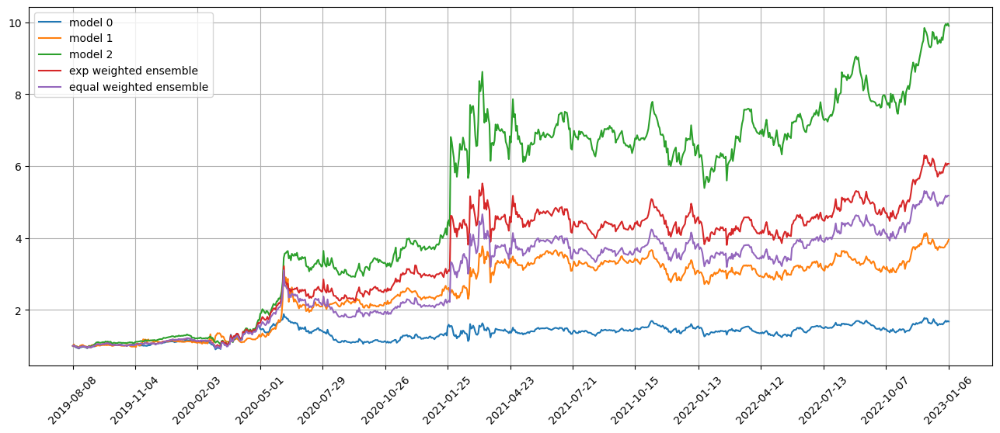

Standardization data are from 2021-06-04 to 2022-03-18
Training data are from 2022-03-21 to 2023-01-04
Testing data are from 2022-12-07 to 2023-02-02
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 44 out of 67 iterations
Restoring model weights from the end of the best epoch: 1.
Epoch 21: early stopping
Restoring model weights from the end of the best epoch: 2.
Epoch 22: early stopping
Restoring model weights from the end of the best epoch: 2.
Epoch 22: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 0.03167479857802391
11/11 [==============================] - 0s 3ms/step
Model 0 test loss 0.02831915207207203
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 0.03170628100633621
11/11 [==============================] - 0s 3ms/step
Model 1 test loss 0.02909558080136776
96/96 [==============================] - 0s 3ms/step
Model 2 training loss 0.0317

Testing data from 2022-12-12 to 2023-01-10 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2023-01-11 are ['EQT', 'KOLD', 'BBD', 'YANG', 'JKS', 'FNKO', 'EWZ', 'AR', 'WDAY', 'SIGA']
position on 2023-01-12 market open will be {'SIGA': 0.1798064701820789, 'EQT': 0.1700851092606848, 'FNKO': 0.16822580724919844, 'YANG': 0.17364185745837696, 'EWZ': 0.17601030018669866, 'AR': 0.17474577735139873, 'WDAY': 0.17732244294779928, 'JKS': 0.18032434524396226, 'BBD': 0.1762515910875135, 'KOLD': 0.1491858136861014}
Total asset on 2023-01-12 will be 1.7255995146537804
It should be the same as 1.7255995146538128
top_stocks by model 1 to buy on 2023-01-11 are ['FNKO', 'CRK', 'INSW', 'UNG', 'EQT', 'KOLD', 'GUSH', 'AR', 'MGY', 'SIGA']
position on 2023-01-12 market open will be {'SIGA': 0.42827695004230576, 'UNG': 0.41499757498126133, 'EQT': 0.3997813737746219, 'CRK': 0.4199952847914948, 'AR': 0.4148429416124317, 'GUSH': 0.41598974807124395, 'INSW': 0.39964967759304104, 'MGY': 0.420189326

position on 2023-01-18 market open will be {'SIGA': 0.1798064701820789, 'CRM': 0.17305149829088803, 'GBX': 0.17433128176215, 'EWT': 0.17462716082981328, 'DBA': 0.17341145711346648, 'TGI': 0.16919975987942326, 'PPBI': 0.16858012194120095, 'COMT': 0.1736143918665665, 'ROIC': 0.17453182394513456, 'COLB': 0.16985127982185744}
Total asset on 2023-01-18 will be 1.7310052456325473
It should be the same as 1.731005245632579
top_stocks by model 1 to buy on 2023-01-17 are ['ERX', 'AR', 'SM', 'IYE', 'KOLD', 'YANG', 'GUSH', 'MDGL', 'SIGA', 'COMT']
position on 2023-01-18 market open will be {'SIGA': 0.4282769500423057, 'KOLD': 0.4521243680871169, 'SM': 0.43514076800199075, 'YANG': 0.42196889309280416, 'IYE': 0.42787039986208864, 'MDGL': 0.4284162265316134, 'AR': 0.4133997613243525, 'GUSH': 0.4271496715572919, 'COMT': 0.43040777248666373, 'ERX': 0.4295268334335688}
Total asset on 2023-01-18 will be 4.294281644419746
It should be the same as 4.294281644419796
top_stocks by model 2 to buy on 2023-01-1

top_stocks by model 1 to buy on 2023-01-20 are ['MANH', 'NSP', 'FELE', 'ENOV', 'PAVE', 'MSM', 'KOLD', 'TMV', 'SNX', 'SIGA']
position on 2023-01-23 market open will be {'SIGA': 0.42324499346226185, 'KOLD': 0.458906245106541, 'PAVE': 0.41994434156456995, 'FELE': 0.4212597615963796, 'MSM': 0.4212580503350581, 'SNX': 0.41835902902264355, 'MANH': 0.41956128585378594, 'NSP': 0.4192723823790019, 'TMV': 0.42771740528378277, 'ENOV': 0.41720971707812254}
Total asset on 2023-01-23 will be 4.246733211682096
It should be the same as 4.246733211682147
top_stocks by model 2 to buy on 2023-01-20 are ['CSL', 'JBHT', 'EXLS', 'CEIX', 'VTV', 'KOLD', 'MDGL', 'SIGA', 'MSM', 'ELME']
position on 2023-01-23 market open will be {'SIGA': 1.0542074798917767, 'KOLD': 1.130698452743225, 'MDGL': 1.127991249634811, 'EXLS': 1.0748368102191066, 'JBHT': 1.0772686181869449, 'MSM': 1.08696386952934, 'CSL': 1.0734635965249435, 'ELME': 1.0681054937445014, 'CEIX': 1.0830121957456345, 'VTV': 1.0735403344863415}
Total asset on

top_stocks by model 1 to buy on 2023-01-25 are ['TNK', 'INSG', 'CEIX', 'SRNE', 'VXRT', 'FNKO', 'FATE', 'KOLD', 'SIGA', 'CVNA']
position on 2023-01-26 market open will be {'SIGA': 0.4198903468554455, 'KOLD': 0.5720449677189187, 'CVNA': 0.43199100016740916, 'INSG': 0.4346571634019855, 'SRNE': 0.4311987501172274, 'TNK': 0.41855872719799614, 'CEIX': 0.39818910557454235, 'FNKO': 0.43703502046434933, 'FATE': 0.4295321661960647, 'VXRT': 0.4459410463809778}
Total asset on 2023-01-26 will be 4.419038294074866
It should be the same as 4.419038294074916
top_stocks by model 2 to buy on 2023-01-25 are ['SGMO', 'SRNE', 'STNG', 'CVNA', 'INSG', 'FFIN', 'VXRT', 'MDGL', 'KOLD', 'SIGA']
position on 2023-01-26 market open will be {'SIGA': 1.0458518144972024, 'KOLD': 1.4094607924744278, 'MDGL': 1.118489538842026, 'VXRT': 1.1423596168379853, 'INSG': 1.1497621286158988, 'SRNE': 1.1406138780986526, 'FFIN': 1.1155904567372101, 'CVNA': 1.1762689926955552, 'STNG': 1.1095851585007113, 'SGMO': 1.1330016610347913}


top_stocks by model 1 to buy on 2023-01-30 are ['FATE', 'WAL', 'KNDI', 'XELA', 'CVNA', 'AQN', 'CM', 'CHRS', 'KOLD', 'SIGA']
position on 2023-01-31 market open will be {'SIGA': 0.4081490704014077, 'KOLD': 0.6090761327198458, 'CVNA': 0.7028576048626183, 'FATE': 0.4618088293060486, 'AQN': 0.41794346080546324, 'CHRS': 0.4209343020016569, 'XELA': 0.38902687111752543, 'WAL': 0.411750733282741, 'CM': 0.42229890761129457, 'KNDI': 0.41214918798466943}
Total asset on 2023-01-31 will be 4.655995100093221
It should be the same as 4.6559951000932704
top_stocks by model 2 to buy on 2023-01-30 are ['CHRS', 'VNLA', 'DOV', 'AQN', 'SSB', 'NVCR', 'SFNC', 'CM', 'KOLD', 'SIGA']
position on 2023-01-31 market open will be {'KOLD': 1.5007018279066358, 'NVCR': 1.1591109370032813, 'AQN': 1.1386295410256162, 'CHRS': 1.1467776769766835, 'VNLA': 1.1491329612159453, 'DOV': 1.170134606145922, 'SIGA': 1.138811038902342, 'CM': 1.1504953574877943, 'SSB': 1.1516281595266817, 'SFNC': 1.1313326963881072}
Total asset on 20

top_stocks by model 1 to buy on 2023-02-02 are ['UDR', 'STNG', 'CVNA', 'EQR', 'EVRI', 'DBI', 'KOLD', 'FFIN', 'XELA', 'SIGA']
position on 2023-02-03 market open will be {'SIGA': 0.42883607114028915, 'KOLD': 0.7095123513416851, 'FFIN': 0.48717713527347345, 'STNG': 0.478356365102893, 'EVRI': 0.46849601899723387, 'XELA': 0.47919571619660944, 'CVNA': 0.350192399859682, 'EQR': 0.4735252431869305, 'DBI': 0.49327329207580967, 'UDR': 0.47395073233407253}
Total asset on 2023-02-03 will be 4.842515325508626
It should be the same as 4.842515325508679
top_stocks by model 2 to buy on 2023-02-02 are ['WCN', 'RWR', 'CPT', 'MAA', 'FFIN', 'UDR', 'SIGA', 'KOLD', 'EQR', 'STNG']
position on 2023-02-03 market open will be {'KOLD': 1.7481664858973516, 'SIGA': 1.196531579047269, 'FFIN': 1.2288692733087287, 'WCN': 1.1672144949895364, 'STNG': 1.2066195151720713, 'CPT': 1.1678051257007143, 'EQR': 1.194576615882975, 'RWR': 1.192827961294686, 'MAA': 1.2121293775024393, 'UDR': 1.1956500103699657}
Total asset on 202

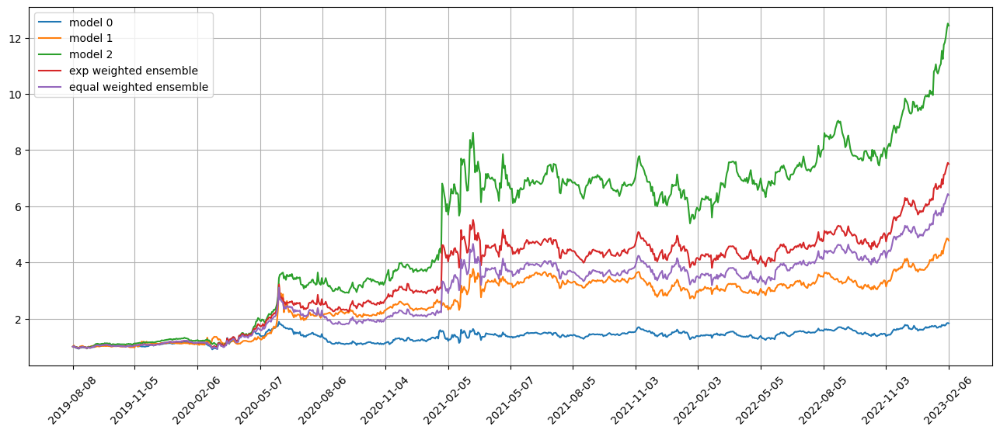

Standardization data are from 2021-07-02 to 2022-04-18
Training data are from 2022-04-19 to 2023-02-02
Testing data are from 2023-01-06 to 2023-03-03
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 45 out of 67 iterations
Restoring model weights from the end of the best epoch: 22.
Epoch 42: early stopping
Restoring model weights from the end of the best epoch: 40.
Epoch 60: early stopping
Restoring model weights from the end of the best epoch: 22.
Epoch 42: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 0.029152417555451393
11/11 [==============================] - 0s 3ms/step
Model 0 test loss 0.02482096664607525
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 0.02926984801888466
11/11 [==============================] - 0s 2ms/step
Model 1 test loss 0.024750418961048126
96/96 [==============================] - 0s 3ms/step
Model 2 training loss 0

Testing data from 2023-01-11 to 2023-02-08 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2023-02-09 are ['GBX', 'ILMN', 'EA', 'MKC', 'VIRT', 'JNPR', 'SHW', 'SPR', 'CHGG', 'KNDI']
position on 2023-02-10 market open will be {'GBX': 0.1770286057335873, 'SHW': 0.18093420218851436, 'EA': 0.18337371934818306, 'JNPR': 0.18332510323077653, 'SPR': 0.1726969054444602, 'VIRT': 0.18332316890531924, 'ILMN': 0.17920740538500157, 'MKC': 0.18451548451139363, 'CHGG': 0.1778370313998815, 'KNDI': 0.18223150989222625}
Total asset on 2023-02-10 will be 1.8044731360393107
It should be the same as 1.8044731360393433
top_stocks by model 1 to buy on 2023-02-09 are ['HTGC', 'CHGG', 'CINF', 'EQNR', 'VIRT', 'SPR', 'SYF', 'PMT', 'SHW', 'KNDI']
position on 2023-02-10 market open will be {'CINF': 0.481474245236639, 'EQNR': 0.5069353376850741, 'SPR': 0.4578249874976133, 'PMT': 0.4801593972961071, 'SHW': 0.4796623230836499, 'HTGC': 0.483561360947135, 'VIRT': 0.4859955498107794, 'CHGG': 0.471451624

top_stocks by model 0 to buy on 2023-02-14 are ['IHI', 'RVTY', 'CMP', 'SFNC', 'EC', 'TMO', 'UNP', 'VTLE', 'CCK', 'BALL']
position on 2023-02-15 market open will be {'RVTY': 0.1805838901904535, 'TMO': 0.18037102679216316, 'CCK': 0.18079050821429046, 'VTLE': 0.18447875643911785, 'IHI': 0.1808722371115747, 'UNP': 0.1789560971381458, 'EC': 0.17886570997124285, 'BALL': 0.1852814393706534, 'SFNC': 0.18079831664065474, 'CMP': 0.18140921200584653}
Total asset on 2023-02-15 will be 1.8124071938741089
It should be the same as 1.8124071938741433
top_stocks by model 1 to buy on 2023-02-14 are ['DQ', 'PNFP', 'TMO', 'RVTY', 'VSAT', 'IHI', 'LSTR', 'EC', 'CCK', 'BALL']
position on 2023-02-15 market open will be {'RVTY': 0.48281538515151085, 'VSAT': 0.522952289056921, 'DQ': 0.4924789929773313, 'CCK': 0.4817226484625199, 'IHI': 0.4819404179751152, 'LSTR': 0.48603553770062485, 'EC': 0.47659395605186594, 'BALL': 0.4936888920008241, 'TMO': 0.48060492550436285, 'PNFP': 0.48177816202391216}
Total asset on 20

top_stocks by model 1 to buy on 2023-02-17 are ['HD', 'TTMI', 'AA', 'TGI', 'EYE', 'BR', 'EMR', 'EMN', 'MSI', 'FWRD']
position on 2023-02-21 market open will be {'EMN': 0.48807114751779973, 'TGI': 0.4897938851189604, 'AA': 0.4877841744787486, 'TTMI': 0.48173489577201717, 'EMR': 0.48377723040397996, 'MSI': 0.49090459204752995, 'FWRD': 0.4925283339850831, 'BR': 0.4849054446233209, 'HD': 0.4681241251491978, 'EYE': 0.47859918371553495}
Total asset on 2023-02-21 will be 4.846223012812117
It should be the same as 4.846223012812173
top_stocks by model 2 to buy on 2023-02-17 are ['TRN', 'CLM', 'PNC', 'UPS', 'BR', 'EYE', 'FWRD', 'EMR', 'MSI', 'T']
position on 2023-02-21 market open will be {'CLM': 1.249915372842965, 'EMR': 1.249465383045076, 'MSI': 1.2678734251900576, 'T': 1.258373127950803, 'FWRD': 1.27206711024687, 'TRN': 1.2278198747361604, 'PNC': 1.2518937783187345, 'BR': 1.2523792543956325, 'UPS': 1.2339279626075645, 'EYE': 1.2360918927640212}
Total asset on 2023-02-21 will be 12.4998071820

position on 2023-02-24 market open will be {'KRNT': 0.4646930042425456, 'XYL': 0.4748230632009913, 'APA': 0.46761962441335675, 'MLM': 0.47733355280750567, 'NTR': 0.4773429266817606, 'CF': 0.4890705082414758, 'ROIC': 0.47783340618772085, 'MGY': 0.4840337803681249, 'KIM': 0.4780128895442043, 'VET': 0.4876673409361181}
Total asset on 2023-02-24 will be 4.778430096623747
It should be the same as 4.778430096623804
top_stocks by model 2 to buy on 2023-02-23 are ['BG', 'IT', 'OSK', 'KODK', 'CENX', 'APH', 'XYL', 'CSTM', 'KIM', 'GBX']
position on 2023-02-24 market open will be {'GBX': 1.3049828238626517, 'CENX': 1.2876391657152417, 'OSK': 1.2167591986799433, 'XYL': 1.226498322019068, 'APH': 1.2248560803386257, 'IT': 1.228683659087983, 'KIM': 1.234737847351111, 'KODK': 1.2042317455219136, 'CSTM': 1.186574221604247, 'BG': 1.2384457625315364}
Total asset on 2023-02-24 will be 12.353408826712233
It should be the same as 12.353408826712322
top_stocks by return weighted ensemble to buy on 2023-02-23 

position on 2023-03-01 market open will be {'KW': 0.4724919408289629, 'CE': 0.478780407468272, 'EQC': 0.47447482237932714, 'INTC': 0.482491190582409, 'LOGI': 0.47715150958626634, 'SPGI': 0.4804878530518571, 'BOH': 0.47786484351029623, 'CBU': 0.47948927876575526, 'KRNT': 0.4765717616305587, 'EBAY': 0.48044078819545244}
Total asset on 2023-03-01 will be 4.780244395999102
It should be the same as 4.780244395999158
top_stocks by model 2 to buy on 2023-02-28 are ['SPGI', 'WHR', 'KRNT', 'BOH', 'DFS', 'MMM', 'ALLY', 'INTC', 'CRI', 'CE']
position on 2023-03-01 market open will be {'MMM': 1.2778857092345788, 'CE': 1.2362481309267332, 'INTC': 1.2458296606166892, 'CRI': 1.2605995686137759, 'DFS': 1.2402366405867356, 'SPGI': 1.2406568877982351, 'BOH': 1.233884073805481, 'ALLY': 1.2593285157041822, 'KRNT': 1.230545236142065, 'WHR': 1.2324091741771606}
Total asset on 2023-03-01 will be 12.457623597605549
It should be the same as 12.457623597605636
top_stocks by return weighted ensemble to buy on 202

top_stocks by model 2 to buy on 2023-03-03 are ['REET', 'ICF', 'VOX', 'PDM', 'SCHH', 'RWR', 'VNQ', 'IYR', 'XLRE', 'TREE']
position on 2023-03-06 market open will be {'TREE': 1.2534923751636506, 'PDM': 1.2230286131893124, 'ICF': 1.2434805494952612, 'IYR': 1.2463357965314181, 'RWR': 1.2424983878308793, 'VOX': 1.250113574613466, 'VNQ': 1.2441425796802819, 'SCHH': 1.2443003569381546, 'XLRE': 1.2475428891561544, 'REET': 1.2415391168059462}
Total asset on 2023-03-06 will be 12.43647423940444
It should be the same as 12.436474239404523
top_stocks by return weighted ensemble to buy on 2023-03-03 are ['ICF', 'PDM', 'CPT', 'RWR', 'SCHH', 'VOX', 'IYR', 'VNQ', 'TREE', 'XLRE']
position on 2023-03-06 market open will be {'TREE': 0.7686096889399545, 'PDM': 0.7467495114347182, 'ICF': 0.7592369326443782, 'CPT': 0.7639652532904561, 'IYR': 0.7609802723391998, 'RWR': 0.7586372502370186, 'VOX': 0.7632868855342267, 'VNQ': 0.7596411510836591, 'SCHH': 0.7597374857801342, 'XLRE': 0.7617172917499131}
Total asse

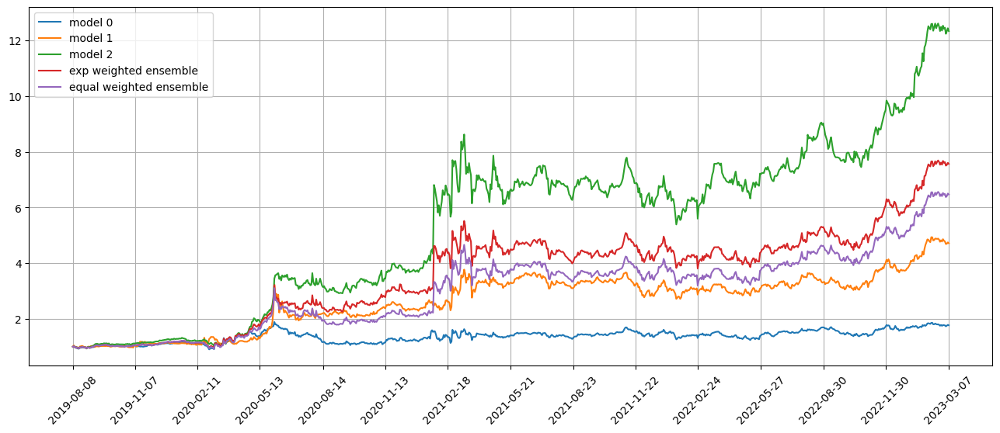

Standardization data are from 2021-08-02 to 2022-05-16
Training data are from 2022-05-17 to 2023-03-03
Testing data are from 2023-02-06 to 2023-03-31
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 46 out of 67 iterations
Restoring model weights from the end of the best epoch: 10.
Epoch 30: early stopping
Restoring model weights from the end of the best epoch: 38.
Epoch 58: early stopping
Restoring model weights from the end of the best epoch: 1.
Epoch 21: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 0.02881355583667755
11/11 [==============================] - 0s 3ms/step
Model 0 test loss 0.03652336075901985
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 0.028132908046245575
11/11 [==============================] - 0s 3ms/step
Model 1 test loss 0.03597496449947357
96/96 [==============================] - 0s 3ms/step
Model 2 training loss 0.0

Testing data from 2023-02-09 to 2023-03-09 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2023-03-10 are ['GPRO', 'BXP', 'TRIP', 'FNKO', 'COHR', 'LEG', 'MANH', 'BFH', 'PLUG', 'FORM']
position on 2023-03-13 market open will be {'TRIP': 0.16275752219144413, 'LEG': 0.16722455478944745, 'BFH': 0.16439671392919034, 'MANH': 0.167062668007938, 'PLUG': 0.1584283151297478, 'COHR': 0.16535168666233138, 'BXP': 0.15774082993228083, 'FORM': 0.1650802380254615, 'GPRO': 0.16765226892649537, 'FNKO': 0.16268123851326688}
Total asset on 2023-03-13 will be 1.6383760361075697
It should be the same as 1.6383760361076036
top_stocks by model 1 to buy on 2023-03-10 are ['FNKO', 'STX', 'COHR', 'DORM', 'PLUG', 'MANH', 'MLKN', 'LC', 'RH', 'FORM']
position on 2023-03-13 market open will be {'MLKN': 0.43586486735030794, 'DORM': 0.4365241372308501, 'STX': 0.4337696000962037, 'PLUG': 0.41340193557814736, 'MANH': 0.4359323663877239, 'COHR': 0.43146774149139394, 'LC': 0.40143559443425775, 'FORM': 0

Testing data from 2023-02-14 to 2023-03-14 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2023-03-15 are ['AY', 'PLCE', 'HR', 'SIL', 'XELA', 'OMF', 'SFNC', 'ANY', 'OUT', 'SPR']
position on 2023-03-16 market open will be {'OUT': 0.15798076515122486, 'HR': 0.1597334805331378, 'ANY': 0.16436209956393785, 'SPR': 0.15690868873602887, 'XELA': 0.14858627383320838, 'AY': 0.1568794635160985, 'SFNC': 0.1639143669134201, 'SIL': 0.15600941946574712, 'PLCE': 0.1602168963199153, 'OMF': 0.15456511591445735}
Total asset on 2023-03-16 will be 1.5791565699471413
It should be the same as 1.5791565699471763
top_stocks by model 1 to buy on 2023-03-15 are ['HR', 'HII', 'XELA', 'SLF', 'RIO', 'GIS', 'ANY', 'TECK', 'SPR', 'BOH']
position on 2023-03-16 market open will be {'ANY': 0.45399828541471954, 'HR': 0.43316502058957057, 'SPR': 0.4255047542955416, 'SLF': 0.4208403688788226, 'XELA': 0.40293604164555136, 'RIO': 0.4141213322668342, 'BOH': 0.4320292294259082, 'GIS': 0.4358148615181117, 'TE

top_stocks by model 0 to buy on 2023-03-20 are ['NDAQ', 'COMM', 'TNET', 'HIG', 'MET', 'SU', 'ACIW', 'BBWI', 'FNKO', 'GBX']
position on 2023-03-21 market open will be {'HIG': 0.16259399449529033, 'GBX': 0.16709463252261797, 'ACIW': 0.15390408268021144, 'TNET': 0.1600599149669097, 'SU': 0.16331593345999407, 'MET': 0.1668908164465584, 'FNKO': 0.15674457861541372, 'NDAQ': 0.16039070287108345, 'BBWI': 0.16233210435128081, 'COMM': 0.1625193906838117}
Total asset on 2023-03-21 will be 1.6158461510931366
It should be the same as 1.6158461510931714
top_stocks by model 1 to buy on 2023-03-20 are ['ACIW', 'FANG', 'AIG', 'BBWI', 'CVE', 'ATSG', 'EDU', 'ESPR', 'GBX', 'DVN']
position on 2023-03-21 market open will be {'AIG': 0.44493016137719593, 'ATSG': 0.4285840835114799, 'GBX': 0.45784448346323625, 'ACIW': 0.4217019671656214, 'ESPR': 0.44262306199251705, 'FANG': 0.45018478476859175, 'DVN': 0.45024589561130546, 'CVE': 0.45996054356408206, 'EDU': 0.4532841131987839, 'BBWI': 0.4447950083384754}
Total 

top_stocks by model 0 to buy on 2023-03-23 are ['TAN', 'ATSG', 'PAR', 'CUBI', 'WIT', 'XSOE', 'AMRC', 'UNG', 'SEDG', 'VICR']
position on 2023-03-24 market open will be {'ATSG': 0.15801747165354674, 'AMRC': 0.15673335064214186, 'PAR': 0.1601400161960821, 'TAN': 0.1595046443613221, 'XSOE': 0.1588262513893171, 'UNG': 0.1615225715236856, 'SEDG': 0.15732202450133306, 'VICR': 0.1572314119558742, 'CUBI': 0.1476452557110881, 'WIT': 0.1606471112798967}
Total asset on 2023-03-24 will be 1.5775901092142528
It should be the same as 1.5775901092142877
top_stocks by model 1 to buy on 2023-03-23 are ['BANC', 'GNRC', 'XSOE', 'UFPI', 'CSTM', 'WAL', 'VICR', 'ATSG', 'AMRC', 'FNKO']
position on 2023-03-24 market open will be {'CSTM': 0.42009230994630176, 'ATSG': 0.4331401403315218, 'AMRC': 0.4296202488330549, 'XSOE': 0.4353570785256536, 'BANC': 0.40694717703983435, 'VICR': 0.4309854798107832, 'WAL': 0.3925322972402491, 'UFPI': 0.4319839294061386, 'FNKO': 0.4314184796268418, 'GNRC': 0.4168577286656211}
Tota

position on 2023-03-29 market open will be {'EVRI': 0.1644081816442612, 'NNDM': 0.16123124507303174, 'DPZ': 0.16445271604290665, 'ECPG': 0.16390498621168959, 'FWONK': 0.1614446062574115, 'AMT': 0.1646972285917117, 'TECK': 0.1640526911890485, 'MDT': 0.1613637131708962, 'PINC': 0.16261654363137001, 'MRIN': 0.15821894357780317}
Total asset on 2023-03-29 will be 1.6263908553900952
It should be the same as 1.6263908553901305
top_stocks by model 1 to buy on 2023-03-28 are ['M', 'ECPG', 'ESS', 'CIEN', 'AZUL', 'MRIN', 'EVRI', 'NSA', 'PINC', 'FWONK']
position on 2023-03-29 market open will be {'ECPG': 0.4522815871464004, 'ESS': 0.4328905807638196, 'EVRI': 0.43085087050925114, 'NSA': 0.42683408199015954, 'M': 0.42268512334402036, 'CIEN': 0.417542022939481, 'FWONK': 0.42308447456426845, 'AZUL': 0.44314563240830585, 'PINC': 0.42615567353199924, 'MRIN': 0.4146312482127624}
Total asset on 2023-03-29 will be 4.290101295410419
It should be the same as 4.2901012954104685
top_stocks by model 2 to buy on

top_stocks by model 0 to buy on 2023-03-31 are ['UGI', 'EMN', 'BBD', 'INTU', 'SF', 'MRIN', 'RRR', 'SATS', 'YANG', 'SAVE']
position on 2023-04-03 market open will be {'BBD': 0.1661983269570743, 'RRR': 0.16609346285258686, 'INTU': 0.16440312884134334, 'YANG': 0.1674759365014147, 'SAVE': 0.1619753978968571, 'EMN': 0.1678197090940959, 'SF': 0.16434592525669872, 'UGI': 0.16666219636477964, 'SATS': 0.16653092080355997, 'MRIN': 0.16799533321661905}
Total asset on 2023-04-03 will be 1.6595003377849948
It should be the same as 1.6595003377850295
top_stocks by model 1 to buy on 2023-03-31 are ['MRIN', 'BBD', 'VST', 'INTU', 'BG', 'SATS', 'AZUL', 'YANG', 'VKTX', 'SAVE']
position on 2023-04-03 market open will be {'BBD': 0.4391515801573163, 'VKTX': 0.46418393564566035, 'SAVE': 0.43109129707215144, 'VST': 0.44120123784789916, 'INTU': 0.43732695056984566, 'YANG': 0.4455008923502574, 'AZUL': 0.41750471946164425, 'SATS': 0.44298706651071224, 'BG': 0.437771191920318, 'MRIN': 0.44688253382628745}
Total a

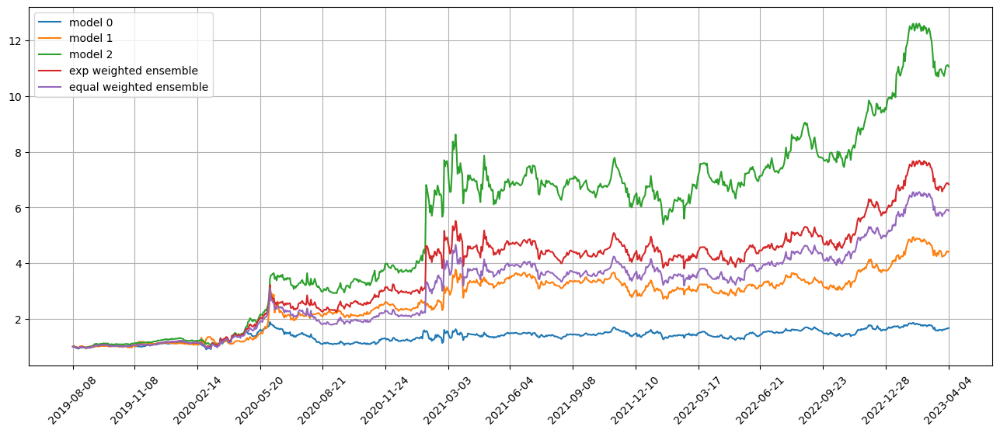

Standardization data are from 2021-08-30 to 2022-06-14
Training data are from 2022-06-15 to 2023-03-31
Testing data are from 2023-03-07 to 2023-05-01
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 47 out of 67 iterations
Restoring model weights from the end of the best epoch: 15.
Epoch 35: early stopping
Restoring model weights from the end of the best epoch: 15.
Epoch 35: early stopping
Restoring model weights from the end of the best epoch: 10.
Epoch 30: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 0.028748951852321625
11/11 [==============================] - 0s 3ms/step
Model 0 test loss 0.025010371580719948
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 0.028637738898396492
11/11 [==============================] - 0s 3ms/step
Model 1 test loss 0.02491610310971737
96/96 [==============================] - 0s 3ms/step
Model 2 training loss 

position on 2023-04-10 market open will be {'CIB': 0.5780230387707449, 'FTV': 0.5775446665346011, 'EWH': 0.5826204248878294, 'EMN': 0.5775611746926812, 'SLF': 0.5779633175548329, 'UDOW': 0.5809199880771074, 'RIO': 0.5816243217029304, 'BHP': 0.578293047244641, 'NRG': 0.5827313772624672, 'JCI': 0.5842592431105397}
Total asset on 2023-04-10 will be 5.801540599838288
It should be the same as 5.801540599838375
Testing data from 2023-03-10 to 2023-04-06 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2023-04-10 are ['MAT', 'EXPE', 'AB', 'TNL', 'PINC', 'THO', 'ALRM', 'LHX', 'SIMO', 'RF']
position on 2023-04-11 market open will be {'MAT': 0.16765046861851102, 'ALRM': 0.1659817666973049, 'AB': 0.1655311678765563, 'THO': 0.16864893316420068, 'EXPE': 0.16331858184812645, 'SIMO': 0.169070655829739, 'TNL': 0.16616817161153927, 'LHX': 0.16640519169298423, 'RF': 0.1654223543270001, 'PINC': 0.16397705733524806}
Total asset on 2023-04-11 will be 1.6621743490011758
It should be the sa

top_stocks by model 0 to buy on 2023-04-13 are ['FAS', 'UWM', 'IVE', 'RRR', 'IYG', 'TS', 'XLF', 'VFH', 'IYE', 'IYF']
position on 2023-04-14 market open will be {'RRR': 0.1635456443761825, 'IYE': 0.16407901509519002, 'UWM': 0.16589077839225888, 'VFH': 0.16542379128344653, 'IYG': 0.16600648702350165, 'XLF': 0.16571987627857515, 'IYF': 0.16528821533286142, 'IVE': 0.1639145731130139, 'FAS': 0.17145487324157016, 'TS': 0.16264725557982534}
Total asset on 2023-04-14 will be 1.6539705097163901
It should be the same as 1.6539705097164255
top_stocks by model 1 to buy on 2023-04-13 are ['VFH', 'RRR', 'CIB', 'IYE', 'IVE', 'TNL', 'GNTX', 'IYF', 'EMN', 'FXO']
position on 2023-04-14 market open will be {'RRR': 0.4310756999135412, 'CIB': 0.44093879733922325, 'IYE': 0.4324815652723318, 'EMN': 0.43316209378035053, 'FXO': 0.43569440949207805, 'VFH': 0.4360261435384844, 'IVE': 0.4320481269937881, 'TNL': 0.4387555263644725, 'GNTX': 0.4246706235485412, 'IYF': 0.43566879071497855}
Total asset on 2023-04-14 w

top_stocks by model 0 to buy on 2023-04-18 are ['ONB', 'DD', 'MKSI', 'GGB', 'VIXY', 'KALU', 'HOMB', 'GBCI', 'EXPO', 'VKTX']
position on 2023-04-19 market open will be {'VKTX': 0.17275714825118066, 'VIXY': 0.15859860543647278, 'HOMB': 0.16097505536568985, 'GGB': 0.16025966413406229, 'EXPO': 0.1603343171922831, 'GBCI': 0.15644420541655682, 'DD': 0.16247031393388597, 'KALU': 0.16062123732616476, 'MKSI': 0.1590403342295589, 'ONB': 0.1597636259101461}
Total asset on 2023-04-19 will be 1.611264507195966
It should be the same as 1.6112645071960012
top_stocks by model 1 to buy on 2023-04-18 are ['FFIN', 'SSB', 'VKTX', 'PPBI', 'UBSI', 'HOMB', 'CADE', 'ONB', 'GBCI', 'EXPO']
position on 2023-04-19 market open will be {'VKTX': 0.4578766582064337, 'HOMB': 0.4309156197518483, 'CADE': 0.4211091891092853, 'FFIN': 0.4265274380152043, 'UBSI': 0.4270805804168201, 'PPBI': 0.42146433634203573, 'EXPO': 0.4292004217886297, 'GBCI': 0.41878694547124035, 'SSB': 0.4335546595894318, 'ONB': 0.427672732998771}
Tota

position on 2023-04-24 market open will be {'PRG': 0.15997483462097087, 'BURL': 0.16326127704394594, 'BCPC': 0.16188824723746906, 'EQNR': 0.1611554649650341, 'VKTX': 0.16994095399428114, 'EBS': 0.15894717794562688, 'DBI': 0.15923012900647676, 'CLB': 0.15837153732593973, 'ACMR': 0.1561796191072656, 'LYB': 0.1601027682705346}
Total asset on 2023-04-24 will be 1.6090520095175094
It should be the same as 1.6090520095175447
top_stocks by model 1 to buy on 2023-04-21 are ['ERX', 'XLE', 'FENY', 'EBS', 'EQNR', 'MCY', 'VRNT', 'LYB', 'DBI', 'ACMR']
position on 2023-04-24 market open will be {'EQNR': 0.4300412872201886, 'EBS': 0.42414850168800966, 'FENY': 0.42320911051151183, 'DBI': 0.4249035529576306, 'XLE': 0.4237360975492018, 'LYB': 0.4272321796193187, 'ACMR': 0.4167633064942585, 'VRNT': 0.42925461309765495, 'MCY': 0.43232137694733036, 'ERX': 0.41907031626436875}
Total asset on 2023-04-24 will be 4.2506803423494315
It should be the same as 4.250680342349473
top_stocks by model 2 to buy on 2023

top_stocks by model 1 to buy on 2023-04-26 are ['IWM', 'FCG', 'FSK', 'GUSH', 'IJR', 'MMYT', 'MMM', 'NTAP', 'CWH', 'VIAV']
position on 2023-04-27 market open will be {'VIAV': 0.4061971466459849, 'IWM': 0.4083584491680744, 'MMYT': 0.41373702165107473, 'IJR': 0.40830119381640645, 'NTAP': 0.4187459227660917, 'FSK': 0.40816478709958787, 'GUSH': 0.40355998985149116, 'MMM': 0.4052166151964128, 'CWH': 0.40545440217403866, 'FCG': 0.4050174346808242}
Total asset on 2023-04-27 will be 4.082752963049945
It should be the same as 4.0827529630499875
top_stocks by model 2 to buy on 2023-04-26 are ['LEG', 'WDC', 'SM', 'OSK', 'DORM', 'SATS', 'JELD', 'DBI', 'MMYT', 'CWH']
position on 2023-04-27 market open will be {'OSK': 1.0704758030671797, 'LEG': 1.0174532263278535, 'MMYT': 1.0270171173618765, 'JELD': 1.014844374453164, 'DORM': 1.0180039236796237, 'SM': 0.9862783760507995, 'DBI': 1.0284913828401991, 'WDC': 1.0308881694265544, 'CWH': 1.0064572169073198, 'SATS': 1.0268827911877874}
Total asset on 2023-04

top_stocks by model 1 to buy on 2023-05-01 are ['TNET', 'REM', 'CSL', 'ECPG', 'CIEN', 'OVV', 'BB', 'UNF', 'HRTX', 'VNET']
position on 2023-05-02 market open will be {'VNET': 0.40164429730464346, 'ECPG': 0.4015177174096832, 'TNET': 0.40693174908633173, 'CSL': 0.4038320647930022, 'OVV': 0.40348848465905085, 'UNF': 0.40794883678768773, 'CIEN': 0.39780948623911017, 'HRTX': 0.4178209806037979, 'REM': 0.398440439131368, 'BB': 0.4391657158248064}
Total asset on 2023-05-02 will be 4.078599771839437
It should be the same as 4.078599771839482
top_stocks by model 2 to buy on 2023-05-01 are ['VKTX', 'IRWD', 'TNET', 'CIEN', 'SSB', 'ECL', 'VNET', 'UNF', 'INDB', 'HRTX']
position on 2023-05-02 market open will be {'VNET': 1.023381229839318, 'VKTX': 1.064383995563065, 'IRWD': 1.050799913749754, 'ECL': 1.0490865359376929, 'TNET': 1.036853545874608, 'UNF': 1.039445063965748, 'INDB': 1.0010966278347015, 'CIEN': 1.0136102118246633, 'HRTX': 1.0645990789672815, 'SSB': 1.0051818986765455}
Total asset on 2023-

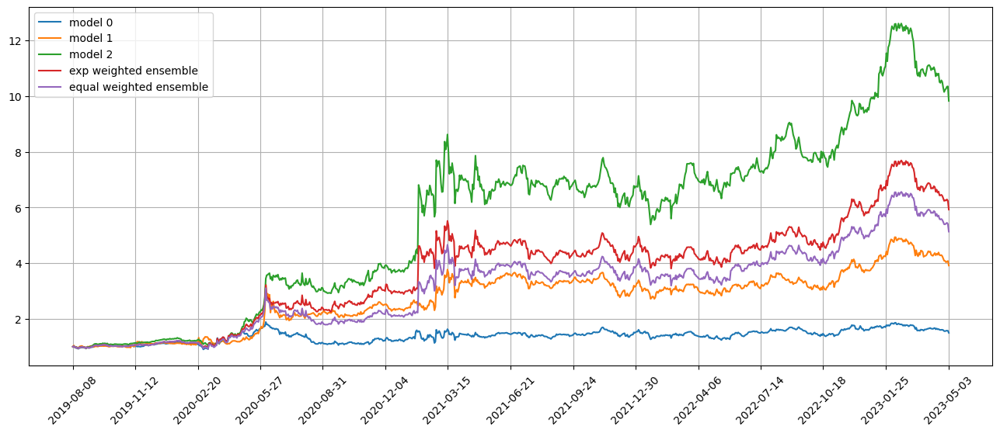

Standardization data are from 2021-09-28 to 2022-07-14
Training data are from 2022-07-15 to 2023-05-01
Testing data are from 2023-04-04 to 2023-05-30
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 48 out of 67 iterations
Restoring model weights from the end of the best epoch: 13.
Epoch 33: early stopping
Restoring model weights from the end of the best epoch: 4.
Epoch 24: early stopping
Restoring model weights from the end of the best epoch: 3.
Epoch 23: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 0.02802979201078415
11/11 [==============================] - 0s 3ms/step
Model 0 test loss 0.02674352005124092
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 0.028826648369431496
11/11 [==============================] - 0s 3ms/step
Model 1 test loss 0.026609260588884354
96/96 [==============================] - 0s 3ms/step
Model 2 training loss 0.0

position on 2023-05-08 market open will be {'VKTX': 1.083575406353889, 'WW': 1.129925239574198, 'AZPN': 1.0014549024958859, 'STAG': 0.9929679358712102, 'CINF': 0.9931956514514554, 'INTC': 0.9645036446593014, 'TNET': 0.9933712546172644, 'SSB': 1.005666112392693, 'CSGS': 0.9766571194642133, 'ROG': 0.9901512509974104}
Total asset on 2023-05-08 will be 10.131468517877437
It should be the same as 10.131468517877522
top_stocks by return weighted ensemble to buy on 2023-05-05 are ['FFIN', 'CUZ', 'WW', 'CINF', 'CSGS', 'ROG', 'TNET', 'SSB', 'CUBI', 'AZPN']
position on 2023-05-08 market open will be {'WW': 0.6813275384634605, 'AZPN': 0.6093735327915054, 'CINF': 0.6043478756454741, 'FFIN': 0.6051973431289648, 'ROG': 0.6024953937660706, 'TNET': 0.6044547281070795, 'CUBI': 0.6684274951248679, 'SSB': 0.6119360044971691, 'CSGS': 0.5942843733957636, 'CUZ': 0.6058647425261025}
Total asset on 2023-05-08 will be 6.187709027446386
It should be the same as 6.1877090274464575
top_stocks by equal weighted en

Testing data from 2023-04-13 to 2023-05-10 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2023-05-11 are ['ONB', 'SRTY', 'MGY', 'TFC', 'SBH', 'YANG', 'UMBF', 'MRCY', 'WBS', 'FHN']
position on 2023-05-12 market open will be {'SBH': 0.1558138426209434, 'YANG': 0.15475439463948587, 'WBS': 0.15853187023895904, 'FHN': 0.1534804577683637, 'UMBF': 0.15174114799671515, 'MRCY': 0.15662570774718443, 'MGY': 0.1555104951557351, 'SRTY': 0.1520805892077404, 'TFC': 0.15369300591499438, 'ONB': 0.1555684558897395}
Total asset on 2023-05-12 will be 1.5477999671798253
It should be the same as 1.5477999671798608
top_stocks by model 1 to buy on 2023-05-11 are ['YANG', 'KBWB', 'UNIT', 'VIXY', 'L', 'BEN', 'SBH', 'SRTY', 'MRCY', 'SOXS']
position on 2023-05-12 market open will be {'YANG': 0.4196912452976475, 'SBH': 0.4225644499242548, 'SOXS': 0.42013253907674425, 'L': 0.4203206110118377, 'KBWB': 0.4196077352243334, 'MRCY': 0.42476621412384086, 'BEN': 0.4103123355831014, 'UNIT': 0.4105091539

top_stocks by model 0 to buy on 2023-05-16 are ['SBH', 'SXT', 'VSAT', 'MPW', 'UNH', 'WGO', 'LAD', 'WHR', 'SFNC', 'VKTX']
position on 2023-05-17 market open will be {'SXT': 0.15225201727156695, 'SBH': 0.1516466139205348, 'VKTX': 0.16070341553542372, 'UNH': 0.1512904797318439, 'VSAT': 0.15348519694836527, 'MPW': 0.15222247669658326, 'WGO': 0.15305928456825768, 'SFNC': 0.15349492520757813, 'WHR': 0.15259645693821625, 'LAD': 0.15533132340027403}
Total asset on 2023-05-17 will be 1.5360821902186081
It should be the same as 1.536082190218644
top_stocks by model 1 to buy on 2023-05-16 are ['ALK', 'MPW', 'SQ', 'AAL', 'SATS', 'NYCB', 'JBLU', 'WHR', 'UHAL', 'VKTX']
position on 2023-05-17 market open will be {'NYCB': 0.43520231055855896, 'ALK': 0.42012592088820144, 'VKTX': 0.43939318020660056, 'MPW': 0.4162047079820363, 'JBLU': 0.42083402049850016, 'SQ': 0.4227110973873333, 'AAL': 0.4258419821673017, 'UHAL': 0.4279135986801866, 'SATS': 0.4207511516099586, 'WHR': 0.41722723987507704}
Total asset o

top_stocks by model 0 to buy on 2023-05-19 are ['MMM', 'CMPR', 'XLY', 'FAST', 'CLB', 'KRC', 'NDSN', 'TM', 'IDEX', 'SNBR']
position on 2023-05-22 market open will be {'IDEX': 0.14684506638397454, 'SNBR': 0.14769791942743202, 'XLY': 0.15023800240147667, 'NDSN': 0.14984404835091683, 'KRC': 0.15017941621815584, 'FAST': 0.15019837925782933, 'MMM': 0.1490058547690595, 'CLB': 0.15578690706486337, 'CMPR': 0.1516003264291312, 'TM': 0.1506343794079018}
Total asset on 2023-05-22 will be 1.5020302997107058
It should be the same as 1.502030299710741
top_stocks by model 1 to buy on 2023-05-19 are ['JELD', 'CMPR', 'LEA', 'RUN', 'TSLA', 'FAST', 'OSK', 'DPZ', 'MMM', 'SNBR']
position on 2023-05-22 market open will be {'OSK': 0.40737454679708496, 'SNBR': 0.4114795749924282, 'RUN': 0.3905465049015579, 'JELD': 0.4106233053433904, 'DPZ': 0.4203516020431529, 'TSLA': 0.4292606968607791, 'LEA': 0.4216477835658227, 'FAST': 0.4184457404759105, 'MMM': 0.41512342238429945, 'CMPR': 0.42235150047879644}
Total asset 

Testing data from 2023-04-26 to 2023-05-23 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2023-05-24 are ['ACIW', 'JNJ', 'PENN', 'PEGA', 'AGCO', 'IBM', 'AXON', 'FLS', 'ASGN', 'IDEX']
position on 2023-05-25 market open will be {'PEGA': 0.15246625606845435, 'FLS': 0.1486873743489351, 'AXON': 0.15030891045195166, 'ACIW': 0.14735230712225372, 'JNJ': 0.15004102015178739, 'PENN': 0.15018894322950396, 'AGCO': 0.1467282111844457, 'IBM': 0.1484200351257667, 'IDEX': 0.15252303040993143, 'ASGN': 0.14922405638606445}
Total asset on 2023-05-25 will be 1.4959401444790592
It should be the same as 1.4959401444790945
top_stocks by model 1 to buy on 2023-05-24 are ['SWKS', 'ASGN', 'ZBH', 'WWD', 'IBM', 'PENN', 'PEGA', 'MRCY', 'FLS', 'IDEX']
position on 2023-05-25 market open will be {'IDEX': 0.3860155455025499, 'WWD': 0.41183395455417904, 'PEGA': 0.42034915977145826, 'FLS': 0.40993079050972164, 'PENN': 0.41407061287804103, 'MRCY': 0.410846705995555, 'ZBH': 0.409753669630533, 'SWKS': 0

position on 2023-05-31 market open will be {'XELA': 0.17047887754492905, 'ARKK': 0.14974992554680544, 'AOR': 0.15110621515718067, 'EW': 0.15124298417005724, 'IHI': 0.1506587633405865, 'TER': 0.14350199637499406, 'UNP': 0.15259273352839597, 'ARKW': 0.14995413910232655, 'NDAQ': 0.15322901314716852, 'PRLB': 0.14782454374124163}
Total asset on 2023-05-31 will be 1.52033919165365
It should be the same as 1.5203391916536855
top_stocks by model 1 to buy on 2023-05-30 are ['SUI', 'RILY', 'WTM', 'STAG', 'NKTR', 'ARKW', 'EW', 'ARKK', 'IHI', 'XELA']
position on 2023-05-31 market open will be {'XELA': 0.46060159790108746, 'STAG': 0.41494202956620607, 'NKTR': 0.40750923818750046, 'ARKK': 0.40829539199842313, 'EW': 0.41236623846883874, 'RILY': 0.39568031615873106, 'WTM': 0.4249128908954357, 'IHI': 0.41077335171639867, 'ARKW': 0.4088521832849525, 'SUI': 0.41673466756899225}
Total asset on 2023-05-31 will be 4.160667905746524
It should be the same as 4.160667905746566
top_stocks by model 2 to buy on 2

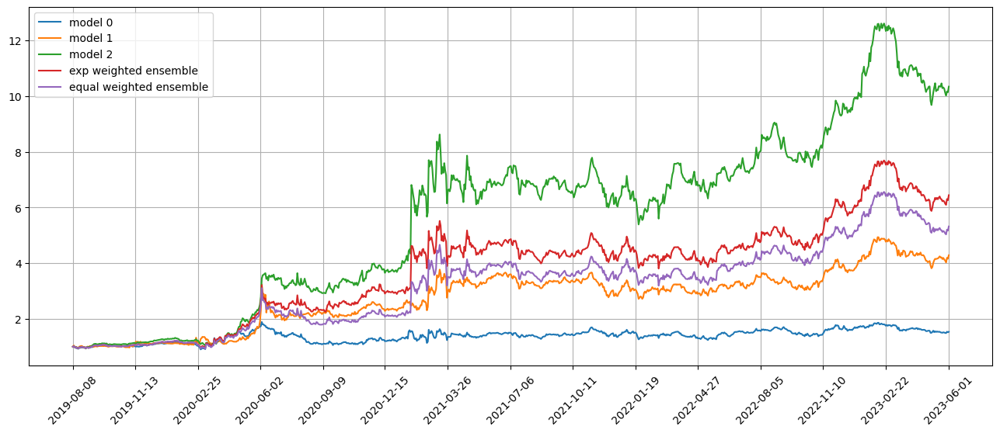

Standardization data are from 2021-10-26 to 2022-08-11
Training data are from 2022-08-12 to 2023-05-30
Testing data are from 2023-05-03 to 2023-06-28
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 49 out of 67 iterations
Restoring model weights from the end of the best epoch: 6.
Epoch 26: early stopping
Restoring model weights from the end of the best epoch: 10.
Epoch 30: early stopping
Restoring model weights from the end of the best epoch: 13.
Epoch 33: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 0.028446804732084274
11/11 [==============================] - 0s 3ms/step
Model 0 test loss 0.027455657720565796
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 0.027881061658263206
11/11 [==============================] - 0s 3ms/step
Model 1 test loss 0.027148723602294922
96/96 [==============================] - 0s 4ms/step
Model 2 training loss 

Testing data from 2023-05-08 to 2023-06-05 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2023-06-06 are ['EMN', 'PENN', 'PPBI', 'CBSH', 'CPRI', 'KALU', 'IYF', 'SEE', 'BX', 'SWKS']
position on 2023-06-07 market open will be {'EMN': 0.15461318141061656, 'SEE': 0.15481172836215656, 'PPBI': 0.16495577148906485, 'CPRI': 0.16058689550048105, 'PENN': 0.15934631643474298, 'BX': 0.157260329748998, 'IYF': 0.15518437197297447, 'CBSH': 0.16023635530765984, 'KALU': 0.16139014072024127, 'SWKS': 0.15640733008470695}
Total asset on 2023-06-07 will be 1.584792421031606
It should be the same as 1.5847924210316422
top_stocks by model 1 to buy on 2023-06-06 are ['VFC', 'BX', 'IYF', 'BC', 'EMN', 'SWKS', 'GIL', 'MTSI', 'PENN', 'XELA']
position on 2023-06-07 market open will be {'XELA': 0.508560116203614, 'BC': 0.4549320706046646, 'EMN': 0.4349128448995123, 'VFC': 0.4615879479601648, 'PENN': 0.4482267240905073, 'BX': 0.4423590328908128, 'IYF': 0.4365195521038294, 'SWKS': 0.43995962226287

position on 2023-06-12 market open will be {'SBH': 0.1581190072932551, 'SMG': 0.15478274982753415, 'MXL': 0.1623584129349954, 'FUL': 0.15661162287341646, 'CDE': 0.15493364896964823, 'WDFC': 0.15913091413187588, 'LUV': 0.16040737908449793, 'PII': 0.158514796007773, 'MORN': 0.15767281660325827, 'FDX': 0.15889922779344232}
Total asset on 2023-06-12 will be 1.5814305755196598
It should be the same as 1.581430575519697
top_stocks by model 1 to buy on 2023-06-09 are ['VRNT', 'PII', 'AAP', 'LULU', 'XRT', 'CDNA', 'PKX', 'SBSW', 'MORN', 'XELA']
position on 2023-06-12 market open will be {'XELA': 0.5045635769819456, 'LULU': 0.45404019540771806, 'PKX': 0.4438393904470027, 'AAP': 0.4460669811767631, 'XRT': 0.4368299760478014, 'CDNA': 0.42868131813986127, 'PII': 0.4445553824578721, 'MORN': 0.44219404783408506, 'SBSW': 0.43458891095452973, 'VRNT': 0.4391397386683872}
Total asset on 2023-06-12 will be 4.474499518115927
It should be the same as 4.474499518115965
top_stocks by model 2 to buy on 2023-06

top_stocks by model 0 to buy on 2023-06-14 are ['VNO', 'PPBI', 'WTM', 'CADE', 'NFG', 'FHB', 'DBRG', 'INTC', 'FFIN', 'BN']
position on 2023-06-15 market open will be {'CADE': 0.15113363292120732, 'INTC': 0.16447187034373334, 'FFIN': 0.15397076461626932, 'NFG': 0.15624967548511423, 'PPBI': 0.15154840257182106, 'WTM': 0.15939812311226115, 'VNO': 0.15100737532119804, 'BN': 0.15799434663631465, 'DBRG': 0.1501670037343068, 'FHB': 0.15182556583292897}
Total asset on 2023-06-15 will be 1.5477667605751175
It should be the same as 1.547766760575155
top_stocks by model 1 to buy on 2023-06-14 are ['INSG', 'OTEX', 'INTC', 'FFIN', 'ACMR', 'VOD', 'LITE', 'BN', 'PPLT', 'VKTX']
position on 2023-06-15 market open will be {'INSG': 0.41407351950196175, 'VKTX': 0.44071599463365174, 'INTC': 0.4764485076834839, 'OTEX': 0.44973104476569903, 'FFIN': 0.44602849639267567, 'PPLT': 0.457356227114048, 'BN': 0.4576841652008813, 'VOD': 0.46336646618896293, 'LITE': 0.473091701718568, 'ACMR': 0.4541713242952907}
Total 

Testing data from 2023-05-19 to 2023-06-16 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2023-06-20 are ['CNC', 'ELME', 'TLT', 'CBOE', 'ZROZ', 'GGB', 'BURL', 'VGLT', 'LOGI', 'SPTL']
position on 2023-06-21 market open will be {'BURL': 0.15481817804387746, 'CBOE': 0.15449997461049608, 'ZROZ': 0.1534201918390673, 'GGB': 0.15216485013324782, 'VGLT': 0.15371433171623158, 'TLT': 0.15372598256764464, 'LOGI': 0.14944543785569386, 'ELME': 0.15171641992529786, 'CNC': 0.15466961394393416, 'SPTL': 0.15376315414116676}
Total asset on 2023-06-21 will be 1.5319381347766194
It should be the same as 1.5319381347766576
top_stocks by model 1 to buy on 2023-06-20 are ['ZROZ', 'GGB', 'GSK', 'TLT', 'VGLT', 'LOGI', 'BURL', 'SPTL', 'VKTX', 'XELA']
position on 2023-06-21 market open will be {'ZROZ': 0.4648373034056128, 'XELA': 0.43190934944553566, 'BURL': 0.45626517848211406, 'VKTX': 0.46951399895255475, 'GGB': 0.4484455467824573, 'VGLT': 0.4530120292197747, 'TLT': 0.4530463654835559, 'LOG

top_stocks by model 1 to buy on 2023-06-23 are ['PARA', 'MODG', 'HESM', 'ZROZ', 'DPZ', 'CROX', 'SMCI', 'MGNX', 'VKTX', 'XELA']
position on 2023-06-26 market open will be {'XELA': 0.4364367184054519, 'ZROZ': 0.4516872697294751, 'HESM': 0.446933777733968, 'VKTX': 0.419410412891844, 'CROX': 0.45172603310995435, 'MODG': 0.4519062632163906, 'DPZ': 0.43949965825932785, 'PARA': 0.4482210101833179, 'SMCI': 0.441194629082397, 'MGNX': 0.46349212776406395}
Total asset on 2023-06-26 will be 4.450507900376153
It should be the same as 4.4505079003761905
top_stocks by model 2 to buy on 2023-06-23 are ['FHB', 'EZA', 'ALGT', 'SNV', 'ELV', 'PPBI', 'MODG', 'HIW', 'TVTX', 'UGI']
position on 2023-06-26 market open will be {'TVTX': 1.082340446831777, 'ELV': 1.0969729213684873, 'MODG': 1.1063917877569054, 'EZA': 1.100121656907827, 'PPBI': 1.0969243500561594, 'SNV': 1.099881363783939, 'HIW': 1.0839066228169658, 'ALGT': 1.0938263962745522, 'UGI': 1.08374349976028, 'FHB': 1.091869766577927}
Total asset on 2023-

position on 2023-06-29 market open will be {'EUFN': 1.099559551508987, 'TSEM': 1.10577976565703, 'ZROZ': 1.0814512049265919, 'VGLT': 1.0877325761249264, 'EWI': 1.1054536884783104, 'EFV': 1.0933363207567952, 'EWA': 1.100144126070204, 'EWG': 1.091963203225474, 'EFAV': 1.0919621829559865, 'SPLV': 1.0902440420922312}
Total asset on 2023-06-29 will be 10.947626661796455
It should be the same as 10.947626661796537
top_stocks by return weighted ensemble to buy on 2023-06-28 are ['SPTL', 'BR', 'EWA', 'ACWV', 'TRV', 'VGLT', 'SPLV', 'EFV', 'EWG', 'EFAV']
position on 2023-06-29 market open will be {'TRV': 0.6482591469571358, 'VGLT': 0.6579683500372921, 'EFV': 0.6613580495740996, 'EWA': 0.6654760842158463, 'SPTL': 0.657949072432851, 'EWG': 0.6605274521494005, 'BR': 0.6649009129102947, 'EFAV': 0.6605268349894055, 'ACWV': 0.6622668232383339, 'SPLV': 0.6594875332951563}
Total asset on 2023-06-29 will be 6.598720259799741
It should be the same as 6.598720259799816
top_stocks by equal weighted ensemble

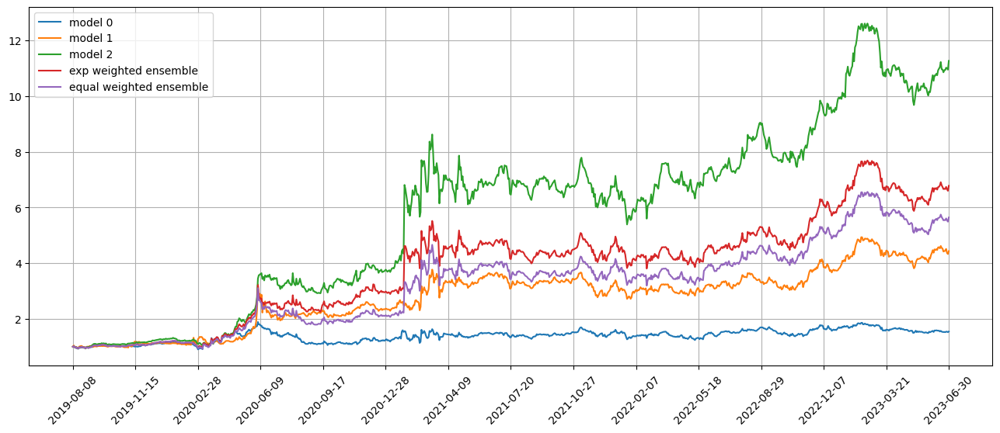

Standardization data are from 2021-11-23 to 2022-09-09
Training data are from 2022-09-12 to 2023-06-28
Testing data are from 2023-06-01 to 2023-07-27
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 50 out of 67 iterations
Restoring model weights from the end of the best epoch: 7.
Epoch 27: early stopping
Restoring model weights from the end of the best epoch: 20.
Epoch 40: early stopping
Restoring model weights from the end of the best epoch: 34.
Epoch 54: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 0.028571689501404762
11/11 [==============================] - 0s 3ms/step
Model 0 test loss 0.024521401152014732
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 0.027905387803912163
11/11 [==============================] - 0s 2ms/step
Model 1 test loss 0.024010702967643738
96/96 [==============================] - 0s 3ms/step
Model 2 training loss 

Testing data from 2023-06-06 to 2023-07-05 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2023-07-06 are ['DCI', 'CHRW', 'UNG', 'JBHT', 'YANG', 'MU', 'WKC', 'DORM', 'LGF-A', 'GT']
position on 2023-07-07 market open will be {'UNG': 0.1563460574104931, 'YANG': 0.1581194886269702, 'MU': 0.15995566547011367, 'WKC': 0.1577471895762729, 'JBHT': 0.16085634701519458, 'DORM': 0.16127294877249654, 'CHRW': 0.16146019301093004, 'GT': 0.16061325473427487, 'DCI': 0.15775106187489396, 'LGF-A': 0.1619419512932472}
Total asset on 2023-07-07 will be 1.596064157784849
It should be the same as 1.5960641577848869
top_stocks by model 1 to buy on 2023-07-06 are ['MDGL', 'INSG', 'KMPR', 'HRB', 'OPK', 'UNG', 'WKC', 'MHO', 'GT', 'XELA']
position on 2023-07-07 market open will be {'XELA': 0.4002178962546933, 'MDGL': 0.4360917786487063, 'WKC': 0.477831138488805, 'GT': 0.4600261070159587, 'UNG': 0.46146537911612334, 'INSG': 0.46174168538668026, 'OPK': 0.45972358543631303, 'KMPR': 0.466172598962

top_stocks by model 0 to buy on 2023-07-11 are ['LEG', 'FORM', 'COMM', 'CC', 'STX', 'SSRM', 'ENTG', 'ABM', 'FSLR', 'EWY']
position on 2023-07-12 market open will be {'ENTG': 0.16594044506945518, 'CC': 0.16526603521539474, 'LEG': 0.1679164293382445, 'FSLR': 0.16216931943015392, 'EWY': 0.16670169592608491, 'STX': 0.16713741592861392, 'SSRM': 0.1653924917534808, 'ABM': 0.167719173612902, 'FORM': 0.16696021822657814, 'COMM': 0.1633485964602101}
Total asset on 2023-07-12 will be 1.6585518209610797
It should be the same as 1.658551820961118
top_stocks by model 1 to buy on 2023-07-11 are ['GPK', 'SCO', 'FORM', 'COMM', 'CMCSA', 'FSLR', 'MDGL', 'IDEX', 'XELA', 'VKTX']
position on 2023-07-12 market open will be {'XELA': 0.466317232647566, 'IDEX': 0.48157353567425204, 'VKTX': 0.49557514200188724, 'FSLR': 0.481433155845654, 'MDGL': 0.496229081600343, 'CMCSA': 0.48706095729776133, 'FORM': 0.4956559295182849, 'SCO': 0.4627215560766781, 'GPK': 0.4938813329693238, 'COMM': 0.4849340835438847}
Total ass

top_stocks by model 0 to buy on 2023-07-14 are ['CFG', 'FMC', 'VNO', 'NGVT', 'FULT', 'SXT', 'BANC', 'TROX', 'PK', 'FNKO']
position on 2023-07-17 market open will be {'SXT': 0.1756537422930324, 'NGVT': 0.17511284952637782, 'BANC': 0.17121231063841752, 'TROX': 0.17321050476063815, 'FULT': 0.17028058656109896, 'FMC': 0.17274157169406443, 'CFG': 0.16940942208116944, 'VNO': 0.17329330089203002, 'PK': 0.16965663872309478, 'FNKO': 0.14715519435933463}
Total asset on 2023-07-17 will be 1.6977261215292192
It should be the same as 1.697726121529258
top_stocks by model 1 to buy on 2023-07-14 are ['AAT', 'FULT', 'ACIW', 'VKTX', 'DEI', 'SBH', 'TROX', 'NGVT', 'IDEX', 'XELA']
position on 2023-07-17 market open will be {'XELA': 0.43734216629172107, 'VKTX': 0.46949222152350617, 'SBH': 0.5050661105071409, 'NGVT': 0.5028573552421642, 'ACIW': 0.5006505129161968, 'DEI': 0.4881586476423622, 'FULT': 0.4889809379425374, 'TROX': 0.4973945462007608, 'AAT': 0.5026981335946683, 'IDEX': 0.47869611242186266}
Total 

position on 2023-07-20 market open will be {'TNET': 0.16771732735745698, 'BDN': 0.17726369614786086, 'HOUS': 0.17038816329167966, 'DPZ': 0.16824511019480926, 'SWBI': 0.17104189754785784, 'JNPR': 0.16769584822428954, 'FULT': 0.17175610160888433, 'GEN': 0.16892272783826692, 'SFNC': 0.17510347539266896, 'BBWI': 0.17065786129842578}
Total asset on 2023-07-20 will be 1.7087922089021608
It should be the same as 1.7087922089022003
top_stocks by model 1 to buy on 2023-07-19 are ['HOUS', 'TNET', 'DPZ', 'IDEX', 'JNPR', 'CNK', 'AAOI', 'MDGL', 'VKTX', 'XELA']
position on 2023-07-20 market open will be {'XELA': 0.4771828663399365, 'VKTX': 0.46100012200503027, 'IDEX': 0.45909431685884805, 'MDGL': 0.47134115048896413, 'AAOI': 0.4749619250694588, 'HOUS': 0.5146542525091595, 'DPZ': 0.5081812008114943, 'JNPR': 0.5065221653279929, 'TNET': 0.5081435729375269, 'CNK': 0.5506248656693855}
Total asset on 2023-07-20 will be 4.931706438017762
It should be the same as 4.931706438017796
top_stocks by model 2 to b

top_stocks by model 1 to buy on 2023-07-24 are ['ACIW', 'AAOI', 'KNDI', 'MDGL', 'TRV', 'CMP', 'TBF', 'IDEX', 'XELA', 'VKTX']
position on 2023-07-25 market open will be {'XELA': 0.4753719273912082, 'VKTX': 0.43946656224736386, 'IDEX': 0.412669048861886, 'AAOI': 0.5340713828194582, 'MDGL': 0.4745349789234116, 'ACIW': 0.49746488939917466, 'TRV': 0.49898022805762576, 'CMP': 0.5025645280698324, 'KNDI': 0.5000006993015723, 'TBF': 0.5018485993457305}
Total asset on 2023-07-25 will be 4.836972844417227
It should be the same as 4.836972844417263
top_stocks by model 2 to buy on 2023-07-24 are ['ZTO', 'OLN', 'DHR', 'GHC', 'KALU', 'ASH', 'CNK', 'MTD', 'CMP', 'TBF']
position on 2023-07-25 market open will be {'OLN': 1.214263215381758, 'GHC': 1.2313775031336909, 'DHR': 1.201181550879685, 'ZTO': 1.279681055943607, 'CNK': 1.2028324751519006, 'MTD': 1.214596455162248, 'TBF': 1.2501364137630442, 'ASH': 1.2541729989454211, 'KALU': 1.2469441905614982, 'CMP': 1.251919837227463}
Total asset on 2023-07-25 wi

top_stocks by model 1 to buy on 2023-07-27 are ['UNH', 'OMCL', 'MDGL', 'CRM', 'HBI', 'BKU', 'SFNC', 'IDEX', 'XELA', 'VKTX']
position on 2023-07-28 market open will be {'XELA': 0.5532423885389108, 'VKTX': 0.4197527525627724, 'IDEX': 0.4240174319635129, 'MDGL': 0.463737525088102, 'BKU': 0.4985663731353541, 'UNH': 0.5028044863247471, 'CRM': 0.5016206158237246, 'OMCL': 0.4995896917733342, 'HBI': 0.4984650423767273, 'SFNC': 0.5046300718299334}
Total asset on 2023-07-28 will be 4.866426379417083
It should be the same as 4.866426379417119
top_stocks by model 2 to buy on 2023-07-27 are ['CRM', 'UNH', 'CMP', 'NG', 'WEN', 'MNRO', 'KTOS', 'IBTX', 'HBI', 'SFNC']
position on 2023-07-28 market open will be {'IBTX': 1.2137859628552994, 'MNRO': 1.2162453682085625, 'UNH': 1.2289388891360762, 'CRM': 1.226045310144683, 'NG': 1.2006441707720334, 'HBI': 1.2183325569135286, 'WEN': 1.2434211373903454, 'KTOS': 1.242213679651504, 'SFNC': 1.2334009277291798, 'CMP': 1.2554570893188655}
Total asset on 2023-07-28 

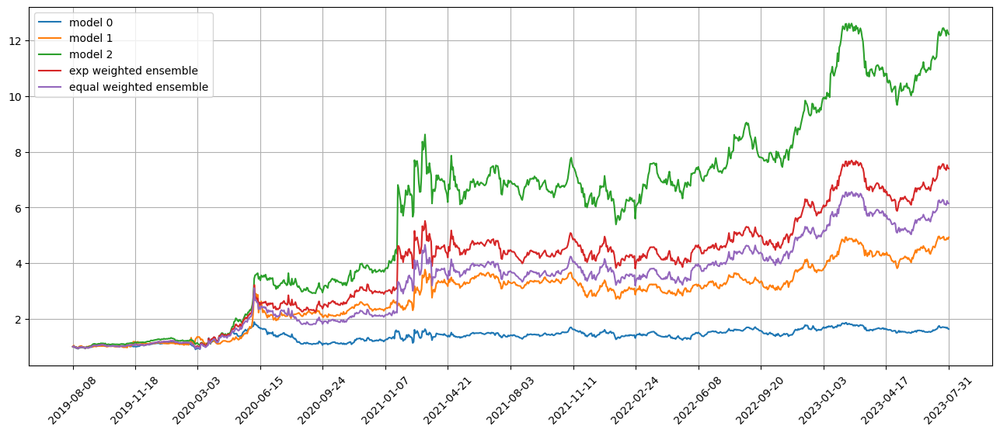

Standardization data are from 2021-12-22 to 2022-10-07
Training data are from 2022-10-10 to 2023-07-27
Testing data are from 2023-06-30 to 2023-08-24
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 51 out of 67 iterations
Restoring model weights from the end of the best epoch: 13.
Epoch 33: early stopping
Restoring model weights from the end of the best epoch: 8.
Epoch 28: early stopping
Restoring model weights from the end of the best epoch: 10.
Epoch 30: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 0.02721315063536167
11/11 [==============================] - 0s 3ms/step
Model 0 test loss 0.02476394735276699
96/96 [==============================] - 0s 4ms/step
Model 1 training loss 0.02732725813984871
11/11 [==============================] - 0s 4ms/step
Model 1 test loss 0.02471943199634552
96/96 [==============================] - 0s 3ms/step
Model 2 training loss 0.02

position on 2023-08-03 market open will be {'ERY': 1.2259915638843366, 'WKC': 1.1843777364352128, 'NNN': 1.169135738523649, 'RUN': 1.3252124056413133, 'TSEM': 1.1938373513135654, 'WERN': 1.2209097876797688, 'SIMO': 1.236271285718202, 'KALU': 1.2046447054896878, 'CMP': 1.2180617875325426, 'MRIN': 1.2514060252013983}
Total asset on 2023-08-03 will be 12.229848387419588
It should be the same as 12.229848387419676
top_stocks by return weighted ensemble to buy on 2023-08-02 are ['MRIN', 'NNN', 'RUN', 'WKC', 'LHX', 'GVI', 'ERY', 'KALU', 'TSEM', 'SIMO']
position on 2023-08-03 market open will be {'ERY': 0.7714289964346177, 'RUN': 0.817992806814422, 'NNN': 0.7216538422300729, 'WKC': 0.7310620281179089, 'TSEM': 0.7369010143006427, 'GVI': 0.7491354303497099, 'SIMO': 0.7630935348053314, 'LHX': 0.7444574977924165, 'KALU': 0.7435718981069906, 'MRIN': 0.7724355149871978}
Total asset on 2023-08-03 will be 7.551732563939231
It should be the same as 7.55173256393931
top_stocks by equal weighted ensembl

position on 2023-08-08 market open will be {'LEG': 0.6202497370152241, 'MNRO': 0.6227257796953234, 'BCPC': 0.6374164118733721, 'KMT': 0.6321903877012459, 'RTX': 0.6404199240331554, 'FL': 0.629115493049511, 'CNK': 0.654593045119312, 'CBU': 0.6305542225738423, 'SHOO': 0.6105953433765663, 'JBT': 0.635467765864183}
Total asset on 2023-08-08 will be 6.313328110301644
It should be the same as 6.313328110301736
Testing data from 2023-07-11 to 2023-08-07 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2023-08-08 are ['FIVN', 'FWRD', 'CARS', 'CMI', 'KN', 'ERIC', 'XBI', 'WKC', 'BBWI', 'NGVT']
position on 2023-08-09 market open will be {'NGVT': 0.172298218271398, 'WKC': 0.1689486400984373, 'FWRD': 0.16376157690568227, 'XBI': 0.16679330926684754, 'CMI': 0.16742385026318227, 'FIVN': 0.15775019182125843, 'CARS': 0.1687217713426366, 'ERIC': 0.16677160064617966, 'KN': 0.16726934061249585, 'BBWI': 0.16645565604774493}
Total asset on 2023-08-09 will be 1.666194155275823
It should be t

position on 2023-08-11 market open will be {'SLV': 0.6377893982373495, 'DBA': 0.6402251879993065, 'ZROZ': 0.6237599681572159, 'IDA': 0.6390385004148995, 'CDE': 0.588163165813879, 'CCK': 0.6390510077907824, 'PSLV': 0.6355481198910944, 'SILJ': 0.6348692914906218, 'FWRD': 0.5307282161039089, 'CSGS': 0.638227271226156}
Total asset on 2023-08-11 will be 6.207400127125122
It should be the same as 6.207400127125213
Testing data from 2023-07-14 to 2023-08-10 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2023-08-11 are ['VUZI', 'ENR', 'QLYS', 'INFY', 'ATSG', 'OTEX', 'AXL', 'TEAM', 'OUT', 'ACMR']
position on 2023-08-14 market open will be {'ATSG': 0.15772906593907568, 'OUT': 0.15735914630315637, 'QLYS': 0.16584637567424218, 'ENR': 0.16275273878306531, 'OTEX': 0.1644630822347298, 'VUZI': 0.16951976075121886, 'INFY': 0.16318673450339372, 'AXL': 0.1571231073615033, 'ACMR': 0.1587312494955766, 'TEAM': 0.1609618620940495}
Total asset on 2023-08-14 will be 1.6176731231399728
It sh

top_stocks by equal weighted ensemble to buy on 2023-08-15 are ['DBC', 'CNK', 'CUK', 'CSGS', 'CCL', 'DUST', 'JDST', 'VKTX', 'KMPR', 'CHGG']
position on 2023-08-16 market open will be {'VKTX': 0.6115556466422307, 'DUST': 0.6460866343185278, 'DBC': 0.614570113087197, 'CCL': 0.6103152935951879, 'KMPR': 0.6162202858780395, 'JDST': 0.6439779892886706, 'CNK': 0.6465926950820001, 'CHGG': 0.5982047141462438, 'CUK': 0.6100687389118379, 'CSGS': 0.611088486087847}
Total asset on 2023-08-16 will be 6.2086805970376915
It should be the same as 6.208680597037782
Testing data from 2023-07-19 to 2023-08-15 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2023-08-16 are ['DFEN', 'VUZI', 'PAAS', 'SMCI', 'PDM', 'SONY', 'SCHW', 'CDE', 'BALL', 'ELS']
position on 2023-08-17 market open will be {'PDM': 0.15924643330673627, 'DFEN': 0.16380437095893047, 'SONY': 0.16490657597677702, 'ELS': 0.16162515117348766, 'CDE': 0.1662150583698591, 'VUZI': 0.1569711778017597, 'SCHW': 0.16281884014857892, '

top_stocks by model 1 to buy on 2023-08-21 are ['BHP', 'ASX', 'TSEM', 'STLD', 'PUK', 'VKTX', 'RIO', 'COHR', 'XELA', 'HE']
position on 2023-08-22 market open will be {'XELA': 0.36671550411512277, 'VKTX': 0.5386402726328927, 'HE': 0.4266886916674627, 'TSEM': 0.45100100026588497, 'PUK': 0.45521391072391015, 'ASX': 0.45806720773254156, 'RIO': 0.46337373477204197, 'COHR': 0.47547867298756125, 'BHP': 0.4529594254954364, 'STLD': 0.44791916112571084}
Total asset on 2023-08-22 will be 4.536057581518531
It should be the same as 4.536057581518565
top_stocks by model 2 to buy on 2023-08-21 are ['X', 'SHOO', 'JKHY', 'DBO', 'PICK', 'TSEM', 'PUK', 'BHP', 'RIO', 'HE']
position on 2023-08-22 market open will be {'HE': 1.104400123978566, 'TSEM': 1.1673277739366026, 'PUK': 1.1782320676828726, 'DBO': 1.157940688547729, 'PICK': 1.1852316328610488, 'RIO': 1.199352174370451, 'BHP': 1.1723967741434442, 'SHOO': 1.146069664467087, 'JKHY': 1.164162143521568, 'X': 1.2058434632687003}
Total asset on 2023-08-22 wil

top_stocks by model 1 to buy on 2023-08-24 are ['BDN', 'SKYW', 'OZK', 'UMBF', 'KMPR', 'ESRT', 'PLCE', 'XELA', 'VKTX', 'HE']
position on 2023-08-25 market open will be {'XELA': 0.37124282989884877, 'VKTX': 0.5129907598225217, 'HE': 0.31630190280167636, 'ESRT': 0.4554832449453332, 'BDN': 0.4652254679263653, 'KMPR': 0.4621777775009981, 'SKYW': 0.4522148840206352, 'UMBF': 0.46851554125923645, 'OZK': 0.4677211584685604, 'PLCE': 0.4503245649959892}
Total asset on 2023-08-25 will be 4.422198131640132
It should be the same as 4.422198131640164
top_stocks by model 2 to buy on 2023-08-24 are ['KWR', 'PNR', 'MSGS', 'LHX', 'PDM', 'SKYW', 'CHH', 'ESRT', 'PLCE', 'HE']
position on 2023-08-25 market open will be {'PDM': 1.197368125662806, 'ESRT': 1.1798679875846632, 'CHH': 1.184735970523105, 'SKYW': 1.1714017388922735, 'HE': 0.9131011688184454, 'KWR': 1.214947128042303, 'MSGS': 1.1905209112095767, 'LHX': 1.1931840677164542, 'PNR': 1.1815011758361729, 'PLCE': 1.1665051221050418}
Total asset on 2023-08-

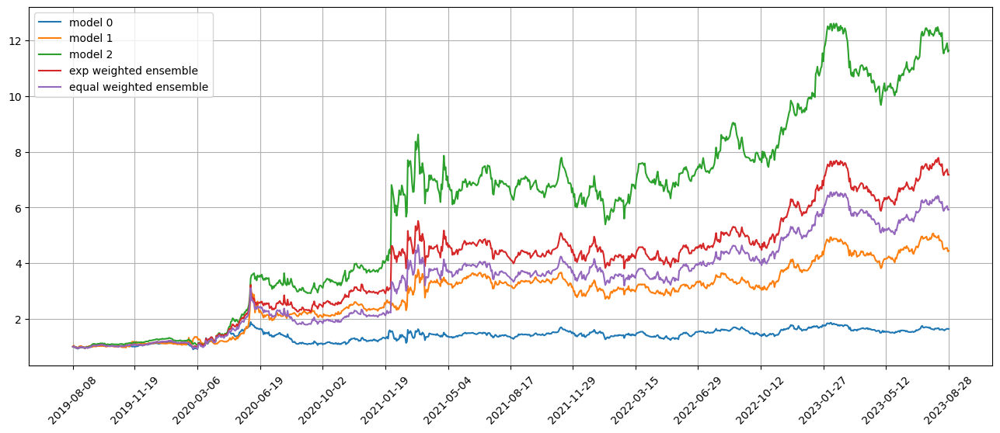

Standardization data are from 2022-01-21 to 2022-11-04
Training data are from 2022-11-07 to 2023-08-24
Testing data are from 2023-07-31 to 2023-09-22
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 52 out of 67 iterations
Restoring model weights from the end of the best epoch: 3.
Epoch 23: early stopping
Restoring model weights from the end of the best epoch: 10.
Epoch 30: early stopping
Restoring model weights from the end of the best epoch: 10.
Epoch 30: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 0.0271011795848608
11/11 [==============================] - 0s 3ms/step
Model 0 test loss 0.021012363955378532
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 0.02693120762705803
11/11 [==============================] - 0s 3ms/step
Model 1 test loss 0.02124653570353985
96/96 [==============================] - 0s 3ms/step
Model 2 training loss 0.02

position on 2023-08-31 market open will be {'HE': 0.6515144919805013, 'HOUS': 0.6288252444594824, 'CSGS': 0.6204824764784213, 'GOGO': 0.6115057211588393, 'CVS': 0.6075113877215583, 'CODX': 0.630464286027066, 'SIMO': 0.6072704645637504, 'ADC': 0.6123533916233732, 'RDFN': 0.6273247793283093, 'WBA': 0.6111013918993228}
Total asset on 2023-08-31 will be 6.20835363524053
It should be the same as 6.208353635240624
Testing data from 2023-08-03 to 2023-08-30 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2023-08-31 are ['EWT', 'NNDM', 'EQNR', 'MHK', 'SMTC', 'PENN', 'SGH', 'FBIN', 'QCOM', 'ERIE']
position on 2023-09-01 market open will be {'MHK': 0.17487584476764625, 'EWT': 0.17340143036562433, 'EQNR': 0.17757529432312433, 'NNDM': 0.17581419073055476, 'SMTC': 0.17824457818047545, 'FBIN': 0.17512761176873942, 'ERIE': 0.17129339437885405, 'SGH': 0.1751217477168078, 'PENN': 0.16999697360148303, 'QCOM': 0.17751395926617186}
Total asset on 2023-09-01 will be 1.7489650250994422
It

position on 2023-09-06 market open will be {'PDM': 0.6135763546687775, 'HE': 0.5398135840086922, 'TWLO': 0.6241917502184585, 'KWR': 0.5963459090793449, 'MMM': 0.6154949026285873, 'TSN': 0.6108829279620238, 'MJ': 0.688788822600185, 'AUPH': 0.6434008741855589, 'TRUP': 0.6173256902061726, 'MCY': 0.6042970221986418}
Total asset on 2023-09-06 will be 6.154117837756347
It should be the same as 6.154117837756443
Testing data from 2023-08-08 to 2023-09-05 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2023-09-06 are ['BKU', 'CMI', 'VICR', 'TGI', 'WD', 'NGVT', 'PENN', 'CVBF', 'HZO', 'FL']
position on 2023-09-07 market open will be {'BKU': 0.16442696522554093, 'CVBF': 0.1653175992585898, 'NGVT': 0.1676414721696538, 'VICR': 0.1650890524608245, 'TGI': 0.1651038648506922, 'WD': 0.1645816743099391, 'PENN': 0.16726284174137096, 'CMI': 0.17247753955089107, 'FL': 0.167342953903459, 'HZO': 0.16804517687506204}
Total asset on 2023-09-07 will be 1.667289140345984
It should be the same 

top_stocks by model 0 to buy on 2023-09-11 are ['VLY', 'WTM', 'NOVT', 'MPW', 'TPH', 'CMP', 'PLCE', 'IFF', 'CPRI', 'SGMO']
position on 2023-09-12 market open will be {'MPW': 0.16010976329014864, 'NOVT': 0.16388932839130135, 'IFF': 0.1614642377801079, 'CPRI': 0.16616669024666175, 'WTM': 0.1668319006742078, 'PLCE': 0.16770912425807696, 'SGMO': 0.17108991340975496, 'CMP': 0.16241391823884327, 'VLY': 0.16394763168252277, 'TPH': 0.16534938427205012}
Total asset on 2023-09-12 will be 1.6489718922436363
It should be the same as 1.6489718922436756
top_stocks by model 1 to buy on 2023-09-11 are ['CCK', 'CRI', 'HLF', 'CMP', 'KALU', 'WTM', 'IDEX', 'SGMO', 'XELA', 'HE']
position on 2023-09-12 market open will be {'XELA': 0.3404568461823705, 'IDEX': 0.32222908725189514, 'HE': 0.4487897046325272, 'CCK': 0.43351294941029783, 'WTM': 0.44420753584532374, 'CRI': 0.4362864038889088, 'KALU': 0.44609748386761167, 'SGMO': 0.45554494396218653, 'CMP': 0.43244419152634, 'HLF': 0.4269158629977791}
Total asset on

top_stocks by model 1 to buy on 2023-09-14 are ['DG', 'HUN', 'MCY', 'NNDM', 'MAN', 'MRCY', 'IDEX', 'XELA', 'PLCE', 'HE']
position on 2023-09-15 market open will be {'XELA': 0.34498419355419163, 'IDEX': 0.3357177332561503, 'MAN': 0.44081589048006553, 'DG': 0.4260059565045717, 'HUN': 0.44411425303503504, 'HE': 0.42517964758666327, 'NNDM': 0.43818367276032827, 'MRCY': 0.435359145168099, 'PLCE': 0.46851516651765474, 'MCY': 0.4350196168668874}
Total asset on 2023-09-15 will be 4.193895275729613
It should be the same as 4.193895275729647
top_stocks by model 2 to buy on 2023-09-14 are ['MEOH', 'MJ', 'MRCY', 'AMRC', 'BWX', 'MCY', 'PENN', 'TRUP', 'MAN', 'PLCE']
position on 2023-09-15 market open will be {'MAN': 1.1901772933010044, 'AMRC': 1.2217700484237775, 'MEOH': 1.1803807500944046, 'MRCY': 1.1707611417908124, 'PENN': 1.2211319907940956, 'MJ': 1.264137567014319, 'PLCE': 1.2599238063248452, 'TRUP': 1.2384074906708966, 'MCY': 1.1698480874860882, 'BWX': 1.1711423576038407}
Total asset on 2023-0

top_stocks by model 2 to buy on 2023-09-19 are ['NTRS', 'ENR', 'MJ', 'WPM', 'CSGS', 'BFH', 'MMM', 'CABO', 'MTCH', 'XRX']
position on 2023-09-20 market open will be {'ENR': 1.2215080954968491, 'MTCH': 1.1924643442374487, 'XRX': 1.2240867467573178, 'WPM': 1.1851815009302398, 'CABO': 1.2269514247459623, 'BFH': 1.2309938141656904, 'NTRS': 1.1869988888871121, 'MJ': 1.149407937133263, 'MMM': 1.186990773534371, 'CSGS': 1.20842369400472}
Total asset on 2023-09-20 will be 12.013007219892877
It should be the same as 12.013007219892975
top_stocks by return weighted ensemble to buy on 2023-09-19 are ['MORN', 'ENR', 'ACB', 'PRLB', 'MTCH', 'MMM', 'XRX', 'UI', 'CSGS', 'CABO']
position on 2023-09-20 market open will be {'ENR': 0.746252743252026, 'MTCH': 0.7285091203226657, 'CSGS': 0.7382591240993499, 'XRX': 0.7478281119164737, 'UI': 0.7222992562186429, 'CABO': 0.7495782221412366, 'MMM': 0.7251651661011472, 'MORN': 0.7303342225440729, 'PRLB': 0.7398009164737824, 'ACB': 0.703349877128471}
Total asset on

top_stocks by model 2 to buy on 2023-09-22 are ['RNG', 'DPZ', 'SWK', 'MCY', 'MORN', 'PZZA', 'HAIN', 'BDN', 'KMPR', 'PLCE']
position on 2023-09-25 market open will be {'HAIN': 1.1096264230273258, 'BDN': 1.1368646256891208, 'KMPR': 1.1428294187899661, 'PZZA': 1.1433879190405325, 'DPZ': 1.1629597286812423, 'RNG': 1.1508910088105644, 'SWK': 1.148076904253388, 'MORN': 1.148854459067705, 'PLCE': 1.07448848345827, 'MCY': 1.1754327358919474}
Total asset on 2023-09-25 will be 11.393411706709967
It should be the same as 11.393411706710062
top_stocks by return weighted ensemble to buy on 2023-09-22 are ['KALU', 'MCY', 'KRC', 'SWK', 'DPZ', 'HAIN', 'PLCE', 'KMPR', 'BDN', 'PZZA']
position on 2023-09-25 market open will be {'HAIN': 0.68477989109346, 'BDN': 0.7015893082677896, 'KMPR': 0.7052703402666928, 'PZZA': 0.705615005581813, 'DPZ': 0.7176932883228658, 'KRC': 0.7081095065953212, 'SWK': 0.7085087027007387, 'KALU': 0.7120535968159496, 'PLCE': 0.6630953367858035, 'MCY': 0.725390711835954}
Total asse

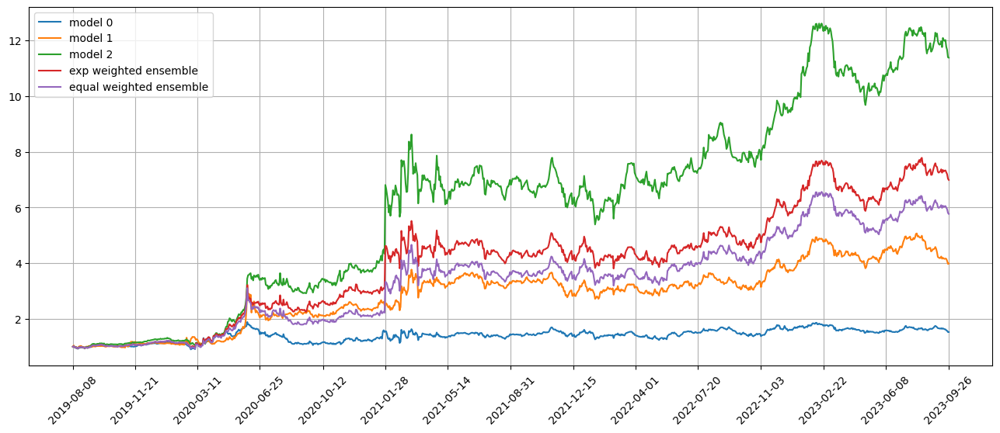

Standardization data are from 2022-02-18 to 2022-12-05
Training data are from 2022-12-06 to 2023-09-22
Testing data are from 2023-08-28 to 2023-10-20
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 53 out of 67 iterations
Restoring model weights from the end of the best epoch: 6.
Epoch 26: early stopping
Restoring model weights from the end of the best epoch: 6.
Epoch 26: early stopping
Restoring model weights from the end of the best epoch: 6.
Epoch 26: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 0.026615995913743973
11/11 [==============================] - 0s 4ms/step
Model 0 test loss 0.026866376399993896
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 0.026857241988182068
11/11 [==============================] - 0s 3ms/step
Model 1 test loss 0.027042295783758163
96/96 [==============================] - 0s 3ms/step
Model 2 training loss 0.

position on 2023-09-29 market open will be {'BKU': 1.142280591116874, 'PTCT': 1.1225237765641563, 'WIX': 1.1757937493378767, 'RNG': 1.1765033268484553, 'PPBI': 1.1449128038700989, 'SNV': 1.1521166235738372, 'TFI': 1.1378813673934827, 'USB': 1.150511818460228, 'TRUP': 1.1490201534582025, 'CSGS': 1.1353579065718402}
Total asset on 2023-09-29 will be 11.486902117194957
It should be the same as 11.486902117195052
top_stocks by return weighted ensemble to buy on 2023-09-28 are ['FIBK', 'USB', 'WIX', 'KRC', 'PPBI', 'TFI', 'XPO', 'SNV', 'BKU', 'CSGS']
position on 2023-09-29 market open will be {'BKU': 0.704917039075464, 'WIX': 0.7255984692310076, 'CSGS': 0.7006449553773881, 'KRC': 0.7261776337212977, 'PPBI': 0.706541413712177, 'XPO': 0.7530633045783705, 'SNV': 0.7109869897773604, 'TFI': 0.7022022177036927, 'USB': 0.7099966425038657, 'FIBK': 0.7117276327536921}
Total asset on 2023-09-29 will be 7.151856298434225
It should be the same as 7.151856298434316
top_stocks by equal weighted ensemble t

position on 2023-10-04 market open will be {'ENR': 1.0848673243288205, 'VPU': 1.1428932858662617, 'PDI': 1.1265918857019837, 'XLU': 1.1443221654338842, 'KRE': 1.1031567907266335, 'MPC': 1.0901879697228147, 'DPST': 1.0757765124665917, 'DK': 1.0568657857425086, 'SATS': 1.0387236234421253, 'XLP': 1.114713935954104}
Total asset on 2023-10-04 will be 10.97809927938563
It should be the same as 10.978099279385729
top_stocks by return weighted ensemble to buy on 2023-10-03 are ['FCPT', 'HOUS', 'STNG', 'VLO', 'CHH', 'VPU', 'XLP', 'SATS', 'MPC', 'XLU']
position on 2023-10-04 market open will be {'FCPT': 0.697294289678006, 'CHH': 0.684433503400383, 'VPU': 0.7113917053896861, 'HOUS': 0.6832546329924902, 'VLO': 0.6659556625533977, 'XLU': 0.7122811087005446, 'STNG': 0.6844471674560805, 'MPC': 0.6785853837513799, 'SATS': 0.6465515013932073, 'XLP': 0.6938515237833272}
Total asset on 2023-10-04 will be 6.8580464790984115
It should be the same as 6.858046479098503
top_stocks by equal weighted ensemble t

top_stocks by model 2 to buy on 2023-10-06 are ['BDN', 'SXT', 'IGF', 'MTN', 'RILY', 'AAT', 'SCCO', 'CATY', 'ATSG', 'DORM']
position on 2023-10-09 market open will be {'ATSG': 1.0947300410651248, 'SXT': 1.1015947836155002, 'BDN': 1.0932990905924769, 'DORM': 1.10264507554257, 'RILY': 1.1079147028674068, 'CATY': 1.1172034988410549, 'SCCO': 1.117686989946886, 'IGF': 1.1169035699095342, 'AAT': 1.0905826541445462, 'MTN': 1.1223153673215578}
Total asset on 2023-10-09 will be 11.064875773846557
It should be the same as 11.064875773846659
top_stocks by return weighted ensemble to buy on 2023-10-06 are ['IGF', 'IYZ', 'XLP', 'MKTX', 'SCCO', 'ATSG', 'AAT', 'RILY', 'CATY', 'DORM']
position on 2023-10-09 market open will be {'ATSG': 0.6800552152524393, 'IYZ': 0.6894791637068585, 'AAT': 0.6774788247276438, 'DORM': 0.6849720991172982, 'RILY': 0.6882456345189625, 'CATY': 0.6940159102109944, 'SCCO': 0.6943162588227203, 'IGF': 0.6938295919165889, 'MKTX': 0.6903227324434849, 'XLP': 0.682757784360573}
Tota

position on 2023-10-12 market open will be {'SXT': 0.6885153045528463, 'ENR': 0.7071591382479295, 'PZZA': 0.696354604616623, 'NTCT': 0.7111170319618835, 'BFH': 0.7320901377535228, 'UNF': 0.7156646387412054, 'RBC': 0.7199405898840727, 'HIW': 0.7179019109622229, 'ALLY': 0.7218291182946482, 'CATY': 0.7079937648977882}
Total asset on 2023-10-12 will be 7.11856623991265
It should be the same as 7.118566239912742
top_stocks by equal weighted ensemble to buy on 2023-10-11 are ['HIW', 'PZZA', 'RBC', 'BFH', 'ALLY', 'NTCT', 'UNF', 'CATY', 'ENR', 'SXT']
position on 2023-10-12 market open will be {'SXT': 0.5675154786637452, 'ENR': 0.5828828410645912, 'PZZA': 0.5739770984689467, 'NTCT': 0.5861451736964469, 'BFH': 0.6034324614207737, 'UNF': 0.5898935830942852, 'RBC': 0.5934180776749295, 'HIW': 0.5917376766198988, 'ALLY': 0.5949747157014348, 'CATY': 0.5835707902496972}
Total asset on 2023-10-12 will be 5.867547896654643
It should be the same as 5.867547896654749
Testing data from 2023-09-14 to 2023-1

Testing data from 2023-09-19 to 2023-10-16 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2023-10-17 are ['SCHW', 'OUT', 'G', 'RILY', 'KEY', 'VNO', 'VMI', 'USB', 'HPP', 'TFC']
position on 2023-10-18 market open will be {'OUT': 0.16561298964337653, 'HPP': 0.15710760416030625, 'KEY': 0.16107530626053676, 'VMI': 0.16002164626999402, 'G': 0.15809453923139813, 'RILY': 0.1585818864246085, 'SCHW': 0.15840099098541402, 'VNO': 0.1604370261155061, 'USB': 0.16834637826912413, 'TFC': 0.16268430455482383}
Total asset on 2023-10-18 will be 1.6103626719150472
It should be the same as 1.6103626719150883
top_stocks by model 1 to buy on 2023-10-17 are ['DEI', 'VVV', 'KRC', 'SLG', 'BDN', 'VNO', 'VMI', 'IEP', 'TFC', 'HPP']
position on 2023-10-18 market open will be {'IEP': 0.3552768777839734, 'SLG': 0.37895065271071726, 'BDN': 0.3826773353122299, 'HPP': 0.3759127948704931, 'DEI': 0.38189368804164486, 'VMI': 0.38288524995742396, 'KRC': 0.37835068482972606, 'VVV': 0.3805864377879251, 'VN

top_stocks by model 1 to buy on 2023-10-20 are ['IEX', 'FN', 'FULT', 'PNR', 'MTSI', 'PLXS', 'YUM', 'KWR', 'NTCT', 'IEP']
position on 2023-10-23 market open will be {'IEP': 0.3510641266306235, 'IEX': 0.3661937737386358, 'FULT': 0.3624167438530056, 'NTCT': 0.3622811594307705, 'KWR': 0.3621740242100311, 'PLXS': 0.3654787743343569, 'FN': 0.3638366469529991, 'YUM': 0.36893718272629805, 'PNR': 0.36571411897395406, 'MTSI': 0.3632523915096649}
Total asset on 2023-10-23 will be 3.6313489423603054
It should be the same as 3.631348942360339
top_stocks by model 2 to buy on 2023-10-20 are ['IEP', 'DPST', 'AMT', 'JBGS', 'FUL', 'NTCT', 'NYMT', 'KWR', 'IPGP', 'PNR']
position on 2023-10-23 market open will be {'IEP': 1.0982242424461186, 'FUL': 1.097891921143925, 'NTCT': 1.0807317993721195, 'KWR': 1.0804122010798214, 'PNR': 1.090972764014349, 'DPST': 0.9663367800506605, 'IPGP': 1.1145718276023318, 'AMT': 1.093315367773113, 'JBGS': 1.0810017643099963, 'NYMT': 1.093424042300459}
Total asset on 2023-10-23 

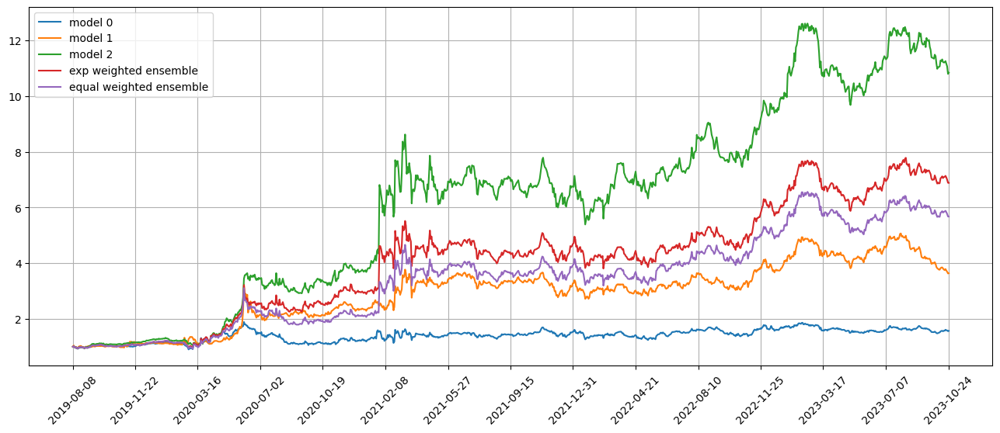

Standardization data are from 2022-03-21 to 2023-01-04
Training data are from 2023-01-05 to 2023-10-20
Testing data are from 2023-09-26 to 2023-11-17
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 54 out of 67 iterations
Restoring model weights from the end of the best epoch: 15.
Epoch 35: early stopping
Restoring model weights from the end of the best epoch: 7.
Epoch 27: early stopping
Restoring model weights from the end of the best epoch: 9.
Epoch 29: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 0.02593301236629486
11/11 [==============================] - 0s 3ms/step
Model 0 test loss 0.030747106298804283
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 0.026155143976211548
11/11 [==============================] - 0s 3ms/step
Model 1 test loss 0.03113466314971447
96/96 [==============================] - 0s 3ms/step
Model 2 training loss 0.0

position on 2023-10-27 market open will be {'TRNO': 0.6888483388095537, 'FXL': 0.6769209536672727, 'FTV': 0.6915524822778499, 'PAR': 0.6566811762128689, 'TT': 0.6768249969376041, 'GPN': 0.6716018750727561, 'REXR': 0.6899266423235844, 'FMC': 0.6921317813391895, 'DPST': 0.7268356555995493, 'IHI': 0.6805811877639819}
Total asset on 2023-10-27 will be 6.85190509000412
It should be the same as 6.8519050900042116
top_stocks by equal weighted ensemble to buy on 2023-10-26 are ['IHI', 'FTV', 'TT', 'GPN', 'DPST', 'TRNO', 'FXL', 'REXR', 'PAR', 'FMC']
position on 2023-10-27 market open will be {'TRNO': 0.5675909143712551, 'FXL': 0.5577630973358466, 'FTV': 0.569819049618578, 'PAR': 0.5410861117865038, 'TT': 0.5576840317928756, 'GPN': 0.5533803319098725, 'REXR': 0.56847940497654, 'FMC': 0.5702963751275403, 'DPST': 0.5988913540422075, 'IHI': 0.5607790233397538}
Total asset on 2023-10-27 will be 5.645769694300866
It should be the same as 5.645769694300974
Testing data from 2023-09-29 to 2023-10-26 ha

top_stocks by model 0 to buy on 2023-11-01 are ['FBT', 'BCPC', 'SSNC', 'CNNE', 'ERIE', 'PAR', 'LPLA', 'SNY', 'KNSL', 'HUBG']
position on 2023-11-02 market open will be {'SNY': 0.16184745686801696, 'PAR': 0.16219639060518373, 'BCPC': 0.16000149677849348, 'HUBG': 0.1563946911531342, 'ERIE': 0.15686723305915612, 'CNNE': 0.16282049546677485, 'KNSL': 0.16561644948312595, 'LPLA': 0.15228359269085864, 'SSNC': 0.1553055646002153, 'FBT': 0.15963347938181432}
Total asset on 2023-11-02 will be 1.592966850086731
It should be the same as 1.5929668500867737
top_stocks by model 1 to buy on 2023-11-01 are ['FBT', 'AMRC', 'ELF', 'SNY', 'LPLA', 'ERIE', 'PAR', 'BCPC', 'HUBG', 'KNSL']
position on 2023-11-02 market open will be {'AMRC': 0.36752803830296454, 'SNY': 0.37316123010337654, 'PAR': 0.3739657440889865, 'BCPC': 0.36890511912666807, 'HUBG': 0.3605891403034702, 'ERIE': 0.3616786496620901, 'KNSL': 0.3818511529957179, 'LPLA': 0.3511104460505857, 'ELF': 0.4181206579573474, 'FBT': 0.3680566051796357}
Tot

position on 2023-11-07 market open will be {'HTHT': 0.158496593522649, 'DPZ': 0.16853135237565453, 'IEP': 0.16722833391742348, 'CLH': 0.1635707516566196, 'CCK': 0.1638657398052287, 'YUMC': 0.16235014820352192, 'CDW': 0.16743444632343887, 'WEN': 0.16465659249983944, 'BALL': 0.163300707767494, 'BCS': 0.16299230583761018}
Total asset on 2023-11-07 will be 1.6424269719094362
It should be the same as 1.6424269719094797
top_stocks by model 1 to buy on 2023-11-06 are ['WEN', 'AMN', 'BALL', 'CDW', 'AAOI', 'CCK', 'DPZ', 'ELF', 'CLH', 'YUMC']
position on 2023-11-07 market open will be {'AAOI': 0.40556779905575696, 'DPZ': 0.4014752654911871, 'CLH': 0.3896581260533503, 'CCK': 0.390360846607183, 'YUMC': 0.3867504053919772, 'CDW': 0.39886221668854915, 'BALL': 0.3890148276963816, 'WEN': 0.39224481532313765, 'AMN': 0.38182047553776904, 'ELF': 0.41150814986548667}
Total asset on 2023-11-07 will be 3.9472629277107423
It should be the same as 3.9472629277107787
top_stocks by model 2 to buy on 2023-11-06 

top_stocks by model 0 to buy on 2023-11-09 are ['HRL', 'FND', 'SXT', 'FIBK', 'ERY', 'CATY', 'AMN', 'FHN', 'INFY', 'RDFN']
position on 2023-11-10 market open will be {'SXT': 0.16456667830752256, 'HRL': 0.1666215318893945, 'FHN': 0.16396658613716592, 'FND': 0.16166888642009586, 'CATY': 0.16560732228002978, 'INFY': 0.16490749478475897, 'RDFN': 0.14742860534545885, 'AMN': 0.16544262870023754, 'ERY': 0.16637310487426324, 'FIBK': 0.16298199544098826}
Total asset on 2023-11-10 will be 1.6295648341798725
It should be the same as 1.6295648341799154
top_stocks by model 1 to buy on 2023-11-09 are ['THS', 'ERY', 'FMC', 'AME', 'FAZ', 'AMN', 'SRNE', 'RDFN', 'INFY', 'DPST']
position on 2023-11-10 market open will be {'DPST': 0.36211801873960703, 'SRNE': 0.39954885758027187, 'AME': 0.3993610074378701, 'FMC': 0.37608577630824314, 'FAZ': 0.40481995047597336, 'INFY': 0.3961669134944996, 'RDFN': 0.35417635576080037, 'AMN': 0.39745249697800406, 'THS': 0.40411571802275703, 'ERY': 0.3996878342768034}
Total a

top_stocks by model 0 to buy on 2023-11-14 are ['AX', 'SFBS', 'BDX', 'GLOB', 'RLJ', 'MS', 'ELS', 'NTCT', 'PDI', 'IVW']
position on 2023-11-15 market open will be {'GLOB': 0.17029984211497265, 'MS': 0.16921389976731652, 'SFBS': 0.1704823626647393, 'RLJ': 0.1654632065858392, 'ELS': 0.1688470981922513, 'PDI': 0.16533571884216272, 'NTCT': 0.1701429308178515, 'AX': 0.1828457941757575, 'IVW': 0.16622675220962868, 'BDX': 0.16276162834299546}
Total asset on 2023-11-15 will be 1.6916192337134717
It should be the same as 1.691619233713515
top_stocks by model 1 to buy on 2023-11-14 are ['G', 'SMCI', 'INFY', 'DPST', 'PDI', 'AAOI', 'ELF', 'GNW', 'NTCT', 'IVW']
position on 2023-11-15 market open will be {'DPST': 0.44293438336082835, 'AAOI': 0.5375097523182536, 'SMCI': 0.43907183781023706, 'PDI': 0.40307255481334814, 'NTCT': 0.41479207450418987, 'G': 0.4157592391015961, 'GNW': 0.41242348578339755, 'INFY': 0.40789176981625264, 'ELF': 0.425723692596091, 'IVW': 0.4052448083249521}
Total asset on 2023-11

position on 2023-11-20 market open will be {'CSIQ': 0.16474038908528563, 'TAN': 0.16886020035196844, 'SEDG': 0.17108932500916815, 'HTGC': 0.16865415993860716, 'VYX': 0.17376254947914566, 'FFIV': 0.16832186015635153, 'MLCO': 0.17167836766905703, 'EBAY': 0.16544776781200915, 'RF': 0.1682989977519588, 'HZO': 0.1674192184057742}
Total asset on 2023-11-20 will be 1.6882728356592824
It should be the same as 1.688272835659326
top_stocks by model 1 to buy on 2023-11-17 are ['TAN', 'KPTI', 'BLNK', 'EBAY', 'SRNE', 'MLCO', 'HZO', 'SMCI', 'CSIQ', 'SEDG']
position on 2023-11-20 market open will be {'CSIQ': 0.4362346901005259, 'TAN': 0.44714400384667485, 'SEDG': 0.45304675489290147, 'SRNE': 0.4434733364087301, 'MLCO': 0.4546065475073259, 'KPTI': 0.488764248209181, 'HZO': 0.44332826493632743, 'SMCI': 0.4496975176505491, 'BLNK': 0.4330880764798582, 'EBAY': 0.43810783815698817}
Total asset on 2023-11-20 will be 4.487491278189022
It should be the same as 4.4874912781890615
top_stocks by model 2 to buy o

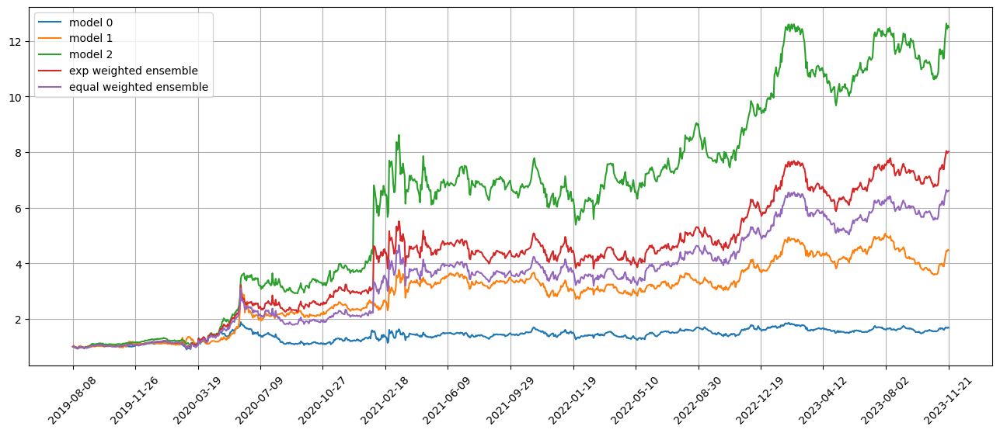

Standardization data are from 2022-04-19 to 2023-02-02
Training data are from 2023-02-03 to 2023-11-17
Testing data are from 2023-10-24 to 2023-12-18
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 55 out of 67 iterations
Restoring model weights from the end of the best epoch: 21.
Epoch 41: early stopping
Restoring model weights from the end of the best epoch: 21.
Epoch 41: early stopping
Restoring model weights from the end of the best epoch: 41.
Epoch 61: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 0.026327958330512047
11/11 [==============================] - 0s 3ms/step
Model 0 test loss 0.024666626006364822
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 0.026130186393857002
11/11 [==============================] - 0s 3ms/step
Model 1 test loss 0.02451806142926216
96/96 [==============================] - 0s 3ms/step
Model 2 training loss 

position on 2023-11-27 market open will be {'HUBG': 0.6589289863522323, 'VSAT': 0.6692477368963318, 'HAS': 0.6611606088114924, 'MAT': 0.6654255598369383, 'MXL': 0.6626799213498872, 'VFC': 0.6529758969349225, 'RLI': 0.661786726580804, 'VUZI': 0.6414787227167478, 'FMC': 0.6494523251819027, 'EBAY': 0.6544953475234071}
Total asset on 2023-11-27 will be 6.57763183218456
It should be the same as 6.577631832184667
Testing data from 2023-10-27 to 2023-11-24 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2023-11-27 are ['ONB', 'HUBG', 'VRNT', 'ASH', 'WHR', 'DRH', 'WCN', 'AEO', 'XENE', 'FTSL']
position on 2023-11-28 market open will be {'HUBG': 0.16772343066951043, 'FTSL': 0.1680945678881089, 'WCN': 0.16737319256701874, 'ONB': 0.167180884689653, 'DRH': 0.16848112670632423, 'AEO': 0.1740499257387011, 'XENE': 0.19924861963325505, 'ASH': 0.16721271342052477, 'VRNT': 0.17125594876655872, 'WHR': 0.16736248828651804}
Total asset on 2023-11-28 will be 1.7179828983661294
It should be

top_stocks by model 0 to buy on 2023-11-30 are ['RRC', 'VFC', 'YUMC', 'AGCO', 'SLB', 'UUUU', 'FTI', 'EL', 'MTZ', 'J']
position on 2023-12-01 market open will be {'EL': 0.17383060590275187, 'VFC': 0.1718005299964249, 'RRC': 0.1731962890857432, 'UUUU': 0.18079479400844428, 'MTZ': 0.1761780302805727, 'YUMC': 0.17408696692394146, 'FTI': 0.17419600700580307, 'J': 0.17419039136858244, 'SLB': 0.17153747832595195, 'AGCO': 0.17347190541526042}
Total asset on 2023-12-01 will be 1.7432829983134324
It should be the same as 1.7432829983134766
top_stocks by model 1 to buy on 2023-11-30 are ['RLI', 'VFC', 'SLB', 'UUUU', 'GEO', 'EL', 'J', 'SBRA', 'YUMC', 'MTZ']
position on 2023-12-01 market open will be {'EL': 0.4522592379548831, 'VFC': 0.4469775409969859, 'GEO': 0.43762055991299176, 'UUUU': 0.47037813243435667, 'RLI': 0.45792639414498565, 'SBRA': 0.4558307011900304, 'YUMC': 0.4529262185448801, 'MTZ': 0.45836658800843977, 'SLB': 0.44629315318499485, 'J': 0.4531953003919824}
Total asset on 2023-12-01 w

position on 2023-12-06 market open will be {'DUST': 0.17776390924473429, 'ALK': 0.18879753409508382, 'MNKD': 0.17939853744074769, 'YUMC': 0.17914363104170913, 'JDST': 0.17894193114387638, 'NSP': 0.177644486127428, 'BOX': 0.16336231743843316, 'SRTY': 0.18047471299366047, 'TZA': 0.18071939347452287, 'LABD': 0.1736461730068894}
Total asset on 2023-12-06 will be 1.7798926260070407
It should be the same as 1.7798926260070849
top_stocks by model 1 to buy on 2023-12-05 are ['ALK', 'SIGI', 'EVTC', 'SCCO', 'SRTY', 'COPX', 'TSN', 'LABD', 'JDST', 'AAOI']
position on 2023-12-06 market open will be {'EVTC': 0.48157671246496675, 'AAOI': 0.4805578492669534, 'ALK': 0.5016277829332672, 'JDST': 0.4754418251474261, 'SCCO': 0.4738755719370085, 'SRTY': 0.47951436753900367, 'TSN': 0.4797683861875287, 'COPX': 0.47945183474302683, 'LABD': 0.4613711995646274, 'SIGI': 0.4761166328243632}
Total asset on 2023-12-06 will be 4.789302162608128
It should be the same as 4.7893021626081715
top_stocks by model 2 to buy 

position on 2023-12-11 market open will be {'CLB': 0.17959927488000316, 'EG': 0.17888341336083988, 'MODG': 0.17990151890720837, 'AIZ': 0.17804074248100374, 'AXS': 0.17839752928225844, 'RNR': 0.17821349338519304, 'RLI': 0.178625869513181, 'LPLA': 0.18386591389623544, 'ACGL': 0.17925543573065852, 'KOLD': 0.21147297373506607}
Total asset on 2023-12-11 will be 1.826256165171603
It should be the same as 1.826256165171648
top_stocks by model 1 to buy on 2023-12-08 are ['NYCB', 'MRCY', 'AAOI', 'LPLA', 'EG', 'MODG', 'ALT', 'AXS', 'ACGL', 'RNR']
position on 2023-12-11 market open will be {'NYCB': 0.47055179688733817, 'AAOI': 0.5273904151959479, 'EG': 0.47784742608246916, 'MODG': 0.48056706959592965, 'RNR': 0.4760578832174841, 'AXS': 0.4765494943627952, 'LPLA': 0.49115707291646965, 'MRCY': 0.47570946599778013, 'ACGL': 0.47884120146120895, 'ALT': 0.49023764357614596}
Total asset on 2023-12-11 will be 4.8449094692935235
It should be the same as 4.844909469293568
top_stocks by model 2 to buy on 202

top_stocks by model 1 to buy on 2023-12-13 are ['ARW', 'PAAS', 'KMI', 'WY', 'FNDE', 'SIL', 'AEM', 'WPM', 'NUGT', 'ALT']
position on 2023-12-14 market open will be {'FNDE': 0.49084552034669454, 'KMI': 0.49169029982121837, 'NUGT': 0.5589941161796194, 'WY': 0.5090908582410288, 'WPM': 0.5101131879313636, 'PAAS': 0.5338386260787714, 'ARW': 0.4882914735800997, 'SIL': 0.517212855057653, 'AEM': 0.5175217287456932, 'ALT': 0.5273626404338415}
Total asset on 2023-12-14 will be 5.14496130641594
It should be the same as 5.144961306415984
top_stocks by model 2 to buy on 2023-12-13 are ['FNV', 'RGLD', 'MRCY', 'OXY', 'ARW', 'TV', 'WPM', 'WY', 'CDW', 'ALT']
position on 2023-12-14 market open will be {'TV': 1.4553459696296003, 'RGLD': 1.4755370726012307, 'WPM': 1.4736623965091036, 'WY': 1.4707089954657182, 'MRCY': 1.412729318527831, 'CDW': 1.402018313524152, 'FNV': 1.4855356515785019, 'ARW': 1.4106217995834904, 'OXY': 1.466225203279888, 'ALT': 1.5234942183766296}
Total asset on 2023-12-14 will be 14.575

top_stocks by model 1 to buy on 2023-12-18 are ['NAIL', 'EBAY', 'UHAL', 'SAH', 'MAN', 'CMP', 'LAD', 'ECPG', 'AAOI', 'TGNA']
position on 2023-12-19 market open will be {'AAOI': 0.5360114251617443, 'SAH': 0.5215576713008124, 'NAIL': 0.5228254478228054, 'MAN': 0.5233943569107564, 'TGNA': 0.5276242485416551, 'ECPG': 0.5318492734361391, 'CMP': 0.5351099264774585, 'UHAL': 0.5397457489633357, 'EBAY': 0.5402070174162972, 'LAD': 0.5290548943392924}
Total asset on 2023-12-19 will be 5.307380010370252
It should be the same as 5.307380010370297
top_stocks by model 2 to buy on 2023-12-18 are ['ASR', 'PII', 'TCBI', 'SAH', 'CAKE', 'EBAY', 'PFSI', 'VC', 'SBGI', 'FIX']
position on 2023-12-19 market open will be {'SAH': 1.4577659602448658, 'ASR': 1.5001297283757933, 'VC': 1.476323258610593, 'PFSI': 1.455141776771872, 'FIX': 1.4770758384057903, 'PII': 1.4654562298754457, 'SBGI': 1.4844831708746098, 'TCBI': 1.463564777979492, 'CAKE': 1.4879848104292006, 'EBAY': 1.5098913213390153}
Total asset on 2023-12-1

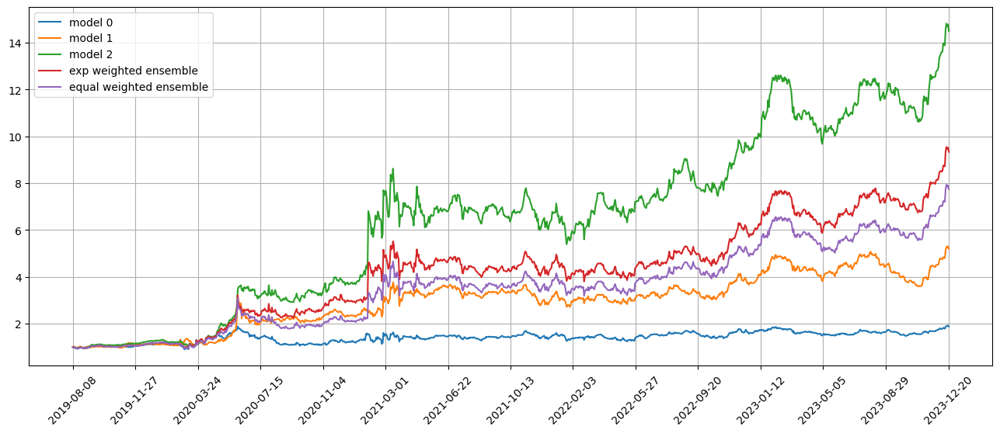

Standardization data are from 2022-05-17 to 2023-03-03
Training data are from 2023-03-06 to 2023-12-18
Testing data are from 2023-11-21 to 2024-01-18
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 56 out of 67 iterations
Restoring model weights from the end of the best epoch: 6.
Epoch 26: early stopping
Restoring model weights from the end of the best epoch: 4.
Epoch 24: early stopping
Restoring model weights from the end of the best epoch: 4.
Epoch 24: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 0.025887222960591316
11/11 [==============================] - 0s 2ms/step
Model 0 test loss 0.02198958955705166
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 0.026046380400657654
11/11 [==============================] - 0s 2ms/step
Model 1 test loss 0.022221405059099197
96/96 [==============================] - 0s 3ms/step
Model 2 training loss 0.0

Testing data from 2023-11-27 to 2023-12-22 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2023-12-26 are ['VC', 'WTM', 'UAL', 'WHR', 'FDX', 'VSH', 'JDST', 'DUST', 'SONY', 'HAS']
position on 2023-12-27 market open will be {'DUST': 0.18612451437626157, 'SONY': 0.1910787781153112, 'HAS': 0.18990337591121362, 'VC': 0.1887814248407273, 'UAL': 0.1867344112087745, 'JDST': 0.188974211750828, 'WTM': 0.18782918406801136, 'VSH': 0.18762709831986246, 'FDX': 0.19031994966685578, 'WHR': 0.19241616609075132}
Total asset on 2023-12-27 will be 1.8897891143485528
It should be the same as 1.889789114348597
top_stocks by model 1 to buy on 2023-12-26 are ['CSGS', 'F', 'AXL', 'AAXJ', 'UAL', 'ARW', 'SCO', 'SONY', 'LEA', 'UUP']
position on 2023-12-27 market open will be {'SONY': 0.5312024074351458, 'UUP': 0.5217717577523067, 'AAXJ': 0.5282190350337526, 'F': 0.5250049348624488, 'UAL': 0.5191249900353903, 'LEA': 0.5216633593942502, 'ARW': 0.5266115628860932, 'AXL': 0.5250754735449695, 'SCO':

Testing data from 2023-11-30 to 2023-12-28 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2023-12-29 are ['MUR', 'CLB', 'INSW', 'ODFL', 'XOM', 'FSLR', 'CVX', 'DHT', 'MAN', 'SRNE']
position on 2024-01-02 market open will be {'FSLR': 0.1831976760274111, 'MAN': 0.18477155132243506, 'SRNE': 0.18584417558715344, 'ODFL': 0.18281174146910664, 'CVX': 0.18579463536619198, 'MUR': 0.18524119113359364, 'INSW': 0.19176018438853173, 'XOM': 0.18686254206168554, 'CLB': 0.18377923242574878, 'DHT': 0.1881013901158946}
Total asset on 2024-01-02 will be 1.8581643198977082
It should be the same as 1.8581643198977527
top_stocks by model 1 to buy on 2023-12-29 are ['CAR', 'WSFS', 'WU', 'TTC', 'FSLR', 'CBRL', 'COPX', 'CVX', 'MAN', 'CSGS']
position on 2024-01-02 market open will be {'WSFS': 0.5101428276475372, 'CBRL': 0.5096257398185692, 'FSLR': 0.5172714674423268, 'MAN': 0.521715414554988, 'TTC': 0.5143954737232229, 'CAR': 0.5242110302505978, 'CVX': 0.5246041639982495, 'WU': 0.520345502516

position on 2024-01-05 market open will be {'CLB': 0.18120577331587798, 'AAOI': 0.19274286268101953, 'UNF': 0.17981640355418144, 'DBI': 0.18023998290194182, 'FAZ': 0.1822883156978576, 'SCCO': 0.18328148105595235, 'TPL': 0.17855367729132668, 'CEIX': 0.1841076826565296, 'BBY': 0.18358145144167348, 'ENLC': 0.17800161304376078}
Total asset on 2024-01-05 will be 1.8238192436400766
It should be the same as 1.8238192436401213
top_stocks by model 1 to buy on 2024-01-04 are ['BKLN', 'SCCO', 'IRBT', 'INFY', 'HUN', 'UHAL', 'WWW', 'BBY', 'SCO', 'DBI']
position on 2024-01-05 market open will be {'HUN': 0.5082803134155519, 'WWW': 0.5128076999994774, 'DBI': 0.5057725507969542, 'SCCO': 0.5143073179159404, 'INFY': 0.5155349933392018, 'SCO': 0.5079746427748095, 'IRBT': 0.5083967972652406, 'UHAL': 0.5089652135582827, 'BBY': 0.5151490667039009, 'BKLN': 0.514122590251806}
Total asset on 2024-01-05 will be 5.1113111860211164
It should be the same as 5.111311186021166
top_stocks by model 2 to buy on 2024-01-

top_stocks by model 0 to buy on 2024-01-09 are ['MMS', 'CSGP', 'PARR', 'SEE', 'FLR', 'WK', 'FORM', 'EXTR', 'VC', 'FIX']
position on 2024-01-10 market open will be {'PARR': 0.18183253174421035, 'FLR': 0.18139325326132097, 'MMS': 0.18188207614572716, 'VC': 0.1811253414221222, 'CSGP': 0.18399023184045324, 'WK': 0.18330927111860876, 'EXTR': 0.18690622869353574, 'FIX': 0.18338749104945193, 'FORM': 0.18459348058727335, 'SEE': 0.1795022783624437}
Total asset on 2024-01-10 will be 1.8279221842251028
It should be the same as 1.8279221842251476
top_stocks by model 1 to buy on 2024-01-09 are ['ABM', 'BOOT', 'GNL', 'FLR', 'MMS', 'AVNS', 'MODG', 'ALK', 'FIX', 'SEE']
position on 2024-01-10 market open will be {'BOOT': 0.47845414907281353, 'FLR': 0.5058772599759553, 'ALK': 0.49027871437928083, 'MMS': 0.5072405101351039, 'MODG': 0.5154291591133408, 'ABM': 0.5063179089249307, 'FIX': 0.5114388755810674, 'AVNS': 0.5162652870621214, 'SEE': 0.500603628331292, 'GNL': 0.5095607050509322}
Total asset on 2024-

top_stocks by model 0 to buy on 2024-01-12 are ['AIT', 'VRSN', 'DHT', 'RILY', 'OII', 'BKR', 'CLB', 'MUR', 'SBRA', 'CEIX']
position on 2024-01-16 market open will be {'OII': 0.18259935821053264, 'MUR': 0.1801365202742124, 'RILY': 0.18000816246826348, 'VRSN': 0.18397089159888108, 'BKR': 0.18334227385938984, 'SBRA': 0.18669145739086945, 'CLB': 0.18133686522791997, 'AIT': 0.1835062383156984, 'DHT': 0.18786705834385548, 'CEIX': 0.18477679678556538}
Total asset on 2024-01-16 will be 1.834235622475144
It should be the same as 1.8342356224751881
top_stocks by model 1 to buy on 2024-01-12 are ['NG', 'PAAS', 'PBI', 'GOGO', 'ABG', 'AG', 'ECH', 'MAN', 'WES', 'EXTR']
position on 2024-01-16 market open will be {'ECH': 0.49628918556772317, 'NG': 0.5034398837626963, 'MAN': 0.4961768021989082, 'GOGO': 0.4901346664029416, 'WES': 0.5048979947591762, 'EXTR': 0.49299570804046156, 'PAAS': 0.503890890958379, 'PBI': 0.4854806400326888, 'ABG': 0.47448717493569564, 'AG': 0.48932797629914876}
Total asset on 2024

top_stocks by model 0 to buy on 2024-01-18 are ['HLX', 'EGHT', 'MWA', 'KOS', 'ZTO', 'HBI', 'MAT', 'HAS', 'BIL', 'TTD']
position on 2024-01-19 market open will be {'HLX': 0.18580523537149227, 'HAS': 0.18326862500262436, 'MAT': 0.18448827647856297, 'KOS': 0.18495552132809473, 'TTD': 0.18178274887959575, 'EGHT': 0.18238662118398027, 'HBI': 0.18476611453023734, 'ZTO': 0.17920427827637658, 'MWA': 0.1869286687736954, 'BIL': 0.18296298252242685}
Total asset on 2024-01-19 will be 1.8365490723470417
It should be the same as 1.8365490723470863
top_stocks by model 1 to buy on 2024-01-18 are ['SIRI', 'SAVE', 'MODG', 'BKLN', 'MWA', 'TTD', 'IHF', 'ETSY', 'BIL', 'HAS']
position on 2024-01-19 market open will be {'IHF': 0.5014747610486623, 'SAVE': 0.6099657967141452, 'HAS': 0.4943494024444029, 'SIRI': 0.5038549105583516, 'MODG': 0.5043335351845536, 'ETSY': 0.5070578488438038, 'TTD': 0.4903413952172243, 'MWA': 0.5042220167619021, 'BIL': 0.49352496139539564, 'BKLN': 0.49341725239038164}
Total asset on 2

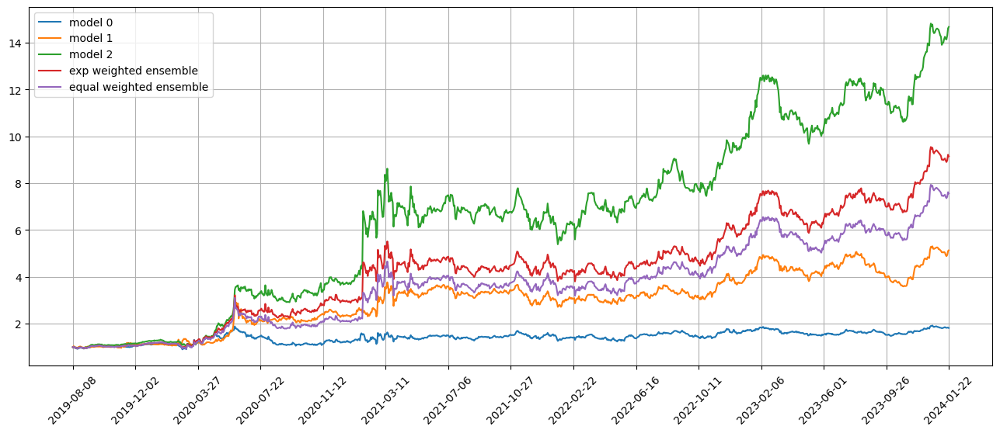

Standardization data are from 2022-06-15 to 2023-03-31
Training data are from 2023-04-03 to 2024-01-18
Testing data are from 2023-12-20 to 2024-02-15
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 57 out of 67 iterations
Restoring model weights from the end of the best epoch: 9.
Epoch 29: early stopping
Restoring model weights from the end of the best epoch: 10.
Epoch 30: early stopping
Restoring model weights from the end of the best epoch: 24.
Epoch 44: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 0.02599228173494339
11/11 [==============================] - 0s 3ms/step
Model 0 test loss 0.026464512571692467
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 0.025808420032262802
11/11 [==============================] - 0s 3ms/step
Model 1 test loss 0.026190083473920822
96/96 [==============================] - 0s 3ms/step
Model 2 training loss 0

top_stocks by model 0 to buy on 2024-01-25 are ['NFG', 'IMO', 'NTCT', 'BMI', 'JBL', 'PI', 'ECH', 'EQNR', 'KNDI', 'AEHR']
position on 2024-01-26 market open will be {'AEHR': 0.17671824050864776, 'KNDI': 0.17761041143746736, 'EQNR': 0.1898901789719186, 'BMI': 0.1873894798127452, 'NTCT': 0.17994426096560767, 'IMO': 0.19111037102124495, 'NFG': 0.18921377887965043, 'PI': 0.18090366481940695, 'ECH': 0.18462276906094088, 'JBL': 0.18828580884836438}
Total asset on 2024-01-26 will be 1.8456889643259498
It should be the same as 1.8456889643259942
top_stocks by model 1 to buy on 2024-01-25 are ['GOOS', 'SDS', 'PZA', 'CLB', 'MLCO', 'PI', 'EQNR', 'KNDI', 'AEHR', 'ECH']
position on 2024-01-26 market open will be {'AEHR': 0.4998599807868426, 'KNDI': 0.4997023185087219, 'EQNR': 0.5224962386713577, 'SDS': 0.5179712996093699, 'ECH': 0.5080025882839246, 'PI': 0.49776921029698024, 'MLCO': 0.5024224618089216, 'CLB': 0.5212217944201419, 'PZA': 0.5193136405216618, 'GOOS': 0.5204057730186423}
Total asset on 2

position on 2024-01-31 market open will be {'FRO': 0.1844870396779843, 'EG': 0.18316794801380007, 'AR': 0.18547765906890176, 'RRC': 0.1848225562590866, 'FANG': 0.18421144578295776, 'WTW': 0.1829451952461205, 'CNQ': 0.18485494656942392, 'NAT': 0.18110964500586524, 'ACGL': 0.18380820336215234, 'DHT': 0.1844944875565992}
Total asset on 2024-01-31 will be 1.8393791265428463
It should be the same as 1.839379126542892
top_stocks by model 1 to buy on 2024-01-30 are ['LMT', 'TDS', 'FRO', 'SBUX', 'TKO', 'NAT', 'SAN', 'NOC', 'ACGL', 'DHT']
position on 2024-01-31 market open will be {'FRO': 0.5133476698072661, 'NOC': 0.505508442480433, 'SAN': 0.5155687153339382, 'SBUX': 0.5313535879811162, 'TDS': 0.5081054295834593, 'LMT': 0.5040662910124358, 'NAT': 0.5039498406265386, 'DHT': 0.5133683940334157, 'ACGL': 0.5114587618302009, 'TKO': 0.520136863003332}
Total asset on 2024-01-31 will be 5.126863995692081
It should be the same as 5.126863995692136
top_stocks by model 2 to buy on 2024-01-30 are ['SDOW',

position on 2024-02-05 market open will be {'KOS': 0.16537003814079035, 'ESNT': 0.17816479747556185, 'DXD': 0.17800849826458576, 'CNX': 0.17705413994349267, 'MAN': 0.17939791204029804, 'LSCC': 0.18361243939283184, 'NTCT': 0.17557819580682332, 'SLAB': 0.18212488751809505, 'FORM': 0.18209219985934544, 'SNDR': 0.17971795210589922}
Total asset on 2024-02-05 will be 1.7811210605476773
It should be the same as 1.7811210605477235
top_stocks by model 1 to buy on 2024-02-02 are ['ESNT', 'PRTA', 'NGVT', 'VIPS', 'APTV', 'DXD', 'LSCC', 'SNDR', 'DOG', 'MAN']
position on 2024-02-05 market open will be {'ESNT': 0.5061070083146636, 'DXD': 0.5056630141744637, 'MAN': 0.5096098771872504, 'NGVT': 0.50442045045938, 'DOG': 0.5080448231294089, 'LSCC': 0.5215819494488528, 'VIPS': 0.50211349642212, 'APTV': 0.510057210578735, 'PRTA': 0.4790257035505388, 'SNDR': 0.510519004705353}
Total asset on 2024-02-05 will be 5.05714253797071
It should be the same as 5.0571425379707655
top_stocks by model 2 to buy on 2024-0

position on 2024-02-08 market open will be {'FAZ': 0.49559372342386787, 'ACMR': 0.5078929409995427, 'SMPL': 0.49188779190637344, 'CLDX': 0.5133373329476225, 'PRTA': 0.5131087899553541, 'EXTR': 0.5041775011960259, 'LMBS': 0.5083123455634885, 'EXPO': 0.49510147612044203, 'IRBT': 0.5013688968215104, 'GOGL': 0.5106813460548408}
Total asset on 2024-02-08 will be 5.041462144989012
It should be the same as 5.041462144989069
top_stocks by model 2 to buy on 2024-02-07 are ['APLS', 'QTEC', 'GVI', 'LMBS', 'KOS', 'EXPO', 'CVBF', 'NYCB', 'FAZ', 'EXTR']
position on 2024-02-08 market open will be {'NYCB': 1.4709605242027979, 'QTEC': 1.4660781972378636, 'CVBF': 1.4581500376781287, 'KOS': 1.4512831190769613, 'EXTR': 1.4432270256515827, 'LMBS': 1.455063172889071, 'GVI': 1.451622735207836, 'EXPO': 1.4172465631289577, 'FAZ': 1.460868593341752, 'APLS': 1.4439118010536316}
Total asset on 2024-02-08 will be 14.518411769468443
It should be the same as 14.518411769468583
top_stocks by return weighted ensemble 

top_stocks by model 2 to buy on 2024-02-12 are ['PAGP', 'GLNG', 'EPD', 'SBUX', 'RIG', 'IBKR', 'KOS', 'RRC', 'NAT', 'BTU']
position on 2024-02-13 market open will be {'NAT': 1.4832512568149827, 'PAGP': 1.435917477576549, 'BTU': 1.4035236824247068, 'RIG': 1.4530075293168738, 'KOS': 1.4799611513989002, 'SBUX': 1.3949920468399435, 'RRC': 1.4350744631896322, 'EPD': 1.4335445178562323, 'IBKR': 1.4200785213331177, 'GLNG': 1.4300815114284722}
Total asset on 2024-02-13 will be 14.369432158179263
It should be the same as 14.36943215817941
top_stocks by return weighted ensemble to buy on 2024-02-12 are ['FTI', 'CNX', 'HAE', 'KOS', 'SBUX', 'EPD', 'IBKR', 'RRC', 'NAT', 'BTU']
position on 2024-02-13 market open will be {'NAT': 0.9045275253893253, 'BTU': 0.8780050696753365, 'HAE': 0.879454951927142, 'CNX': 0.8953267891275387, 'KOS': 0.9258222074357414, 'SBUX': 0.8726679176273542, 'RRC': 0.8977423536347795, 'FTI': 0.8866095647973443, 'EPD': 0.8967852627243286, 'IBKR': 0.8883613128020164}
Total asset o

position on 2024-02-16 market open will be {'AGI': 1.4651235544692158, 'IBN': 1.4546093560629951, 'GVI': 1.4411167563890295, 'NUGT': 1.4792789817548038, 'CAR': 1.4278177315654696, 'CLH': 1.4669099872505997, 'SBUX': 1.4358720724553515, 'OC': 1.439771814891173, 'YUMC': 1.4955682890236766, 'SILJ': 1.4537353961147292}
Total asset on 2024-02-16 will be 14.559803939976893
It should be the same as 14.559803939977044
top_stocks by return weighted ensemble to buy on 2024-02-15 are ['GVI', 'SILJ', 'IBN', 'NUGT', 'YUMC', 'CAR', 'CLH', 'EG', 'AGI', 'SBUX']
position on 2024-02-16 market open will be {'IBN': 0.9001556740998321, 'AGI': 0.9066621738102334, 'EG': 0.9171284120579707, 'YUMC': 0.9255574040720875, 'GVI': 0.8918060508114529, 'NUGT': 0.9171602913700817, 'CAR': 0.8852540615107694, 'CLH': 0.9094914535488525, 'SBUX': 0.890247792732851, 'SILJ': 0.90132314182815}
Total asset on 2024-02-16 will be 9.04478645584217
It should be the same as 9.044786455842281
top_stocks by equal weighted ensemble to 

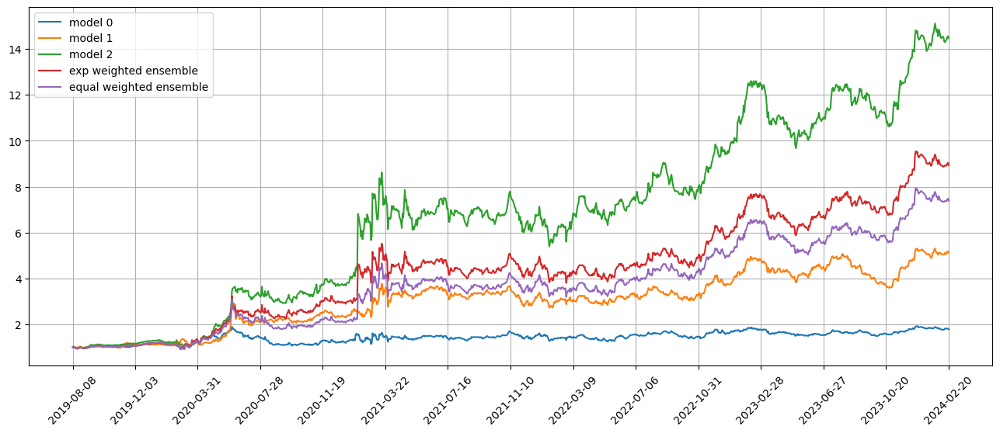

Standardization data are from 2022-07-15 to 2023-05-01
Training data are from 2023-05-02 to 2024-02-15
Testing data are from 2024-01-22 to 2024-03-15
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 58 out of 67 iterations
Restoring model weights from the end of the best epoch: 12.
Epoch 32: early stopping
Restoring model weights from the end of the best epoch: 26.
Epoch 46: early stopping
Restoring model weights from the end of the best epoch: 2.
Epoch 22: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 0.025538941845297813
11/11 [==============================] - 0s 3ms/step
Model 0 test loss 0.02497297152876854
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 0.026189003139734268
11/11 [==============================] - 0s 3ms/step
Model 1 test loss 0.025679143145680428
96/96 [==============================] - 0s 3ms/step
Model 2 training loss 0

position on 2024-02-23 market open will be {'AGI': 0.714056727900153, 'DBC': 0.7420235699307216, 'BTU': 0.748712913899231, 'EG': 0.7583063460623852, 'ERIE': 0.7426573098078714, 'RIG': 0.7282187320807438, 'SBUX': 0.7528562962307482, 'CEIX': 0.7553895513093214, 'KNDI': 0.7366795844954583, 'FUN': 0.7408219823552012}
Total asset on 2024-02-23 will be 7.419723014071701
It should be the same as 7.4197230140718355
Testing data from 2024-01-25 to 2024-02-22 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2024-02-23 are ['BRO', 'TDC', 'EG', 'WRB', 'RIG', 'IEP', 'RNR', 'DXD', 'HCSG', 'SBUX']
position on 2024-02-26 market open will be {'EG': 0.18430266470885392, 'RIG': 0.172318678606946, 'SBUX': 0.18177469994870596, 'IEP': 0.1836473320059451, 'DXD': 0.17974446694830445, 'TDC': 0.17398639284071535, 'RNR': 0.17985196520513833, 'HCSG': 0.18078836530365247, 'WRB': 0.17883625343975665, 'BRO': 0.17878347054935714}
Total asset on 2024-02-26 will be 1.7940342895573276
It should be the 

Testing data from 2024-01-30 to 2024-02-27 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2024-02-28 are ['SMFG', 'DBC', 'RIG', 'BBVA', 'MSCI', 'ERJ', 'SIRI', 'SAN', 'AGI', 'MUFG']
position on 2024-02-29 market open will be {'AGI': 0.18218762280657477, 'DBC': 0.18082078688831651, 'ERJ': 0.18565435273417405, 'SMFG': 0.18513964880095166, 'RIG': 0.1815121597967976, 'SIRI': 0.17524955550925395, 'SAN': 0.18220781692550977, 'BBVA': 0.18029805759088088, 'MUFG': 0.18608495045559645, 'MSCI': 0.1875636468844747}
Total asset on 2024-02-29 will be 1.8267185983924827
It should be the same as 1.8267185983925303
top_stocks by model 1 to buy on 2024-02-28 are ['PBI', 'NVCR', 'BALL', 'AN', 'MUFG', 'CARS', 'SGMO', 'SANM', 'ERJ', 'AGI']
position on 2024-02-29 market open will be {'NVCR': 0.5504123913643718, 'AN': 0.5243767369764353, 'CARS': 0.5274504510747269, 'AGI': 0.5315523575195165, 'ERJ': 0.5225317304679914, 'PBI': 0.5343653753592242, 'MUFG': 0.5237436652769348, 'BALL': 0.5199400

Testing data from 2024-02-02 to 2024-03-01 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2024-03-04 are ['DHT', 'IEX', 'FTV', 'EVR', 'SCO', 'IWY', 'BRO', 'CME', 'VRSK', 'KOLD']
position on 2024-03-05 market open will be {'IWY': 0.1821099987903403, 'FTV': 0.18277838714024047, 'VRSK': 0.1836508508129165, 'IEX': 0.18378311298034486, 'CME': 0.18562831364395566, 'BRO': 0.18523202928475596, 'SCO': 0.19173931345488796, 'EVR': 0.18788914652280658, 'DHT': 0.18595896643655577, 'KOLD': 0.1871630768877636}
Total asset on 2024-03-05 will be 1.8559331959545207
It should be the same as 1.8559331959545677
top_stocks by model 1 to buy on 2024-03-04 are ['RGNX', 'TPR', 'WW', 'JAZZ', 'AAOI', 'CSGS', 'SCO', 'KOLD', 'PBH', 'SRNE']
position on 2024-03-05 market open will be {'PBH': 0.5382162706148067, 'AAOI': 0.49950261065855084, 'TPR': 0.5118755126807392, 'SRNE': 0.5252571631905945, 'RGNX': 0.6883684791508116, 'KOLD': 0.5320072289704647, 'WW': 0.4955551486231934, 'SCO': 0.5450150880828

Testing data from 2024-02-07 to 2024-03-06 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2024-03-07 are ['KOS', 'ECL', 'DRIP', 'BAND', 'BBVA', 'EMR', 'GL', 'TWM', 'RSG', 'ERIE']
position on 2024-03-08 market open will be {'KOS': 0.18777520127451913, 'GL': 0.18798787485649107, 'ECL': 0.18925752505515744, 'RSG': 0.1878302105766621, 'ERIE': 0.19038762039174886, 'BBVA': 0.19353568531172868, 'DRIP': 0.187836372581623, 'EMR': 0.1899435903899139, 'BAND': 0.19898571041220592, 'TWM': 0.18547851884616123}
Total asset on 2024-03-08 will be 1.8990183096961641
It should be the same as 1.8990183096962112
top_stocks by model 1 to buy on 2024-03-07 are ['MRCY', 'DUST', 'ICUI', 'AAOI', 'JBLU', 'KOS', 'OI', 'CRTO', 'GOOS', 'NVCR']
position on 2024-03-08 market open will be {'AAOI': 0.5106855025152577, 'KOS': 0.5496461629171828, 'GOOS': 0.5395066586146959, 'DUST': 0.5347203932633984, 'NVCR': 0.568681688096059, 'ICUI': 0.5550721070050773, 'CRTO': 0.5506066870599332, 'OI': 0.5678429494

Testing data from 2024-02-12 to 2024-03-11 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2024-03-12 are ['VIPS', 'APPN', 'EFX', 'CWEB', 'ASHR', 'FSLR', 'PTCT', 'DBA', 'PKX', 'OXY']
position on 2024-03-13 market open will be {'PTCT': 0.19669370601629088, 'FSLR': 0.18539591113363063, 'ASHR': 0.18810104456511936, 'PKX': 0.18857975172098496, 'DBA': 0.1906844276010871, 'VIPS': 0.19648798764639783, 'EFX': 0.19373294374413372, 'CWEB': 0.19782533307405217, 'APPN': 0.19400282851515058, 'OXY': 0.19058397779140437}
Total asset on 2024-03-13 will be 1.9220879118082044
It should be the same as 1.9220879118082517
top_stocks by model 1 to buy on 2024-03-12 are ['FSLR', 'HDB', 'PSEC', 'ASH', 'NTCT', 'ASHR', 'CMP', 'KRNT', 'PKX', 'AAOI']
position on 2024-03-13 market open will be {'AAOI': 0.5144127060395065, 'FSLR': 0.5289755933341749, 'ASHR': 0.5366939381089874, 'HDB': 0.5405876355374319, 'PKX': 0.5380597956419769, 'NTCT': 0.5446731424973789, 'PSEC': 0.5468433457768755, 'ASH': 0.5

top_stocks by model 1 to buy on 2024-03-15 are ['FIBK', 'CSGS', 'APPN', 'PSEC', 'KRNT', 'FULT', 'ZBRA', 'CVBF', 'SWX', 'GL']
position on 2024-03-18 market open will be {'ZBRA': 0.5353001909542162, 'CVBF': 0.5179287215566613, 'GL': 0.5243389207591742, 'CSGS': 0.5167659519379574, 'FULT': 0.5211236228341886, 'PSEC': 0.518580860587098, 'APPN': 0.5124248250311506, 'KRNT': 0.5172480083387313, 'SWX': 0.5152001540130694, 'FIBK': 0.5228938194341357}
Total asset on 2024-03-18 will be 5.201805075446323
It should be the same as 5.201805075446382
top_stocks by model 2 to buy on 2024-03-15 are ['SSB', 'BKU', 'SNPS', 'ONB', 'VNO', 'CHDN', 'EFX', 'CVBF', 'FULT', 'GL']
position on 2024-03-18 market open will be {'CVBF': 1.4373837657463966, 'BKU': 1.459089629125144, 'GL': 1.469235178044873, 'CHDN': 1.4682559664465535, 'FULT': 1.460225683169986, 'VNO': 1.510268033570382, 'EFX': 1.4571167183711418, 'SNPS': 1.4457667282638424, 'SSB': 1.4435107880530125, 'ONB': 1.462285105911973}
Total asset on 2024-03-18 w

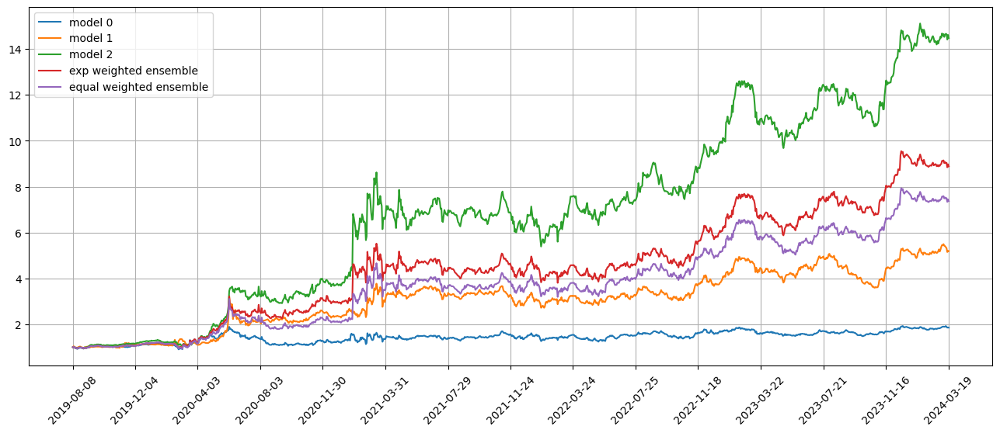

Standardization data are from 2022-08-12 to 2023-05-30
Training data are from 2023-05-31 to 2024-03-15
Testing data are from 2024-02-20 to 2024-04-15
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 59 out of 67 iterations
Restoring model weights from the end of the best epoch: 5.
Epoch 25: early stopping
Restoring model weights from the end of the best epoch: 13.
Epoch 33: early stopping
Restoring model weights from the end of the best epoch: 3.
Epoch 23: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 0.02597743272781372
11/11 [==============================] - 0s 3ms/step
Model 0 test loss 0.028354786336421967
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 0.025890320539474487
11/11 [==============================] - 0s 3ms/step
Model 1 test loss 0.028453458100557327
96/96 [==============================] - 0s 3ms/step
Model 2 training loss 0.

Testing data from 2024-02-23 to 2024-03-21 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2024-03-22 are ['MCY', 'LLY', 'HDB', 'ARKW', 'SAGE', 'RH', 'GWRE', 'PAYC', 'TS', 'WIT']
position on 2024-03-25 market open will be {'LLY': 0.19642927826955373, 'TS': 0.19372929883746462, 'HDB': 0.19222608794173712, 'PAYC': 0.19457615685701565, 'GWRE': 0.19590635674738022, 'SAGE': 0.18577440759342034, 'ARKW': 0.1960290402437179, 'WIT': 0.19175262309707022, 'MCY': 0.19335435350103905, 'RH': 0.18722919379926528}
Total asset on 2024-03-25 will be 1.927006796887617
It should be the same as 1.9270067968876643
top_stocks by model 1 to buy on 2024-03-22 are ['SBSW', 'SSTK', 'PBR', 'RH', 'PSEC', 'TGTX', 'PBR-A', 'SQM', 'YUMC', 'LAAC']
position on 2024-03-25 market open will be {'SSTK': 0.5276790156518844, 'TGTX': 0.5473210263046427, 'YUMC': 0.5402338995836805, 'SQM': 0.5203702855370278, 'PSEC': 0.5395324899760274, 'PBR-A': 0.5478156227392791, 'LAAC': 0.504235980928566, 'SBSW': 0.5314797

Testing data from 2024-02-28 to 2024-03-26 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2024-03-27 are ['EGO', 'BGC', 'CTSH', 'AMAT', 'FTI', 'PAYC', 'EQT', 'YPF', 'ERIE', 'GDDY']
position on 2024-03-28 market open will be {'PAYC': 0.2013042149778357, 'CTSH': 0.19352999348412436, 'GDDY': 0.19262535259985997, 'EQT': 0.20198176175260668, 'AMAT': 0.19257798955321254, 'BGC': 0.19202062072227058, 'EGO': 0.1992407888672149, 'ERIE': 0.1935283544118279, 'FTI': 0.19423779790217996, 'YPF': 0.19341092588501166}
Total asset on 2024-03-28 will be 1.9544578001560966
It should be the same as 1.9544578001561441
top_stocks by model 1 to buy on 2024-03-27 are ['PGRE', 'CBU', 'DEA', 'CALX', 'DRI', 'ADC', 'AG', 'UPS', 'BTG', 'NEM']
position on 2024-03-28 market open will be {'NEM': 0.5539673477539638, 'BTG': 0.544999615044568, 'DRI': 0.5482712327407503, 'DEA': 0.5421660886784244, 'PGRE': 0.5521214437476701, 'ADC': 0.5440320146096381, 'CBU': 0.5523590820452176, 'AG': 0.5740074485105288

Testing data from 2024-03-04 to 2024-04-01 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2024-04-02 are ['CEIX', 'ENSG', 'PK', 'NTAP', 'RMBS', 'CBOE', 'KKR', 'MTSI', 'SAGE', 'GBIL']
position on 2024-04-03 market open will be {'NTAP': 0.19504379294017757, 'RMBS': 0.1850689079459037, 'CEIX': 0.19369132050936147, 'ENSG': 0.18769700935620184, 'KKR': 0.1892422869397454, 'CBOE': 0.19255852754329425, 'GBIL': 0.19107755553461286, 'SAGE': 0.1859578593795347, 'PK': 0.18993561887873367, 'MTSI': 0.19554060721285446}
Total asset on 2024-04-03 will be 1.9058134862403722
It should be the same as 1.9058134862404201
top_stocks by model 1 to buy on 2024-04-02 are ['LXP', 'MTZ', 'CC', 'DNLI', 'M', 'GBIL', 'CARS', 'RIOT', 'INFN', 'RMBS']
position on 2024-04-03 market open will be {'INFN': 0.5805147940567064, 'RIOT': 0.4955064896437466, 'CC': 0.6057559165840823, 'RMBS': 0.53143642075768, 'LXP': 0.5417679989352305, 'MTZ': 0.5474976072417658, 'GBIL': 0.5493852815972768, 'M': 0.5469900957

Testing data from 2024-03-07 to 2024-04-04 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2024-04-05 are ['DELL', 'QTEC', 'IGV', 'CIBR', 'QLD', 'SVXY', 'ARKK', 'TQQQ', 'ARKW', 'TECL']
position on 2024-04-08 market open will be {'DELL': 0.19902074942573053, 'TECL': 0.18620532553621835, 'IGV': 0.19216639272311992, 'TQQQ': 0.18770860120480914, 'ARKW': 0.19471396925409962, 'QTEC': 0.19561576042847706, 'ARKK': 0.19731331678595418, 'QLD': 0.19741222609376335, 'SVXY': 0.1950636722628596, 'CIBR': 0.1955102362716898}
Total asset on 2024-04-08 will be 1.9407302499866732
It should be the same as 1.9407302499867218
top_stocks by model 1 to buy on 2024-04-05 are ['RMBS', 'SVXY', 'CIBR', 'VIPS', 'BBD', 'ARKW', 'IGV', 'SHOP', 'HDB', 'ARKK']
position on 2024-04-08 market open will be {'ARKK': 0.548994509533916, 'ARKW': 0.5588164767165097, 'SHOP': 0.5590676912051581, 'HDB': 0.5399740518161457, 'IGV': 0.56059192665488, 'RMBS': 0.5666352860851747, 'VIPS': 0.5604152181076406, 'SVXY': 0

Testing data from 2024-03-12 to 2024-04-09 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2024-04-10 are ['INTC', 'LIN', 'ATGE', 'EG', 'GDDY', 'NOW', 'LW', 'AL', 'BGC', 'LPG']
position on 2024-04-11 market open will be {'ATGE': 0.18543865222968173, 'LIN': 0.19026187217054413, 'BGC': 0.19422127378822687, 'EG': 0.1887609329407884, 'INTC': 0.1880767173598338, 'AL': 0.1914725726475345, 'NOW': 0.1912897539749822, 'LPG': 0.19350828491341035, 'LW': 0.19231014358718138, 'GDDY': 0.19255691593838814}
Total asset on 2024-04-11 will be 1.9078971195505225
It should be the same as 1.9078971195505718
top_stocks by model 1 to buy on 2024-04-10 are ['BGC', 'QSR', 'FTSL', 'CALX', 'CCS', 'NOW', 'LIN', 'AMCX', 'LW', 'BOX']
position on 2024-04-11 market open will be {'LIN': 0.5452887781375263, 'BGC': 0.5566363868077842, 'AMCX': 0.542062366744334, 'FTSL': 0.5497822104061818, 'NOW': 0.5482346779482327, 'CCS': 0.5414240912218886, 'BOX': 0.5467268488024997, 'LW': 0.5511591052047959, 'CALX':

top_stocks by model 0 to buy on 2024-04-15 are ['TECL', 'ITB', 'MPC', 'EGO', 'MTG', 'PBF', 'KKR', 'IRBT', 'ATGE', 'KOLD']
position on 2024-04-16 market open will be {'ITB': 0.18626914664512503, 'EGO': 0.1781721733332975, 'KKR': 0.18160508193159963, 'TECL': 0.17429747926440464, 'MTG': 0.18332145610406783, 'PBF': 0.18132631013230924, 'MPC': 0.18442573428311837, 'ATGE': 0.18308169110303593, 'IRBT': 0.17723951764453524, 'KOLD': 0.19104403986508164}
Total asset on 2024-04-16 will be 1.8207826303065253
It should be the same as 1.820782630306575
top_stocks by model 1 to buy on 2024-04-15 are ['RIOT', 'PHYS', 'GPRE', 'OUNZ', 'PANW', 'GLD', 'EWH', 'NUGT', 'BTG', 'SILJ']
position on 2024-04-16 market open will be {'RIOT': 0.47631301875307464, 'SILJ': 0.5025231447837166, 'BTG': 0.5002636841325867, 'EWH': 0.5346623312201776, 'NUGT': 0.5191694965342895, 'PHYS': 0.5564272727272809, 'GLD': 0.5548059254127169, 'GPRE': 0.5486302616494326, 'PANW': 0.5322537623322864, 'OUNZ': 0.5549524373689348}
Total as

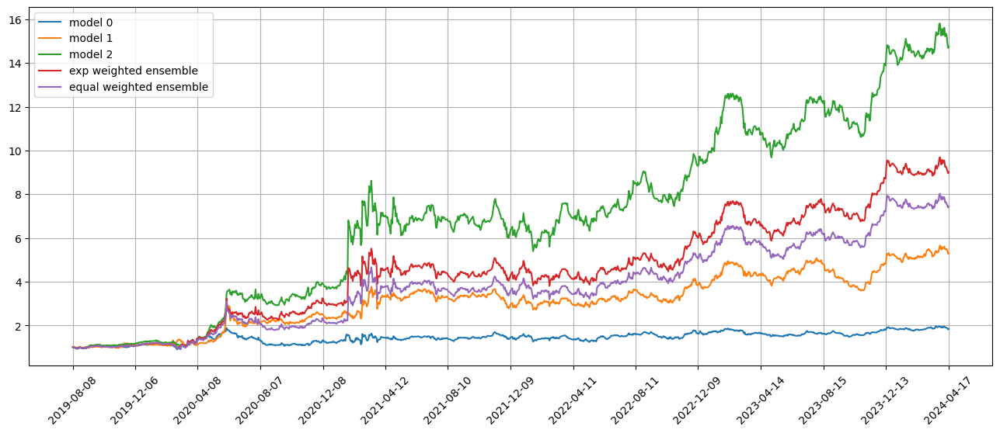

Standardization data are from 2022-09-12 to 2023-06-28
Training data are from 2023-06-29 to 2024-04-15
Testing data are from 2024-03-19 to 2024-05-13
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 60 out of 67 iterations
Restoring model weights from the end of the best epoch: 8.
Epoch 28: early stopping
Restoring model weights from the end of the best epoch: 13.
Epoch 33: early stopping
Restoring model weights from the end of the best epoch: 8.
Epoch 28: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 0.025743504986166954
11/11 [==============================] - 0s 3ms/step
Model 0 test loss 0.02729600854218006
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 0.025147974491119385
11/11 [==============================] - 0s 3ms/step
Model 1 test loss 0.02672947384417057
96/96 [==============================] - 0s 4ms/step
Model 2 training loss 0.0

position on 2024-04-22 market open will be {'SVXY': 0.7489193411774732, 'ALTR': 0.7709363918658133, 'SPXL': 0.7427223995086185, 'UPRO': 0.742798140008683, 'ANF': 0.7784374766656149, 'HOUS': 0.7726873271191459, 'HHH': 0.7492145298211773, 'PRI': 0.7690857561227786, 'DSI': 0.7477298239025489, 'FL': 0.761462514430246}
Total asset on 2024-04-22 will be 7.5839937006219555
It should be the same as 7.5839937006221
Testing data from 2024-03-22 to 2024-04-19 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2024-04-22 are ['AGI', 'WIX', 'EGO', 'HLX', 'PEN', 'ET', 'CNX', 'EWW', 'LNG', 'DBI']
position on 2024-04-23 market open will be {'AGI': 0.18641423571154364, 'HLX': 0.1889392583516878, 'EGO': 0.18493173646056607, 'WIX': 0.18902223352934916, 'CNX': 0.1893267711993426, 'ET': 0.18878033867887642, 'DBI': 0.18955706151706017, 'PEN': 0.1879371305581024, 'LNG': 0.18676129303324632, 'EWW': 0.1918216733826263}
Total asset on 2024-04-23 will be 1.883491732422351
It should be the same as

Testing data from 2024-03-27 to 2024-04-24 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2024-04-25 are ['POWI', 'HLX', 'ATGE', 'X', 'SLAB', 'NSIT', 'TFX', 'XRAY', 'FOXF', 'ACLS']
position on 2024-04-26 market open will be {'HLX': 0.19720267747712758, 'POWI': 0.1881036536767447, 'ACLS': 0.19039957444135874, 'FOXF': 0.18683653694335303, 'TFX': 0.1842602220109788, 'SLAB': 0.19333975041292356, 'NSIT': 0.18713570889982534, 'ATGE': 0.1901865883342298, 'XRAY': 0.1842149843100063, 'X': 0.18868753882954797}
Total asset on 2024-04-26 will be 1.890367235336046
It should be the same as 1.8903672353360956
top_stocks by model 1 to buy on 2024-04-25 are ['FTV', 'CYBR', 'IGT', 'WIX', 'TS', 'IRWD', 'X', 'ACLS', 'LBTYK', 'ARKG']
position on 2024-04-26 market open will be {'FTV': 0.4948462805129261, 'WIX': 0.5244826217121319, 'ACLS': 0.5363067212715599, 'IRWD': 0.5217227879305769, 'CYBR': 0.5319998750517927, 'IGT': 0.5221519211060275, 'LBTYK': 0.5293109820283244, 'TS': 0.50400230001

top_stocks by model 0 to buy on 2024-04-30 are ['MANU', 'TEVA', 'IGV', 'PAYC', 'IYT', 'JELD', 'SAIA', 'SNDR', 'FMX', 'SRNE']
position on 2024-05-01 market open will be {'JELD': 0.18283071668111833, 'IGV': 0.1858728295735908, 'IYT': 0.18852956703518708, 'SRNE': 0.191733964116429, 'SAIA': 0.1827224268119167, 'PAYC': 0.18794717195058377, 'TEVA': 0.19159691025245795, 'MANU': 0.18985537225202775, 'FMX': 0.1892766619067032, 'SNDR': 0.18801184012915448}
Total asset on 2024-05-01 will be 1.8783774607091197
It should be the same as 1.8783774607091692
top_stocks by model 1 to buy on 2024-04-30 are ['NOW', 'ODFL', 'FXL', 'WDAY', 'FDN', 'BKNG', 'ARKW', 'IGV', 'GDDY', 'IYT']
position on 2024-05-01 market open will be {'WDAY': 0.5044365734687031, 'IGV': 0.508318278562168, 'ODFL': 0.51584479436663, 'GDDY': 0.5145300962432433, 'FDN': 0.5195055806818062, 'FXL': 0.5131467275501015, 'IYT': 0.5155569437192022, 'NOW': 0.5075362546829992, 'BKNG': 0.5130446341931777, 'ARKW': 0.5044925054717189}
Total asset o

top_stocks by model 0 to buy on 2024-05-03 are ['SPXU', 'AY', 'SRTY', 'PEN', 'RWM', 'TZA', 'SDOW', 'TWM', 'PAYC', 'FAZ']
position on 2024-05-06 market open will be {'PAYC': 0.1727899755320991, 'PEN': 0.1918760600603258, 'RWM': 0.19253038803564046, 'SDOW': 0.19116771664333157, 'AY': 0.19085555989411837, 'SPXU': 0.1899205991517811, 'FAZ': 0.1903483460713839, 'SRTY': 0.19269167400215173, 'TZA': 0.19272685363933514, 'TWM': 0.19245136094205875}
Total asset on 2024-05-06 will be 1.897358533972177
It should be the same as 1.897358533972226
top_stocks by model 1 to buy on 2024-05-03 are ['SBH', 'FIVE', 'RWM', 'LULU', 'AY', 'COOP', 'GDDY', 'YUM', 'TWM', 'PEN']
position on 2024-05-06 market open will be {'COOP': 0.5301560469408056, 'PEN': 0.5232025069469975, 'GDDY': 0.5240757278943692, 'LULU': 0.5220693318164761, 'SBH': 0.5041866940060263, 'RWM': 0.5191880505722051, 'FIVE': 0.5233906792902087, 'AY': 0.5146716167421368, 'YUM': 0.5146203484975355, 'TWM': 0.5189749417581747}
Total asset on 2024-05-

top_stocks by model 0 to buy on 2024-05-08 are ['PAYC', 'FTNT', 'CEIX', 'RRC', 'PARR', 'KRNT', 'DK', 'SRNE', 'ST', 'AMKR']
position on 2024-05-09 market open will be {'RRC': 0.19051526957204243, 'PARR': 0.18934749729131445, 'SRNE': 0.18960661714636332, 'ST': 0.1943410787287451, 'FTNT': 0.1895428087323118, 'CEIX': 0.19009250751289797, 'DK': 0.1918017713056724, 'KRNT': 0.18280459237529378, 'AMKR': 0.189898404949047, 'PAYC': 0.1869639697819626}
Total asset on 2024-05-09 will be 1.8949145173956017
It should be the same as 1.8949145173956508
top_stocks by model 1 to buy on 2024-05-08 are ['KKR', 'PR', 'CAH', 'ZG', 'URA', 'FTNT', 'GDDY', 'PARR', 'Z', 'MELI']
position on 2024-05-09 market open will be {'URA': 0.5197770113306012, 'FTNT': 0.5296426105227715, 'PR': 0.5272867696229276, 'ZG': 0.5142258884537979, 'PARR': 0.5202244671023182, 'KKR': 0.5262703994900214, 'CAH': 0.5079964837619113, 'Z': 0.5100911702995107, 'GDDY': 0.5237225577873055, 'MELI': 0.5375187477609026}
Total asset on 2024-05-09

position on 2024-05-14 market open will be {'DRIP': 0.19797537698685222, 'CHRW': 0.19587784788291818, 'HWM': 0.18259887715090428, 'AAPL': 0.19162654632876353, 'UNH': 0.19044748093558425, 'VMI': 0.19063394834955125, 'WK': 0.1930919723739568, 'PCTY': 0.19342672819512635, 'IRDM': 0.19590624085457672, 'ERY': 0.19226763273717348}
Total asset on 2024-05-14 will be 1.923852651795358
It should be the same as 1.9238526517954069
top_stocks by model 1 to buy on 2024-05-13 are ['TRI', 'ELS', 'GDDY', 'TDC', 'BRZU', 'OLED', 'GL', 'PCTY', 'EQIX', 'WK']
position on 2024-05-14 market open will be {'GDDY': 0.5314044295505292, 'GL': 0.5055649877464578, 'EQIX': 0.536570381840907, 'TDC': 0.5450658450292232, 'ELS': 0.5228921928067449, 'TRI': 0.5233183495962207, 'WK': 0.534383487869716, 'PCTY': 0.5353099271261074, 'BRZU': 0.5219756310439941, 'OLED': 0.5301490172688429}
Total asset on 2024-05-14 will be 5.286634249878666
It should be the same as 5.286634249878743
top_stocks by model 2 to buy on 2024-05-13 are

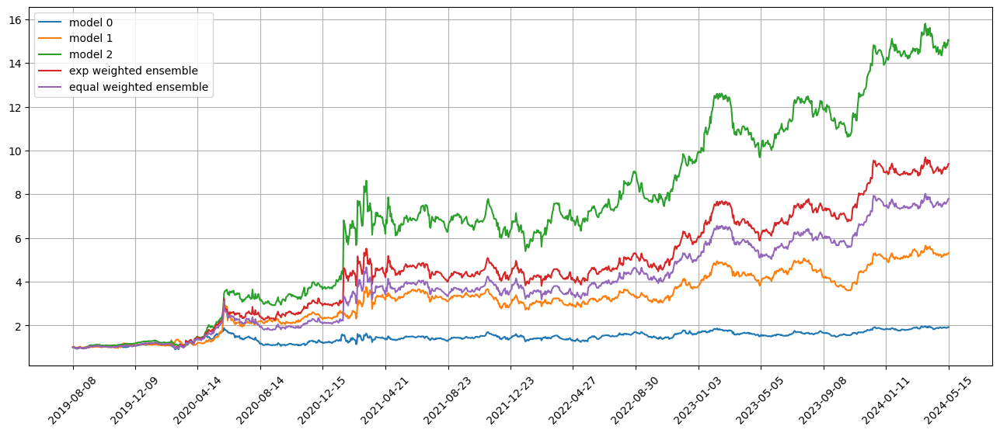

Standardization data are from 2022-10-10 to 2023-07-27
Training data are from 2023-07-28 to 2024-05-13
Testing data are from 2024-04-17 to 2024-06-11
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 61 out of 67 iterations
Restoring model weights from the end of the best epoch: 7.
Epoch 27: early stopping
Restoring model weights from the end of the best epoch: 9.
Epoch 29: early stopping
Restoring model weights from the end of the best epoch: 13.
Epoch 33: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 0.025494739413261414
11/11 [==============================] - 0s 3ms/step
Model 0 test loss 0.02495252713561058
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 0.02480689436197281
11/11 [==============================] - 0s 3ms/step
Model 1 test loss 0.024389192461967468
96/96 [==============================] - 0s 3ms/step
Model 2 training loss 0.0

Testing data from 2024-04-22 to 2024-05-17 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2024-05-20 are ['EMR', 'INFY', 'CX', 'CQQQ', 'GE', 'KKR', 'RBA', 'LII', 'GIB', 'KOLD']
position on 2024-05-21 market open will be {'KOLD': 0.17718025417056646, 'CQQQ': 0.1926033707853713, 'KKR': 0.19608093981036884, 'LII': 0.1964251584712667, 'CX': 0.19582923752687814, 'RBA': 0.1965511587039608, 'GIB': 0.19576273729001817, 'EMR': 0.19682636341131166, 'INFY': 0.1949382726218877, 'GE': 0.19365322953322}
Total asset on 2024-05-21 will be 1.9358507223247996
It should be the same as 1.9358507223248498
top_stocks by model 1 to buy on 2024-05-20 are ['VVV', 'ASML', 'RBA', 'APLS', 'MSGS', 'PRI', 'RMBS', 'FNKO', 'LVS', 'CX']
position on 2024-05-21 market open will be {'PRI': 0.5400456497480679, 'FNKO': 0.5258319662661696, 'RBA': 0.5270929563737858, 'RMBS': 0.5280104324829967, 'CX': 0.525156974057495, 'VVV': 0.5211785516436241, 'MSGS': 0.5182071651185264, 'LVS': 0.5189204701862201, 'ASML

top_stocks by model 1 to buy on 2024-05-23 are ['SCO', 'TTC', 'CHRW', 'WW', 'ERY', 'PRI', 'Z', 'UNH', 'AMN', 'NYCB']
position on 2024-05-24 market open will be {'NYCB': 0.49763449919551084, 'WW': 0.4857302146813795, 'SCO': 0.5348295451857669, 'UNH': 0.5258663488633738, 'TTC': 0.5133340538117015, 'PRI': 0.5219745560055314, 'CHRW': 0.5330215110234786, 'AMN': 0.5250782050046044, 'Z': 0.5103235824385918, 'ERY': 0.5355205857666665}
Total asset on 2024-05-24 will be 5.183313101976525
It should be the same as 5.183313101976605
top_stocks by model 2 to buy on 2024-05-23 are ['EVR', 'ROG', 'CBSH', 'NYCB', 'SKYW', 'WW', 'TTC', 'KOLD', 'AMN', 'LULU']
position on 2024-05-24 market open will be {'NYCB': 1.4497974794891955, 'LULU': 1.4992937093916017, 'SKYW': 1.4767744805151024, 'TTC': 1.4482363699015837, 'WW': 1.444795955570393, 'EVR': 1.4813287127148325, 'AMN': 1.4813693887708599, 'CBSH': 1.465503030664306, 'KOLD': 1.7687072458358006, 'ROG': 1.496412811267483}
Total asset on 2024-05-24 will be 15.

position on 2024-05-30 market open will be {'LULU': 0.5163109497480037, 'WST': 0.5044502281677317, 'QSR': 0.5123179237925548, 'BYON': 0.5178724200519479, 'PEB': 0.5106080062083727, 'PTCT': 0.507516774319415, 'DXCM': 0.5152932454681229, 'FIVE': 0.5211340927501856, 'CSGP': 0.49803373043449684, 'AON': 0.5071706460706563}
Total asset on 2024-05-30 will be 5.1107080170114045
It should be the same as 5.110708017011487
top_stocks by model 2 to buy on 2024-05-29 are ['MIDD', 'ABBV', 'WW', 'PEB', 'FITB', 'BKE', 'MAN', 'SJM', 'HSBC', 'LULU']
position on 2024-05-30 market open will be {'LULU': 1.4908905321305839, 'MAN': 1.475450748047954, 'WW': 1.4249937417266276, 'PEB': 1.480310468539946, 'SJM': 1.4813457072110163, 'ABBV': 1.482344704268608, 'FITB': 1.5085778503961993, 'BKE': 1.5142476966135754, 'MIDD': 1.5100425534377917, 'HSBC': 1.4975051624482287}
Total asset on 2024-05-30 will be 14.865709164820345
It should be the same as 14.86570916482053
top_stocks by return weighted ensemble to buy on 20

top_stocks by return weighted ensemble to buy on 2024-06-03 are ['ANF', 'LSTR', 'EWW', 'DLB', 'DHI', 'MCHP', 'LW', 'LGIH', 'TMHC', 'NEAR']
position on 2024-06-04 market open will be {'DLB': 0.9275118243743105, 'ANF': 0.9231263304238623, 'TMHC': 0.9125869980970355, 'DHI': 0.9179090591349098, 'LGIH': 0.9237973328059242, 'LSTR': 0.9275045875953962, 'NEAR': 0.9307753858186227, 'MCHP': 0.9031830792740325, 'LW': 0.916128132925173, 'EWW': 0.8685436691345461}
Total asset on 2024-06-04 will be 9.151066399583701
It should be the same as 9.151066399583813
top_stocks by equal weighted ensemble to buy on 2024-06-03 are ['ANF', 'LSTR', 'EWW', 'DLB', 'DHI', 'MCHP', 'LW', 'LGIH', 'TMHC', 'NEAR']
position on 2024-06-04 market open will be {'DLB': 0.76969698835769, 'ANF': 0.7660576800519464, 'TMHC': 0.7573116003383732, 'DHI': 0.7617281201552187, 'LGIH': 0.7666145123198287, 'LSTR': 0.769690982906558, 'NEAR': 0.7724052593996273, 'MCHP': 0.7495077451134456, 'LW': 0.7602502160421942, 'EWW': 0.72076218202498

Testing data from 2024-05-09 to 2024-06-06 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2024-06-07 are ['EQIX', 'NEAR', 'BYON', 'EIDO', 'VNO', 'FMX', 'LABU', 'EWW', 'CVNA', 'DFEN']
position on 2024-06-10 market open will be {'BYON': 0.18796395088554813, 'LABU': 0.1768139584874478, 'DFEN': 0.1983312296671516, 'EQIX': 0.1982546047428124, 'CVNA': 0.2051278172111053, 'VNO': 0.19893048534422236, 'EIDO': 0.19887884244793905, 'FMX': 0.19179990307709738, 'EWW': 0.18667509110323532, 'NEAR': 0.19832211715536488}
Total asset on 2024-06-10 will be 1.941098000121874
It should be the same as 1.9410980001219242
top_stocks by model 1 to buy on 2024-06-07 are ['FR', 'ARKG', 'BA', 'GIB', 'NEU', 'VNO', 'BLDR', 'RGEN', 'EIDO', 'LABU']
position on 2024-06-10 market open will be {'LABU': 0.4493368212442912, 'BA': 0.5114547375137825, 'ARKG': 0.48377836143211833, 'RGEN': 0.49199497516547896, 'BLDR': 0.5074150728137267, 'FR': 0.503574683874677, 'GIB': 0.5015069660548623, 'VNO': 0.50563438

position on 2024-06-13 market open will be {'PRI': 0.19293292626248246, 'ARCB': 0.1976318390360697, 'CXW': 0.1921370994235879, 'SRNE': 0.2006012885410295, 'RIG': 0.1964220825747913, 'IGV': 0.2013555328402002, 'NVR': 0.19870002723279281, 'MPC': 0.19304026234579588, 'INFN': 0.19521842421354754, 'DLB': 0.19814299251533782}
Total asset on 2024-06-13 will be 1.9661824749855845
It should be the same as 1.966182474985635
top_stocks by model 1 to buy on 2024-06-12 are ['ORCL', 'PSA', 'INFN', 'HTHT', 'OLED', 'BGS', 'FR', 'ORLY', 'PRI', 'FIVE']
position on 2024-06-13 market open will be {'FIVE': 0.5038057568626394, 'PRI': 0.4917123777079699, 'ORCL': 0.5234638483847244, 'HTHT': 0.5068979978313399, 'FR': 0.49944390217269397, 'PSA': 0.5001171289661517, 'INFN': 0.48859527839308825, 'OLED': 0.5165704048826861, 'BGS': 0.48026112792114883, 'ORLY': 0.5041424898351268}
Total asset on 2024-06-13 will be 5.015010312957483
It should be the same as 5.01501031295757
top_stocks by model 2 to buy on 2024-06-12 

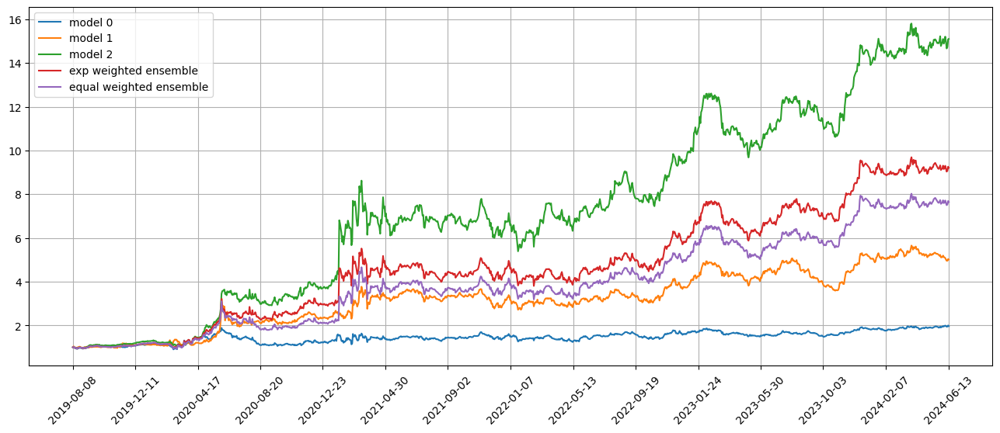

Standardization data are from 2022-11-07 to 2023-08-24
Training data are from 2023-08-25 to 2024-06-11
Testing data are from 2024-05-15 to 2024-07-11
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 62 out of 67 iterations
Restoring model weights from the end of the best epoch: 29.
Epoch 49: early stopping
Restoring model weights from the end of the best epoch: 15.
Epoch 35: early stopping
Restoring model weights from the end of the best epoch: 11.
Epoch 31: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 0.025695638731122017
11/11 [==============================] - 0s 3ms/step
Model 0 test loss 0.023726871237158775
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 0.025509165599942207
11/11 [==============================] - 0s 3ms/step
Model 1 test loss 0.0234507005661726
96/96 [==============================] - 0s 4ms/step
Model 2 training loss 0

position on 2024-06-18 market open will be {'RNR': 0.7737954985473461, 'ACHC': 0.7598321736982249, 'BRKR': 0.759247433318847, 'OTEX': 0.7695403954463086, 'KWR': 0.7728160268882853, 'RS': 0.778728211859233, 'AAON': 0.7897308047823818, 'UNIT': 0.7286052754812222, 'ASND': 0.7410536089652475, 'JBL': 0.7949585145406367}
Total asset on 2024-06-18 will be 7.668307943527578
It should be the same as 7.668307943527733
Testing data from 2024-05-20 to 2024-06-17 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2024-06-18 are ['VNO', 'EQIX', 'PRI', 'FAST', 'CNK', 'KOLD', 'LUV', 'PENN', 'MPW', 'BLDR']
position on 2024-06-20 market open will be {'BLDR': 0.1958522454518523, 'EQIX': 0.19839608398411496, 'MPW': 0.1971974988332123, 'PRI': 0.20442536855120552, 'PENN': 0.1966616442301513, 'VNO': 0.20178168158532986, 'LUV': 0.194514075783854, 'FAST': 0.19744050809739935, 'CNK': 0.20326986602152727, 'KOLD': 0.192005613860623}
Total asset on 2024-06-20 will be 1.98154458639922
It should be t

Testing data from 2024-05-23 to 2024-06-21 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2024-06-24 are ['WTI', 'HAL', 'HLX', 'EPAM', 'SAIA', 'GOOS', 'TNET', 'FCFS', 'CPAY', 'KOLD']
position on 2024-06-25 market open will be {'TNET': 0.196827032747701, 'EPAM': 0.19823646703152026, 'SAIA': 0.19986052077882702, 'HLX': 0.20583748195839335, 'HAL': 0.20061867282771917, 'WTI': 0.2033670858678265, 'CPAY': 0.20121701981353524, 'GOOS': 0.201571645551642, 'FCFS': 0.19711970597703787, 'KOLD': 0.19280333275395484}
Total asset on 2024-06-25 will be 1.9974589653081065
It should be the same as 1.9974589653081571
top_stocks by model 1 to buy on 2024-06-24 are ['FOLD', 'ODP', 'HLX', 'TAP', 'CX', 'KNSL', 'EPAM', 'BBVA', 'TNET', 'CPAY']
position on 2024-06-25 market open will be {'TNET': 0.49947936821128025, 'FOLD': 0.4940663512562096, 'HLX': 0.5237179064560373, 'EPAM': 0.5043784373439554, 'CX': 0.5031103703182379, 'ODP': 0.5029386885601647, 'BBVA': 0.5009694435178578, 'KNSL': 0.5036

Testing data from 2024-05-29 to 2024-06-26 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2024-06-27 are ['DRI', 'JBL', 'NEU', 'WEX', 'PARR', 'ETSY', 'IRWD', 'RYAAY', 'HUBS', 'BA']
position on 2024-06-28 market open will be {'WEX': 0.19952561914989825, 'RYAAY': 0.2020207203013872, 'NEU': 0.1989598026347168, 'BA': 0.20856704789404734, 'PARR': 0.19906978374931594, 'IRWD': 0.20010614125783277, 'ETSY': 0.1974308757758476, 'DRI': 0.1998499867464519, 'HUBS': 0.2070336504563859, 'JBL': 0.19245158508927235}
Total asset on 2024-06-28 will be 2.0050152130551058
It should be the same as 2.005015213055156
top_stocks by model 1 to buy on 2024-06-27 are ['DRI', 'WEX', 'AEO', 'SYK', 'OTEX', 'RAMP', 'HUBS', 'BA', 'SNY', 'RYAAY']
position on 2024-06-28 market open will be {'BA': 0.5236898647881493, 'SNY': 0.5009989375993594, 'WEX': 0.5079350682875401, 'OTEX': 0.5110667216236494, 'DRI': 0.5040795105068758, 'HUBS': 0.5221987895996667, 'AEO': 0.496456113014614, 'RYAAY': 0.5104361755071

position on 2024-07-03 market open will be {'BLDR': 0.194288365640717, 'CVS': 0.19509947815133757, 'RRR': 0.2041724155933492, 'DG': 0.20120945901100237, 'CPA': 0.2001734006898082, 'JELD': 0.20293483381268096, 'QD': 0.19959336792123591, 'HUBS': 0.20056861452154273, 'EXEL': 0.2025955133212689, 'WOR': 0.2050394979678116}
Total asset on 2024-07-03 will be 2.0056749466307044
It should be the same as 2.005674946630754
top_stocks by model 1 to buy on 2024-07-02 are ['CRL', 'ABT', 'CVS', 'MLM', 'BAC-PL', 'KSS', 'ARGX', 'JELD', 'BLDR', 'HUBS']
position on 2024-07-03 market open will be {'BLDR': 0.5066374632775348, 'CRL': 0.511343904583737, 'JELD': 0.5041995501747873, 'MLM': 0.5154849193187946, 'CVS': 0.5060859039288687, 'ABT': 0.5135857065801054, 'BAC-PL': 0.5100027644308909, 'HUBS': 0.5047452173758894, 'ARGX': 0.5101894685096585, 'KSS': 0.49840061941212865}
Total asset on 2024-07-03 will be 5.080675517592307
It should be the same as 5.080675517592396
top_stocks by model 2 to buy on 2024-07-02 

top_stocks by model 1 to buy on 2024-07-08 are ['FBIN', 'RRX', 'NAIL', 'SITE', 'TOL', 'AOS', 'RUSHA', 'ITB', 'PHM', 'BLDR']
position on 2024-07-09 market open will be {'BLDR': 0.5094798252306239, 'NAIL': 0.5117834822086382, 'FBIN': 0.5121480516626733, 'SITE': 0.5028645356426592, 'AOS': 0.507773078457025, 'RUSHA': 0.5061678474745339, 'ITB': 0.5087778927952216, 'TOL': 0.5065599542717087, 'RRX': 0.5167485317631118, 'PHM': 0.5061016262010222}
Total asset on 2024-07-09 will be 5.088404825707128
It should be the same as 5.088404825707217
top_stocks by model 2 to buy on 2024-07-08 are ['TOL', 'XHB', 'GUSH', 'GFI', 'FMX', 'HMC', 'PHM', 'NAIL', 'BLDR', 'ITB']
position on 2024-07-09 market open will be {'FMX': 1.5369821184485704, 'BLDR': 1.4970804719977016, 'NAIL': 1.519766391161886, 'GFI': 1.5075394905335122, 'XHB': 1.50821392005893, 'GUSH': 1.4964276997490868, 'ITB': 1.5108411445782528, 'HMC': 1.5027819089911372, 'TOL': 1.5042548663123907, 'PHM': 1.5028938384125654}
Total asset on 2024-07-09 w

position on 2024-07-12 market open will be {'CSGP': 0.5343642920098781, 'BLDR': 0.5322391275568843, 'ASR': 0.5043228860944089, 'CX': 0.5176480136763334, 'CCS': 0.5355601084665089, 'IOVA': 0.5337175563486953, 'RYAAY': 0.5042281801504226, 'RAMP': 0.5112524002936037, 'FMX': 0.5103060323988542, 'RF': 0.5125434369272464}
Total asset on 2024-07-12 will be 5.196182033922745
It should be the same as 5.1961820339228355
top_stocks by model 2 to buy on 2024-07-11 are ['DHI', 'TOL', 'RF', 'SKY', 'TMHC', 'FR', 'TPH', 'FMX', 'EWW', 'CCS']
position on 2024-07-12 market open will be {'FR': 1.6119070723160747, 'CCS': 1.7128449922520845, 'SKY': 1.5280606151817175, 'TMHC': 1.5693971270326135, 'DHI': 1.5745387285914705, 'FMX': 1.5168670446444765, 'TOL': 1.5680935335914377, 'RF': 1.523517652278297, 'EWW': 1.5066775900670906, 'TPH': 1.598892825182227}
Total asset on 2024-07-12 will be 15.7107971811373
It should be the same as 15.710797181137488
top_stocks by return weighted ensemble to buy on 2024-07-11 are

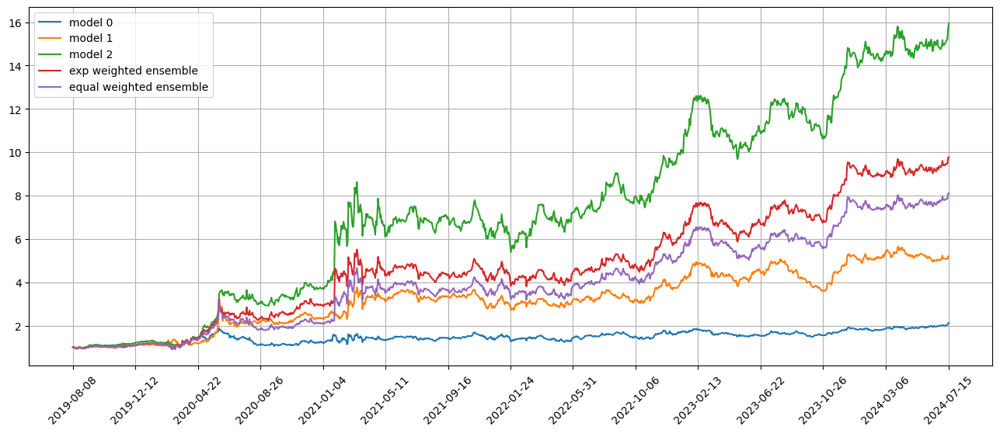

Standardization data are from 2022-12-06 to 2023-09-22
Training data are from 2023-09-25 to 2024-07-11
Testing data are from 2024-06-13 to 2024-08-08
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 63 out of 67 iterations
Restoring model weights from the end of the best epoch: 6.
Epoch 26: early stopping
Restoring model weights from the end of the best epoch: 24.
Epoch 44: early stopping
Restoring model weights from the end of the best epoch: 6.
Epoch 26: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 0.02574487216770649
11/11 [==============================] - 0s 3ms/step
Model 0 test loss 0.04080535098910332
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 0.025118332356214523
11/11 [==============================] - 0s 3ms/step
Model 1 test loss 0.03990853577852249
96/96 [==============================] - 0s 3ms/step
Model 2 training loss 0.02

Testing data from 2024-06-18 to 2024-07-17 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2024-07-18 are ['DLB', 'NUGT', 'YPF', 'QD', 'ACLS', 'NAIL', 'ERX', 'HMC', 'FMX', 'GUSH']
position on 2024-07-19 market open will be {'NAIL': 0.24290030060792056, 'HMC': 0.2058184279447457, 'FMX': 0.2087094967836222, 'ACLS': 0.20525452211419382, 'NUGT': 0.19163517245959044, 'QD': 0.20786110659551305, 'GUSH': 0.20697922081792156, 'YPF': 0.2057108214039236, 'DLB': 0.20962418030124252, 'ERX': 0.20987793908629993}
Total asset on 2024-07-19 will be 2.0943711881149216
It should be the same as 2.0943711881149736
top_stocks by model 1 to buy on 2024-07-18 are ['BLDR', 'RRX', 'ITB', 'QD', 'ACLS', 'HMC', 'ERX', 'FMX', 'GUSH', 'NAIL']
position on 2024-07-19 market open will be {'BLDR': 0.5179914643244742, 'HMC': 0.5123638479190163, 'FMX': 0.5195608670084985, 'NAIL': 0.5313489907025869, 'ACLS': 0.5120050631162568, 'QD': 0.5185071583594165, 'GUSH': 0.5163073043510071, 'ITB': 0.52733503511731

top_stocks by model 0 to buy on 2024-07-23 are ['LECO', 'RYAAY', 'HTH', 'TOL', 'IEX', 'CCS', 'CX', 'BLDR', 'EXP', 'NAIL']
position on 2024-07-24 market open will be {'NAIL': 0.24713522662691303, 'BLDR': 0.20913945458929237, 'TOL': 0.21120397964100712, 'CX': 0.21344161413201554, 'EXP': 0.21056882077955402, 'HTH': 0.20690967084483278, 'IEX': 0.20216965460636382, 'CCS': 0.2088386939422787, 'LECO': 0.20557807755951932, 'RYAAY': 0.20562267428627468}
Total asset on 2024-07-24 will be 2.120607867007999
It should be the same as 2.1206078670080513
top_stocks by model 1 to buy on 2024-07-23 are ['HTH', 'MLM', 'NAIL', 'FAST', 'CSGP', 'WY', 'IEX', 'BLDR', 'CCS', 'CX']
position on 2024-07-24 market open will be {'NAIL': 0.5406129712751099, 'CX': 0.5393552104423467, 'MLM': 0.5196112893694561, 'BLDR': 0.5316344540138739, 'HTH': 0.5245411517068003, 'IEX': 0.5125246347084238, 'WY': 0.5197810189960512, 'CSGP': 0.5151387011640821, 'CCS': 0.5294314596033419, 'FAST': 0.5182787034430839}
Total asset on 2024

top_stocks by model 1 to buy on 2024-07-26 are ['APAM', 'BLDR', 'VAC', 'LSCC', 'THG', 'MIDD', 'CBOE', 'CRM', 'FCNCA', 'DXCM']
position on 2024-07-29 market open will be {'FCNCA': 0.5702216568818786, 'CRM': 0.5204646332238696, 'VAC': 0.5068724089031383, 'BLDR': 0.5267792901158345, 'CBOE': 0.5112763500407574, 'DXCM': 0.5085279107048318, 'LSCC': 0.5243851540093447, 'THG': 0.5288679011484299, 'APAM': 0.5116487641211347, 'MIDD': 0.5145221806854935}
Total asset on 2024-07-29 will be 5.223566249834624
It should be the same as 5.223566249834713
top_stocks by model 2 to buy on 2024-07-26 are ['DXCM', 'APAM', 'WRB', 'IEX', 'THG', 'FCNCA', 'CX', 'ALV', 'BLDR', 'CBOE']
position on 2024-07-29 market open will be {'FCNCA': 1.7655350075594678, 'WRB': 1.6193765539065663, 'BLDR': 1.615945023995352, 'CBOE': 1.5683882970289023, 'DXCM': 1.5599572008336333, 'IEX': 1.6003422784546164, 'CX': 1.590612650163554, 'THG': 1.622352034803317, 'APAM': 1.5695307122516404, 'ALV': 1.5700309676077224}
Total asset on 202

position on 2024-08-01 market open will be {'CSTM': 0.546689040504973, 'ANF': 0.5346689506198897, 'VST': 0.5167776346866669, 'AMD': 0.5156465832601799, 'MRVL': 0.5282072119635701, 'LPG': 0.547770865699533, 'ETN': 0.5077509352495158, 'NVDA': 0.5580056712170889, 'META': 0.5929010429821643, 'MELI': 0.5410253050444456}
Total asset on 2024-08-01 will be 5.389443241227939
It should be the same as 5.389443241228028
top_stocks by model 2 to buy on 2024-07-31 are ['FTEC', 'MELI', 'SPXL', 'FTAI', 'VST', 'GE', 'XLK', 'WSM', 'ETN', 'TRU']
position on 2024-08-01 market open will be {'GE': 1.6180024614800892, 'SPXL': 1.6812139480468975, 'TRU': 1.6519065659117358, 'VST': 1.5901215334714933, 'WSM': 1.6462002315969093, 'FTEC': 1.6612675980261034, 'FTAI': 1.6429990140279713, 'XLK': 1.6631368738791386, 'ETN': 1.5623464360451274, 'MELI': 1.664731462741749}
Total asset on 2024-08-01 will be 16.38192612522703
It should be the same as 16.381926125227217
top_stocks by return weighted ensemble to buy on 2024-0

top_stocks by model 2 to buy on 2024-08-05 are ['BVN', 'HCC', 'GE', 'NTNX', 'PIPR', 'NRG', 'PWR', 'DBA', 'CELH', 'CX']
position on 2024-08-06 market open will be {'CX': 1.5208143173050757, 'PIPR': 1.5526568920287231, 'NTNX': 1.584058634757878, 'DBA': 1.52326513000951, 'CELH': 1.6347398337068715, 'HCC': 1.5413513018918907, 'BVN': 1.5546055375144208, 'NRG': 1.550461763424562, 'PWR': 1.5672297146654126, 'GE': 1.5556324951752252}
Total asset on 2024-08-06 will be 15.584815620479377
It should be the same as 15.58481562047957
top_stocks by return weighted ensemble to buy on 2024-08-05 are ['ARCH', 'RMBS', 'AAOI', 'TNET', 'ELF', 'CMG', 'DECK', 'PLAY', 'CELH', 'CX']
position on 2024-08-06 market open will be {'CX': 0.9375234738171226, 'CELH': 0.9932676487501457, 'AAOI': 0.9548547379850624, 'ARCH': 0.9313973408910116, 'RMBS': 0.9757944382963923, 'PLAY': 0.944115703716532, 'TNET': 0.9016615993588475, 'CMG': 1.006565264839481, 'ELF': 1.0742280191402565, 'DECK': 0.9605385482612594}
Total asset on 

position on 2024-08-09 market open will be {'BBVA': 1.5828321708500745, 'SIG': 1.5733703613385441, 'EWQ': 1.5823987441281728, 'WSM': 1.6601341087556352, 'IEV': 1.5874472655984617, 'SAN': 1.5698460020651581, 'EWG': 1.5843022625632437, 'FEZ': 1.5808070868119315, 'VYMI': 1.586488128139279, 'VGK': 1.5886498553188966}
Total asset on 2024-08-09 will be 15.896275985569204
It should be the same as 15.896275985569398
top_stocks by return weighted ensemble to buy on 2024-08-08 are ['SIG', 'VYMI', 'IEV', 'BWA', 'MT', 'TRIP', 'EWQ', 'VGK', 'CELH', 'SAN']
position on 2024-08-09 market open will be {'CELH': 0.9019143977475013, 'SAN': 0.9844162542522245, 'EWQ': 0.9746956833469399, 'TRIP': 1.00534090625339, 'IEV': 0.9778053749481463, 'BWA': 0.9792236837361183, 'MT': 0.9775587930178246, 'VYMI': 0.9772145838187482, 'SIG': 0.970277489374021, 'VGK': 0.9785461231405312}
Total asset on 2024-08-09 will be 9.726993289635335
It should be the same as 9.726993289635445
top_stocks by equal weighted ensemble to bu

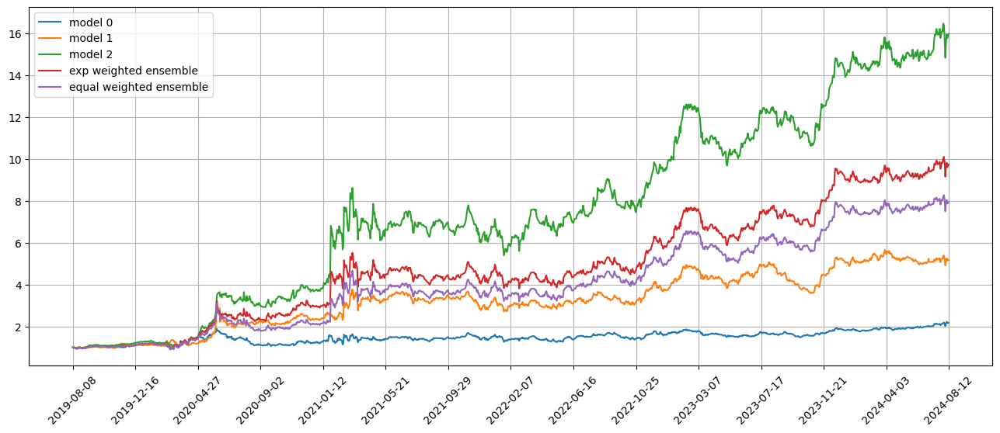

Standardization data are from 2023-01-05 to 2023-10-20
Training data are from 2023-10-23 to 2024-08-08
Testing data are from 2024-07-15 to 2024-09-06
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 64 out of 67 iterations
Restoring model weights from the end of the best epoch: 7.
Epoch 27: early stopping
Restoring model weights from the end of the best epoch: 22.
Epoch 42: early stopping
Restoring model weights from the end of the best epoch: 7.
Epoch 27: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 0.02560567483305931
11/11 [==============================] - 0s 3ms/step
Model 0 test loss 0.021616974845528603
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 0.026085348799824715
11/11 [==============================] - 0s 3ms/step
Model 1 test loss 0.022152895107865334
96/96 [==============================] - 0s 3ms/step
Model 2 training loss 0.

position on 2024-08-15 market open will be {'IVV': 1.6236325536859901, 'WWW': 1.6584364466748707, 'STE': 1.600209893577505, 'MODG': 1.5727587257318365, 'MGC': 1.624635398390454, 'G': 1.6167132758131004, 'RL': 1.6116137802889163, 'HD': 1.6631537103567442, 'ZWS': 1.636381802341791, 'MDT': 1.6263731190416382}
Total asset on 2024-08-15 will be 16.23390870590265
It should be the same as 16.23390870590285
top_stocks by return weighted ensemble to buy on 2024-08-14 are ['IBB', 'ATGE', 'MODG', 'WTS', 'MKTX', 'TAL', 'EHTH', 'BX', 'HD', 'LOW']
position on 2024-08-15 market open will be {'TAL': 0.9711025094808249, 'LOW': 1.0065304555314103, 'MODG': 0.9607024776620742, 'IBB': 0.9783738019246376, 'WTS': 0.9942447825924362, 'BX': 1.0103696096309702, 'ATGE': 1.0097754442489555, 'EHTH': 0.9990396191811066, 'HD': 1.0159192660203546, 'MKTX': 0.9866495185560579}
Total asset on 2024-08-15 will be 9.932707484828716
It should be the same as 9.932707484828828
top_stocks by equal weighted ensemble to buy on 2

position on 2024-08-20 market open will be {'RNG': 1.6271837221799645, 'FDS': 1.6396760316331889, 'SON': 1.6228273233706043, 'NSA': 1.6397161048047597, 'PFSI': 1.6505208116777745, 'CME': 1.6423782465612464, 'ABR': 1.6049758899285111, 'SWX': 1.636673831136033, 'COO': 1.6473650098508692, 'KBE': 1.6429870473374883}
Total asset on 2024-08-20 will be 16.354304018480228
It should be the same as 16.35430401848044
top_stocks by return weighted ensemble to buy on 2024-08-19 are ['PFSI', 'FBP', 'MMC', 'BX', 'SWX', 'KBE', 'CSGP', 'JKHY', 'SON', 'CME']
position on 2024-08-20 market open will be {'MMC': 1.0133011369370977, 'SON': 0.9967954394993146, 'PFSI': 1.013805716841133, 'CSGP': 1.0200264556327236, 'CME': 1.0088042778974482, 'FBP': 1.00827529687741, 'BX': 1.0102594980623198, 'JKHY': 0.9952796064861632, 'SWX': 1.0053004329726214, 'KBE': 1.0091782239289098}
Total asset on 2024-08-20 will be 10.08102608513503
It should be the same as 10.081026085135141
top_stocks by equal weighted ensemble to buy

position on 2024-08-23 market open will be {'SPGP': 0.8235274497386786, 'DFS': 0.799880980853402, 'AZPN': 0.8283534330621471, 'WWW': 0.8565103686206876, 'DBA': 0.8450198796010643, 'CCK': 0.8392949202507861, 'M': 0.827299103887174, 'ABR': 0.8404603719129163, 'BEN': 0.8662717654407256, 'JKHY': 0.8288131554133493}
Total asset on 2024-08-23 will be 8.355431428780776
It should be the same as 8.355431428780932
Testing data from 2024-07-26 to 2024-08-22 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2024-08-23 are ['CCK', 'CMG', 'RCL', 'MAT', 'EEFT', 'EME', 'KNSL', 'CAG', 'FLEX', 'GE']
position on 2024-08-26 market open will be {'GE': 0.22357703003838805, 'KNSL': 0.23037356722399108, 'RCL': 0.23216905931961257, 'MAT': 0.23007447856339855, 'CCK': 0.22614712357332337, 'CAG': 0.22606220143770497, 'CMG': 0.22566259971734415, 'FLEX': 0.234361254949571, 'EEFT': 0.22988012196018517, 'EME': 0.23038231167711087}
Total asset on 2024-08-26 will be 2.2886897484605755
It should be the 

Testing data from 2024-07-31 to 2024-08-27 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2024-08-28 are ['BEN', 'KNSL', 'APAM', 'DECK', 'FLEX', 'CQQQ', 'EME', 'BMO', 'GE', 'HWM']
position on 2024-08-29 market open will be {'GE': 0.22630390144784898, 'HWM': 0.22845900753668652, 'CQQQ': 0.23122212904924874, 'KNSL': 0.22390271295801084, 'APAM': 0.22749672384097433, 'BEN': 0.21839918480118012, 'FLEX': 0.22581131158407958, 'BMO': 0.22461105051202299, 'DECK': 0.22416650733251023, 'EME': 0.22773774519859272}
Total asset on 2024-08-29 will be 2.258110274261101
It should be the same as 2.2581102742611554
top_stocks by model 1 to buy on 2024-08-28 are ['RDN', 'CNC', 'FTI', 'COO', 'APAM', 'CEIX', 'SBLK', 'BMO', 'JNUG', 'NUGT']
position on 2024-08-29 market open will be {'CNC': 0.5502581671655797, 'NUGT': 0.5369091960241702, 'JNUG': 0.5325657087769805, 'APAM': 0.545585591472199, 'FTI': 0.5502594266090478, 'RDN': 0.5457689067732561, 'CEIX': 0.5660443419521345, 'BMO': 0.53866513

top_stocks by model 0 to buy on 2024-09-03 are ['HWM', 'ARES', 'VUG', 'DXJ', 'IWY', 'IXN', 'MGK', 'LMBS', 'ZTO', 'GE']
position on 2024-09-04 market open will be {'DXJ': 0.2189356620400678, 'VUG': 0.2221389664079714, 'IWY': 0.2218250359725101, 'LMBS': 0.22916925504894195, 'IXN': 0.21774406613627878, 'ZTO': 0.2273725896661442, 'MGK': 0.22200357333772128, 'HWM': 0.21898740048865767, 'GE': 0.21497376438361124, 'ARES': 0.22338213996995082}
Total asset on 2024-09-04 will be 2.2165324534518005
It should be the same as 2.216532453451855
top_stocks by model 1 to buy on 2024-09-03 are ['CX', 'ULTA', 'PSX', 'BBWI', 'TROW', 'DINO', 'MPC', 'FDS', 'VLO', 'ZTO']
position on 2024-09-04 market open will be {'PSX': 0.5424005288020723, 'FDS': 0.5700886025940441, 'VLO': 0.5427199565339829, 'CX': 0.5328016110780878, 'DINO': 0.5438647103500497, 'TROW': 0.5494594928731849, 'MPC': 0.5534955538613262, 'ZTO': 0.550722553378374, 'ULTA': 0.5626149086577718, 'BBWI': 0.5442922285544508}
Total asset on 2024-09-04 w

top_stocks by model 1 to buy on 2024-09-06 are ['MJ', 'PCTY', 'CMCSA', 'CRI', 'MOH', 'ERY', 'CPRT', 'RWM', 'DRIP', 'PYPL']
position on 2024-09-09 market open will be {'RWM': 0.5677071529219678, 'CMCSA': 0.5568333398096151, 'PYPL': 0.5456739970264132, 'MOH': 0.5474820921534354, 'DRIP': 0.5762472959367593, 'PCTY': 0.5549875566799024, 'MJ': 0.5507248179554698, 'CRI': 0.5748101643798652, 'CPRT': 0.5590205048428285, 'ERY': 0.5718427786560751}
Total asset on 2024-09-09 will be 5.605329700362239
It should be the same as 5.605329700362331
top_stocks by model 2 to buy on 2024-09-06 are ['VONG', 'OEF', 'WRB', 'HPE', 'DSI', 'HUBS', 'PYPL', 'FOLD', 'CPRT', 'ANSS']
position on 2024-09-09 market open will be {'HPE': 1.586718851585693, 'VONG': 1.5587887565567353, 'FOLD': 1.5498754963818153, 'OEF': 1.5654769427546067, 'PYPL': 1.5503705237413354, 'DSI': 1.5691398955423266, 'HUBS': 1.5652896110250683, 'WRB': 1.5858073154766985, 'CPRT': 1.5882906599879087, 'ANSS': 1.5713685495324325}
Total asset on 2024-

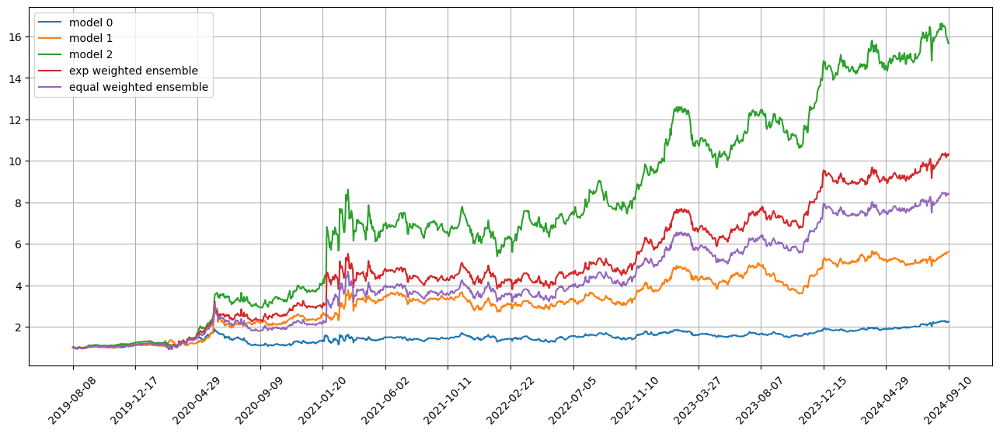

Standardization data are from 2023-02-03 to 2023-11-17
Training data are from 2023-11-20 to 2024-09-06
Testing data are from 2024-08-12 to 2024-10-04
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 65 out of 67 iterations
Restoring model weights from the end of the best epoch: 9.
Epoch 29: early stopping
Restoring model weights from the end of the best epoch: 6.
Epoch 26: early stopping
Restoring model weights from the end of the best epoch: 9.
Epoch 29: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 0.02545015700161457
11/11 [==============================] - 0s 3ms/step
Model 0 test loss 0.023679709061980247
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 0.025696273893117905
11/11 [==============================] - 0s 3ms/step
Model 1 test loss 0.023834818974137306
96/96 [==============================] - 0s 3ms/step
Model 2 training loss 0.0

position on 2024-09-13 market open will be {'CPRT': 1.5663222928149831, 'IBN': 1.6071334945551248, 'HPQ': 1.595977304335936, 'WTM': 1.5986744844773642, 'BRK-A': 1.5878645909955005, 'ZTO': 1.619244871395971, 'MUFG': 1.6087914026172776, 'WRB': 1.6160581053041545, 'LHX': 1.612796913785837, 'MCK': 1.5955498062567293}
Total asset on 2024-09-13 will be 16.008413266538657
It should be the same as 16.008413266538877
top_stocks by return weighted ensemble to buy on 2024-09-12 are ['BRK-A', 'HPQ', 'KEY', 'BBD', 'IBN', 'WRB', 'SAH', 'UA', 'WTM', 'CPRT']
position on 2024-09-13 market open will be {'CPRT': 1.0377359530190626, 'SAH': 1.0639697837080708, 'IBN': 1.0648558853961367, 'HPQ': 1.057464007338869, 'KEY': 1.0759641316363648, 'BRK-A': 1.0520886787949972, 'WTM': 1.059251107263862, 'WRB': 1.0707691616194068, 'BBD': 1.0819221130558, 'UA': 1.1341281140543547}
Total asset on 2024-09-13 will be 10.698148935886804
It should be the same as 10.698148935886923
top_stocks by equal weighted ensemble to bu

position on 2024-09-18 market open will be {'HPE': 0.89338759594806, 'JPM': 0.884132310822139, 'KMPR': 0.8811666525717909, 'FCN': 0.8762607496379391, 'CYBR': 0.8757298550433611, 'HRB': 0.8620764791239715, 'WMT': 0.8663786970613485, 'HEFA': 0.873913327856488, 'DBRG': 0.8486864267051397, 'CSTM': 0.8834252182396993}
Total asset on 2024-09-18 will be 8.745157313009777
It should be the same as 8.745157313009937
Testing data from 2024-08-20 to 2024-09-17 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2024-09-18 are ['L', 'TXT', 'RDN', 'ESNT', 'AFG', 'TSCO', 'SMFG', 'CPRT', 'WTM', 'WRB']
position on 2024-09-19 market open will be {'ESNT': 0.23962678677396942, 'TXT': 0.2341814545523674, 'SMFG': 0.23779442915448815, 'AFG': 0.23476638596384897, 'L': 0.23547418845835513, 'TSCO': 0.23611619832569977, 'WTM': 0.23511990500665236, 'RDN': 0.2392799522191852, 'WRB': 0.23234832531570018, 'CPRT': 0.23818391138748704}
Total asset on 2024-09-19 will be 2.362891537157698
It should be the

Testing data from 2024-08-23 to 2024-09-20 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2024-09-23 are ['HPE', 'BVN', 'X', 'TGI', 'LPG', 'CPRT', 'FDX', 'DHT', 'QD', 'PLCE']
position on 2024-09-24 market open will be {'QD': 0.23584223494335424, 'BVN': 0.23825230752158488, 'HPE': 0.23607862489259468, 'X': 0.23579399425579656, 'TGI': 0.21983801664803088, 'CPRT': 0.23541494924704254, 'LPG': 0.23567599257675634, 'FDX': 0.23777165532512537, 'PLCE': 0.26575023117577723, 'DHT': 0.23684928972392275}
Total asset on 2024-09-24 will be 2.3772672963099297
It should be the same as 2.3772672963099857
top_stocks by model 1 to buy on 2024-09-23 are ['CSTM', 'DBRG', 'HPE', 'HEFA', 'TGT', 'UNH', 'TJX', 'DHT', 'QD', 'PLCE']
position on 2024-09-24 market open will be {'QD': 0.586285140750557, 'HPE': 0.5901482413477845, 'TJX': 0.5796715621199942, 'UNH': 0.5803352001012734, 'HEFA': 0.5882810201311313, 'DBRG': 0.5978216903000751, 'PLCE': 0.6643211838323091, 'DHT': 0.5920747456854125, 'TG

top_stocks by model 0 to buy on 2024-09-26 are ['TFIN', 'UCTT', 'HLNE', 'MARA', 'WSFS', 'KN', 'FDX', 'ZD', 'BVN', 'GMS']
position on 2024-09-27 market open will be {'WSFS': 0.23973021576187367, 'MARA': 0.25460555421047737, 'TFIN': 0.23519954458781533, 'ZD': 0.23830162088390502, 'BVN': 0.24166898731356343, 'UCTT': 0.23487810815981325, 'HLNE': 0.23818123170010122, 'FDX': 0.23728081924892322, 'KN': 0.2388555104654511, 'GMS': 0.2388044028940914}
Total asset on 2024-09-27 will be 2.3975059952259596
It should be the same as 2.397505995226015
top_stocks by model 1 to buy on 2024-09-26 are ['IBTX', 'INDB', 'ETSY', 'KN', 'FHB', 'WDAY', 'FDX', 'WSFS', 'BIO', 'ZD']
position on 2024-09-27 market open will be {'WDAY': 0.5987670883446573, 'WSFS': 0.6022545042849072, 'IBTX': 0.5939963634126331, 'BIO': 0.6240053265284261, 'ETSY': 0.6096472724473285, 'ZD': 0.600138283379823, 'INDB': 0.6011568291028645, 'FDX': 0.5975674987640198, 'KN': 0.6015331976964695, 'FHB': 0.6058805119285064}
Total asset on 2024-0

top_stocks by model 1 to buy on 2024-10-01 are ['BBY', 'AUB', 'CBU', 'INDB', 'FNB', 'CUBI', 'RITM', 'FHB', 'ACN', 'CHDN']
position on 2024-10-02 market open will be {'CHDN': 0.6009686379002789, 'ACN': 0.5958760990326972, 'AUB': 0.5766002196584593, 'CUBI': 0.5798281083686845, 'RITM': 0.588391984822498, 'FNB': 0.581294623925033, 'INDB': 0.5810182546105362, 'CBU': 0.5860978235487857, 'BBY': 0.5880396544936787, 'FHB': 0.585330339600901}
Total asset on 2024-10-02 will be 5.863445745961456
It should be the same as 5.8634457459615525
top_stocks by model 2 to buy on 2024-10-01 are ['RDN', 'RITM', 'FCNCA', 'FNB', 'MMC', 'AUB', 'CUBI', 'VRSK', 'CHDN', 'FHB']
position on 2024-10-02 market open will be {'FCNCA': 1.6671298587673196, 'MMC': 1.6770422440089023, 'VRSK': 1.6729085729936817, 'CHDN': 1.6930934279622076, 'RITM': 1.6576615479457255, 'AUB': 1.6244409123846724, 'CUBI': 1.6335347599115086, 'RDN': 1.657930293972728, 'FNB': 1.6376663363264328, 'FHB': 1.649036053907386}
Total asset on 2024-10-02

position on 2024-10-07 market open will be {'LBRDK': 0.5746294531951107, 'SAH': 0.5878080443708699, 'PAGP': 0.5852309809347538, 'GL': 0.5859373169677428, 'PPC': 0.5976434009045672, 'L': 0.5865579918844627, 'YY': 0.6046157812150312, 'INFY': 0.5861579835147813, 'KFY': 0.5785857648581314, 'BBWI': 0.5791931718192208}
Total asset on 2024-10-07 will be 5.866359889664577
It should be the same as 5.866359889664673
top_stocks by model 2 to buy on 2024-10-04 are ['ODFL', 'DXJ', 'MU', 'TMV', 'PPC', 'INFY', 'SMFG', 'DRIP', 'UHS', 'PPLT']
position on 2024-10-07 market open will be {'MU': 1.6461344817016048, 'DXJ': 1.6590404689048732, 'SMFG': 1.7004615063081487, 'UHS': 1.6519618896778492, 'ODFL': 1.6275302466239383, 'PPC': 1.7119064257293248, 'DRIP': 1.663374701827324, 'PPLT': 1.644710545729376, 'TMV': 1.6959369535899937, 'INFY': 1.6790072758315793}
Total asset on 2024-10-07 will be 16.680064495923773
It should be the same as 16.68006449592401
top_stocks by return weighted ensemble to buy on 2024-10

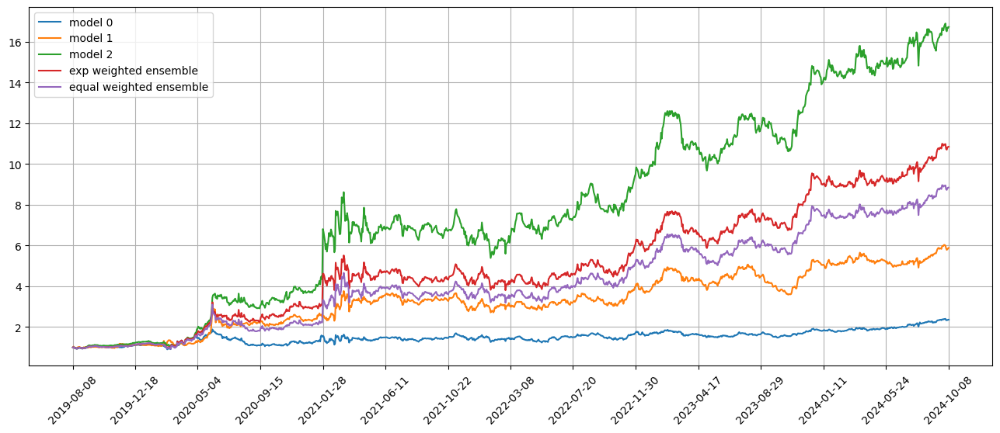

Standardization data are from 2023-03-06 to 2023-12-18
Training data are from 2023-12-19 to 2024-10-04
Testing data are from 2024-09-10 to 2024-11-01
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 66 out of 67 iterations
Restoring model weights from the end of the best epoch: 15.
Epoch 35: early stopping
Restoring model weights from the end of the best epoch: 10.
Epoch 30: early stopping
Restoring model weights from the end of the best epoch: 14.
Epoch 34: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 0.026155857369303703
11/11 [==============================] - 0s 3ms/step
Model 0 test loss 0.02307611145079136
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 0.026171065866947174
11/11 [==============================] - 0s 3ms/step
Model 1 test loss 0.023127805441617966
96/96 [==============================] - 0s 3ms/step
Model 2 training loss 

Testing data from 2024-09-13 to 2024-10-10 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2024-10-11 are ['RDY', 'CBOE', 'NEAR', 'MORN', 'IIPR', 'TTEK', 'LSTR', 'RITM', 'PPC', 'SRNE']
position on 2024-10-14 market open will be {'PPC': 0.2356068380476736, 'CBOE': 0.24095455874651778, 'SRNE': 0.24200938297308333, 'IIPR': 0.24340291109001086, 'RITM': 0.24110467584602194, 'TTEK': 0.2438394098001353, 'LSTR': 0.24769334337722373, 'NEAR': 0.24196181686976462, 'MORN': 0.24553805198479253, 'RDY': 0.24533778564846118}
Total asset on 2024-10-14 will be 2.427448774383626
It should be the same as 2.427448774383685
top_stocks by model 1 to buy on 2024-10-11 are ['VTNR', 'AWK', 'RDY', 'SCHR', 'MORN', 'TTEK', 'SPTI', 'LSTR', 'NEAR', 'EXEL']
position on 2024-10-14 market open will be {'SCHR': 0.6071777280317213, 'SPTI': 0.6070916178851663, 'VTNR': 0.6081566746472754, 'TTEK': 0.6127554344803973, 'LSTR': 0.6224401640547637, 'EXEL': 0.6192526846222945, 'NEAR': 0.608037143566022, 'MORN'

top_stocks by model 1 to buy on 2024-10-16 are ['UDOW', 'VLO', 'EPI', 'MOG-A', 'EWY', 'VRRM', 'KOLD', 'MSTR', 'EWJ', 'UNH']
position on 2024-10-17 market open will be {'KOLD': 0.6508495316525089, 'EWJ': 0.6347517774067398, 'VRRM': 0.6407671436085712, 'UNH': 0.6364564564373644, 'EWY': 0.6290821951618726, 'VLO': 0.6332896199065444, 'EPI': 0.6277674075893623, 'UDOW': 0.6561569978753361, 'MOG-A': 0.6380474345248239, 'MSTR': 0.6099417189212043}
Total asset on 2024-10-17 will be 6.35711028308423
It should be the same as 6.357110283084328
top_stocks by model 2 to buy on 2024-10-16 are ['ITUB', 'GFI', 'PAAS', 'KFY', 'UNH', 'SBS', 'MOG-A', 'SMFG', 'AEM', 'EWJ']
position on 2024-10-17 market open will be {'SBS': 1.7475214674891768, 'SMFG': 1.7725770595665389, 'PAAS': 1.7623696116075644, 'ITUB': 1.7271196970572775, 'GFI': 1.8413625920661107, 'UNH': 1.7788630868613455, 'MOG-A': 1.783309788851972, 'EWJ': 1.7740985965779117, 'AEM': 1.7671079334523891, 'KFY': 1.7530604343660867}
Total asset on 2024-1

position on 2024-10-22 market open will be {'NUGT': 0.6243183634496878, 'HMY': 0.6297775186828579, 'JNUG': 0.6273763519823076, 'WPM': 0.6285569341929523, 'SIVR': 0.6325460353210778, 'WDFC': 0.6342217150644222, 'PAAS': 0.6249464504289873, 'SCCO': 0.635466763756566, 'AEM': 0.6322040796248718, 'KOLD': 0.6160496004549644}
Total asset on 2024-10-22 will be 6.285463812958597
It should be the same as 6.285463812958694
top_stocks by model 2 to buy on 2024-10-21 are ['DBO', 'SIVR', 'GDXJ', 'PSLV', 'AEM', 'SLV', 'USO', 'PAAS', 'ITUB', 'SBS']
position on 2024-10-22 market open will be {'SLV': 1.7675107363558242, 'GDXJ': 1.7507193827392322, 'USO': 1.7714329269581726, 'SBS': 1.7512239520152284, 'DBO': 1.769372476172875, 'SIVR': 1.7673490018680678, 'PSLV': 1.7691174049488387, 'PAAS': 1.7461155769097874, 'AEM': 1.7663935693388508, 'ITUB': 1.7494722522454373}
Total asset on 2024-10-22 will be 17.608707279552082
It should be the same as 17.608707279552313
top_stocks by return weighted ensemble to buy o

top_stocks by model 2 to buy on 2024-10-24 are ['KO', 'WU', 'MMM', 'NYT', 'STNG', 'ACGL', 'CBOE', 'ITRI', 'BAH', 'GOGL']
position on 2024-10-25 market open will be {'CBOE': 1.7516472558786838, 'NYT': 1.75165789890509, 'KO': 1.728069414271441, 'STNG': 1.73877230426768, 'WU': 1.709435026126478, 'ITRI': 1.7436921466854043, 'MMM': 1.7234105518066443, 'ACGL': 1.7324573879901854, 'BAH': 1.9289730038331034, 'GOGL': 1.7738775111560499}
Total asset on 2024-10-25 will be 17.58199250092053
It should be the same as 17.581992500920762
top_stocks by return weighted ensemble to buy on 2024-10-24 are ['NYT', 'FUL', 'KO', 'CBOE', 'ERIE', 'ITRI', 'MDRX', 'BAH', 'STNG', 'GOGL']
position on 2024-10-25 market open will be {'CBOE': 1.139449889826038, 'ERIE': 1.1163197817220318, 'MDRX': 1.1515694422479903, 'FUL': 1.1401828957192262, 'NYT': 1.1394568131350689, 'KO': 1.124112458769902, 'STNG': 1.1310747091808258, 'ITRI': 1.1342750760823372, 'BAH': 1.2548006279908552, 'GOGL': 1.153910713397444}
Total asset on 2

position on 2024-10-30 market open will be {'EPI': 1.7788679278959596, 'TXT': 1.7495929214627683, 'AOS': 1.7788469376107037, 'NTAP': 1.7706490916229354, 'MDRX': 1.7473750830436985, 'WRB': 1.7685557180614175, 'UCTT': 1.7426251950551614, 'LMT': 1.759630135297369, 'USFR': 1.7789669376647557, 'ACGL': 1.7571212806228713}
Total asset on 2024-10-30 will be 17.632231228337403
It should be the same as 17.63223122833764
top_stocks by return weighted ensemble to buy on 2024-10-29 are ['NVMI', 'AOS', 'USO', 'LMT', 'LRCX', 'ACGL', 'KLAC', 'WRB', 'UCTT', 'MDRX']
position on 2024-10-30 market open will be {'USO': 1.1634861505022458, 'AOS': 1.1545830295406254, 'MDRX': 1.13415582559016, 'NVMI': 1.2001052934693017, 'KLAC': 1.166403097392057, 'LRCX': 1.1698033739253673, 'WRB': 1.1479033837579242, 'UCTT': 1.1310728509126704, 'LMT': 1.142110121746313, 'ACGL': 1.140481717992447}
Total asset on 2024-10-30 will be 11.550104844829006
It should be the same as 11.55010484482911
top_stocks by equal weighted ensem

top_stocks by equal weighted ensemble to buy on 2024-11-01 are ['ITUB', 'ASGN', 'FSS', 'VTR', 'INFY', 'EQR', 'RSG', 'HUBG', 'AFL', 'TDG']
position on 2024-11-04 market open will be {'INFY': 0.9312922159478031, 'ITUB': 0.9469425602105855, 'VTR': 0.9331372603335845, 'RSG': 0.9470750857920116, 'EQR': 0.9303621208469559, 'FSS': 0.9281922218562225, 'AFL': 0.9395724671549346, 'TDG': 0.9424358347372266, 'HUBG': 0.9366438356817693, 'ASGN': 0.9250686497790052}
Total asset on 2024-11-04 will be 9.360722252339928
It should be the same as 9.360722252340098
Testing data from 2024-10-07 to 2024-11-01 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2024-11-04 are ['LEN', 'ERIE', 'DHI', 'NSIT', 'LECO', 'KBH', 'NHI', 'ERJ', 'EXTR', 'TOL']
position on 2024-11-05 market open will be {'ERJ': 0.24164473319313592, 'DHI': 0.24444305153222728, 'ERIE': 0.23819534145936852, 'NSIT': 0.2452760953309549, 'LEN': 0.2465012688582296, 'EXTR': 0.24713099154588003, 'LECO': 0.24192383048176014, 'NHI': 

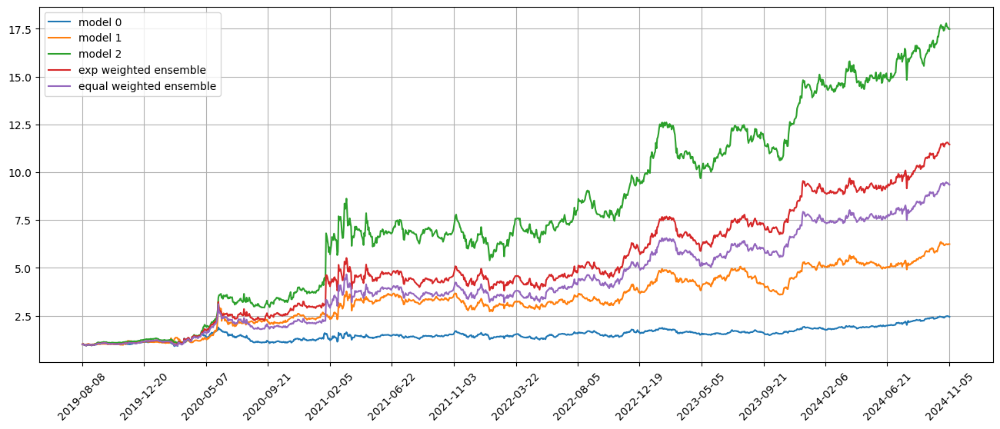

Standardization data are from 2023-04-03 to 2024-01-18
Training data are from 2024-01-19 to 2024-11-01
Testing data are from 2024-10-08 to 2024-12-02
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 67 out of 67 iterations
Restoring model weights from the end of the best epoch: 3.
Epoch 23: early stopping
Restoring model weights from the end of the best epoch: 3.
Epoch 23: early stopping
Restoring model weights from the end of the best epoch: 3.
Epoch 23: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 0.02677992172539234
11/11 [==============================] - 0s 3ms/step
Model 0 test loss 0.0332990437746048
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 0.026056228205561638
11/11 [==============================] - 0s 3ms/step
Model 1 test loss 0.032389815896749496
96/96 [==============================] - 0s 3ms/step
Model 2 training loss 0.025

position on 2024-11-08 market open will be {'WSM': 1.2758782976345127, 'FBND': 1.231142369512223, 'DHI': 1.2366231844563516, 'ECL': 1.2206664936436447, 'NNN': 1.2262393904283642, 'LEN': 1.247531209590566, 'PHG': 1.1844267174246605, 'ITB': 1.2334670127497214, 'BFAM': 1.2306017761552206, 'AMT': 1.2220009545463302}
Total asset on 2024-11-08 will be 12.308577406141485
It should be the same as 12.308577406141595
top_stocks by equal weighted ensemble to buy on 2024-11-07 are ['PHG', 'ECL', 'LEN', 'WSM', 'BFAM', 'AMT', 'FBND', 'ITB', 'DHI', 'NNN']
position on 2024-11-08 market open will be {'WSM': 1.041647759395238, 'FBND': 1.0051246212719198, 'DHI': 1.0095992475876083, 'ECL': 0.9965719461096895, 'NNN': 1.0011217495352251, 'LEN': 1.0185047364273727, 'PHG': 0.9669852043573793, 'ITB': 1.0070224977576496, 'BFAM': 1.0046832720773222, 'AMT': 0.9976614216590897}
Total asset on 2024-11-08 will be 10.048922456178323
It should be the same as 10.048922456178493
Testing data from 2024-10-11 to 2024-11-0

position on 2024-11-13 market open will be {'GDXJ': 1.2594401781774114, 'ERIE': 1.2398375447470948, 'AMH': 1.2598802716425357, 'MPWR': 1.194471417763361, 'BBVA': 1.2249158784094683, 'GOLD': 1.2585053407217373, 'ROIC': 1.2555791321634895, 'GDX': 1.2596990835840176, 'AMT': 1.2618657808879796, 'HII': 1.2342849750407872}
Total asset on 2024-11-13 will be 12.44847960313777
It should be the same as 12.448479603137882
top_stocks by equal weighted ensemble to buy on 2024-11-12 are ['AMT', 'ERIE', 'AMH', 'GOLD', 'HII', 'MPWR', 'GDXJ', 'ROIC', 'BBVA', 'GDX']
position on 2024-11-13 market open will be {'GDXJ': 1.0251121339783722, 'ERIE': 1.009156713676927, 'AMH': 1.0254703448398332, 'MPWR': 0.9722312859762411, 'BBVA': 0.9970113323504288, 'GOLD': 1.024351229859452, 'ROIC': 1.0219694637767214, 'GDX': 1.0253228681430142, 'AMT': 1.0270864355878482, 'HII': 1.0046372401208796}
Total asset on 2024-11-13 will be 10.13234904830954
It should be the same as 10.132349048309718
Testing data from 2024-10-16 to

Testing data from 2024-10-21 to 2024-11-15 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2024-11-18 are ['IRM', 'SUI', 'IBB', 'IYW', 'GDX', 'QQQ', 'GDXJ', 'XLK', 'AMZN', 'QLD']
position on 2024-11-19 market open will be {'GDXJ': 0.2791406357135988, 'GDX': 0.2766366128703844, 'QLD': 0.2567667364479032, 'AMZN': 0.25155405540814363, 'QQQ': 0.2572696622208166, 'IBB': 0.2548165437671953, 'XLK': 0.25684832694549165, 'IRM': 0.26060733559610233, 'IYW': 0.2573387735282958, 'SUI': 0.25827504416470265}
Total asset on 2024-11-19 will be 2.6092537266625735
It should be the same as 2.6092537266626348
top_stocks by model 1 to buy on 2024-11-18 are ['XLK', 'IBB', 'AGI', 'SOXL', 'NUGT', 'MPWR', 'JNUG', 'IRM', 'GDX', 'GDXJ']
position on 2024-11-19 market open will be {'GDXJ': 0.7063900289940126, 'GDX': 0.7000533780642829, 'AGI': 0.6788439657280466, 'NUGT': 0.6944576682760539, 'JNUG': 0.6957692387911387, 'MPWR': 0.6773449367159848, 'IBB': 0.6532958010866521, 'XLK': 0.6585048640441662

top_stocks by model 1 to buy on 2024-11-21 are ['XSD', 'GDX', 'FBT', 'ROST', 'NUGT', 'XLP', 'GDXJ', 'SOXL', 'MPWR', 'HMY']
position on 2024-11-22 market open will be {'MPWR': 0.6665449104210214, 'GDXJ': 0.7037801833628512, 'ROST': 0.7580753728249542, 'NUGT': 0.7080140677448302, 'HMY': 0.7139059543683669, 'XSD': 0.7078033299749095, 'GDX': 0.7031002644608509, 'SOXL': 0.7016710191085659, 'FBT': 0.7041169900574302, 'XLP': 0.7073739141568542}
Total asset on 2024-11-22 will be 7.074386006480538
It should be the same as 7.074386006480633
top_stocks by model 2 to buy on 2024-11-21 are ['ARKK', 'AEM', 'SAIC', 'GDXJ', 'WMS', 'CMG', 'GD', 'RACE', 'HII', 'KGC']
position on 2024-11-22 market open will be {'WMS': 1.905683667712131, 'KGC': 1.9463603385081232, 'GDXJ': 1.9468430114720436, 'GD': 1.927678736185966, 'ARKK': 1.8937460667842965, 'SAIC': 1.9471000544673067, 'CMG': 1.9737227923947147, 'RACE': 1.9544177021643017, 'AEM': 1.9395072260063495, 'HII': 1.968443482275822}
Total asset on 2024-11-22 wi

position on 2024-11-27 market open will be {'KGC': 1.9195405291066034, 'IRM': 2.028848912753105, 'TTEK': 1.9521158451861458, 'FLR': 1.9178926614656784, 'VST': 2.0445077683127657, 'SAIC': 1.9463925582115091, 'PAAS': 1.9683973493100775, 'KT': 2.070091217343586, 'BAH': 1.9480135333404667, 'CACI': 1.975978829664301}
Total asset on 2024-11-27 will be 19.77177920469401
It should be the same as 19.771779204694237
top_stocks by return weighted ensemble to buy on 2024-11-26 are ['PAAS', 'LAMR', 'TTEK', 'CACI', 'SAIC', 'KT', 'HRB', 'NUGT', 'HMY', 'NTAP']
position on 2024-11-27 market open will be {'TTEK': 1.2585808116591308, 'KT': 1.3435421794438498, 'CACI': 1.254196541238761, 'NUGT': 1.3252325083393344, 'HMY': 1.3009774656110455, 'LAMR': 1.2793031926917244, 'SAIC': 1.2706379066540354, 'NTAP': 1.2997318253601757, 'PAAS': 1.285003005605881, 'HRB': 1.2916458910847424}
Total asset on 2024-11-27 will be 12.908851327688572
It should be the same as 12.908851327688682
top_stocks by equal weighted ensem

top_stocks by model 2 to buy on 2024-12-02 are ['AKAM', 'SBS', 'LBTYA', 'CIG', 'NTAP', 'LBTYK', 'TDG', 'HRB', 'BAH', 'CACI']
position on 2024-12-03 market open will be {'BAH': 1.9485363320278635, 'CACI': 1.9166693622010869, 'TDG': 1.9711161185385062, 'LBTYA': 1.9750751997847178, 'SBS': 1.9717747352756831, 'LBTYK': 1.9884397459626681, 'NTAP': 1.9837939341118545, 'CIG': 1.9247962343942, 'AKAM': 1.9974219222452998, 'HRB': 1.9573682387376727}
Total asset on 2024-12-03 will be 19.63499182327933
It should be the same as 19.634991823279556
top_stocks by return weighted ensemble to buy on 2024-12-02 are ['SAIC', 'ANET', 'EPI', 'TDG', 'BAH', 'KT', 'SBS', 'HRB', 'CACI', 'CIG']
position on 2024-12-03 market open will be {'SAIC': 1.3046472657338797, 'EPI': 1.3039052532004691, 'TDG': 1.28295440180184, 'BAH': 1.2967587606418198, 'CACI': 1.283246688775184, 'SBS': 1.3021353607285973, 'ANET': 1.3046196129835832, 'CIG': 1.2711113466272876, 'KT': 1.2582583842880732, 'HRB': 1.2926214906952973}
Total asset

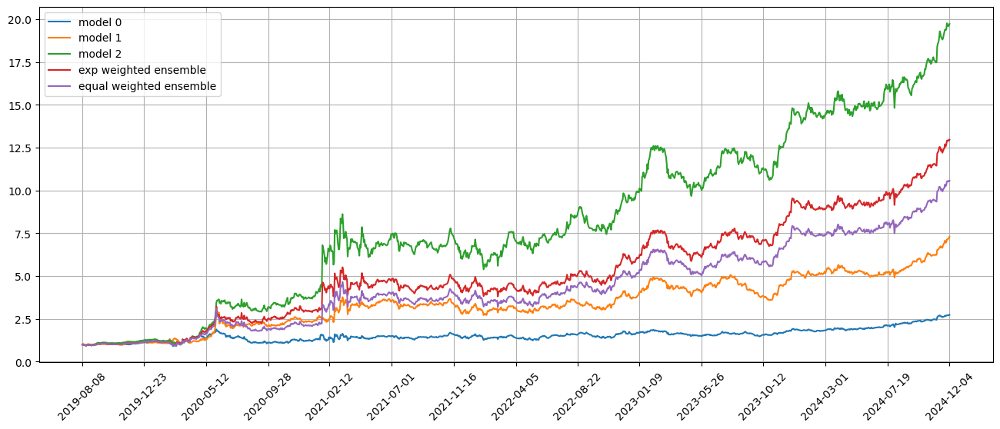

In [21]:
# Retrain all the rest
# %run C:\Projects\Stock_price_prediction\Experiments\CNN_Class.ipynb
print(f'Running {num_iters} iterations; first iteration already completed.')
first_run = False

for num_iter in range(1, num_iters):
    # Find train and test data
    ftd += seq_length
    ltd += seq_length
    data_train, x_train, y_train, data_test, x_test, y_test, ret_d_train, ret_d_test, sector_train, sector_test = prep_train_test_data(data, seq_length, ftd, ltd, all_days)
    print(f'Running iteration {num_iter+1} out of {num_iters} iterations')
    CNN_model.retrain_model(x_train, y_train, ret_d_train, sector_train) 
    CNN_model.evaluate_model(x_train, y_train, ret_d_train, sector_train, x_test, y_test, ret_d_test, sector_test, batch_size)

    if save:
        for i in range(model_params['num_models']):
            CNN_model.model_dict[i].save(f"models/model_{i}_{all_days[ftd]}_{all_days[ltd]}.keras")

    gc.collect()
    
    # Check how much the weights are trained
    print("Correlations between old and new weights")
    for i in range(num_of_models):
        new_weights[i] = CNN_model.model_dict[i].get_weights()
        print(np.corrcoef(old_weights[i][0][0], new_weights[i][0][0])[0, 1])
        x = old_weights[i][-1]
        y = new_weights[i][-1]
        print(np.corrcoef(x.reshape(40, ), y.reshape(40, ))[0, 1])
    old_weights = new_weights.copy()
    
    total_asset_dict, total_dict, position_dict_all, return_dict = simulate(ftd, ltd, total_dict, first_run, num_stocks, total_asset_dict, 
                                                                            position_dict_all, return_dict)

In [22]:
import json

with open('total_asset_dict.json', 'w') as f:
    json.dump(total_asset_dict, f)
    
# with open('total_asset_dict.json', 'r') as fr:
#     test = json.load(fr)

In [23]:
last_simul_day = "2024-12-03"
rfr = list(data[data['datadate'] <= last_simul_day][['datadate', 'TBill1y']].drop_duplicates(subset=['datadate'])['TBill1y'])
rfr = rfr[-(len(total_asset_dict[0])-1):]

def calculate_SR(total_asset, rfr):
    '''
    Calculates the Sharpe Ratio of the simulated strategy
    Inputs:
        total_asset: list of total assets on each day
        rfr: list of risk-free rates on the same days as in total_asset
    Output:
        SR: Sharpe Ratio
    '''
    
    daily_ret = [(total_asset[i] - total_asset[i-1]) / total_asset[i-1] for i in range(1, len(total_asset))]
    assert len(daily_ret) == len(rfr)
    excess_ret = [daily_ret[i] - rfr[i] for i in range(len(rfr))]
    SR = np.mean(excess_ret) / np.std(excess_ret) * np.sqrt(252)
    
    return SR
for key, item in total_asset_dict.items():
    SR = calculate_SR(item, rfr)
    print(f'SR for model {key} is {SR}')

SR for model 0 is 0.5904253236967992
SR for model 1 is 0.9711506172860712
SR for model 2 is 1.3159226697427946
SR for model ensemble_weighted is 1.1790685862092498
SR for model ensemble_equal is 1.0898858095491737
